## Figure 8. Comparing RDD for different network depths

Imports

In [1]:
%pylab inline
pylab.rcParams['figure.figsize'] = (10, 6)

#%matplotlib inline

import matplotlib
import numpy as np
import numpy.linalg as la
import matplotlib.pyplot as plt
import numpy.random as rand
import pandas as pd
import seaborn as sns

from lib.lif import LIF_Recurrent, ParamsLIF_Recurrent
from lib.causal import causaleffect_maxv, causaleffect_maxv_linear, causaleffect_maxv_sp

Populating the interactive namespace from numpy and matplotlib


In [2]:
#Angle between two vectors
def alignment(a,b):
    da = np.dot(a,a)
    db = np.dot(b,b)
    if da > 0 and db > 0:
        return 180/np.pi*np.arccos(np.dot(a,b)/np.sqrt(da*db))
    else:
        return 360.
    
def mse(pred,true):
    return np.mean((pred - true)**2)

In [26]:
#Test LIF_Recurrent network
nsims = 1

cvals = [0.0, 0.7]
pvals = np.logspace(-2, 0, 10)
#c = 0.9
n1 = 784
n2 = 1000
tau_s = 0.020
dt = 0.001
t = 100    #In seconds
sigma = 10
x = 0
#p = 0.1
DeltaT = 10

nC = len(cvals)
nP = len(pvals)

t_filter = np.linspace(0, 1, 2000)
exp_filter = np.exp(-t_filter/tau_s)
exp_filter = exp_filter/np.sum(exp_filter)
ds = exp_filter[0]

params = ParamsLIF_Recurrent(exp_filter, sigma = sigma, n1 = n1, n2 = n2)
lif = LIF_Recurrent(params, t = t)

## Test 2 hidden layer network

In [27]:
results = lif.simulate()
np.nonzero(results[3][0,:])[0].shape

(99984,)

In [41]:
results[2].shape


AttributeError: 'NoneType' object has no attribute 'shape'

In [28]:
len(results)

4

In [29]:
print('Firing rates:',np.sum(results[1], 1)/t)

('Firing rates:', array([  34.49,   34.46,   34.54, ...,  945.01,  942.78,  923.73]))


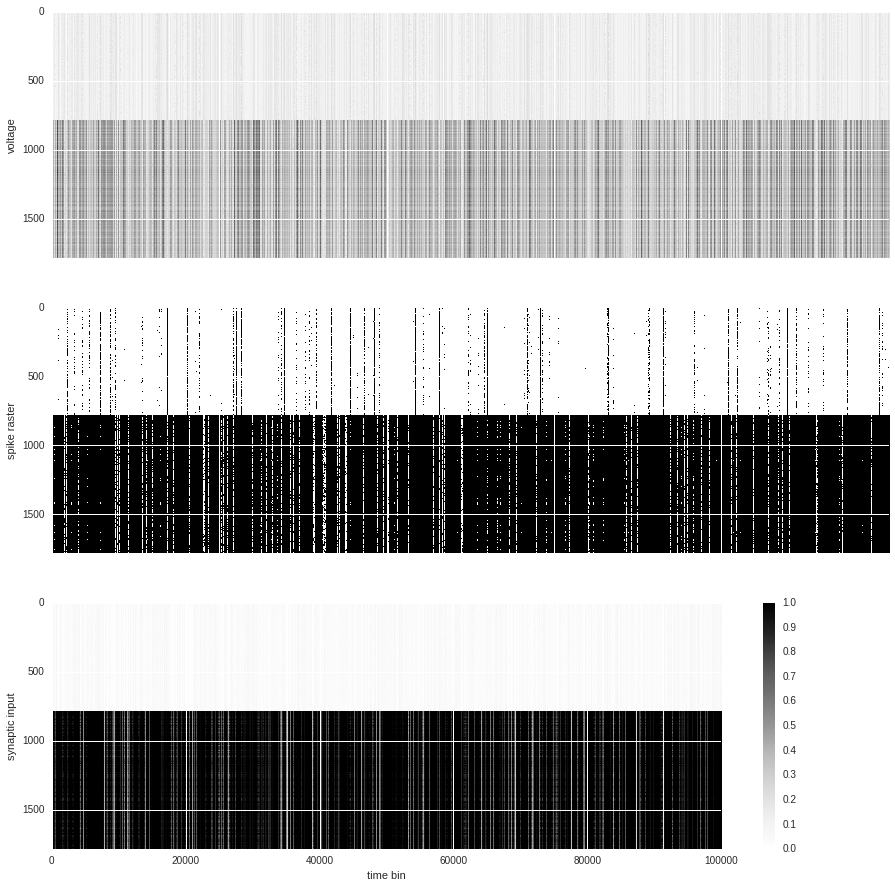

In [30]:
fig, axes = plt.subplots(3,1,figsize = (15, 15), sharex = True)
axes[0].imshow(results[0], aspect = 'auto', interpolation = 'nearest')
axes[1].imshow(results[1], aspect = 'auto', interpolation = 'nearest')
im2 = axes[2].imshow(results[3], aspect = 'auto', interpolation = 'nearest')
axes[0].set_ylabel('voltage')
axes[1].set_ylabel('spike raster')
axes[2].set_ylabel('synaptic input')
axes[2].set_xlabel('time bin')
plt.colorbar(im2, ax = axes[2])

## Causal effect estimation

In [31]:
U = np.eye(n2)
target = .02*np.ones((n2,1))
target[0] = 0
C_orig = lambda s: np.sum((np.dot(U, s) - target)**2,0)
nsims = 50
beta_rd_c = np.zeros((nC, nsims, nP, n1))
beta_rd_c_linear = np.zeros((nC, nsims, nP, n1))
beta_fd_c = np.zeros((nC, nsims, nP, n1))
beta_fd_c_linear = np.zeros((nC, nsims, nP, n1))

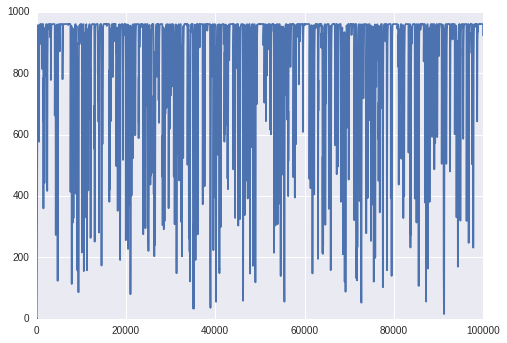

In [32]:
cost = C_orig(results[3][n1:,:])
plt.plot(cost)

In [33]:
cvals

[0.0, 0.7]

In [34]:
#Compute causal effects
for i,c in enumerate(cvals):
    print("Running %d simulations with c=%s"%(nsims, c))
    params.c = c
    lif.setup(params)
    for j in range(nsims):
        (v, h, u, sh) = lif.simulate(DeltaT)
        cost = C_orig(sh[n1:,:])
        for k,p in enumerate(pvals):
            #a = causaleffect_maxv(u[0:n1,:], cost, DeltaT, p, params)
            #print(a.shape)
            beta_rd_c[i,j,k,:] = causaleffect_maxv(u[0:n1,:], cost, DeltaT, p, params)
            beta_rd_c_linear[i,j,k,:] = causaleffect_maxv_linear(u[0:n1,:], cost, DeltaT, p, params)
        beta_fd_c[i,j,:] = causaleffect_maxv(u[0:n1,:], cost, DeltaT, 1, params)
        beta_fd_c_linear[i,j,:] = causaleffect_maxv_linear(u[0:n1,:], cost, DeltaT, 1, params)

Running 50 simulations with c=0.0
('Above', 61)
('Below', 60)
('Above', 67)
('Below', 57)
('Above', 73)
('Below', 72)
('Above', 80)
('Below', 53)
('Above', 52)
('Below', 77)
('Above', 71)
('Below', 70)
('Above', 66)
('Below', 57)
('Above', 66)
('Below', 70)
('Above', 54)
('Below', 61)
('Above', 68)
('Below', 76)
('Above', 73)
('Below', 67)
('Above', 62)
('Below', 68)
('Above', 75)
('Below', 68)
('Above', 70)
('Below', 66)
('Above', 56)
('Below', 78)
('Above', 69)
('Below', 58)
('Above', 78)
('Below', 70)
('Above', 60)
('Below', 61)
('Above', 77)
('Below', 79)
('Above', 50)
('Below', 79)
('Above', 77)
('Below', 76)
('Above', 71)
('Below', 66)
('Above', 78)
('Below', 73)
('Above', 74)
('Below', 60)
('Above', 55)
('Below', 82)
('Above', 84)
('Below', 73)
('Above', 85)
('Below', 80)
('Above', 53)
('Below', 71)
('Above', 73)
('Below', 71)
('Above', 63)
('Below', 73)
('Above', 67)
('Below', 60)
('Above', 68)
('Below', 61)
('Above', 63)
('Below', 65)
('Above', 71)
('Below', 70)
('Above', 58)


('Above', 58)
('Below', 66)
('Above', 74)
('Below', 55)
('Above', 64)
('Below', 60)
('Above', 76)
('Below', 82)
('Above', 61)
('Below', 56)
('Above', 66)
('Below', 59)
('Above', 61)
('Below', 58)
('Above', 63)
('Below', 55)
('Above', 60)
('Below', 74)
('Above', 63)
('Below', 66)
('Above', 64)
('Below', 76)
('Above', 66)
('Below', 79)
('Above', 55)
('Below', 57)
('Above', 56)
('Below', 63)
('Above', 60)
('Below', 65)
('Above', 73)
('Below', 62)
('Above', 66)
('Below', 64)
('Above', 61)
('Below', 66)
('Above', 79)
('Below', 67)
('Above', 54)
('Below', 69)
('Above', 76)
('Below', 71)
('Above', 45)
('Below', 82)
('Above', 59)
('Below', 76)
('Above', 63)
('Below', 57)
('Above', 65)
('Below', 61)
('Above', 69)
('Below', 72)
('Above', 66)
('Below', 59)
('Above', 77)
('Below', 58)
('Above', 78)
('Below', 59)
('Above', 73)
('Below', 79)
('Above', 62)
('Below', 74)
('Above', 60)
('Below', 59)
('Above', 70)
('Below', 71)
('Above', 74)
('Below', 64)
('Above', 62)
('Below', 63)
('Above', 79)
('Belo

('Above', 66)
('Below', 64)
('Above', 74)
('Below', 74)
('Above', 81)
('Below', 75)
('Above', 71)
('Below', 71)
('Above', 66)
('Below', 61)
('Above', 67)
('Below', 67)
('Above', 60)
('Below', 69)
('Above', 75)
('Below', 60)
('Above', 60)
('Below', 70)
('Above', 59)
('Below', 73)
('Above', 57)
('Below', 66)
('Above', 73)
('Below', 71)
('Above', 62)
('Below', 67)
('Above', 73)
('Below', 68)
('Above', 66)
('Below', 55)
('Above', 64)
('Below', 78)
('Above', 64)
('Below', 76)
('Above', 64)
('Below', 47)
('Above', 68)
('Below', 75)
('Above', 65)
('Below', 72)
('Above', 60)
('Below', 59)
('Above', 70)
('Below', 61)
('Above', 66)
('Below', 72)
('Above', 67)
('Below', 58)
('Above', 62)
('Below', 73)
('Above', 77)
('Below', 70)
('Above', 61)
('Below', 71)
('Above', 72)
('Below', 86)
('Above', 55)
('Below', 72)
('Above', 74)
('Below', 70)
('Above', 56)
('Below', 73)
('Above', 58)
('Below', 74)
('Above', 54)
('Below', 68)
('Above', 71)
('Below', 71)
('Above', 66)
('Below', 55)
('Above', 77)
('Belo

('Above', 115)
('Below', 123)
('Above', 128)
('Below', 103)
('Above', 102)
('Below', 109)
('Above', 112)
('Below', 112)
('Above', 96)
('Below', 106)
('Above', 109)
('Below', 126)
('Above', 106)
('Below', 100)
('Above', 127)
('Below', 111)
('Above', 108)
('Below', 104)
('Above', 105)
('Below', 111)
('Above', 125)
('Below', 108)
('Above', 106)
('Below', 104)
('Above', 116)
('Below', 123)
('Above', 99)
('Below', 103)
('Above', 103)
('Below', 107)
('Above', 107)
('Below', 92)
('Above', 93)
('Below', 103)
('Above', 101)
('Below', 124)
('Above', 100)
('Below', 118)
('Above', 106)
('Below', 128)
('Above', 104)
('Below', 128)
('Above', 91)
('Below', 106)
('Above', 107)
('Below', 108)
('Above', 101)
('Below', 117)
('Above', 105)
('Below', 99)
('Above', 120)
('Below', 112)
('Above', 110)
('Below', 106)
('Above', 123)
('Below', 116)
('Above', 98)
('Below', 106)
('Above', 122)
('Below', 115)
('Above', 93)
('Below', 128)
('Above', 105)
('Below', 105)
('Above', 97)
('Below', 93)
('Above', 104)
('Bel

('Below', 94)
('Above', 99)
('Below', 107)
('Above', 107)
('Below', 138)
('Above', 90)
('Below', 108)
('Above', 110)
('Below', 106)
('Above', 117)
('Below', 114)
('Above', 110)
('Below', 105)
('Above', 97)
('Below', 119)
('Above', 99)
('Below', 92)
('Above', 93)
('Below', 115)
('Above', 110)
('Below', 118)
('Above', 88)
('Below', 124)
('Above', 110)
('Below', 118)
('Above', 106)
('Below', 114)
('Above', 122)
('Below', 126)
('Above', 114)
('Below', 115)
('Above', 113)
('Below', 104)
('Above', 111)
('Below', 116)
('Above', 107)
('Below', 121)
('Above', 111)
('Below', 121)
('Above', 110)
('Below', 110)
('Above', 96)
('Below', 116)
('Above', 86)
('Below', 120)
('Above', 121)
('Below', 127)
('Above', 100)
('Below', 116)
('Above', 122)
('Below', 121)
('Above', 111)
('Below', 93)
('Above', 88)
('Below', 120)
('Above', 106)
('Below', 124)
('Above', 103)
('Below', 89)
('Above', 107)
('Below', 116)
('Above', 108)
('Below', 129)
('Above', 98)
('Below', 103)
('Above', 113)
('Below', 101)
('Above',

('Above', 202)
('Below', 183)
('Above', 187)
('Below', 181)
('Above', 188)
('Below', 174)
('Above', 181)
('Below', 192)
('Above', 191)
('Below', 213)
('Above', 186)
('Below', 182)
('Above', 200)
('Below', 191)
('Above', 166)
('Below', 189)
('Above', 182)
('Below', 197)
('Above', 165)
('Below', 184)
('Above', 200)
('Below', 174)
('Above', 165)
('Below', 174)
('Above', 172)
('Below', 181)
('Above', 187)
('Below', 182)
('Above', 189)
('Below', 183)
('Above', 179)
('Below', 201)
('Above', 182)
('Below', 186)
('Above', 166)
('Below', 214)
('Above', 161)
('Below', 171)
('Above', 160)
('Below', 166)
('Above', 161)
('Below', 184)
('Above', 199)
('Below', 188)
('Above', 177)
('Below', 168)
('Above', 179)
('Below', 174)
('Above', 175)
('Below', 173)
('Above', 178)
('Below', 161)
('Above', 191)
('Below', 203)
('Above', 174)
('Below', 169)
('Above', 191)
('Below', 181)
('Above', 176)
('Below', 176)
('Above', 182)
('Below', 192)
('Above', 196)
('Below', 168)
('Above', 160)
('Below', 188)
('Above', 

('Below', 183)
('Above', 187)
('Below', 190)
('Above', 193)
('Below', 197)
('Above', 177)
('Below', 191)
('Above', 183)
('Below', 191)
('Above', 166)
('Below', 166)
('Above', 163)
('Below', 193)
('Above', 182)
('Below', 185)
('Above', 183)
('Below', 179)
('Above', 194)
('Below', 198)
('Above', 165)
('Below', 198)
('Above', 175)
('Below', 189)
('Above', 173)
('Below', 167)
('Above', 165)
('Below', 195)
('Above', 184)
('Below', 213)
('Above', 158)
('Below', 193)
('Above', 173)
('Below', 184)
('Above', 177)
('Below', 184)
('Above', 179)
('Below', 178)
('Above', 158)
('Below', 199)
('Above', 165)
('Below', 171)
('Above', 160)
('Below', 177)
('Above', 184)
('Below', 190)
('Above', 152)
('Below', 211)
('Above', 183)
('Below', 210)
('Above', 181)
('Below', 184)
('Above', 191)
('Below', 197)
('Above', 176)
('Below', 206)
('Above', 194)
('Below', 168)
('Above', 179)
('Below', 191)
('Above', 176)
('Below', 193)
('Above', 178)
('Below', 206)
('Above', 181)
('Below', 177)
('Above', 156)
('Below', 

('Above', 280)
('Below', 324)
('Above', 256)
('Below', 302)
('Above', 297)
('Below', 303)
('Above', 298)
('Below', 357)
('Above', 284)
('Below', 319)
('Above', 285)
('Below', 314)
('Above', 298)
('Below', 326)
('Above', 308)
('Below', 282)
('Above', 290)
('Below', 317)
('Above', 285)
('Below', 288)
('Above', 269)
('Below', 293)
('Above', 286)
('Below', 323)
('Above', 269)
('Below', 354)
('Above', 271)
('Below', 315)
('Above', 287)
('Below', 338)
('Above', 275)
('Below', 309)
('Above', 274)
('Below', 313)
('Above', 299)
('Below', 322)
('Above', 295)
('Below', 330)
('Above', 311)
('Below', 292)
('Above', 279)
('Below', 323)
('Above', 272)
('Below', 348)
('Above', 301)
('Below', 340)
('Above', 296)
('Below', 296)
('Above', 330)
('Below', 316)
('Above', 315)
('Below', 351)
('Above', 272)
('Below', 330)
('Above', 272)
('Below', 297)
('Above', 312)
('Below', 306)
('Above', 268)
('Below', 337)
('Above', 313)
('Below', 287)
('Above', 282)
('Below', 286)
('Above', 314)
('Below', 307)
('Above', 

('Above', 277)
('Below', 291)
('Above', 288)
('Below', 307)
('Above', 289)
('Below', 322)
('Above', 312)
('Below', 301)
('Above', 237)
('Below', 301)
('Above', 289)
('Below', 325)
('Above', 270)
('Below', 323)
('Above', 302)
('Below', 305)
('Above', 306)
('Below', 317)
('Above', 308)
('Below', 304)
('Above', 294)
('Below', 324)
('Above', 270)
('Below', 293)
('Above', 276)
('Below', 316)
('Above', 286)
('Below', 328)
('Above', 289)
('Below', 310)
('Above', 329)
('Below', 332)
('Above', 288)
('Below', 331)
('Above', 304)
('Below', 289)
('Above', 284)
('Below', 323)
('Above', 308)
('Below', 293)
('Above', 297)
('Below', 303)
('Above', 264)
('Below', 322)
('Above', 295)
('Below', 345)
('Above', 321)
('Below', 300)
('Above', 298)
('Below', 321)
('Above', 283)
('Below', 316)
('Above', 312)
('Below', 315)
('Above', 284)
('Below', 311)
('Above', 277)
('Below', 309)
('Above', 280)
('Below', 312)
('Above', 306)
('Below', 303)
('Above', 271)
('Below', 315)
('Above', 307)
('Below', 313)
('Above', 

('Above', 476)
('Below', 531)
('Above', 497)
('Below', 548)
('Above', 481)
('Below', 546)
('Above', 506)
('Below', 538)
('Above', 500)
('Below', 535)
('Above', 500)
('Below', 596)
('Above', 517)
('Below', 553)
('Above', 545)
('Below', 519)
('Above', 465)
('Below', 522)
('Above', 481)
('Below', 489)
('Above', 466)
('Below', 532)
('Above', 452)
('Below', 507)
('Above', 508)
('Below', 554)
('Above', 468)
('Below', 574)
('Above', 451)
('Below', 546)
('Above', 491)
('Below', 544)
('Above', 490)
('Below', 535)
('Above', 480)
('Below', 478)
('Above', 453)
('Below', 550)
('Above', 491)
('Below', 546)
('Above', 471)
('Below', 507)
('Above', 470)
('Below', 517)
('Above', 475)
('Below', 559)
('Above', 457)
('Below', 500)
('Above', 482)
('Below', 585)
('Above', 487)
('Below', 520)
('Above', 465)
('Below', 540)
('Above', 471)
('Below', 544)
('Above', 498)
('Below', 542)
('Above', 481)
('Below', 505)
('Above', 451)
('Below', 553)
('Above', 455)
('Below', 580)
('Above', 452)
('Below', 574)
('Above', 

('Above', 481)
('Below', 506)
('Above', 471)
('Below', 558)
('Above', 453)
('Below', 505)
('Above', 468)
('Below', 522)
('Above', 465)
('Below', 502)
('Above', 500)
('Below', 554)
('Above', 459)
('Below', 552)
('Above', 518)
('Below', 559)
('Above', 465)
('Below', 583)
('Above', 457)
('Below', 522)
('Above', 494)
('Below', 538)
('Above', 451)
('Below', 526)
('Above', 483)
('Below', 551)
('Above', 478)
('Below', 481)
('Above', 486)
('Below', 529)
('Above', 493)
('Below', 507)
('Above', 476)
('Below', 524)
('Above', 484)
('Below', 547)
('Above', 447)
('Below', 541)
('Above', 518)
('Below', 574)
('Above', 461)
('Below', 547)
('Above', 478)
('Below', 542)
('Above', 504)
('Below', 525)
('Above', 494)
('Below', 519)
('Above', 467)
('Below', 560)
('Above', 503)
('Below', 489)
('Above', 494)
('Below', 567)
('Above', 492)
('Below', 563)
('Above', 438)
('Below', 512)
('Above', 469)
('Below', 525)
('Above', 473)
('Below', 544)
('Above', 496)
('Below', 529)
('Above', 443)
('Below', 517)
('Above', 

('Below', 930)
('Above', 795)
('Below', 883)
('Above', 814)
('Below', 902)
('Above', 770)
('Below', 917)
('Above', 796)
('Below', 956)
('Above', 775)
('Below', 878)
('Above', 840)
('Below', 908)
('Above', 745)
('Below', 884)
('Above', 777)
('Below', 921)
('Above', 788)
('Below', 912)
('Above', 803)
('Below', 938)
('Above', 805)
('Below', 917)
('Above', 772)
('Below', 970)
('Above', 766)
('Below', 950)
('Above', 759)
('Below', 914)
('Above', 759)
('Below', 897)
('Above', 769)
('Below', 968)
('Above', 815)
('Below', 900)
('Above', 764)
('Below', 869)
('Above', 760)
('Below', 904)
('Above', 776)
('Below', 943)
('Above', 779)
('Below', 900)
('Above', 809)
('Below', 956)
('Above', 799)
('Below', 928)
('Above', 770)
('Below', 924)
('Above', 750)
('Below', 944)
('Above', 790)
('Below', 939)
('Above', 784)
('Below', 901)
('Above', 728)
('Below', 965)
('Above', 775)
('Below', 916)
('Above', 723)
('Below', 931)
('Above', 796)
('Below', 900)
('Above', 744)
('Below', 893)
('Above', 826)
('Below', 

('Above', 749)
('Below', 938)
('Above', 757)
('Below', 873)
('Above', 801)
('Below', 913)
('Above', 796)
('Below', 893)
('Above', 760)
('Below', 960)
('Above', 768)
('Below', 911)
('Above', 818)
('Below', 904)
('Above', 778)
('Below', 922)
('Above', 779)
('Below', 950)
('Above', 718)
('Below', 930)
('Above', 757)
('Below', 931)
('Above', 808)
('Below', 923)
('Above', 749)
('Below', 944)
('Above', 787)
('Below', 936)
('Above', 762)
('Below', 903)
('Above', 758)
('Below', 896)
('Above', 764)
('Below', 977)
('Above', 775)
('Below', 894)
('Above', 757)
('Below', 948)
('Above', 805)
('Below', 939)
('Above', 781)
('Below', 871)
('Above', 802)
('Below', 913)
('Above', 791)
('Below', 887)
('Above', 778)
('Below', 924)
('Above', 782)
('Below', 885)
('Above', 788)
('Below', 895)
('Above', 819)
('Below', 940)
('Above', 750)
('Below', 936)
('Above', 775)
('Below', 923)
('Above', 772)
('Below', 898)
('Above', 830)
('Below', 924)
('Above', 789)
('Below', 928)
('Above', 768)
('Below', 909)
('Above', 

('Above', 1226)
('Below', 1572)
('Above', 1159)
('Below', 1625)
('Above', 1265)
('Below', 1632)
('Above', 1280)
('Below', 1630)
('Above', 1166)
('Below', 1643)
('Above', 1237)
('Below', 1591)
('Above', 1277)
('Below', 1605)
('Above', 1257)
('Below', 1567)
('Above', 1238)
('Below', 1646)
('Above', 1258)
('Below', 1577)
('Above', 1245)
('Below', 1692)
('Above', 1187)
('Below', 1649)
('Above', 1261)
('Below', 1656)
('Above', 1239)
('Below', 1595)
('Above', 1213)
('Below', 1596)
('Above', 1185)
('Below', 1642)
('Above', 1183)
('Below', 1574)
('Above', 1201)
('Below', 1556)
('Above', 1178)
('Below', 1666)
('Above', 1230)
('Below', 1626)
('Above', 1203)
('Below', 1579)
('Above', 1189)
('Below', 1627)
('Above', 1197)
('Below', 1586)
('Above', 1167)
('Below', 1646)
('Above', 1202)
('Below', 1590)
('Above', 1188)
('Below', 1613)
('Above', 1168)
('Below', 1581)
('Above', 1219)
('Below', 1639)
('Above', 1204)
('Below', 1629)
('Above', 1221)
('Below', 1636)
('Above', 1209)
('Below', 1616)
('Above'

('Above', 1248)
('Below', 1671)
('Above', 1210)
('Below', 1629)
('Above', 1225)
('Below', 1570)
('Above', 1255)
('Below', 1599)
('Above', 1216)
('Below', 1595)
('Above', 1198)
('Below', 1582)
('Above', 1218)
('Below', 1622)
('Above', 1166)
('Below', 1616)
('Above', 1233)
('Below', 1543)
('Above', 1247)
('Below', 1614)
('Above', 1156)
('Below', 1612)
('Above', 1182)
('Below', 1537)
('Above', 1201)
('Below', 1601)
('Above', 1197)
('Below', 1633)
('Above', 1189)
('Below', 1598)
('Above', 1206)
('Below', 1613)
('Above', 1187)
('Below', 1661)
('Above', 1258)
('Below', 1611)
('Above', 1208)
('Below', 1672)
('Above', 1262)
('Below', 1622)
('Above', 1176)
('Below', 1735)
('Above', 1203)
('Below', 1594)
('Above', 1183)
('Below', 1576)
('Above', 1156)
('Below', 1628)
('Above', 1263)
('Below', 1590)
('Above', 1198)
('Below', 1565)
('Above', 1231)
('Below', 1600)
('Above', 1246)
('Below', 1577)
('Above', 1185)
('Below', 1602)
('Above', 1198)
('Below', 1621)
('Above', 1166)
('Below', 1585)
('Above'

('Above', 1816)
('Below', 2790)
('Above', 1819)
('Below', 2898)
('Above', 1835)
('Below', 2922)
('Above', 1787)
('Below', 2852)
('Above', 1768)
('Below', 2976)
('Above', 1801)
('Below', 2914)
('Above', 1863)
('Below', 2800)
('Above', 1768)
('Below', 2836)
('Above', 1801)
('Below', 2876)
('Above', 1819)
('Below', 2869)
('Above', 1805)
('Below', 2868)
('Above', 1758)
('Below', 2847)
('Above', 1822)
('Below', 2834)
('Above', 1746)
('Below', 2862)
('Above', 1825)
('Below', 2866)
('Above', 1784)
('Below', 2902)
('Above', 1841)
('Below', 2885)
('Above', 1801)
('Below', 2900)
('Above', 1808)
('Below', 2861)
('Above', 1854)
('Below', 2866)
('Above', 1816)
('Below', 2883)
('Above', 1877)
('Below', 2854)
('Above', 1774)
('Below', 2857)
('Above', 1776)
('Below', 2879)
('Above', 1799)
('Below', 2918)
('Above', 1807)
('Below', 2867)
('Above', 1810)
('Below', 2839)
('Above', 1738)
('Below', 2941)
('Above', 1811)
('Below', 2949)
('Above', 1894)
('Below', 2871)
('Above', 1846)
('Below', 2897)
('Above'

('Below', 2833)
('Above', 1831)
('Below', 2896)
('Above', 1790)
('Below', 2910)
('Above', 1818)
('Below', 2841)
('Above', 1873)
('Below', 2798)
('Above', 1800)
('Below', 2800)
('Above', 1811)
('Below', 2943)
('Above', 1786)
('Below', 2932)
('Above', 1836)
('Below', 2876)
('Above', 1851)
('Below', 2860)
('Above', 1850)
('Below', 2945)
('Above', 1814)
('Below', 2824)
('Above', 1797)
('Below', 2909)
('Above', 1815)
('Below', 2845)
('Above', 1773)
('Below', 2880)
('Above', 1767)
('Below', 2883)
('Above', 1851)
('Below', 2833)
('Above', 1849)
('Below', 2787)
('Above', 1820)
('Below', 2880)
('Above', 1832)
('Below', 2934)
('Above', 1843)
('Below', 2895)
('Above', 1896)
('Below', 2795)
('Above', 1768)
('Below', 2860)
('Above', 1882)
('Below', 2758)
('Above', 1793)
('Below', 2895)
('Above', 1848)
('Below', 2891)
('Above', 1818)
('Below', 2941)
('Above', 1794)
('Below', 2950)
('Above', 1810)
('Below', 2953)
('Above', 1790)
('Below', 2933)
('Above', 1770)
('Below', 2884)
('Above', 1794)
('Below'

('Above', 1801)
('Below', 2851)
('Above', 1852)
('Below', 2863)
('Above', 1771)
('Below', 2888)
('Above', 1770)
('Below', 2972)
('Above', 1860)
('Below', 2964)
('Above', 1831)
('Below', 2873)
('Above', 1871)
('Below', 2866)
('Above', 1811)
('Below', 2801)
('Above', 1809)
('Below', 2840)
('Above', 1893)
('Below', 2802)
('Above', 1803)
('Below', 2860)
('Above', 1801)
('Below', 2930)
('Above', 1848)
('Below', 2850)
('Above', 1868)
('Below', 2866)
('Above', 1816)
('Below', 2863)
('Above', 1811)
('Below', 2892)
('Above', 1833)
('Below', 2916)
('Above', 1855)
('Below', 2838)
('Above', 1847)
('Below', 2891)
('Above', 1783)
('Below', 2856)
('Above', 1837)
('Below', 2840)
('Above', 1897)
('Below', 2784)
('Above', 1858)
('Below', 2935)
('Above', 1779)
('Below', 2949)
('Above', 1790)
('Below', 2823)
('Above', 1802)
('Below', 2921)
('Above', 1862)
('Below', 2884)
('Above', 1814)
('Below', 2947)
('Above', 1849)
('Below', 2795)
('Above', 1797)
('Below', 2905)
('Above', 1790)
('Below', 2914)
('Above'

('Above', 2492)
('Below', 5138)
('Above', 2508)
('Below', 5055)
('Above', 2579)
('Below', 4983)
('Above', 2512)
('Below', 5030)
('Above', 2525)
('Below', 5025)
('Above', 2479)
('Below', 5101)
('Above', 2548)
('Below', 5018)
('Above', 2480)
('Below', 5163)
('Above', 2505)
('Below', 5075)
('Above', 2537)
('Below', 5017)
('Above', 2530)
('Below', 5068)
('Above', 2470)
('Below', 5139)
('Above', 2484)
('Below', 5063)
('Above', 2545)
('Below', 4992)
('Above', 2501)
('Below', 5067)
('Above', 2507)
('Below', 5161)
('Above', 2500)
('Below', 5150)
('Above', 2562)
('Below', 5053)
('Above', 2531)
('Below', 4998)
('Above', 2503)
('Below', 5014)
('Above', 2543)
('Below', 5061)
('Above', 2534)
('Below', 5114)
('Above', 2507)
('Below', 5035)
('Above', 2461)
('Below', 5148)
('Above', 2498)
('Below', 5167)
('Above', 2562)
('Below', 4994)
('Above', 2558)
('Below', 5014)
('Above', 2550)
('Below', 5079)
('Above', 2537)
('Below', 5102)
('Above', 2508)
('Below', 5117)
('Above', 2572)
('Below', 4984)
('Above'

('Below', 5086)
('Above', 2522)
('Below', 5076)
('Above', 2446)
('Below', 5049)
('Above', 2510)
('Below', 5196)
('Above', 2531)
('Below', 5050)
('Above', 2501)
('Below', 5073)
('Above', 2478)
('Below', 5062)
('Above', 2562)
('Below', 5116)
('Above', 2480)
('Below', 5076)
('Above', 2525)
('Below', 5036)
('Above', 2555)
('Below', 5029)
('Above', 2537)
('Below', 5090)
('Above', 2506)
('Below', 5059)
('Above', 2565)
('Below', 5061)
('Above', 2483)
('Below', 5056)
('Above', 2546)
('Below', 5092)
('Above', 2491)
('Below', 5119)
('Above', 2542)
('Below', 5023)
('Above', 2493)
('Below', 5084)
('Above', 2463)
('Below', 5115)
('Above', 2505)
('Below', 5097)
('Above', 2534)
('Below', 4990)
('Above', 2587)
('Below', 5024)
('Above', 2526)
('Below', 5062)
('Above', 2539)
('Below', 5095)
('Above', 2580)
('Below', 4984)
('Above', 2563)
('Below', 5004)
('Above', 2442)
('Below', 5112)
('Above', 2542)
('Below', 5084)
('Above', 2583)
('Below', 5048)
('Above', 2550)
('Below', 5079)
('Above', 2476)
('Below'

('Above', 3130)
('Below', 6577)
('Above', 3072)
('Below', 6651)
('Above', 3108)
('Below', 6611)
('Above', 3178)
('Below', 6544)
('Above', 3084)
('Below', 6608)
('Above', 3163)
('Below', 6553)
('Above', 3064)
('Below', 6635)
('Above', 3151)
('Below', 6549)
('Above', 3019)
('Below', 6702)
('Above', 3114)
('Below', 6583)
('Above', 3117)
('Below', 6611)
('Above', 3122)
('Below', 6594)
('Above', 3065)
('Below', 6622)
('Above', 3024)
('Below', 6695)
('Above', 3141)
('Below', 6559)
('Above', 3113)
('Below', 6615)
('Above', 3076)
('Below', 6595)
('Above', 3117)
('Below', 6589)
('Above', 3189)
('Below', 6506)
('Above', 3187)
('Below', 6542)
('Above', 3116)
('Below', 6567)
('Above', 3120)
('Below', 6581)
('Above', 3109)
('Below', 6616)
('Above', 3104)
('Below', 6588)
('Above', 3089)
('Below', 6639)
('Above', 3119)
('Below', 6603)
('Above', 3168)
('Below', 6554)
('Above', 3122)
('Below', 6564)
('Above', 3120)
('Below', 6621)
('Above', 3171)
('Below', 6541)
('Above', 3119)
('Below', 6606)
('Above'

('Above', 3093)
('Below', 6606)
('Above', 3090)
('Below', 6651)
('Above', 3099)
('Below', 6608)
('Above', 3088)
('Below', 6582)
('Above', 2958)
('Below', 6763)
('Above', 3098)
('Below', 6623)
('Above', 3161)
('Below', 6573)
('Above', 3065)
('Below', 6640)
('Above', 3106)
('Below', 6591)
('Above', 3127)
('Below', 6606)
('Above', 3100)
('Below', 6603)
('Above', 3098)
('Below', 6607)
('Above', 3091)
('Below', 6635)
('Above', 3122)
('Below', 6574)
('Above', 3113)
('Below', 6601)
('Above', 3030)
('Below', 6687)
('Above', 3150)
('Below', 6584)
('Above', 3142)
('Below', 6563)
('Above', 3101)
('Below', 6603)
('Above', 3105)
('Below', 6582)
('Above', 3142)
('Below', 6542)
('Above', 3142)
('Below', 6554)
('Above', 3098)
('Below', 6610)
('Above', 3063)
('Below', 6639)
('Above', 3051)
('Below', 6605)
('Above', 3123)
('Below', 6597)
('Above', 3118)
('Below', 6608)
('Above', 3023)
('Below', 6678)
('Above', 3061)
('Below', 6649)
('Above', 3145)
('Below', 6525)
('Above', 3099)
('Below', 6623)
('Above'

('Above', 3117)
('Below', 6611)
('Above', 3122)
('Below', 6594)
('Above', 3065)
('Below', 6622)
('Above', 3024)
('Below', 6695)
('Above', 3141)
('Below', 6559)
('Above', 3113)
('Below', 6615)
('Above', 3076)
('Below', 6595)
('Above', 3117)
('Below', 6589)
('Above', 3189)
('Below', 6506)
('Above', 3187)
('Below', 6542)
('Above', 3116)
('Below', 6567)
('Above', 3120)
('Below', 6581)
('Above', 3109)
('Below', 6616)
('Above', 3104)
('Below', 6588)
('Above', 3089)
('Below', 6639)
('Above', 3119)
('Below', 6603)
('Above', 3168)
('Below', 6554)
('Above', 3122)
('Below', 6564)
('Above', 3120)
('Below', 6621)
('Above', 3171)
('Below', 6541)
('Above', 3119)
('Below', 6606)
('Above', 3156)
('Below', 6542)
('Above', 3018)
('Below', 6692)
('Above', 3193)
('Below', 6523)
('Above', 3117)
('Below', 6570)
('Above', 3137)
('Below', 6582)
('Above', 3093)
('Below', 6629)
('Above', 3094)
('Below', 6627)
('Above', 3102)
('Below', 6632)
('Above', 3067)
('Below', 6618)
('Above', 3061)
('Below', 6658)
('Above'

('Above', 3121)
('Below', 6577)
('Above', 3086)
('Below', 6616)
('Above', 3049)
('Below', 6643)
('Above', 3116)
('Below', 6602)
('Above', 3139)
('Below', 6545)
('Above', 3194)
('Below', 6515)
('Above', 3113)
('Below', 6632)
('Above', 3104)
('Below', 6603)
('Above', 3173)
('Below', 6524)
('Above', 3175)
('Below', 6544)
('Above', 3041)
('Below', 6653)
('Above', 3115)
('Below', 6573)
('Above', 3119)
('Below', 6600)
('Above', 3116)
('Below', 6599)
('Above', 3082)
('Below', 6615)
('Above', 3071)
('Below', 6646)
('Above', 3172)
('Below', 6538)
('Above', 3129)
('Below', 6575)
('Above', 3049)
('Below', 6616)
('Above', 3155)
('Below', 6526)
('Above', 3236)
('Below', 6476)
('Above', 3116)
('Below', 6580)
('Above', 3039)
('Below', 6672)
('Above', 3032)
('Below', 6666)
('Above', 3052)
('Below', 6670)
('Above', 3198)
('Below', 6520)
('Above', 3097)
('Below', 6610)
('Above', 3179)
('Below', 6531)
('Above', 2999)
('Below', 6701)
('Above', 3064)
('Below', 6641)
('Above', 3132)
('Below', 6568)
('Above'

('Above', 67)
('Below', 62)
('Above', 54)
('Below', 75)
('Above', 54)
('Below', 60)
('Above', 62)
('Below', 79)
('Above', 66)
('Below', 60)
('Above', 74)
('Below', 69)
('Above', 63)
('Below', 67)
('Above', 76)
('Below', 66)
('Above', 75)
('Below', 62)
('Above', 58)
('Below', 62)
('Above', 70)
('Below', 63)
('Above', 64)
('Below', 75)
('Above', 64)
('Below', 68)
('Above', 65)
('Below', 71)
('Above', 69)
('Below', 56)
('Above', 61)
('Below', 61)
('Above', 68)
('Below', 47)
('Above', 74)
('Below', 58)
('Above', 68)
('Below', 70)
('Above', 69)
('Below', 65)
('Above', 75)
('Below', 64)
('Above', 56)
('Below', 58)
('Above', 67)
('Below', 68)
('Above', 70)
('Below', 76)
('Above', 52)
('Below', 72)
('Above', 57)
('Below', 75)
('Above', 65)
('Below', 65)
('Above', 57)
('Below', 80)
('Above', 74)
('Below', 69)
('Above', 73)
('Below', 68)
('Above', 68)
('Below', 57)
('Above', 62)
('Below', 67)
('Above', 72)
('Below', 66)
('Above', 77)
('Below', 63)
('Above', 62)
('Below', 61)
('Above', 55)
('Belo

('Above', 46)
('Below', 70)
('Above', 66)
('Below', 79)
('Above', 56)
('Below', 62)
('Above', 72)
('Below', 74)
('Above', 71)
('Below', 57)
('Above', 65)
('Below', 69)
('Above', 51)
('Below', 72)
('Above', 65)
('Below', 54)
('Above', 73)
('Below', 61)
('Above', 70)
('Below', 73)
('Above', 61)
('Below', 59)
('Above', 49)
('Below', 64)
('Above', 58)
('Below', 74)
('Above', 60)
('Below', 64)
('Above', 65)
('Below', 73)
('Above', 72)
('Below', 60)
('Above', 58)
('Below', 67)
('Above', 63)
('Below', 72)
('Above', 49)
('Below', 62)
('Above', 72)
('Below', 66)
('Above', 51)
('Below', 81)
('Above', 68)
('Below', 63)
('Above', 60)
('Below', 73)
('Above', 71)
('Below', 58)
('Above', 72)
('Below', 56)
('Above', 70)
('Below', 73)
('Above', 63)
('Below', 66)
('Above', 55)
('Below', 59)
('Above', 65)
('Below', 70)
('Above', 59)
('Below', 60)
('Above', 72)
('Below', 70)
('Above', 62)
('Below', 71)
('Above', 73)
('Below', 64)
('Above', 55)
('Below', 58)
('Above', 72)
('Below', 67)
('Above', 71)
('Belo

('Above', 114)
('Below', 122)
('Above', 102)
('Below', 122)
('Above', 111)
('Below', 124)
('Above', 103)
('Below', 127)
('Above', 105)
('Below', 91)
('Above', 105)
('Below', 120)
('Above', 106)
('Below', 112)
('Above', 109)
('Below', 124)
('Above', 111)
('Below', 105)
('Above', 130)
('Below', 101)
('Above', 104)
('Below', 111)
('Above', 108)
('Below', 114)
('Above', 125)
('Below', 107)
('Above', 100)
('Below', 114)
('Above', 114)
('Below', 106)
('Above', 110)
('Below', 116)
('Above', 96)
('Below', 115)
('Above', 103)
('Below', 122)
('Above', 131)
('Below', 101)
('Above', 104)
('Below', 99)
('Above', 117)
('Below', 93)
('Above', 122)
('Below', 106)
('Above', 108)
('Below', 130)
('Above', 111)
('Below', 117)
('Above', 121)
('Below', 99)
('Above', 95)
('Below', 102)
('Above', 113)
('Below', 118)
('Above', 97)
('Below', 114)
('Above', 92)
('Below', 109)
('Above', 106)
('Below', 131)
('Above', 103)
('Below', 95)
('Above', 94)
('Below', 127)
('Above', 113)
('Below', 108)
('Above', 118)
('Bel

('Below', 123)
('Above', 105)
('Below', 126)
('Above', 116)
('Below', 117)
('Above', 104)
('Below', 110)
('Above', 130)
('Below', 99)
('Above', 123)
('Below', 119)
('Above', 98)
('Below', 117)
('Above', 108)
('Below', 108)
('Above', 117)
('Below', 114)
('Above', 105)
('Below', 105)
('Above', 97)
('Below', 115)
('Above', 91)
('Below', 103)
('Above', 95)
('Below', 121)
('Above', 109)
('Below', 100)
('Above', 107)
('Below', 107)
('Above', 108)
('Below', 95)
('Above', 103)
('Below', 124)
('Above', 112)
('Below', 125)
('Above', 95)
('Below', 105)
('Above', 119)
('Below', 112)
('Above', 100)
('Below', 129)
('Above', 114)
('Below', 104)
('Above', 105)
('Below', 112)
('Above', 123)
('Below', 110)
('Above', 117)
('Below', 96)
('Above', 116)
('Below', 114)
('Above', 110)
('Below', 115)
('Above', 97)
('Below', 104)
('Above', 97)
('Below', 119)
('Above', 107)
('Below', 107)
('Above', 121)
('Below', 110)
('Above', 94)
('Below', 113)
('Above', 112)
('Below', 110)
('Above', 103)
('Below', 96)
('Above

('Above', 169)
('Below', 208)
('Above', 173)
('Below', 171)
('Above', 170)
('Below', 210)
('Above', 174)
('Below', 178)
('Above', 171)
('Below', 207)
('Above', 191)
('Below', 174)
('Above', 191)
('Below', 195)
('Above', 171)
('Below', 184)
('Above', 176)
('Below', 180)
('Above', 198)
('Below', 175)
('Above', 176)
('Below', 208)
('Above', 180)
('Below', 179)
('Above', 181)
('Below', 182)
('Above', 171)
('Below', 200)
('Above', 167)
('Below', 189)
('Above', 200)
('Below', 174)
('Above', 172)
('Below', 166)
('Above', 194)
('Below', 163)
('Above', 187)
('Below', 176)
('Above', 194)
('Below', 208)
('Above', 193)
('Below', 181)
('Above', 193)
('Below', 168)
('Above', 155)
('Below', 183)
('Above', 180)
('Below', 194)
('Above', 164)
('Below', 200)
('Above', 169)
('Below', 191)
('Above', 176)
('Below', 194)
('Above', 163)
('Below', 171)
('Above', 162)
('Below', 220)
('Above', 179)
('Below', 186)
('Above', 179)
('Below', 191)
('Above', 187)
('Below', 171)
('Above', 159)
('Below', 192)
('Above', 

('Above', 150)
('Below', 193)
('Above', 181)
('Below', 205)
('Above', 187)
('Below', 198)
('Above', 166)
('Below', 204)
('Above', 198)
('Below', 163)
('Above', 222)
('Below', 194)
('Above', 142)
('Below', 184)
('Above', 173)
('Below', 172)
('Above', 184)
('Below', 175)
('Above', 177)
('Below', 181)
('Above', 169)
('Below', 187)
('Above', 166)
('Below', 171)
('Above', 171)
('Below', 207)
('Above', 182)
('Below', 180)
('Above', 185)
('Below', 183)
('Above', 176)
('Below', 163)
('Above', 168)
('Below', 174)
('Above', 200)
('Below', 196)
('Above', 172)
('Below', 171)
('Above', 190)
('Below', 199)
('Above', 181)
('Below', 203)
('Above', 177)
('Below', 177)
('Above', 180)
('Below', 192)
('Above', 194)
('Below', 176)
('Above', 190)
('Below', 163)
('Above', 195)
('Below', 183)
('Above', 204)
('Below', 186)
('Above', 170)
('Below', 167)
('Above', 168)
('Below', 201)
('Above', 181)
('Below', 190)
('Above', 185)
('Below', 180)
('Above', 179)
('Below', 191)
('Above', 175)
('Below', 195)
('Above', 

('Above', 279)
('Below', 311)
('Above', 289)
('Below', 310)
('Above', 329)
('Below', 301)
('Above', 316)
('Below', 323)
('Above', 281)
('Below', 301)
('Above', 288)
('Below', 316)
('Above', 289)
('Below', 289)
('Above', 293)
('Below', 310)
('Above', 283)
('Below', 293)
('Above', 292)
('Below', 311)
('Above', 287)
('Below', 324)
('Above', 291)
('Below', 277)
('Above', 312)
('Below', 332)
('Above', 298)
('Below', 322)
('Above', 298)
('Below', 297)
('Above', 284)
('Below', 319)
('Above', 298)
('Below', 326)
('Above', 291)
('Below', 321)
('Above', 285)
('Below', 304)
('Above', 294)
('Below', 302)
('Above', 303)
('Below', 340)
('Above', 272)
('Below', 347)
('Above', 300)
('Below', 330)
('Above', 314)
('Below', 332)
('Above', 269)
('Below', 324)
('Above', 277)
('Below', 310)
('Above', 287)
('Below', 369)
('Above', 278)
('Below', 307)
('Above', 301)
('Below', 325)
('Above', 303)
('Below', 335)
('Above', 253)
('Below', 296)
('Above', 312)
('Below', 314)
('Above', 307)
('Below', 330)
('Above', 

('Above', 277)
('Below', 361)
('Above', 268)
('Below', 317)
('Above', 276)
('Below', 316)
('Above', 286)
('Below', 330)
('Above', 293)
('Below', 333)
('Above', 297)
('Below', 307)
('Above', 319)
('Below', 281)
('Above', 285)
('Below', 309)
('Above', 279)
('Below', 307)
('Above', 293)
('Below', 275)
('Above', 269)
('Below', 300)
('Above', 269)
('Below', 301)
('Above', 303)
('Below', 357)
('Above', 309)
('Below', 328)
('Above', 291)
('Below', 327)
('Above', 271)
('Below', 322)
('Above', 306)
('Below', 301)
('Above', 301)
('Below', 338)
('Above', 301)
('Below', 314)
('Above', 289)
('Below', 322)
('Above', 296)
('Below', 340)
('Above', 288)
('Below', 306)
('Above', 263)
('Below', 319)
('Above', 291)
('Below', 306)
('Above', 270)
('Below', 346)
('Above', 299)
('Below', 297)
('Above', 313)
('Below', 322)
('Above', 266)
('Below', 330)
('Above', 276)
('Below', 296)
('Above', 285)
('Below', 348)
('Above', 317)
('Below', 321)
('Above', 281)
('Below', 331)
('Above', 301)
('Below', 307)
('Above', 

('Above', 525)
('Below', 511)
('Above', 475)
('Below', 567)
('Above', 469)
('Below', 524)
('Above', 469)
('Below', 528)
('Above', 447)
('Below', 550)
('Above', 477)
('Below', 541)
('Above', 529)
('Below', 531)
('Above', 473)
('Below', 510)
('Above', 504)
('Below', 501)
('Above', 451)
('Below', 538)
('Above', 471)
('Below', 548)
('Above', 517)
('Below', 517)
('Above', 497)
('Below', 502)
('Above', 455)
('Below', 527)
('Above', 482)
('Below', 537)
('Above', 452)
('Below', 542)
('Above', 479)
('Below', 553)
('Above', 483)
('Below', 529)
('Above', 472)
('Below', 503)
('Above', 471)
('Below', 571)
('Above', 494)
('Below', 537)
('Above', 493)
('Below', 531)
('Above', 498)
('Below', 539)
('Above', 447)
('Below', 522)
('Above', 505)
('Below', 531)
('Above', 458)
('Below', 529)
('Above', 525)
('Below', 496)
('Above', 454)
('Below', 526)
('Above', 466)
('Below', 560)
('Above', 494)
('Below', 513)
('Above', 512)
('Below', 515)
('Above', 493)
('Below', 544)
('Above', 486)
('Below', 567)
('Above', 

('Above', 432)
('Below', 559)
('Above', 478)
('Below', 523)
('Above', 463)
('Below', 563)
('Above', 481)
('Below', 565)
('Above', 463)
('Below', 562)
('Above', 505)
('Below', 527)
('Above', 481)
('Below', 507)
('Above', 509)
('Below', 578)
('Above', 426)
('Below', 495)
('Above', 507)
('Below', 540)
('Above', 490)
('Below', 554)
('Above', 499)
('Below', 538)
('Above', 488)
('Below', 532)
('Above', 504)
('Below', 530)
('Above', 470)
('Below', 551)
('Above', 458)
('Below', 545)
('Above', 466)
('Below', 521)
('Above', 480)
('Below', 557)
('Above', 486)
('Below', 506)
('Above', 450)
('Below', 559)
('Above', 483)
('Below', 546)
('Above', 464)
('Below', 538)
('Above', 462)
('Below', 507)
('Above', 516)
('Below', 547)
('Above', 463)
('Below', 558)
('Above', 493)
('Below', 560)
('Above', 522)
('Below', 539)
('Above', 495)
('Below', 532)
('Above', 487)
('Below', 512)
('Above', 484)
('Below', 543)
('Above', 497)
('Below', 547)
('Above', 447)
('Below', 557)
('Above', 441)
('Below', 536)
('Above', 

('Above', 745)
('Below', 895)
('Above', 772)
('Below', 914)
('Above', 830)
('Below', 857)
('Above', 737)
('Below', 947)
('Above', 756)
('Below', 937)
('Above', 767)
('Below', 884)
('Above', 752)
('Below', 961)
('Above', 767)
('Below', 921)
('Above', 802)
('Below', 921)
('Above', 743)
('Below', 831)
('Above', 805)
('Below', 881)
('Above', 751)
('Below', 904)
('Above', 762)
('Below', 922)
('Above', 792)
('Below', 897)
('Above', 777)
('Below', 890)
('Above', 771)
('Below', 923)
('Above', 797)
('Below', 901)
('Above', 746)
('Below', 980)
('Above', 796)
('Below', 971)
('Above', 797)
('Below', 928)
('Above', 768)
('Below', 872)
('Above', 769)
('Below', 962)
('Above', 767)
('Below', 928)
('Above', 781)
('Below', 951)
('Above', 790)
('Below', 960)
('Above', 741)
('Below', 900)
('Above', 805)
('Below', 907)
('Above', 737)
('Below', 934)
('Above', 817)
('Below', 884)
('Above', 741)
('Below', 922)
('Above', 762)
('Below', 925)
('Above', 781)
('Below', 953)
('Above', 800)
('Below', 934)
('Above', 

('Below', 924)
('Above', 770)
('Below', 901)
('Above', 813)
('Below', 952)
('Above', 747)
('Below', 937)
('Above', 765)
('Below', 934)
('Above', 808)
('Below', 929)
('Above', 782)
('Below', 934)
('Above', 773)
('Below', 896)
('Above', 797)
('Below', 928)
('Above', 797)
('Below', 929)
('Above', 772)
('Below', 953)
('Above', 767)
('Below', 917)
('Above', 797)
('Below', 866)
('Above', 813)
('Below', 920)
('Above', 712)
('Below', 926)
('Above', 780)
('Below', 928)
('Above', 758)
('Below', 921)
('Above', 794)
('Below', 945)
('Above', 787)
('Below', 908)
('Above', 764)
('Below', 926)
('Above', 790)
('Below', 961)
('Above', 742)
('Below', 877)
('Above', 815)
('Below', 942)
('Above', 746)
('Below', 898)
('Above', 743)
('Below', 961)
('Above', 775)
('Below', 954)
('Above', 768)
('Below', 886)
('Above', 778)
('Below', 968)
('Above', 772)
('Below', 934)
('Above', 782)
('Below', 926)
('Above', 807)
('Below', 898)
('Above', 799)
('Below', 941)
('Above', 826)
('Below', 867)
('Above', 771)
('Below', 

('Below', 1653)
('Above', 1223)
('Below', 1590)
('Above', 1289)
('Below', 1618)
('Above', 1178)
('Below', 1589)
('Above', 1192)
('Below', 1591)
('Above', 1208)
('Below', 1710)
('Above', 1150)
('Below', 1582)
('Above', 1233)
('Below', 1609)
('Above', 1166)
('Below', 1613)
('Above', 1188)
('Below', 1620)
('Above', 1204)
('Below', 1640)
('Above', 1259)
('Below', 1638)
('Above', 1258)
('Below', 1625)
('Above', 1259)
('Below', 1661)
('Above', 1188)
('Below', 1612)
('Above', 1258)
('Below', 1614)
('Above', 1256)
('Below', 1631)
('Above', 1254)
('Below', 1645)
('Above', 1193)
('Below', 1611)
('Above', 1144)
('Below', 1625)
('Above', 1224)
('Below', 1588)
('Above', 1191)
('Below', 1571)
('Above', 1254)
('Below', 1584)
('Above', 1216)
('Below', 1630)
('Above', 1198)
('Below', 1618)
('Above', 1200)
('Below', 1663)
('Above', 1217)
('Below', 1644)
('Above', 1226)
('Below', 1693)
('Above', 1226)
('Below', 1610)
('Above', 1209)
('Below', 1627)
('Above', 1195)
('Below', 1559)
('Above', 1224)
('Below'

('Above', 1184)
('Below', 1634)
('Above', 1240)
('Below', 1581)
('Above', 1149)
('Below', 1604)
('Above', 1279)
('Below', 1665)
('Above', 1178)
('Below', 1630)
('Above', 1258)
('Below', 1597)
('Above', 1181)
('Below', 1617)
('Above', 1273)
('Below', 1528)
('Above', 1254)
('Below', 1690)
('Above', 1220)
('Below', 1573)
('Above', 1196)
('Below', 1714)
('Above', 1213)
('Below', 1621)
('Above', 1185)
('Below', 1600)
('Above', 1244)
('Below', 1588)
('Above', 1238)
('Below', 1603)
('Above', 1226)
('Below', 1647)
('Above', 1229)
('Below', 1631)
('Above', 1186)
('Below', 1572)
('Above', 1226)
('Below', 1595)
('Above', 1220)
('Below', 1626)
('Above', 1209)
('Below', 1641)
('Above', 1170)
('Below', 1686)
('Above', 1184)
('Below', 1646)
('Above', 1214)
('Below', 1612)
('Above', 1230)
('Below', 1632)
('Above', 1214)
('Below', 1653)
('Above', 1209)
('Below', 1633)
('Above', 1161)
('Below', 1657)
('Above', 1188)
('Below', 1606)
('Above', 1141)
('Below', 1585)
('Above', 1219)
('Below', 1599)
('Above'

('Above', 1741)
('Below', 2947)
('Above', 1830)
('Below', 2912)
('Above', 1845)
('Below', 2870)
('Above', 1817)
('Below', 2861)
('Above', 1813)
('Below', 2930)
('Above', 1806)
('Below', 2874)
('Above', 1851)
('Below', 2883)
('Above', 1783)
('Below', 2949)
('Above', 1785)
('Below', 2878)
('Above', 1813)
('Below', 2910)
('Above', 1809)
('Below', 2823)
('Above', 1736)
('Below', 3009)
('Above', 1800)
('Below', 2891)
('Above', 1750)
('Below', 2895)
('Above', 1801)
('Below', 2882)
('Above', 1788)
('Below', 2851)
('Above', 1826)
('Below', 2881)
('Above', 1836)
('Below', 2857)
('Above', 1743)
('Below', 2940)
('Above', 1799)
('Below', 2923)
('Above', 1798)
('Below', 2916)
('Above', 1771)
('Below', 2965)
('Above', 1797)
('Below', 2867)
('Above', 1881)
('Below', 2818)
('Above', 1860)
('Below', 2837)
('Above', 1843)
('Below', 2867)
('Above', 1793)
('Below', 2920)
('Above', 1803)
('Below', 2881)
('Above', 1855)
('Below', 2901)
('Above', 1834)
('Below', 2895)
('Above', 1802)
('Below', 2879)
('Above'

('Above', 1850)
('Below', 2870)
('Above', 1828)
('Below', 2946)
('Above', 1808)
('Below', 2899)
('Above', 1811)
('Below', 2917)
('Above', 1871)
('Below', 2832)
('Above', 1833)
('Below', 2890)
('Above', 1833)
('Below', 2848)
('Above', 1781)
('Below', 2895)
('Above', 1813)
('Below', 2897)
('Above', 1766)
('Below', 2854)
('Above', 1804)
('Below', 2895)
('Above', 1812)
('Below', 2855)
('Above', 1808)
('Below', 2898)
('Above', 1835)
('Below', 2864)
('Above', 1768)
('Below', 2788)
('Above', 1874)
('Below', 2891)
('Above', 1756)
('Below', 2811)
('Above', 1774)
('Below', 2895)
('Above', 1774)
('Below', 2901)
('Above', 1833)
('Below', 2908)
('Above', 1882)
('Below', 2826)
('Above', 1812)
('Below', 2871)
('Above', 1786)
('Below', 2888)
('Above', 1805)
('Below', 2846)
('Above', 1837)
('Below', 2865)
('Above', 1777)
('Below', 2876)
('Above', 1846)
('Below', 2839)
('Above', 1783)
('Below', 2922)
('Above', 1811)
('Below', 2860)
('Above', 1761)
('Below', 2869)
('Above', 1806)
('Below', 2951)
('Above'

('Above', 2542)
('Below', 4982)
('Above', 2503)
('Below', 5014)
('Above', 2436)
('Below', 5111)
('Above', 2508)
('Below', 5075)
('Above', 2578)
('Below', 5072)
('Above', 2499)
('Below', 5084)
('Above', 2517)
('Below', 5097)
('Above', 2557)
('Below', 5060)
('Above', 2486)
('Below', 5002)
('Above', 2537)
('Below', 5060)
('Above', 2530)
('Below', 5030)
('Above', 2473)
('Below', 5125)
('Above', 2517)
('Below', 5127)
('Above', 2632)
('Below', 5083)
('Above', 2480)
('Below', 5007)
('Above', 2491)
('Below', 5127)
('Above', 2502)
('Below', 5132)
('Above', 2455)
('Below', 5128)
('Above', 2549)
('Below', 5004)
('Above', 2540)
('Below', 4983)
('Above', 2496)
('Below', 5063)
('Above', 2543)
('Below', 5063)
('Above', 2507)
('Below', 5080)
('Above', 2515)
('Below', 5014)
('Above', 2569)
('Below', 5062)
('Above', 2482)
('Below', 5079)
('Above', 2559)
('Below', 5071)
('Above', 2491)
('Below', 5056)
('Above', 2566)
('Below', 5088)
('Above', 2525)
('Below', 5060)
('Above', 2530)
('Below', 5092)
('Above'

('Above', 2531)
('Below', 5054)
('Above', 2541)
('Below', 5037)
('Above', 2486)
('Below', 5092)
('Above', 2541)
('Below', 5012)
('Above', 2506)
('Below', 5080)
('Above', 2519)
('Below', 5096)
('Above', 2453)
('Below', 5128)
('Above', 2535)
('Below', 5093)
('Above', 2534)
('Below', 5097)
('Above', 2499)
('Below', 5068)
('Above', 2600)
('Below', 5007)
('Above', 2521)
('Below', 5040)
('Above', 2555)
('Below', 5058)
('Above', 2528)
('Below', 5083)
('Above', 2491)
('Below', 5046)
('Above', 2498)
('Below', 5108)
('Above', 2572)
('Below', 5004)
('Above', 2493)
('Below', 5163)
('Above', 2576)
('Below', 5092)
('Above', 2584)
('Below', 5040)
('Above', 2469)
('Below', 5127)
('Above', 2551)
('Below', 5010)
('Above', 2531)
('Below', 4996)
('Above', 2444)
('Below', 5067)
('Above', 2534)
('Below', 5058)
('Above', 2451)
('Below', 5177)
('Above', 2574)
('Below', 5068)
('Above', 2524)
('Below', 5068)
('Above', 2572)
('Below', 4997)
('Above', 2482)
('Below', 5063)
('Above', 2671)
('Below', 4973)
('Above'

('Below', 6572)
('Above', 3144)
('Below', 6552)
('Above', 3089)
('Below', 6611)
('Above', 3082)
('Below', 6600)
('Above', 3092)
('Below', 6613)
('Above', 3111)
('Below', 6617)
('Above', 3085)
('Below', 6604)
('Above', 3109)
('Below', 6603)
('Above', 3116)
('Below', 6584)
('Above', 3113)
('Below', 6622)
('Above', 3160)
('Below', 6550)
('Above', 3071)
('Below', 6639)
('Above', 3158)
('Below', 6550)
('Above', 3169)
('Below', 6547)
('Above', 3168)
('Below', 6535)
('Above', 3160)
('Below', 6555)
('Above', 3139)
('Below', 6598)
('Above', 3116)
('Below', 6581)
('Above', 3097)
('Below', 6603)
('Above', 3109)
('Below', 6578)
('Above', 3052)
('Below', 6647)
('Above', 3194)
('Below', 6476)
('Above', 3102)
('Below', 6597)
('Above', 3168)
('Below', 6560)
('Above', 3113)
('Below', 6592)
('Above', 3198)
('Below', 6507)
('Above', 3088)
('Below', 6636)
('Above', 3087)
('Below', 6589)
('Above', 3121)
('Below', 6578)
('Above', 3172)
('Below', 6528)
('Above', 3084)
('Below', 6617)
('Above', 3084)
('Below'

('Above', 3062)
('Below', 6662)
('Above', 3099)
('Below', 6574)
('Above', 3167)
('Below', 6540)
('Above', 3030)
('Below', 6660)
('Above', 3141)
('Below', 6551)
('Above', 3009)
('Below', 6677)
('Above', 3114)
('Below', 6589)
('Above', 3170)
('Below', 6575)
('Above', 3140)
('Below', 6584)
('Above', 3118)
('Below', 6576)
('Above', 3218)
('Below', 6468)
('Above', 3058)
('Below', 6644)
('Above', 3113)
('Below', 6593)
('Above', 3064)
('Below', 6644)
('Above', 3146)
('Below', 6550)
('Above', 3091)
('Below', 6650)
('Above', 3160)
('Below', 6536)
('Above', 3186)
('Below', 6535)
('Above', 3110)
('Below', 6593)
('Above', 3082)
('Below', 6614)
('Above', 3081)
('Below', 6621)
('Above', 3061)
('Below', 6643)
('Above', 3106)
('Below', 6593)
('Above', 3091)
('Below', 6615)
('Above', 3058)
('Below', 6659)
('Above', 3115)
('Below', 6597)
('Above', 3136)
('Below', 6585)
('Above', 3109)
('Below', 6600)
('Above', 3108)
('Below', 6590)
('Above', 3071)
('Below', 6625)
('Above', 3060)
('Below', 6660)
('Above'

('Above', 3118)
('Below', 6610)
('Above', 3093)
('Below', 6602)
('Above', 3098)
('Below', 6637)
('Above', 3162)
('Below', 6548)
('Above', 3004)
('Below', 6672)
('Above', 3103)
('Below', 6612)
('Above', 3058)
('Below', 6653)
('Above', 3101)
('Below', 6595)
('Above', 3061)
('Below', 6659)
('Above', 3147)
('Below', 6559)
('Above', 3107)
('Below', 6630)
('Above', 3164)
('Below', 6564)
('Above', 3113)
('Below', 6596)
('Above', 3071)
('Below', 6652)
('Above', 3181)
('Below', 6549)
('Above', 3171)
('Below', 6549)
('Above', 2965)
('Below', 6744)
('Above', 3135)
('Below', 6577)
('Above', 3199)
('Below', 6508)
('Above', 3048)
('Below', 6632)
('Above', 3108)
('Below', 6633)
('Above', 3141)
('Below', 6596)
('Above', 3117)
('Below', 6582)
('Above', 3098)
('Below', 6647)
('Above', 3169)
('Below', 6531)
('Above', 3145)
('Below', 6534)
('Above', 3085)
('Below', 6617)
('Above', 3049)
('Below', 6678)
('Above', 3097)
('Below', 6611)
('Above', 3113)
('Below', 6572)
('Above', 3144)
('Below', 6552)
('Above'

('Above', 3101)
('Below', 6593)
('Above', 3101)
('Below', 6586)
('Above', 3133)
('Below', 6573)
('Above', 3238)
('Below', 6503)
('Above', 3137)
('Below', 6559)
('Above', 3072)
('Below', 6655)
('Above', 3096)
('Below', 6617)
('Above', 3125)
('Below', 6578)
('Above', 3090)
('Below', 6631)
('Above', 3152)
('Below', 6541)
('Above', 3073)
('Below', 6623)
('Above', 3105)
('Below', 6592)
('Above', 3053)
('Below', 6656)
('Above', 3113)
('Below', 6620)
('Above', 3121)
('Below', 6581)
('Above', 3090)
('Below', 6639)
('Above', 3199)
('Below', 6533)
('Above', 3144)
('Below', 6548)
('Above', 3153)
('Below', 6515)
('Above', 3093)
('Below', 6632)
('Above', 3094)
('Below', 6648)
('Above', 3098)
('Below', 6623)
('Above', 3148)
('Below', 6538)
('Above', 3064)
('Below', 6651)
('Above', 3163)
('Below', 6553)
('Above', 3167)
('Below', 6533)
('Above', 3062)
('Below', 6662)
('Above', 3099)
('Below', 6574)
('Above', 3167)
('Below', 6540)
('Above', 3030)
('Below', 6660)
('Above', 3141)
('Below', 6551)
('Above'

('Below', 67)
('Above', 56)
('Below', 54)
('Above', 73)
('Below', 55)
('Above', 67)
('Below', 70)
('Above', 58)
('Below', 78)
('Above', 63)
('Below', 60)
('Above', 67)
('Below', 64)
('Above', 66)
('Below', 64)
('Above', 60)
('Below', 88)
('Above', 68)
('Below', 66)
('Above', 60)
('Below', 81)
('Above', 74)
('Below', 75)
('Above', 66)
('Below', 75)
('Above', 74)
('Below', 72)
('Above', 68)
('Below', 62)
('Above', 73)
('Below', 72)
('Above', 60)
('Below', 78)
('Above', 56)
('Below', 75)
('Above', 69)
('Below', 61)
('Above', 65)
('Below', 66)
('Above', 56)
('Below', 84)
('Above', 84)
('Below', 65)
('Above', 57)
('Below', 64)
('Above', 58)
('Below', 83)
('Above', 74)
('Below', 80)
('Above', 67)
('Below', 89)
('Above', 75)
('Below', 66)
('Above', 59)
('Below', 62)
('Above', 62)
('Below', 68)
('Above', 73)
('Below', 59)
('Above', 56)
('Below', 73)
('Above', 62)
('Below', 68)
('Above', 76)
('Below', 66)
('Above', 67)
('Below', 72)
('Above', 65)
('Below', 81)
('Above', 70)
('Below', 56)
('Abov

('Below', 78)
('Above', 73)
('Below', 81)
('Above', 78)
('Below', 64)
('Above', 62)
('Below', 74)
('Above', 47)
('Below', 68)
('Above', 62)
('Below', 64)
('Above', 50)
('Below', 70)
('Above', 56)
('Below', 71)
('Above', 71)
('Below', 73)
('Above', 49)
('Below', 69)
('Above', 67)
('Below', 78)
('Above', 67)
('Below', 58)
('Above', 81)
('Below', 77)
('Above', 62)
('Below', 56)
('Above', 71)
('Below', 74)
('Above', 64)
('Below', 52)
('Above', 70)
('Below', 68)
('Above', 62)
('Below', 58)
('Above', 63)
('Below', 50)
('Above', 58)
('Below', 83)
('Above', 82)
('Below', 64)
('Above', 73)
('Below', 64)
('Above', 82)
('Below', 57)
('Above', 65)
('Below', 54)
('Above', 73)
('Below', 72)
('Above', 50)
('Below', 65)
('Above', 70)
('Below', 64)
('Above', 72)
('Below', 50)
('Above', 62)
('Below', 67)
('Above', 76)
('Below', 77)
('Above', 61)
('Below', 58)
('Above', 59)
('Below', 62)
('Above', 71)
('Below', 83)
('Above', 68)
('Below', 66)
('Above', 73)
('Below', 67)
('Above', 59)
('Below', 74)
('Abov

('Below', 126)
('Above', 111)
('Below', 89)
('Above', 106)
('Below', 106)
('Above', 103)
('Below', 114)
('Above', 101)
('Below', 100)
('Above', 93)
('Below', 103)
('Above', 104)
('Below', 101)
('Above', 129)
('Below', 127)
('Above', 121)
('Below', 105)
('Above', 118)
('Below', 106)
('Above', 109)
('Below', 111)
('Above', 90)
('Below', 108)
('Above', 113)
('Below', 111)
('Above', 109)
('Below', 103)
('Above', 112)
('Below', 98)
('Above', 109)
('Below', 98)
('Above', 102)
('Below', 133)
('Above', 108)
('Below', 96)
('Above', 111)
('Below', 113)
('Above', 117)
('Below', 109)
('Above', 102)
('Below', 124)
('Above', 112)
('Below', 99)
('Above', 100)
('Below', 118)
('Above', 121)
('Below', 126)
('Above', 124)
('Below', 114)
('Above', 118)
('Below', 111)
('Above', 112)
('Below', 109)
('Above', 113)
('Below', 122)
('Above', 100)
('Below', 124)
('Above', 86)
('Below', 125)
('Above', 104)
('Below', 105)
('Above', 99)
('Below', 100)
('Above', 99)
('Below', 134)
('Above', 129)
('Below', 110)
('Abo

('Below', 106)
('Above', 122)
('Below', 112)
('Above', 107)
('Below', 116)
('Above', 121)
('Below', 112)
('Above', 113)
('Below', 105)
('Above', 122)
('Below', 87)
('Above', 99)
('Below', 109)
('Above', 110)
('Below', 111)
('Above', 102)
('Below', 114)
('Above', 100)
('Below', 107)
('Above', 111)
('Below', 121)
('Above', 104)
('Below', 117)
('Above', 94)
('Below', 104)
('Above', 104)
('Below', 122)
('Above', 117)
('Below', 124)
('Above', 125)
('Below', 109)
('Above', 107)
('Below', 115)
('Above', 90)
('Below', 114)
('Above', 100)
('Below', 114)
('Above', 94)
('Below', 121)
('Above', 93)
('Below', 123)
('Above', 128)
('Below', 111)
('Above', 84)
('Below', 117)
('Above', 100)
('Below', 125)
('Above', 109)
('Below', 92)
('Above', 125)
('Below', 132)
('Above', 106)
('Below', 102)
('Above', 110)
('Below', 110)
('Above', 95)
('Below', 100)
('Above', 115)
('Below', 113)
('Above', 97)
('Below', 104)
('Above', 101)
('Below', 92)
('Above', 101)
('Below', 115)
('Above', 133)
('Below', 109)
('Abov

('Above', 186)
('Below', 193)
('Above', 206)
('Below', 189)
('Above', 182)
('Below', 181)
('Above', 165)
('Below', 212)
('Above', 184)
('Below', 201)
('Above', 182)
('Below', 187)
('Above', 185)
('Below', 191)
('Above', 196)
('Below', 165)
('Above', 169)
('Below', 187)
('Above', 178)
('Below', 173)
('Above', 192)
('Below', 186)
('Above', 181)
('Below', 180)
('Above', 184)
('Below', 165)
('Above', 170)
('Below', 168)
('Above', 160)
('Below', 185)
('Above', 183)
('Below', 187)
('Above', 165)
('Below', 167)
('Above', 170)
('Below', 170)
('Above', 148)
('Below', 187)
('Above', 177)
('Below', 186)
('Above', 181)
('Below', 192)
('Above', 194)
('Below', 202)
('Above', 186)
('Below', 174)
('Above', 175)
('Below', 196)
('Above', 183)
('Below', 200)
('Above', 205)
('Below', 183)
('Above', 180)
('Below', 167)
('Above', 170)
('Below', 170)
('Above', 196)
('Below', 190)
('Above', 160)
('Below', 181)
('Above', 171)
('Below', 186)
('Above', 166)
('Below', 194)
('Above', 173)
('Below', 206)
('Above', 

('Above', 186)
('Below', 179)
('Above', 198)
('Below', 180)
('Above', 169)
('Below', 207)
('Above', 187)
('Below', 172)
('Above', 166)
('Below', 181)
('Above', 185)
('Below', 175)
('Above', 181)
('Below', 196)
('Above', 189)
('Below', 180)
('Above', 175)
('Below', 177)
('Above', 175)
('Below', 216)
('Above', 169)
('Below', 195)
('Above', 162)
('Below', 196)
('Above', 182)
('Below', 187)
('Above', 176)
('Below', 185)
('Above', 182)
('Below', 173)
('Above', 173)
('Below', 171)
('Above', 179)
('Below', 196)
('Above', 174)
('Below', 192)
('Above', 196)
('Below', 200)
('Above', 187)
('Below', 182)
('Above', 181)
('Below', 174)
('Above', 174)
('Below', 188)
('Above', 181)
('Below', 178)
('Above', 180)
('Below', 189)
('Above', 200)
('Below', 187)
('Above', 179)
('Below', 177)
('Above', 182)
('Below', 172)
('Above', 186)
('Below', 185)
('Above', 168)
('Below', 170)
('Above', 167)
('Below', 176)
('Above', 189)
('Below', 191)
('Above', 161)
('Below', 193)
('Above', 184)
('Below', 179)
('Above', 

('Above', 291)
('Below', 315)
('Above', 307)
('Below', 315)
('Above', 312)
('Below', 294)
('Above', 302)
('Below', 281)
('Above', 297)
('Below', 293)
('Above', 267)
('Below', 366)
('Above', 309)
('Below', 311)
('Above', 278)
('Below', 283)
('Above', 308)
('Below', 314)
('Above', 304)
('Below', 286)
('Above', 281)
('Below', 283)
('Above', 294)
('Below', 300)
('Above', 291)
('Below', 298)
('Above', 318)
('Below', 366)
('Above', 299)
('Below', 289)
('Above', 292)
('Below', 307)
('Above', 292)
('Below', 332)
('Above', 269)
('Below', 325)
('Above', 307)
('Below', 301)
('Above', 268)
('Below', 295)
('Above', 279)
('Below', 329)
('Above', 289)
('Below', 311)
('Above', 292)
('Below', 337)
('Above', 288)
('Below', 308)
('Above', 289)
('Below', 340)
('Above', 327)
('Below', 306)
('Above', 296)
('Below', 336)
('Above', 304)
('Below', 302)
('Above', 301)
('Below', 341)
('Above', 299)
('Below', 323)
('Above', 301)
('Below', 320)
('Above', 297)
('Below', 316)
('Above', 290)
('Below', 357)
('Above', 

('Above', 299)
('Below', 334)
('Above', 277)
('Below', 301)
('Above', 266)
('Below', 325)
('Above', 319)
('Below', 304)
('Above', 267)
('Below', 329)
('Above', 300)
('Below', 332)
('Above', 279)
('Below', 303)
('Above', 299)
('Below', 366)
('Above', 264)
('Below', 319)
('Above', 309)
('Below', 295)
('Above', 294)
('Below', 335)
('Above', 315)
('Below', 301)
('Above', 333)
('Below', 314)
('Above', 304)
('Below', 320)
('Above', 309)
('Below', 316)
('Above', 293)
('Below', 349)
('Above', 293)
('Below', 295)
('Above', 303)
('Below', 319)
('Above', 318)
('Below', 282)
('Above', 281)
('Below', 308)
('Above', 288)
('Below', 344)
('Above', 299)
('Below', 321)
('Above', 265)
('Below', 317)
('Above', 314)
('Below', 338)
('Above', 296)
('Below', 343)
('Above', 285)
('Below', 294)
('Above', 311)
('Below', 318)
('Above', 292)
('Below', 341)
('Above', 305)
('Below', 305)
('Above', 298)
('Below', 325)
('Above', 292)
('Below', 312)
('Above', 302)
('Below', 291)
('Above', 287)
('Below', 310)
('Above', 

('Above', 506)
('Below', 545)
('Above', 450)
('Below', 508)
('Above', 461)
('Below', 527)
('Above', 480)
('Below', 512)
('Above', 460)
('Below', 563)
('Above', 461)
('Below', 530)
('Above', 462)
('Below', 543)
('Above', 480)
('Below', 524)
('Above', 472)
('Below', 573)
('Above', 476)
('Below', 547)
('Above', 475)
('Below', 528)
('Above', 445)
('Below', 540)
('Above', 493)
('Below', 579)
('Above', 551)
('Below', 547)
('Above', 477)
('Below', 534)
('Above', 458)
('Below', 522)
('Above', 499)
('Below', 517)
('Above', 510)
('Below', 508)
('Above', 484)
('Below', 518)
('Above', 469)
('Below', 526)
('Above', 458)
('Below', 579)
('Above', 522)
('Below', 538)
('Above', 459)
('Below', 509)
('Above', 486)
('Below', 559)
('Above', 511)
('Below', 489)
('Above', 470)
('Below', 523)
('Above', 468)
('Below', 537)
('Above', 489)
('Below', 523)
('Above', 506)
('Below', 600)
('Above', 490)
('Below', 537)
('Above', 475)
('Below', 518)
('Above', 493)
('Below', 573)
('Above', 459)
('Below', 525)
('Above', 

('Above', 453)
('Below', 557)
('Above', 503)
('Below', 557)
('Above', 501)
('Below', 516)
('Above', 477)
('Below', 541)
('Above', 468)
('Below', 513)
('Above', 447)
('Below', 547)
('Above', 482)
('Below', 495)
('Above', 481)
('Below', 505)
('Above', 519)
('Below', 562)
('Above', 494)
('Below', 519)
('Above', 483)
('Below', 513)
('Above', 477)
('Below', 541)
('Above', 474)
('Below', 512)
('Above', 459)
('Below', 534)
('Above', 485)
('Below', 539)
('Above', 450)
('Below', 540)
('Above', 509)
('Below', 540)
('Above', 461)
('Below', 570)
('Above', 513)
('Below', 529)
('Above', 479)
('Below', 524)
('Above', 504)
('Below', 525)
('Above', 464)
('Below', 510)
('Above', 480)
('Below', 548)
('Above', 459)
('Below', 524)
('Above', 451)
('Below', 540)
('Above', 515)
('Below', 510)
('Above', 449)
('Below', 547)
('Above', 476)
('Below', 560)
('Above', 475)
('Below', 524)
('Above', 486)
('Below', 586)
('Above', 460)
('Below', 519)
('Above', 505)
('Below', 537)
('Above', 501)
('Below', 540)
('Above', 

('Below', 916)
('Above', 765)
('Below', 917)
('Above', 766)
('Below', 895)
('Above', 736)
('Below', 913)
('Above', 755)
('Below', 946)
('Above', 812)
('Below', 960)
('Above', 855)
('Below', 925)
('Above', 765)
('Below', 900)
('Above', 726)
('Below', 890)
('Above', 772)
('Below', 890)
('Above', 799)
('Below', 881)
('Above', 766)
('Below', 917)
('Above', 751)
('Below', 886)
('Above', 757)
('Below', 927)
('Above', 800)
('Below', 941)
('Above', 737)
('Below', 929)
('Above', 781)
('Below', 940)
('Above', 824)
('Below', 865)
('Above', 749)
('Below', 901)
('Above', 735)
('Below', 936)
('Above', 769)
('Below', 913)
('Above', 816)
('Below', 986)
('Above', 784)
('Below', 928)
('Above', 769)
('Below', 934)
('Above', 790)
('Below', 941)
('Above', 750)
('Below', 950)
('Above', 813)
('Below', 931)
('Above', 747)
('Below', 914)
('Above', 775)
('Below', 951)
('Above', 799)
('Below', 890)
('Above', 791)
('Below', 957)
('Above', 721)
('Below', 978)
('Above', 761)
('Below', 944)
('Above', 794)
('Below', 

('Above', 754)
('Below', 902)
('Above', 750)
('Below', 891)
('Above', 735)
('Below', 913)
('Above', 786)
('Below', 901)
('Above', 792)
('Below', 920)
('Above', 803)
('Below', 940)
('Above', 808)
('Below', 901)
('Above', 768)
('Below', 916)
('Above', 750)
('Below', 899)
('Above', 770)
('Below', 886)
('Above', 752)
('Below', 915)
('Above', 786)
('Below', 908)
('Above', 766)
('Below', 955)
('Above', 845)
('Below', 924)
('Above', 764)
('Below', 971)
('Above', 833)
('Below', 909)
('Above', 780)
('Below', 928)
('Above', 793)
('Below', 943)
('Above', 761)
('Below', 906)
('Above', 783)
('Below', 977)
('Above', 743)
('Below', 916)
('Above', 759)
('Below', 914)
('Above', 793)
('Below', 894)
('Above', 751)
('Below', 942)
('Above', 742)
('Below', 956)
('Above', 779)
('Below', 914)
('Above', 783)
('Below', 956)
('Above', 758)
('Below', 869)
('Above', 802)
('Below', 930)
('Above', 797)
('Below', 918)
('Above', 783)
('Below', 954)
('Above', 810)
('Below', 948)
('Above', 802)
('Below', 907)
('Above', 

('Above', 1226)
('Below', 1681)
('Above', 1209)
('Below', 1615)
('Above', 1240)
('Below', 1585)
('Above', 1264)
('Below', 1615)
('Above', 1237)
('Below', 1636)
('Above', 1253)
('Below', 1674)
('Above', 1222)
('Below', 1588)
('Above', 1232)
('Below', 1646)
('Above', 1238)
('Below', 1639)
('Above', 1196)
('Below', 1588)
('Above', 1208)
('Below', 1619)
('Above', 1194)
('Below', 1588)
('Above', 1178)
('Below', 1643)
('Above', 1157)
('Below', 1618)
('Above', 1220)
('Below', 1629)
('Above', 1201)
('Below', 1559)
('Above', 1215)
('Below', 1638)
('Above', 1195)
('Below', 1638)
('Above', 1232)
('Below', 1649)
('Above', 1187)
('Below', 1602)
('Above', 1273)
('Below', 1655)
('Above', 1154)
('Below', 1571)
('Above', 1208)
('Below', 1637)
('Above', 1204)
('Below', 1706)
('Above', 1265)
('Below', 1659)
('Above', 1193)
('Below', 1634)
('Above', 1207)
('Below', 1623)
('Above', 1202)
('Below', 1604)
('Above', 1240)
('Below', 1653)
('Above', 1163)
('Below', 1617)
('Above', 1168)
('Below', 1638)
('Above'

('Above', 1193)
('Below', 1617)
('Above', 1245)
('Below', 1578)
('Above', 1189)
('Below', 1628)
('Above', 1290)
('Below', 1602)
('Above', 1172)
('Below', 1606)
('Above', 1219)
('Below', 1601)
('Above', 1173)
('Below', 1619)
('Above', 1229)
('Below', 1635)
('Above', 1207)
('Below', 1617)
('Above', 1174)
('Below', 1597)
('Above', 1180)
('Below', 1591)
('Above', 1234)
('Below', 1580)
('Above', 1219)
('Below', 1582)
('Above', 1131)
('Below', 1563)
('Above', 1255)
('Below', 1612)
('Above', 1249)
('Below', 1636)
('Above', 1196)
('Below', 1569)
('Above', 1256)
('Below', 1593)
('Above', 1212)
('Below', 1621)
('Above', 1169)
('Below', 1601)
('Above', 1201)
('Below', 1586)
('Above', 1180)
('Below', 1619)
('Above', 1218)
('Below', 1617)
('Above', 1218)
('Below', 1630)
('Above', 1224)
('Below', 1645)
('Above', 1170)
('Below', 1601)
('Above', 1227)
('Below', 1603)
('Above', 1250)
('Below', 1624)
('Above', 1201)
('Below', 1671)
('Above', 1259)
('Below', 1670)
('Above', 1236)
('Below', 1613)
('Above'

('Above', 1849)
('Below', 2825)
('Above', 1774)
('Below', 2885)
('Above', 1762)
('Below', 2912)
('Above', 1844)
('Below', 2859)
('Above', 1804)
('Below', 2909)
('Above', 1881)
('Below', 2915)
('Above', 1808)
('Below', 2900)
('Above', 1817)
('Below', 2938)
('Above', 1743)
('Below', 2890)
('Above', 1793)
('Below', 2868)
('Above', 1817)
('Below', 2847)
('Above', 1848)
('Below', 2855)
('Above', 1799)
('Below', 2820)
('Above', 1761)
('Below', 2971)
('Above', 1816)
('Below', 2959)
('Above', 1766)
('Below', 2927)
('Above', 1734)
('Below', 2897)
('Above', 1837)
('Below', 2869)
('Above', 1801)
('Below', 2932)
('Above', 1746)
('Below', 2942)
('Above', 1793)
('Below', 2952)
('Above', 1820)
('Below', 2862)
('Above', 1880)
('Below', 2852)
('Above', 1836)
('Below', 2917)
('Above', 1789)
('Below', 2909)
('Above', 1858)
('Below', 2886)
('Above', 1860)
('Below', 2916)
('Above', 1807)
('Below', 2854)
('Above', 1793)
('Below', 2895)
('Above', 1862)
('Below', 2854)
('Above', 1796)
('Below', 2886)
('Above'

('Above', 1817)
('Below', 2853)
('Above', 1795)
('Below', 2947)
('Above', 1864)
('Below', 2845)
('Above', 1854)
('Below', 2932)
('Above', 1821)
('Below', 2951)
('Above', 1791)
('Below', 2995)
('Above', 1791)
('Below', 2873)
('Above', 1775)
('Below', 3016)
('Above', 1824)
('Below', 2849)
('Above', 1903)
('Below', 2915)
('Above', 1790)
('Below', 2901)
('Above', 1750)
('Below', 2909)
('Above', 1741)
('Below', 2862)
('Above', 1764)
('Below', 2956)
('Above', 1842)
('Below', 2886)
('Above', 1853)
('Below', 2916)
('Above', 1756)
('Below', 2964)
('Above', 1798)
('Below', 2812)
('Above', 1862)
('Below', 2868)
('Above', 1820)
('Below', 2902)
('Above', 1760)
('Below', 2917)
('Above', 1902)
('Below', 2822)
('Above', 1912)
('Below', 2822)
('Above', 1794)
('Below', 2882)
('Above', 1855)
('Below', 2828)
('Above', 1818)
('Below', 2923)
('Above', 1796)
('Below', 2939)
('Above', 1847)
('Below', 2825)
('Above', 1828)
('Below', 2997)
('Above', 1814)
('Below', 2869)
('Above', 1863)
('Below', 2901)
('Above'

('Above', 2507)
('Below', 5093)
('Above', 2525)
('Below', 5128)
('Above', 2517)
('Below', 5068)
('Above', 2500)
('Below', 5125)
('Above', 2577)
('Below', 4970)
('Above', 2530)
('Below', 5048)
('Above', 2454)
('Below', 5043)
('Above', 2506)
('Below', 5093)
('Above', 2524)
('Below', 5017)
('Above', 2501)
('Below', 5070)
('Above', 2467)
('Below', 5078)
('Above', 2555)
('Below', 4998)
('Above', 2517)
('Below', 5119)
('Above', 2505)
('Below', 5039)
('Above', 2473)
('Below', 5139)
('Above', 2571)
('Below', 5036)
('Above', 2413)
('Below', 5115)
('Above', 2552)
('Below', 5058)
('Above', 2446)
('Below', 5091)
('Above', 2417)
('Below', 5185)
('Above', 2578)
('Below', 5018)
('Above', 2435)
('Below', 5156)
('Above', 2508)
('Below', 5067)
('Above', 2542)
('Below', 5098)
('Above', 2511)
('Below', 5131)
('Above', 2474)
('Below', 5149)
('Above', 2560)
('Below', 5009)
('Above', 2466)
('Below', 5071)
('Above', 2557)
('Below', 5035)
('Above', 2547)
('Below', 5068)
('Above', 2462)
('Below', 5135)
('Above'

('Above', 2482)
('Below', 5069)
('Above', 2479)
('Below', 5106)
('Above', 2566)
('Below', 5007)
('Above', 2541)
('Below', 5062)
('Above', 2504)
('Below', 5095)
('Above', 2489)
('Below', 5055)
('Above', 2575)
('Below', 5039)
('Above', 2532)
('Below', 5049)
('Above', 2524)
('Below', 5109)
('Above', 2479)
('Below', 5139)
('Above', 2502)
('Below', 5051)
('Above', 2480)
('Below', 5132)
('Above', 2509)
('Below', 5018)
('Above', 2590)
('Below', 5039)
('Above', 2475)
('Below', 5086)
('Above', 2461)
('Below', 5009)
('Above', 2455)
('Below', 5119)
('Above', 2456)
('Below', 5145)
('Above', 2511)
('Below', 5085)
('Above', 2569)
('Below', 5027)
('Above', 2477)
('Below', 5195)
('Above', 2550)
('Below', 4998)
('Above', 2547)
('Below', 4996)
('Above', 2528)
('Below', 5037)
('Above', 2425)
('Below', 5112)
('Above', 2619)
('Below', 5033)
('Above', 2588)
('Below', 4981)
('Above', 2483)
('Below', 5061)
('Above', 2567)
('Below', 5024)
('Above', 2474)
('Below', 5090)
('Above', 2474)
('Below', 5135)
('Above'

('Above', 3116)
('Below', 6613)
('Above', 3084)
('Below', 6607)
('Above', 3100)
('Below', 6596)
('Above', 3078)
('Below', 6639)
('Above', 3172)
('Below', 6540)
('Above', 3102)
('Below', 6565)
('Above', 3057)
('Below', 6652)
('Above', 3099)
('Below', 6609)
('Above', 3151)
('Below', 6534)
('Above', 3090)
('Below', 6598)
('Above', 3064)
('Below', 6630)
('Above', 3168)
('Below', 6538)
('Above', 3117)
('Below', 6579)
('Above', 3086)
('Below', 6618)
('Above', 3097)
('Below', 6580)
('Above', 3173)
('Below', 6556)
('Above', 3007)
('Below', 6674)
('Above', 3130)
('Below', 6600)
('Above', 3014)
('Below', 6668)
('Above', 3014)
('Below', 6715)
('Above', 3147)
('Below', 6568)
('Above', 3042)
('Below', 6675)
('Above', 3085)
('Below', 6652)
('Above', 3125)
('Below', 6573)
('Above', 3121)
('Below', 6592)
('Above', 3035)
('Below', 6660)
('Above', 3140)
('Below', 6567)
('Above', 3086)
('Below', 6625)
('Above', 3166)
('Below', 6534)
('Above', 3133)
('Below', 6577)
('Above', 3055)
('Below', 6640)
('Above'

('Below', 6664)
('Above', 3120)
('Below', 6566)
('Above', 3108)
('Below', 6580)
('Above', 3131)
('Below', 6566)
('Above', 3215)
('Below', 6502)
('Above', 3110)
('Below', 6591)
('Above', 3032)
('Below', 6655)
('Above', 3030)
('Below', 6672)
('Above', 3052)
('Below', 6648)
('Above', 3085)
('Below', 6642)
('Above', 3140)
('Below', 6582)
('Above', 3065)
('Below', 6655)
('Above', 3149)
('Below', 6562)
('Above', 3157)
('Below', 6573)
('Above', 3147)
('Below', 6550)
('Above', 3014)
('Below', 6678)
('Above', 3214)
('Below', 6502)
('Above', 3201)
('Below', 6513)
('Above', 3069)
('Below', 6631)
('Above', 3161)
('Below', 6540)
('Above', 3050)
('Below', 6661)
('Above', 3050)
('Below', 6653)
('Above', 3163)
('Below', 6550)
('Above', 3159)
('Below', 6538)
('Above', 3134)
('Below', 6589)
('Above', 3126)
('Below', 6604)
('Above', 3126)
('Below', 6569)
('Above', 3074)
('Below', 6638)
('Above', 3166)
('Below', 6566)
('Above', 3103)
('Below', 6615)
('Above', 3026)
('Below', 6663)
('Above', 3087)
('Below'

('Above', 3196)
('Below', 6507)
('Above', 3143)
('Below', 6556)
('Above', 3160)
('Below', 6546)
('Above', 3195)
('Below', 6509)
('Above', 3119)
('Below', 6580)
('Above', 3106)
('Below', 6601)
('Above', 3135)
('Below', 6580)
('Above', 3093)
('Below', 6611)
('Above', 3094)
('Below', 6613)
('Above', 3062)
('Below', 6637)
('Above', 3115)
('Below', 6602)
('Above', 3080)
('Below', 6617)
('Above', 3186)
('Below', 6526)
('Above', 3119)
('Below', 6593)
('Above', 3182)
('Below', 6530)
('Above', 3058)
('Below', 6644)
('Above', 3132)
('Below', 6579)
('Above', 3001)
('Below', 6701)
('Above', 3087)
('Below', 6664)
('Above', 3094)
('Below', 6609)
('Above', 3131)
('Below', 6588)
('Above', 3055)
('Below', 6658)
('Above', 3049)
('Below', 6663)
('Above', 3089)
('Below', 6636)
('Above', 3108)
('Below', 6585)
('Above', 3074)
('Below', 6649)
('Above', 3069)
('Below', 6616)
('Above', 3070)
('Below', 6612)
('Above', 3061)
('Below', 6658)
('Above', 3134)
('Below', 6570)
('Above', 3087)
('Below', 6605)
('Above'

('Above', 3214)
('Below', 6502)
('Above', 3201)
('Below', 6513)
('Above', 3069)
('Below', 6631)
('Above', 3161)
('Below', 6540)
('Above', 3050)
('Below', 6661)
('Above', 3050)
('Below', 6653)
('Above', 3163)
('Below', 6550)
('Above', 3159)
('Below', 6538)
('Above', 3134)
('Below', 6589)
('Above', 3126)
('Below', 6604)
('Above', 3126)
('Below', 6569)
('Above', 3074)
('Below', 6638)
('Above', 3166)
('Below', 6566)
('Above', 3103)
('Below', 6615)
('Above', 3026)
('Below', 6663)
('Above', 3087)
('Below', 6631)
('Above', 3065)
('Below', 6638)
('Above', 3060)
('Below', 6626)
('Above', 3159)
('Below', 6554)
('Above', 3161)
('Below', 6550)
('Above', 3056)
('Below', 6632)
('Above', 3155)
('Below', 6526)
('Above', 3121)
('Below', 6603)
('Above', 3053)
('Below', 6681)
('Above', 3057)
('Below', 6639)
('Above', 3087)
('Below', 6586)
('Above', 3128)
('Below', 6580)
('Above', 3081)
('Below', 6607)
('Above', 3164)
('Below', 6562)
('Above', 3114)
('Below', 6573)
('Above', 3179)
('Below', 6512)
('Above'

('Above', 61)
('Below', 68)
('Above', 71)
('Below', 64)
('Above', 66)
('Below', 57)
('Above', 60)
('Below', 64)
('Above', 62)
('Below', 82)
('Above', 65)
('Below', 62)
('Above', 64)
('Below', 71)
('Above', 68)
('Below', 63)
('Above', 62)
('Below', 73)
('Above', 69)
('Below', 68)
('Above', 51)
('Below', 64)
('Above', 60)
('Below', 66)
('Above', 63)
('Below', 70)
('Above', 67)
('Below', 64)
('Above', 62)
('Below', 65)
('Above', 67)
('Below', 76)
('Above', 64)
('Below', 91)
('Above', 56)
('Below', 58)
('Above', 56)
('Below', 59)
('Above', 55)
('Below', 60)
('Above', 63)
('Below', 65)
('Above', 68)
('Below', 78)
('Above', 65)
('Below', 65)
('Above', 52)
('Below', 56)
('Above', 63)
('Below', 66)
('Above', 77)
('Below', 59)
('Above', 70)
('Below', 71)
('Above', 54)
('Below', 57)
('Above', 70)
('Below', 60)
('Above', 55)
('Below', 59)
('Above', 68)
('Below', 63)
('Above', 61)
('Below', 55)
('Above', 64)
('Below', 54)
('Above', 56)
('Below', 57)
('Above', 61)
('Below', 63)
('Above', 76)
('Belo

('Above', 72)
('Below', 72)
('Above', 76)
('Below', 67)
('Above', 52)
('Below', 80)
('Above', 70)
('Below', 67)
('Above', 68)
('Below', 68)
('Above', 57)
('Below', 58)
('Above', 60)
('Below', 53)
('Above', 64)
('Below', 56)
('Above', 85)
('Below', 84)
('Above', 54)
('Below', 66)
('Above', 51)
('Below', 69)
('Above', 69)
('Below', 69)
('Above', 61)
('Below', 58)
('Above', 57)
('Below', 61)
('Above', 68)
('Below', 49)
('Above', 59)
('Below', 58)
('Above', 50)
('Below', 59)
('Above', 57)
('Below', 68)
('Above', 73)
('Below', 84)
('Above', 72)
('Below', 67)
('Above', 55)
('Below', 65)
('Above', 54)
('Below', 50)
('Above', 64)
('Below', 74)
('Above', 76)
('Below', 46)
('Above', 58)
('Below', 79)
('Above', 47)
('Below', 61)
('Above', 60)
('Below', 58)
('Above', 73)
('Below', 73)
('Above', 58)
('Below', 71)
('Above', 59)
('Below', 62)
('Above', 58)
('Below', 77)
('Above', 48)
('Below', 74)
('Above', 67)
('Below', 81)
('Above', 70)
('Below', 53)
('Above', 53)
('Below', 56)
('Above', 52)
('Belo

('Above', 129)
('Below', 111)
('Above', 98)
('Below', 81)
('Above', 116)
('Below', 100)
('Above', 96)
('Below', 123)
('Above', 113)
('Below', 127)
('Above', 125)
('Below', 106)
('Above', 125)
('Below', 105)
('Above', 97)
('Below', 118)
('Above', 118)
('Below', 107)
('Above', 118)
('Below', 112)
('Above', 103)
('Below', 117)
('Above', 104)
('Below', 109)
('Above', 123)
('Below', 112)
('Above', 95)
('Below', 117)
('Above', 117)
('Below', 112)
('Above', 91)
('Below', 111)
('Above', 109)
('Below', 113)
('Above', 102)
('Below', 89)
('Above', 98)
('Below', 103)
('Above', 112)
('Below', 119)
('Above', 92)
('Below', 118)
('Above', 117)
('Below', 105)
('Above', 108)
('Below', 124)
('Above', 92)
('Below', 95)
('Above', 113)
('Below', 114)
('Above', 102)
('Below', 107)
('Above', 110)
('Below', 106)
('Above', 110)
('Below', 88)
('Above', 89)
('Below', 100)
('Above', 95)
('Below', 125)
('Above', 89)
('Below', 106)
('Above', 120)
('Below', 120)
('Above', 109)
('Below', 106)
('Above', 102)
('Below', 

('Above', 87)
('Below', 126)
('Above', 105)
('Below', 127)
('Above', 113)
('Below', 109)
('Above', 81)
('Below', 137)
('Above', 99)
('Below', 121)
('Above', 114)
('Below', 124)
('Above', 109)
('Below', 99)
('Above', 110)
('Below', 112)
('Above', 98)
('Below', 97)
('Above', 117)
('Below', 109)
('Above', 104)
('Below', 115)
('Above', 108)
('Below', 116)
('Above', 117)
('Below', 121)
('Above', 108)
('Below', 114)
('Above', 100)
('Below', 109)
('Above', 112)
('Below', 93)
('Above', 97)
('Below', 116)
('Above', 107)
('Below', 101)
('Above', 130)
('Below', 93)
('Above', 97)
('Below', 123)
('Above', 79)
('Below', 100)
('Above', 115)
('Below', 104)
('Above', 91)
('Below', 106)
('Above', 109)
('Below', 107)
('Above', 99)
('Below', 121)
('Above', 109)
('Below', 123)
('Above', 94)
('Below', 131)
('Above', 114)
('Below', 113)
('Above', 101)
('Below', 86)
('Above', 84)
('Below', 124)
('Above', 101)
('Below', 121)
('Above', 110)
('Below', 94)
('Above', 101)
('Below', 111)
('Above', 115)
('Below', 10

('Below', 185)
('Above', 191)
('Below', 171)
('Above', 191)
('Below', 178)
('Above', 178)
('Below', 204)
('Above', 175)
('Below', 182)
('Above', 196)
('Below', 181)
('Above', 155)
('Below', 191)
('Above', 179)
('Below', 178)
('Above', 169)
('Below', 185)
('Above', 188)
('Below', 192)
('Above', 164)
('Below', 147)
('Above', 161)
('Below', 174)
('Above', 184)
('Below', 181)
('Above', 165)
('Below', 206)
('Above', 185)
('Below', 194)
('Above', 186)
('Below', 191)
('Above', 159)
('Below', 173)
('Above', 166)
('Below', 199)
('Above', 162)
('Below', 189)
('Above', 165)
('Below', 184)
('Above', 187)
('Below', 162)
('Above', 165)
('Below', 162)
('Above', 149)
('Below', 216)
('Above', 159)
('Below', 175)
('Above', 191)
('Below', 195)
('Above', 178)
('Below', 169)
('Above', 180)
('Below', 181)
('Above', 199)
('Below', 190)
('Above', 169)
('Below', 193)
('Above', 176)
('Below', 192)
('Above', 180)
('Below', 195)
('Above', 188)
('Below', 178)
('Above', 188)
('Below', 187)
('Above', 184)
('Below', 

('Above', 207)
('Below', 182)
('Above', 167)
('Below', 189)
('Above', 166)
('Below', 184)
('Above', 162)
('Below', 172)
('Above', 171)
('Below', 164)
('Above', 187)
('Below', 168)
('Above', 182)
('Below', 199)
('Above', 200)
('Below', 190)
('Above', 153)
('Below', 185)
('Above', 192)
('Below', 171)
('Above', 158)
('Below', 183)
('Above', 205)
('Below', 190)
('Above', 186)
('Below', 189)
('Above', 152)
('Below', 201)
('Above', 206)
('Below', 177)
('Above', 188)
('Below', 191)
('Above', 170)
('Below', 190)
('Above', 194)
('Below', 176)
('Above', 160)
('Below', 175)
('Above', 190)
('Below', 195)
('Above', 207)
('Below', 211)
('Above', 190)
('Below', 192)
('Above', 191)
('Below', 189)
('Above', 153)
('Below', 196)
('Above', 188)
('Below', 167)
('Above', 173)
('Below', 173)
('Above', 180)
('Below', 151)
('Above', 146)
('Below', 168)
('Above', 163)
('Below', 181)
('Above', 217)
('Below', 194)
('Above', 166)
('Below', 208)
('Above', 169)
('Below', 209)
('Above', 186)
('Below', 217)
('Above', 

('Above', 315)
('Below', 327)
('Above', 300)
('Below', 332)
('Above', 302)
('Below', 326)
('Above', 243)
('Below', 340)
('Above', 301)
('Below', 316)
('Above', 272)
('Below', 322)
('Above', 276)
('Below', 315)
('Above', 293)
('Below', 354)
('Above', 323)
('Below', 318)
('Above', 263)
('Below', 280)
('Above', 298)
('Below', 297)
('Above', 278)
('Below', 354)
('Above', 312)
('Below', 346)
('Above', 316)
('Below', 333)
('Above', 281)
('Below', 301)
('Above', 288)
('Below', 321)
('Above', 298)
('Below', 288)
('Above', 312)
('Below', 294)
('Above', 299)
('Below', 333)
('Above', 295)
('Below', 306)
('Above', 317)
('Below', 298)
('Above', 265)
('Below', 346)
('Above', 276)
('Below', 298)
('Above', 291)
('Below', 293)
('Above', 314)
('Below', 331)
('Above', 273)
('Below', 287)
('Above', 285)
('Below', 298)
('Above', 292)
('Below', 309)
('Above', 268)
('Below', 326)
('Above', 315)
('Below', 320)
('Above', 334)
('Below', 338)
('Above', 284)
('Below', 298)
('Above', 284)
('Below', 309)
('Above', 

('Above', 288)
('Below', 297)
('Above', 272)
('Below', 343)
('Above', 265)
('Below', 316)
('Above', 304)
('Below', 291)
('Above', 276)
('Below', 309)
('Above', 316)
('Below', 285)
('Above', 291)
('Below', 317)
('Above', 319)
('Below', 353)
('Above', 275)
('Below', 332)
('Above', 300)
('Below', 319)
('Above', 280)
('Below', 264)
('Above', 260)
('Below', 327)
('Above', 297)
('Below', 345)
('Above', 291)
('Below', 287)
('Above', 311)
('Below', 329)
('Above', 309)
('Below', 301)
('Above', 301)
('Below', 336)
('Above', 282)
('Below', 305)
('Above', 336)
('Below', 283)
('Above', 272)
('Below', 329)
('Above', 273)
('Below', 297)
('Above', 310)
('Below', 305)
('Above', 284)
('Below', 321)
('Above', 290)
('Below', 312)
('Above', 273)
('Below', 292)
('Above', 295)
('Below', 288)
('Above', 309)
('Below', 297)
('Above', 291)
('Below', 329)
('Above', 320)
('Below', 315)
('Above', 278)
('Below', 304)
('Above', 295)
('Below', 290)
('Above', 273)
('Below', 320)
('Above', 346)
('Below', 303)
('Above', 

('Above', 509)
('Below', 564)
('Above', 450)
('Below', 529)
('Above', 445)
('Below', 505)
('Above', 493)
('Below', 550)
('Above', 501)
('Below', 535)
('Above', 515)
('Below', 517)
('Above', 469)
('Below', 533)
('Above', 473)
('Below', 509)
('Above', 473)
('Below', 539)
('Above', 484)
('Below', 544)
('Above', 522)
('Below', 525)
('Above', 487)
('Below', 534)
('Above', 519)
('Below', 510)
('Above', 516)
('Below', 505)
('Above', 482)
('Below', 557)
('Above', 496)
('Below', 566)
('Above', 484)
('Below', 532)
('Above', 516)
('Below', 565)
('Above', 496)
('Below', 550)
('Above', 509)
('Below', 535)
('Above', 433)
('Below', 550)
('Above', 485)
('Below', 538)
('Above', 457)
('Below', 564)
('Above', 477)
('Below', 530)
('Above', 484)
('Below', 569)
('Above', 533)
('Below', 540)
('Above', 453)
('Below', 513)
('Above', 510)
('Below', 546)
('Above', 460)
('Below', 565)
('Above', 488)
('Below', 600)
('Above', 487)
('Below', 544)
('Above', 459)
('Below', 533)
('Above', 451)
('Below', 557)
('Above', 

('Below', 502)
('Above', 485)
('Below', 496)
('Above', 503)
('Below', 543)
('Above', 481)
('Below', 522)
('Above', 457)
('Below', 540)
('Above', 478)
('Below', 547)
('Above', 500)
('Below', 560)
('Above', 456)
('Below', 519)
('Above', 483)
('Below', 572)
('Above', 434)
('Below', 530)
('Above', 490)
('Below', 532)
('Above', 514)
('Below', 520)
('Above', 509)
('Below', 509)
('Above', 488)
('Below', 510)
('Above', 491)
('Below', 576)
('Above', 470)
('Below', 574)
('Above', 481)
('Below', 519)
('Above', 496)
('Below', 548)
('Above', 526)
('Below', 559)
('Above', 475)
('Below', 529)
('Above', 480)
('Below', 588)
('Above', 481)
('Below', 534)
('Above', 499)
('Below', 531)
('Above', 437)
('Below', 590)
('Above', 504)
('Below', 542)
('Above', 451)
('Below', 534)
('Above', 509)
('Below', 513)
('Above', 465)
('Below', 549)
('Above', 456)
('Below', 517)
('Above', 523)
('Below', 540)
('Above', 477)
('Below', 498)
('Above', 493)
('Below', 557)
('Above', 508)
('Below', 557)
('Above', 444)
('Below', 

('Above', 751)
('Below', 958)
('Above', 758)
('Below', 917)
('Above', 758)
('Below', 979)
('Above', 837)
('Below', 921)
('Above', 743)
('Below', 898)
('Above', 835)
('Below', 933)
('Above', 724)
('Below', 963)
('Above', 783)
('Below', 987)
('Above', 752)
('Below', 929)
('Above', 763)
('Below', 947)
('Above', 759)
('Below', 907)
('Above', 784)
('Below', 939)
('Above', 840)
('Below', 881)
('Above', 769)
('Below', 923)
('Above', 796)
('Below', 898)
('Above', 828)
('Below', 922)
('Above', 730)
('Below', 948)
('Above', 769)
('Below', 893)
('Above', 784)
('Below', 915)
('Above', 811)
('Below', 915)
('Above', 745)
('Below', 938)
('Above', 778)
('Below', 895)
('Above', 783)
('Below', 927)
('Above', 721)
('Below', 927)
('Above', 834)
('Below', 918)
('Above', 815)
('Below', 912)
('Above', 777)
('Below', 887)
('Above', 759)
('Below', 933)
('Above', 775)
('Below', 945)
('Above', 773)
('Below', 956)
('Above', 774)
('Below', 859)
('Above', 765)
('Below', 891)
('Above', 729)
('Below', 911)
('Above', 

('Above', 757)
('Below', 882)
('Above', 727)
('Below', 936)
('Above', 781)
('Below', 959)
('Above', 793)
('Below', 889)
('Above', 735)
('Below', 990)
('Above', 783)
('Below', 880)
('Above', 743)
('Below', 949)
('Above', 721)
('Below', 894)
('Above', 852)
('Below', 893)
('Above', 757)
('Below', 947)
('Above', 740)
('Below', 952)
('Above', 798)
('Below', 907)
('Above', 765)
('Below', 916)
('Above', 765)
('Below', 916)
('Above', 743)
('Below', 902)
('Above', 764)
('Below', 922)
('Above', 794)
('Below', 872)
('Above', 743)
('Below', 932)
('Above', 775)
('Below', 952)
('Above', 721)
('Below', 926)
('Above', 767)
('Below', 886)
('Above', 738)
('Below', 941)
('Above', 868)
('Below', 878)
('Above', 772)
('Below', 944)
('Above', 779)
('Below', 974)
('Above', 813)
('Below', 892)
('Above', 806)
('Below', 950)
('Above', 771)
('Below', 881)
('Above', 753)
('Below', 942)
('Above', 738)
('Below', 907)
('Above', 818)
('Below', 932)
('Above', 748)
('Below', 943)
('Above', 764)
('Below', 940)
('Above', 

('Above', 1223)
('Below', 1577)
('Above', 1210)
('Below', 1637)
('Above', 1264)
('Below', 1613)
('Above', 1206)
('Below', 1616)
('Above', 1225)
('Below', 1658)
('Above', 1160)
('Below', 1665)
('Above', 1210)
('Below', 1661)
('Above', 1235)
('Below', 1612)
('Above', 1245)
('Below', 1703)
('Above', 1302)
('Below', 1647)
('Above', 1254)
('Below', 1604)
('Above', 1161)
('Below', 1615)
('Above', 1218)
('Below', 1603)
('Above', 1178)
('Below', 1688)
('Above', 1210)
('Below', 1648)
('Above', 1189)
('Below', 1663)
('Above', 1247)
('Below', 1570)
('Above', 1173)
('Below', 1608)
('Above', 1267)
('Below', 1611)
('Above', 1167)
('Below', 1605)
('Above', 1224)
('Below', 1636)
('Above', 1199)
('Below', 1605)
('Above', 1206)
('Below', 1641)
('Above', 1187)
('Below', 1642)
('Above', 1216)
('Below', 1648)
('Above', 1272)
('Below', 1569)
('Above', 1165)
('Below', 1603)
('Above', 1224)
('Below', 1554)
('Above', 1262)
('Below', 1631)
('Above', 1174)
('Below', 1612)
('Above', 1222)
('Below', 1581)
('Above'

('Above', 1201)
('Below', 1646)
('Above', 1284)
('Below', 1615)
('Above', 1209)
('Below', 1574)
('Above', 1197)
('Below', 1610)
('Above', 1216)
('Below', 1697)
('Above', 1239)
('Below', 1657)
('Above', 1215)
('Below', 1600)
('Above', 1207)
('Below', 1593)
('Above', 1252)
('Below', 1642)
('Above', 1222)
('Below', 1603)
('Above', 1196)
('Below', 1636)
('Above', 1216)
('Below', 1645)
('Above', 1242)
('Below', 1610)
('Above', 1152)
('Below', 1652)
('Above', 1236)
('Below', 1567)
('Above', 1176)
('Below', 1657)
('Above', 1226)
('Below', 1552)
('Above', 1215)
('Below', 1627)
('Above', 1200)
('Below', 1631)
('Above', 1262)
('Below', 1609)
('Above', 1223)
('Below', 1599)
('Above', 1264)
('Below', 1660)
('Above', 1225)
('Below', 1635)
('Above', 1199)
('Below', 1605)
('Above', 1228)
('Below', 1616)
('Above', 1252)
('Below', 1611)
('Above', 1210)
('Below', 1657)
('Above', 1250)
('Below', 1592)
('Above', 1225)
('Below', 1654)
('Above', 1153)
('Below', 1662)
('Above', 1181)
('Below', 1666)
('Above'

('Above', 1817)
('Below', 2925)
('Above', 1824)
('Below', 2890)
('Above', 1799)
('Below', 2949)
('Above', 1831)
('Below', 2940)
('Above', 1785)
('Below', 2853)
('Above', 1866)
('Below', 2825)
('Above', 1815)
('Below', 2866)
('Above', 1765)
('Below', 2972)
('Above', 1785)
('Below', 2897)
('Above', 1810)
('Below', 2926)
('Above', 1833)
('Below', 2914)
('Above', 1872)
('Below', 2805)
('Above', 1799)
('Below', 2856)
('Above', 1811)
('Below', 2858)
('Above', 1802)
('Below', 2901)
('Above', 1765)
('Below', 2885)
('Above', 1801)
('Below', 2903)
('Above', 1864)
('Below', 2828)
('Above', 1793)
('Below', 2887)
('Above', 1841)
('Below', 2906)
('Above', 1746)
('Below', 2943)
('Above', 1837)
('Below', 2942)
('Above', 1851)
('Below', 2903)
('Above', 1804)
('Below', 2977)
('Above', 1888)
('Below', 2882)
('Above', 1864)
('Below', 2848)
('Above', 1730)
('Below', 2994)
('Above', 1818)
('Below', 2859)
('Above', 1797)
('Below', 2963)
('Above', 1827)
('Below', 2884)
('Above', 1778)
('Below', 2972)
('Above'

('Above', 1784)
('Below', 2893)
('Above', 1822)
('Below', 2887)
('Above', 1810)
('Below', 2874)
('Above', 1754)
('Below', 2922)
('Above', 1755)
('Below', 2864)
('Above', 1769)
('Below', 2842)
('Above', 1804)
('Below', 2834)
('Above', 1823)
('Below', 2842)
('Above', 1838)
('Below', 2834)
('Above', 1815)
('Below', 2984)
('Above', 1859)
('Below', 2785)
('Above', 1782)
('Below', 2914)
('Above', 1777)
('Below', 2854)
('Above', 1822)
('Below', 2852)
('Above', 1852)
('Below', 2757)
('Above', 1822)
('Below', 2856)
('Above', 1882)
('Below', 2875)
('Above', 1844)
('Below', 2795)
('Above', 1690)
('Below', 3018)
('Above', 1790)
('Below', 2939)
('Above', 1803)
('Below', 2909)
('Above', 1817)
('Below', 2846)
('Above', 1733)
('Below', 2989)
('Above', 1770)
('Below', 2842)
('Above', 1820)
('Below', 2888)
('Above', 1891)
('Below', 2856)
('Above', 1777)
('Below', 2846)
('Above', 1796)
('Below', 2830)
('Above', 1816)
('Below', 2956)
('Above', 1830)
('Below', 2915)
('Above', 1812)
('Below', 2853)
('Above'

('Below', 5134)
('Above', 2505)
('Below', 5053)
('Above', 2502)
('Below', 5061)
('Above', 2476)
('Below', 5065)
('Above', 2444)
('Below', 5095)
('Above', 2544)
('Below', 5075)
('Above', 2514)
('Below', 5045)
('Above', 2477)
('Below', 5080)
('Above', 2497)
('Below', 5089)
('Above', 2497)
('Below', 5105)
('Above', 2552)
('Below', 5032)
('Above', 2541)
('Below', 5074)
('Above', 2528)
('Below', 5039)
('Above', 2529)
('Below', 5100)
('Above', 2558)
('Below', 5070)
('Above', 2465)
('Below', 5142)
('Above', 2543)
('Below', 5027)
('Above', 2505)
('Below', 5190)
('Above', 2507)
('Below', 5142)
('Above', 2512)
('Below', 5128)
('Above', 2497)
('Below', 5084)
('Above', 2562)
('Below', 5037)
('Above', 2566)
('Below', 4999)
('Above', 2473)
('Below', 5136)
('Above', 2477)
('Below', 5107)
('Above', 2495)
('Below', 5134)
('Above', 2578)
('Below', 5060)
('Above', 2591)
('Below', 4979)
('Above', 2493)
('Below', 5062)
('Above', 2471)
('Below', 5052)
('Above', 2490)
('Below', 5010)
('Above', 2470)
('Below'

('Above', 2506)
('Below', 5109)
('Above', 2517)
('Below', 5070)
('Above', 2486)
('Below', 5117)
('Above', 2531)
('Below', 5071)
('Above', 2509)
('Below', 5094)
('Above', 2523)
('Below', 5062)
('Above', 2482)
('Below', 5094)
('Above', 2559)
('Below', 5055)
('Above', 2549)
('Below', 5052)
('Above', 2513)
('Below', 4994)
('Above', 2505)
('Below', 5056)
('Above', 2453)
('Below', 5069)
('Above', 2513)
('Below', 5086)
('Above', 2543)
('Below', 5089)
('Above', 2508)
('Below', 5107)
('Above', 2514)
('Below', 5077)
('Above', 2564)
('Below', 5039)
('Above', 2568)
('Below', 5014)
('Above', 2491)
('Below', 5094)
('Above', 2578)
('Below', 5091)
('Above', 2471)
('Below', 5058)
('Above', 2517)
('Below', 5102)
('Above', 2495)
('Below', 5062)
('Above', 2461)
('Below', 5118)
('Above', 2438)
('Below', 5097)
('Above', 2537)
('Below', 5071)
('Above', 2512)
('Below', 5175)
('Above', 2491)
('Below', 5107)
('Above', 2554)
('Below', 5027)
('Above', 2500)
('Below', 5116)
('Above', 2567)
('Below', 5056)
('Above'

('Above', 3077)
('Below', 6655)
('Above', 3160)
('Below', 6535)
('Above', 3100)
('Below', 6594)
('Above', 3123)
('Below', 6594)
('Above', 3096)
('Below', 6593)
('Above', 3180)
('Below', 6542)
('Above', 3065)
('Below', 6660)
('Above', 3108)
('Below', 6615)
('Above', 3120)
('Below', 6576)
('Above', 3114)
('Below', 6592)
('Above', 3099)
('Below', 6596)
('Above', 3092)
('Below', 6615)
('Above', 3157)
('Below', 6553)
('Above', 3028)
('Below', 6677)
('Above', 3088)
('Below', 6615)
('Above', 3134)
('Below', 6562)
('Above', 3093)
('Below', 6638)
('Above', 3101)
('Below', 6591)
('Above', 3149)
('Below', 6531)
('Above', 3082)
('Below', 6653)
('Above', 3007)
('Below', 6691)
('Above', 3109)
('Below', 6597)
('Above', 3104)
('Below', 6606)
('Above', 3173)
('Below', 6503)
('Above', 3080)
('Below', 6634)
('Above', 3195)
('Below', 6549)
('Above', 3113)
('Below', 6603)
('Above', 3084)
('Below', 6609)
('Above', 3079)
('Below', 6672)
('Above', 3024)
('Below', 6693)
('Above', 3068)
('Below', 6661)
('Above'

('Above', 3121)
('Below', 6594)
('Above', 3037)
('Below', 6665)
('Above', 3153)
('Below', 6582)
('Above', 3008)
('Below', 6688)
('Above', 3153)
('Below', 6557)
('Above', 3105)
('Below', 6577)
('Above', 3085)
('Below', 6612)
('Above', 3072)
('Below', 6632)
('Above', 3098)
('Below', 6642)
('Above', 3082)
('Below', 6650)
('Above', 3086)
('Below', 6629)
('Above', 3105)
('Below', 6593)
('Above', 3137)
('Below', 6569)
('Above', 3097)
('Below', 6598)
('Above', 3098)
('Below', 6612)
('Above', 3194)
('Below', 6503)
('Above', 3105)
('Below', 6596)
('Above', 3097)
('Below', 6618)
('Above', 3160)
('Below', 6555)
('Above', 3089)
('Below', 6641)
('Above', 3162)
('Below', 6518)
('Above', 3098)
('Below', 6602)
('Above', 3125)
('Below', 6593)
('Above', 3168)
('Below', 6524)
('Above', 3146)
('Below', 6567)
('Above', 3105)
('Below', 6597)
('Above', 3107)
('Below', 6618)
('Above', 3107)
('Below', 6604)
('Above', 3063)
('Below', 6643)
('Above', 3137)
('Below', 6542)
('Above', 3161)
('Below', 6568)
('Above'

('Above', 3112)
('Below', 6592)
('Above', 3068)
('Below', 6647)
('Above', 3075)
('Below', 6634)
('Above', 3169)
('Below', 6529)
('Above', 3108)
('Below', 6605)
('Above', 3058)
('Below', 6637)
('Above', 3142)
('Below', 6545)
('Above', 3028)
('Below', 6707)
('Above', 3159)
('Below', 6557)
('Above', 3080)
('Below', 6637)
('Above', 3082)
('Below', 6614)
('Above', 3055)
('Below', 6674)
('Above', 3086)
('Below', 6602)
('Above', 3029)
('Below', 6649)
('Above', 3119)
('Below', 6570)
('Above', 3089)
('Below', 6612)
('Above', 3107)
('Below', 6600)
('Above', 3142)
('Below', 6599)
('Above', 3064)
('Below', 6619)
('Above', 3116)
('Below', 6556)
('Above', 3193)
('Below', 6547)
('Above', 3067)
('Below', 6614)
('Above', 3067)
('Below', 6640)
('Above', 3119)
('Below', 6583)
('Above', 3051)
('Below', 6651)
('Above', 3102)
('Below', 6609)
('Above', 3106)
('Below', 6616)
('Above', 3189)
('Below', 6514)
('Above', 3143)
('Below', 6587)
('Above', 3138)
('Below', 6562)
('Above', 3111)
('Below', 6594)
('Above'

('Below', 6642)
('Above', 3082)
('Below', 6650)
('Above', 3086)
('Below', 6629)
('Above', 3105)
('Below', 6593)
('Above', 3137)
('Below', 6569)
('Above', 3097)
('Below', 6598)
('Above', 3098)
('Below', 6612)
('Above', 3194)
('Below', 6503)
('Above', 3105)
('Below', 6596)
('Above', 3097)
('Below', 6618)
('Above', 3160)
('Below', 6555)
('Above', 3089)
('Below', 6641)
('Above', 3162)
('Below', 6518)
('Above', 3098)
('Below', 6602)
('Above', 3125)
('Below', 6593)
('Above', 3168)
('Below', 6524)
('Above', 3146)
('Below', 6567)
('Above', 3105)
('Below', 6597)
('Above', 3107)
('Below', 6618)
('Above', 3107)
('Below', 6604)
('Above', 3063)
('Below', 6643)
('Above', 3137)
('Below', 6542)
('Above', 3161)
('Below', 6568)
('Above', 3126)
('Below', 6575)
('Above', 3049)
('Below', 6656)
('Above', 3077)
('Below', 6646)
('Above', 3062)
('Below', 6628)
('Above', 3083)
('Below', 6573)
('Above', 3044)
('Below', 6662)
('Above', 3078)
('Below', 6631)
('Above', 3091)
('Below', 6587)
('Above', 3096)
('Below'

('Above', 3142)
('Below', 6599)
('Above', 3064)
('Below', 6619)
('Above', 3116)
('Below', 6556)
('Above', 3193)
('Below', 6547)
('Above', 3067)
('Below', 6614)
('Above', 3067)
('Below', 6640)
('Above', 3119)
('Below', 6583)
('Above', 3051)
('Below', 6651)
('Above', 3102)
('Below', 6609)
('Above', 3106)
('Below', 6616)
('Above', 3189)
('Below', 6514)
('Above', 3143)
('Below', 6587)
('Above', 3138)
('Below', 6562)
('Above', 3111)
('Below', 6594)
('Above', 3208)
('Below', 6511)
('Above', 3090)
('Below', 6620)
('Above', 3090)
('Below', 6633)
('Above', 3099)
('Below', 6614)
('Above', 3138)
('Below', 6597)
('Above', 3090)
('Below', 6587)
('Above', 3130)
('Below', 6592)
('Above', 69)
('Below', 59)
('Above', 66)
('Below', 57)
('Above', 57)
('Below', 65)
('Above', 64)
('Below', 56)
('Above', 55)
('Below', 79)
('Above', 73)
('Below', 71)
('Above', 62)
('Below', 67)
('Above', 55)
('Below', 68)
('Above', 67)
('Below', 52)
('Above', 71)
('Below', 58)
('Above', 58)
('Below', 60)
('Above', 62)
('Belo

('Above', 69)
('Below', 67)
('Above', 74)
('Below', 62)
('Above', 66)
('Below', 70)
('Above', 57)
('Below', 55)
('Above', 55)
('Below', 63)
('Above', 51)
('Below', 71)
('Above', 56)
('Below', 52)
('Above', 73)
('Below', 61)
('Above', 54)
('Below', 73)
('Above', 74)
('Below', 70)
('Above', 69)
('Below', 62)
('Above', 72)
('Below', 52)
('Above', 62)
('Below', 73)
('Above', 66)
('Below', 57)
('Above', 80)
('Below', 65)
('Above', 66)
('Below', 69)
('Above', 77)
('Below', 61)
('Above', 63)
('Below', 65)
('Above', 59)
('Below', 58)
('Above', 65)
('Below', 73)
('Above', 67)
('Below', 60)
('Above', 47)
('Below', 68)
('Above', 56)
('Below', 63)
('Above', 66)
('Below', 55)
('Above', 68)
('Below', 64)
('Above', 56)
('Below', 65)
('Above', 45)
('Below', 57)
('Above', 58)
('Below', 73)
('Above', 52)
('Below', 73)
('Above', 68)
('Below', 88)
('Above', 39)
('Below', 50)
('Above', 72)
('Below', 78)
('Above', 76)
('Below', 48)
('Above', 70)
('Below', 66)
('Above', 69)
('Below', 70)
('Above', 68)
('Belo

('Above', 75)
('Below', 71)
('Above', 51)
('Below', 51)
('Above', 59)
('Below', 72)
('Above', 55)
('Below', 60)
('Above', 61)
('Below', 64)
('Above', 66)
('Below', 46)
('Above', 51)
('Below', 61)
('Above', 53)
('Below', 61)
('Above', 66)
('Below', 63)
('Above', 80)
('Below', 73)
('Above', 62)
('Below', 73)
('Above', 70)
('Below', 72)
('Above', 55)
('Below', 63)
('Above', 53)
('Below', 80)
('Above', 68)
('Below', 57)
('Above', 64)
('Below', 56)
('Above', 64)
('Below', 69)
('Above', 69)
('Below', 80)
('Above', 69)
('Below', 63)
('Above', 68)
('Below', 76)
('Above', 59)
('Below', 73)
('Above', 58)
('Below', 72)
('Above', 70)
('Below', 61)
('Above', 68)
('Below', 78)
('Above', 61)
('Below', 75)
('Above', 64)
('Below', 78)
('Above', 73)
('Below', 64)
('Above', 53)
('Below', 58)
('Above', 84)
('Below', 64)
('Above', 62)
('Below', 59)
('Above', 59)
('Below', 48)
('Above', 57)
('Below', 76)
('Above', 63)
('Below', 58)
('Above', 69)
('Below', 62)
('Above', 85)
('Below', 52)
('Above', 58)
('Belo

('Above', 100)
('Below', 103)
('Above', 108)
('Below', 104)
('Above', 94)
('Below', 103)
('Above', 107)
('Below', 123)
('Above', 109)
('Below', 96)
('Above', 116)
('Below', 97)
('Above', 120)
('Below', 107)
('Above', 119)
('Below', 98)
('Above', 113)
('Below', 118)
('Above', 103)
('Below', 117)
('Above', 95)
('Below', 115)
('Above', 100)
('Below', 130)
('Above', 120)
('Below', 130)
('Above', 112)
('Below', 130)
('Above', 116)
('Below', 118)
('Above', 111)
('Below', 107)
('Above', 109)
('Below', 109)
('Above', 103)
('Below', 99)
('Above', 93)
('Below', 107)
('Above', 98)
('Below', 118)
('Above', 99)
('Below', 96)
('Above', 103)
('Below', 102)
('Above', 92)
('Below', 121)
('Above', 123)
('Below', 111)
('Above', 113)
('Below', 106)
('Above', 109)
('Below', 98)
('Above', 105)
('Below', 113)
('Above', 113)
('Below', 99)
('Above', 122)
('Below', 116)
('Above', 105)
('Below', 108)
('Above', 119)
('Below', 100)
('Above', 98)
('Below', 114)
('Above', 101)
('Below', 111)
('Above', 105)
('Below',

('Below', 102)
('Above', 106)
('Below', 91)
('Above', 102)
('Below', 113)
('Above', 104)
('Below', 122)
('Above', 128)
('Below', 105)
('Above', 104)
('Below', 113)
('Above', 113)
('Below', 122)
('Above', 123)
('Below', 105)
('Above', 104)
('Below', 103)
('Above', 100)
('Below', 112)
('Above', 126)
('Below', 110)
('Above', 113)
('Below', 113)
('Above', 101)
('Below', 95)
('Above', 116)
('Below', 106)
('Above', 106)
('Below', 121)
('Above', 105)
('Below', 121)
('Above', 138)
('Below', 101)
('Above', 119)
('Below', 94)
('Above', 125)
('Below', 118)
('Above', 97)
('Below', 106)
('Above', 111)
('Below', 139)
('Above', 115)
('Below', 118)
('Above', 93)
('Below', 99)
('Above', 108)
('Below', 117)
('Above', 104)
('Below', 98)
('Above', 116)
('Below', 120)
('Above', 117)
('Below', 93)
('Above', 92)
('Below', 100)
('Above', 91)
('Below', 105)
('Above', 112)
('Below', 107)
('Above', 129)
('Below', 113)
('Above', 93)
('Below', 108)
('Above', 105)
('Below', 123)
('Above', 95)
('Below', 115)
('Above

('Above', 177)
('Below', 200)
('Above', 189)
('Below', 221)
('Above', 192)
('Below', 212)
('Above', 173)
('Below', 192)
('Above', 162)
('Below', 182)
('Above', 173)
('Below', 183)
('Above', 167)
('Below', 172)
('Above', 151)
('Below', 187)
('Above', 169)
('Below', 182)
('Above', 181)
('Below', 167)
('Above', 194)
('Below', 176)
('Above', 144)
('Below', 205)
('Above', 191)
('Below', 173)
('Above', 176)
('Below', 187)
('Above', 172)
('Below', 167)
('Above', 163)
('Below', 173)
('Above', 179)
('Below', 174)
('Above', 201)
('Below', 193)
('Above', 165)
('Below', 181)
('Above', 196)
('Below', 180)
('Above', 156)
('Below', 188)
('Above', 163)
('Below', 191)
('Above', 173)
('Below', 215)
('Above', 173)
('Below', 182)
('Above', 161)
('Below', 186)
('Above', 151)
('Below', 159)
('Above', 176)
('Below', 185)
('Above', 181)
('Below', 187)
('Above', 160)
('Below', 166)
('Above', 169)
('Below', 182)
('Above', 185)
('Below', 209)
('Above', 158)
('Below', 196)
('Above', 172)
('Below', 225)
('Above', 

('Above', 184)
('Below', 184)
('Above', 180)
('Below', 187)
('Above', 187)
('Below', 197)
('Above', 164)
('Below', 197)
('Above', 176)
('Below', 211)
('Above', 205)
('Below', 179)
('Above', 168)
('Below', 150)
('Above', 219)
('Below', 191)
('Above', 159)
('Below', 182)
('Above', 195)
('Below', 203)
('Above', 182)
('Below', 200)
('Above', 179)
('Below', 161)
('Above', 181)
('Below', 183)
('Above', 176)
('Below', 168)
('Above', 166)
('Below', 193)
('Above', 180)
('Below', 165)
('Above', 161)
('Below', 199)
('Above', 150)
('Below', 179)
('Above', 188)
('Below', 183)
('Above', 194)
('Below', 196)
('Above', 168)
('Below', 192)
('Above', 186)
('Below', 204)
('Above', 175)
('Below', 198)
('Above', 176)
('Below', 195)
('Above', 183)
('Below', 172)
('Above', 179)
('Below', 179)
('Above', 158)
('Below', 180)
('Above', 176)
('Below', 193)
('Above', 166)
('Below', 196)
('Above', 193)
('Below', 188)
('Above', 180)
('Below', 186)
('Above', 181)
('Below', 186)
('Above', 178)
('Below', 184)
('Above', 

('Above', 294)
('Below', 315)
('Above', 290)
('Below', 320)
('Above', 276)
('Below', 327)
('Above', 280)
('Below', 319)
('Above', 316)
('Below', 345)
('Above', 305)
('Below', 348)
('Above', 267)
('Below', 321)
('Above', 282)
('Below', 309)
('Above', 279)
('Below', 316)
('Above', 298)
('Below', 301)
('Above', 252)
('Below', 326)
('Above', 278)
('Below', 296)
('Above', 295)
('Below', 287)
('Above', 310)
('Below', 302)
('Above', 273)
('Below', 330)
('Above', 310)
('Below', 308)
('Above', 308)
('Below', 309)
('Above', 292)
('Below', 286)
('Above', 274)
('Below', 293)
('Above', 295)
('Below', 295)
('Above', 311)
('Below', 323)
('Above', 285)
('Below', 317)
('Above', 327)
('Below', 322)
('Above', 261)
('Below', 319)
('Above', 270)
('Below', 324)
('Above', 294)
('Below', 325)
('Above', 291)
('Below', 315)
('Above', 270)
('Below', 323)
('Above', 259)
('Below', 282)
('Above', 303)
('Below', 317)
('Above', 299)
('Below', 305)
('Above', 297)
('Below', 309)
('Above', 292)
('Below', 287)
('Above', 

('Below', 305)
('Above', 264)
('Below', 347)
('Above', 324)
('Below', 341)
('Above', 286)
('Below', 324)
('Above', 301)
('Below', 322)
('Above', 295)
('Below', 328)
('Above', 286)
('Below', 318)
('Above', 285)
('Below', 339)
('Above', 313)
('Below', 327)
('Above', 278)
('Below', 280)
('Above', 318)
('Below', 327)
('Above', 266)
('Below', 309)
('Above', 321)
('Below', 328)
('Above', 307)
('Below', 322)
('Above', 292)
('Below', 302)
('Above', 302)
('Below', 306)
('Above', 272)
('Below', 292)
('Above', 282)
('Below', 337)
('Above', 300)
('Below', 292)
('Above', 277)
('Below', 334)
('Above', 286)
('Below', 295)
('Above', 327)
('Below', 294)
('Above', 294)
('Below', 319)
('Above', 282)
('Below', 313)
('Above', 305)
('Below', 333)
('Above', 289)
('Below', 341)
('Above', 300)
('Below', 333)
('Above', 293)
('Below', 289)
('Above', 320)
('Below', 325)
('Above', 274)
('Below', 301)
('Above', 287)
('Below', 314)
('Above', 279)
('Below', 326)
('Above', 312)
('Below', 305)
('Above', 292)
('Below', 

('Above', 503)
('Below', 531)
('Above', 497)
('Below', 539)
('Above', 508)
('Below', 543)
('Above', 447)
('Below', 552)
('Above', 453)
('Below', 547)
('Above', 505)
('Below', 567)
('Above', 473)
('Below', 565)
('Above', 450)
('Below', 556)
('Above', 457)
('Below', 522)
('Above', 467)
('Below', 528)
('Above', 487)
('Below', 526)
('Above', 445)
('Below', 510)
('Above', 451)
('Below', 518)
('Above', 486)
('Below', 493)
('Above', 502)
('Below', 537)
('Above', 478)
('Below', 557)
('Above', 504)
('Below', 498)
('Above', 525)
('Below', 532)
('Above', 474)
('Below', 511)
('Above', 459)
('Below', 550)
('Above', 455)
('Below', 511)
('Above', 516)
('Below', 558)
('Above', 475)
('Below', 546)
('Above', 524)
('Below', 533)
('Above', 459)
('Below', 566)
('Above', 477)
('Below', 526)
('Above', 478)
('Below', 535)
('Above', 480)
('Below', 522)
('Above', 445)
('Below', 515)
('Above', 449)
('Below', 509)
('Above', 490)
('Below', 546)
('Above', 487)
('Below', 530)
('Above', 495)
('Below', 529)
('Above', 

('Above', 461)
('Below', 548)
('Above', 528)
('Below', 528)
('Above', 485)
('Below', 513)
('Above', 460)
('Below', 562)
('Above', 470)
('Below', 547)
('Above', 475)
('Below', 514)
('Above', 497)
('Below', 568)
('Above', 485)
('Below', 570)
('Above', 510)
('Below', 494)
('Above', 485)
('Below', 527)
('Above', 504)
('Below', 509)
('Above', 476)
('Below', 510)
('Above', 462)
('Below', 559)
('Above', 508)
('Below', 517)
('Above', 458)
('Below', 543)
('Above', 494)
('Below', 530)
('Above', 501)
('Below', 538)
('Above', 460)
('Below', 541)
('Above', 476)
('Below', 579)
('Above', 510)
('Below', 571)
('Above', 479)
('Below', 546)
('Above', 494)
('Below', 530)
('Above', 493)
('Below', 529)
('Above', 436)
('Below', 529)
('Above', 508)
('Below', 565)
('Above', 506)
('Below', 562)
('Above', 457)
('Below', 484)
('Above', 478)
('Below', 562)
('Above', 468)
('Below', 522)
('Above', 480)
('Below', 538)
('Above', 494)
('Below', 529)
('Above', 474)
('Below', 544)
('Above', 474)
('Below', 520)
('Above', 

('Above', 748)
('Below', 963)
('Above', 790)
('Below', 897)
('Above', 749)
('Below', 948)
('Above', 750)
('Below', 900)
('Above', 769)
('Below', 930)
('Above', 815)
('Below', 931)
('Above', 751)
('Below', 838)
('Above', 779)
('Below', 899)
('Above', 768)
('Below', 940)
('Above', 733)
('Below', 969)
('Above', 767)
('Below', 923)
('Above', 795)
('Below', 926)
('Above', 776)
('Below', 909)
('Above', 820)
('Below', 916)
('Above', 741)
('Below', 903)
('Above', 779)
('Below', 890)
('Above', 786)
('Below', 955)
('Above', 807)
('Below', 924)
('Above', 735)
('Below', 919)
('Above', 753)
('Below', 972)
('Above', 831)
('Below', 975)
('Above', 755)
('Below', 939)
('Above', 732)
('Below', 905)
('Above', 734)
('Below', 907)
('Above', 735)
('Below', 885)
('Above', 790)
('Below', 907)
('Above', 739)
('Below', 885)
('Above', 754)
('Below', 907)
('Above', 774)
('Below', 870)
('Above', 801)
('Below', 931)
('Above', 769)
('Below', 918)
('Above', 831)
('Below', 939)
('Above', 770)
('Below', 923)
('Above', 

('Below', 982)
('Above', 786)
('Below', 918)
('Above', 763)
('Below', 899)
('Above', 730)
('Below', 907)
('Above', 743)
('Below', 901)
('Above', 818)
('Below', 899)
('Above', 735)
('Below', 888)
('Above', 752)
('Below', 875)
('Above', 794)
('Below', 969)
('Above', 769)
('Below', 975)
('Above', 780)
('Below', 942)
('Above', 768)
('Below', 940)
('Above', 775)
('Below', 935)
('Above', 749)
('Below', 941)
('Above', 745)
('Below', 866)
('Above', 766)
('Below', 924)
('Above', 763)
('Below', 908)
('Above', 776)
('Below', 910)
('Above', 774)
('Below', 928)
('Above', 789)
('Below', 941)
('Above', 768)
('Below', 954)
('Above', 779)
('Below', 938)
('Above', 775)
('Below', 872)
('Above', 798)
('Below', 930)
('Above', 825)
('Below', 893)
('Above', 777)
('Below', 936)
('Above', 815)
('Below', 917)
('Above', 784)
('Below', 962)
('Above', 801)
('Below', 883)
('Above', 804)
('Below', 891)
('Above', 755)
('Below', 901)
('Above', 787)
('Below', 930)
('Above', 801)
('Below', 910)
('Above', 774)
('Below', 

('Above', 1224)
('Below', 1603)
('Above', 1214)
('Below', 1571)
('Above', 1238)
('Below', 1610)
('Above', 1213)
('Below', 1635)
('Above', 1235)
('Below', 1606)
('Above', 1207)
('Below', 1560)
('Above', 1194)
('Below', 1579)
('Above', 1236)
('Below', 1625)
('Above', 1210)
('Below', 1625)
('Above', 1255)
('Below', 1563)
('Above', 1136)
('Below', 1670)
('Above', 1226)
('Below', 1639)
('Above', 1180)
('Below', 1637)
('Above', 1215)
('Below', 1537)
('Above', 1220)
('Below', 1633)
('Above', 1210)
('Below', 1561)
('Above', 1195)
('Below', 1600)
('Above', 1196)
('Below', 1622)
('Above', 1236)
('Below', 1552)
('Above', 1180)
('Below', 1616)
('Above', 1178)
('Below', 1601)
('Above', 1194)
('Below', 1677)
('Above', 1198)
('Below', 1681)
('Above', 1232)
('Below', 1582)
('Above', 1180)
('Below', 1618)
('Above', 1177)
('Below', 1578)
('Above', 1192)
('Below', 1609)
('Above', 1211)
('Below', 1610)
('Above', 1228)
('Below', 1563)
('Above', 1198)
('Below', 1600)
('Above', 1235)
('Below', 1644)
('Above'

('Below', 1683)
('Above', 1178)
('Below', 1564)
('Above', 1211)
('Below', 1648)
('Above', 1216)
('Below', 1635)
('Above', 1176)
('Below', 1587)
('Above', 1239)
('Below', 1666)
('Above', 1201)
('Below', 1661)
('Above', 1173)
('Below', 1644)
('Above', 1203)
('Below', 1598)
('Above', 1144)
('Below', 1632)
('Above', 1250)
('Below', 1608)
('Above', 1173)
('Below', 1647)
('Above', 1213)
('Below', 1638)
('Above', 1237)
('Below', 1594)
('Above', 1178)
('Below', 1566)
('Above', 1221)
('Below', 1579)
('Above', 1222)
('Below', 1554)
('Above', 1167)
('Below', 1627)
('Above', 1189)
('Below', 1605)
('Above', 1230)
('Below', 1711)
('Above', 1204)
('Below', 1627)
('Above', 1206)
('Below', 1647)
('Above', 1177)
('Below', 1614)
('Above', 1216)
('Below', 1617)
('Above', 1181)
('Below', 1640)
('Above', 1167)
('Below', 1536)
('Above', 1180)
('Below', 1620)
('Above', 1210)
('Below', 1641)
('Above', 1205)
('Below', 1603)
('Above', 1206)
('Below', 1634)
('Above', 1253)
('Below', 1604)
('Above', 1214)
('Below'

('Above', 1770)
('Below', 2855)
('Above', 1849)
('Below', 2906)
('Above', 1814)
('Below', 2873)
('Above', 1802)
('Below', 2930)
('Above', 1792)
('Below', 2898)
('Above', 1864)
('Below', 2928)
('Above', 1810)
('Below', 2831)
('Above', 1754)
('Below', 2959)
('Above', 1862)
('Below', 2944)
('Above', 1719)
('Below', 2902)
('Above', 1798)
('Below', 2889)
('Above', 1826)
('Below', 2873)
('Above', 1790)
('Below', 2941)
('Above', 1795)
('Below', 2870)
('Above', 1773)
('Below', 2906)
('Above', 1862)
('Below', 2890)
('Above', 1819)
('Below', 2895)
('Above', 1819)
('Below', 2916)
('Above', 1797)
('Below', 2832)
('Above', 1822)
('Below', 2964)
('Above', 1812)
('Below', 2916)
('Above', 1817)
('Below', 2840)
('Above', 1817)
('Below', 2939)
('Above', 1856)
('Below', 2871)
('Above', 1826)
('Below', 2893)
('Above', 1775)
('Below', 2930)
('Above', 1822)
('Below', 2878)
('Above', 1777)
('Below', 2908)
('Above', 1852)
('Below', 2848)
('Above', 1769)
('Below', 2966)
('Above', 1840)
('Below', 2883)
('Above'

('Above', 1803)
('Below', 2895)
('Above', 1791)
('Below', 2898)
('Above', 1772)
('Below', 2856)
('Above', 1797)
('Below', 2810)
('Above', 1811)
('Below', 2881)
('Above', 1784)
('Below', 2956)
('Above', 1879)
('Below', 2875)
('Above', 1749)
('Below', 2876)
('Above', 1816)
('Below', 2861)
('Above', 1831)
('Below', 2897)
('Above', 1840)
('Below', 2856)
('Above', 1786)
('Below', 2911)
('Above', 1752)
('Below', 2915)
('Above', 1851)
('Below', 2839)
('Above', 1770)
('Below', 2886)
('Above', 1847)
('Below', 2855)
('Above', 1805)
('Below', 2909)
('Above', 1889)
('Below', 2824)
('Above', 1758)
('Below', 2934)
('Above', 1804)
('Below', 2867)
('Above', 1872)
('Below', 2918)
('Above', 1839)
('Below', 2921)
('Above', 1886)
('Below', 2882)
('Above', 1780)
('Below', 2823)
('Above', 1808)
('Below', 2946)
('Above', 1826)
('Below', 2855)
('Above', 1839)
('Below', 2891)
('Above', 1828)
('Below', 2838)
('Above', 1798)
('Below', 2811)
('Above', 1809)
('Below', 2913)
('Above', 1766)
('Below', 2829)
('Above'

('Above', 2571)
('Below', 5034)
('Above', 2490)
('Below', 5076)
('Above', 2496)
('Below', 5125)
('Above', 2448)
('Below', 5092)
('Above', 2542)
('Below', 5079)
('Above', 2541)
('Below', 5068)
('Above', 2516)
('Below', 5035)
('Above', 2516)
('Below', 5093)
('Above', 2538)
('Below', 5123)
('Above', 2487)
('Below', 5125)
('Above', 2533)
('Below', 5089)
('Above', 2556)
('Below', 5085)
('Above', 2550)
('Below', 5018)
('Above', 2441)
('Below', 5168)
('Above', 2573)
('Below', 5030)
('Above', 2393)
('Below', 5178)
('Above', 2509)
('Below', 5036)
('Above', 2578)
('Below', 5083)
('Above', 2479)
('Below', 5108)
('Above', 2537)
('Below', 5097)
('Above', 2504)
('Below', 5091)
('Above', 2571)
('Below', 5084)
('Above', 2482)
('Below', 5085)
('Above', 2542)
('Below', 5051)
('Above', 2534)
('Below', 4967)
('Above', 2569)
('Below', 5145)
('Above', 2550)
('Below', 5052)
('Above', 2552)
('Below', 5019)
('Above', 2542)
('Below', 5121)
('Above', 2529)
('Below', 5071)
('Above', 2533)
('Below', 5087)
('Above'

('Above', 2559)
('Below', 5062)
('Above', 2439)
('Below', 5161)
('Above', 2457)
('Below', 5110)
('Above', 2520)
('Below', 5039)
('Above', 2469)
('Below', 5128)
('Above', 2548)
('Below', 5036)
('Above', 2486)
('Below', 5079)
('Above', 2568)
('Below', 5029)
('Above', 2452)
('Below', 5124)
('Above', 2498)
('Below', 5076)
('Above', 2540)
('Below', 5120)
('Above', 2534)
('Below', 5098)
('Above', 2572)
('Below', 5035)
('Above', 2533)
('Below', 5015)
('Above', 2526)
('Below', 5114)
('Above', 2531)
('Below', 5057)
('Above', 2504)
('Below', 5108)
('Above', 2488)
('Below', 5035)
('Above', 2506)
('Below', 5095)
('Above', 2518)
('Below', 5071)
('Above', 2473)
('Below', 5058)
('Above', 2593)
('Below', 4995)
('Above', 2517)
('Below', 5108)
('Above', 2418)
('Below', 5148)
('Above', 2576)
('Below', 5032)
('Above', 2466)
('Below', 5135)
('Above', 2507)
('Below', 5029)
('Above', 2453)
('Below', 5084)
('Above', 2520)
('Below', 5020)
('Above', 2529)
('Below', 5045)
('Above', 2432)
('Below', 5139)
('Above'

('Above', 3136)
('Below', 6578)
('Above', 3143)
('Below', 6563)
('Above', 3050)
('Below', 6665)
('Above', 3109)
('Below', 6585)
('Above', 3168)
('Below', 6518)
('Above', 3153)
('Below', 6593)
('Above', 3149)
('Below', 6568)
('Above', 3078)
('Below', 6611)
('Above', 3074)
('Below', 6681)
('Above', 3127)
('Below', 6573)
('Above', 3139)
('Below', 6571)
('Above', 3141)
('Below', 6575)
('Above', 3163)
('Below', 6527)
('Above', 3146)
('Below', 6586)
('Above', 3080)
('Below', 6608)
('Above', 3051)
('Below', 6677)
('Above', 3133)
('Below', 6549)
('Above', 3007)
('Below', 6684)
('Above', 3103)
('Below', 6595)
('Above', 3121)
('Below', 6604)
('Above', 3130)
('Below', 6569)
('Above', 3051)
('Below', 6705)
('Above', 3096)
('Below', 6613)
('Above', 3132)
('Below', 6575)
('Above', 3126)
('Below', 6587)
('Above', 3172)
('Below', 6538)
('Above', 3079)
('Below', 6628)
('Above', 2995)
('Below', 6682)
('Above', 3101)
('Below', 6629)
('Above', 3094)
('Below', 6593)
('Above', 3054)
('Below', 6650)
('Above'

('Above', 3100)
('Below', 6602)
('Above', 3101)
('Below', 6627)
('Above', 3149)
('Below', 6529)
('Above', 3176)
('Below', 6551)
('Above', 3122)
('Below', 6600)
('Above', 3139)
('Below', 6566)
('Above', 3110)
('Below', 6608)
('Above', 3117)
('Below', 6578)
('Above', 3068)
('Below', 6629)
('Above', 3162)
('Below', 6557)
('Above', 3084)
('Below', 6628)
('Above', 3116)
('Below', 6611)
('Above', 3135)
('Below', 6562)
('Above', 3051)
('Below', 6685)
('Above', 3107)
('Below', 6606)
('Above', 3099)
('Below', 6620)
('Above', 3121)
('Below', 6563)
('Above', 3103)
('Below', 6609)
('Above', 3135)
('Below', 6591)
('Above', 3120)
('Below', 6588)
('Above', 3104)
('Below', 6628)
('Above', 3113)
('Below', 6604)
('Above', 3075)
('Below', 6632)
('Above', 3103)
('Below', 6573)
('Above', 3042)
('Below', 6654)
('Above', 3106)
('Below', 6579)
('Above', 3135)
('Below', 6547)
('Above', 3081)
('Below', 6631)
('Above', 3108)
('Below', 6590)
('Above', 3095)
('Below', 6599)
('Above', 3127)
('Below', 6609)
('Above'

('Above', 3089)
('Below', 6645)
('Above', 3042)
('Below', 6678)
('Above', 3094)
('Below', 6634)
('Above', 3092)
('Below', 6639)
('Above', 3103)
('Below', 6632)
('Above', 3120)
('Below', 6609)
('Above', 3067)
('Below', 6651)
('Above', 3161)
('Below', 6579)
('Above', 3131)
('Below', 6560)
('Above', 3119)
('Below', 6572)
('Above', 3158)
('Below', 6538)
('Above', 3115)
('Below', 6551)
('Above', 3155)
('Below', 6553)
('Above', 3137)
('Below', 6596)
('Above', 3057)
('Below', 6673)
('Above', 3092)
('Below', 6609)
('Above', 3132)
('Below', 6595)
('Above', 3133)
('Below', 6589)
('Above', 3120)
('Below', 6604)
('Above', 3172)
('Below', 6530)
('Above', 3119)
('Below', 6586)
('Above', 3087)
('Below', 6621)
('Above', 3130)
('Below', 6580)
('Above', 3161)
('Below', 6573)
('Above', 3160)
('Below', 6548)
('Above', 3128)
('Below', 6562)
('Above', 3079)
('Below', 6631)
('Above', 3138)
('Below', 6568)
('Above', 3105)
('Below', 6591)
('Above', 3137)
('Below', 6548)
('Above', 3151)
('Below', 6551)
('Above'

('Above', 3117)
('Below', 6578)
('Above', 3068)
('Below', 6629)
('Above', 3162)
('Below', 6557)
('Above', 3084)
('Below', 6628)
('Above', 3116)
('Below', 6611)
('Above', 3135)
('Below', 6562)
('Above', 3051)
('Below', 6685)
('Above', 3107)
('Below', 6606)
('Above', 3099)
('Below', 6620)
('Above', 3121)
('Below', 6563)
('Above', 3103)
('Below', 6609)
('Above', 3135)
('Below', 6591)
('Above', 3120)
('Below', 6588)
('Above', 3104)
('Below', 6628)
('Above', 3113)
('Below', 6604)
('Above', 3075)
('Below', 6632)
('Above', 3103)
('Below', 6573)
('Above', 3042)
('Below', 6654)
('Above', 3106)
('Below', 6579)
('Above', 3135)
('Below', 6547)
('Above', 3081)
('Below', 6631)
('Above', 3108)
('Below', 6590)
('Above', 3095)
('Below', 6599)
('Above', 3127)
('Below', 6609)
('Above', 3179)
('Below', 6509)
('Above', 3083)
('Below', 6604)
('Above', 3114)
('Below', 6587)
('Above', 3114)
('Below', 6608)
('Above', 3143)
('Below', 6572)
('Above', 3161)
('Below', 6548)
('Above', 3012)
('Below', 6705)
('Above'

('Above', 3161)
('Below', 6573)
('Above', 3160)
('Below', 6548)
('Above', 3128)
('Below', 6562)
('Above', 3079)
('Below', 6631)
('Above', 3138)
('Below', 6568)
('Above', 3105)
('Below', 6591)
('Above', 3137)
('Below', 6548)
('Above', 3151)
('Below', 6551)
('Above', 3130)
('Below', 6565)
('Above', 3126)
('Below', 6574)
('Above', 84)
('Below', 81)
('Above', 69)
('Below', 74)
('Above', 61)
('Below', 71)
('Above', 57)
('Below', 69)
('Above', 61)
('Below', 53)
('Above', 59)
('Below', 64)
('Above', 90)
('Below', 67)
('Above', 60)
('Below', 65)
('Above', 68)
('Below', 72)
('Above', 66)
('Below', 70)
('Above', 58)
('Below', 64)
('Above', 80)
('Below', 70)
('Above', 81)
('Below', 66)
('Above', 57)
('Below', 68)
('Above', 61)
('Below', 53)
('Above', 68)
('Below', 66)
('Above', 59)
('Below', 53)
('Above', 66)
('Below', 68)
('Above', 61)
('Below', 63)
('Above', 75)
('Below', 78)
('Above', 64)
('Below', 70)
('Above', 67)
('Below', 64)
('Above', 67)
('Below', 57)
('Above', 59)
('Below', 77)
('Above'

('Above', 62)
('Below', 69)
('Above', 77)
('Below', 87)
('Above', 76)
('Below', 81)
('Above', 59)
('Below', 66)
('Above', 63)
('Below', 65)
('Above', 76)
('Below', 72)
('Above', 72)
('Below', 83)
('Above', 57)
('Below', 56)
('Above', 65)
('Below', 62)
('Above', 65)
('Below', 69)
('Above', 64)
('Below', 55)
('Above', 64)
('Below', 78)
('Above', 58)
('Below', 73)
('Above', 67)
('Below', 52)
('Above', 66)
('Below', 76)
('Above', 82)
('Below', 54)
('Above', 52)
('Below', 63)
('Above', 63)
('Below', 61)
('Above', 62)
('Below', 59)
('Above', 58)
('Below', 67)
('Above', 72)
('Below', 54)
('Above', 76)
('Below', 61)
('Above', 61)
('Below', 57)
('Above', 67)
('Below', 59)
('Above', 65)
('Below', 58)
('Above', 53)
('Below', 66)
('Above', 66)
('Below', 66)
('Above', 68)
('Below', 67)
('Above', 71)
('Below', 64)
('Above', 75)
('Below', 71)
('Above', 60)
('Below', 80)
('Above', 50)
('Below', 70)
('Above', 57)
('Below', 66)
('Above', 54)
('Below', 56)
('Above', 54)
('Below', 56)
('Above', 63)
('Belo

('Above', 74)
('Below', 67)
('Above', 60)
('Below', 74)
('Above', 67)
('Below', 56)
('Above', 68)
('Below', 48)
('Above', 67)
('Below', 63)
('Above', 59)
('Below', 70)
('Above', 58)
('Below', 77)
('Above', 59)
('Below', 56)
('Above', 76)
('Below', 67)
('Above', 59)
('Below', 64)
('Above', 84)
('Below', 85)
('Above', 82)
('Below', 64)
('Above', 67)
('Below', 57)
('Above', 77)
('Below', 53)
('Above', 75)
('Below', 58)
('Above', 71)
('Below', 68)
('Above', 75)
('Below', 77)
('Above', 63)
('Below', 74)
('Above', 64)
('Below', 70)
('Above', 71)
('Below', 54)
('Above', 74)
('Below', 72)
('Above', 72)
('Below', 47)
('Above', 76)
('Below', 74)
('Above', 57)
('Below', 71)
('Above', 63)
('Below', 72)
('Above', 62)
('Below', 72)
('Above', 52)
('Below', 73)
('Above', 65)
('Below', 77)
('Above', 56)
('Below', 61)
('Above', 67)
('Below', 68)
('Above', 66)
('Below', 65)
('Above', 69)
('Below', 72)
('Above', 69)
('Below', 53)
('Above', 62)
('Below', 64)
('Above', 69)
('Below', 73)
('Above', 65)
('Belo

('Above', 123)
('Below', 115)
('Above', 109)
('Below', 107)
('Above', 114)
('Below', 120)
('Above', 92)
('Below', 121)
('Above', 115)
('Below', 98)
('Above', 99)
('Below', 121)
('Above', 115)
('Below', 102)
('Above', 106)
('Below', 113)
('Above', 107)
('Below', 104)
('Above', 103)
('Below', 116)
('Above', 87)
('Below', 106)
('Above', 102)
('Below', 117)
('Above', 116)
('Below', 133)
('Above', 114)
('Below', 115)
('Above', 102)
('Below', 103)
('Above', 109)
('Below', 122)
('Above', 118)
('Below', 125)
('Above', 117)
('Below', 132)
('Above', 104)
('Below', 100)
('Above', 109)
('Below', 114)
('Above', 109)
('Below', 126)
('Above', 108)
('Below', 92)
('Above', 118)
('Below', 125)
('Above', 97)
('Below', 127)
('Above', 114)
('Below', 97)
('Above', 102)
('Below', 120)
('Above', 126)
('Below', 80)
('Above', 96)
('Below', 101)
('Above', 100)
('Below', 99)
('Above', 119)
('Below', 107)
('Above', 112)
('Below', 102)
('Above', 123)
('Below', 93)
('Above', 134)
('Below', 118)
('Above', 111)
('Belo

('Above', 101)
('Below', 111)
('Above', 102)
('Below', 123)
('Above', 100)
('Below', 115)
('Above', 102)
('Below', 121)
('Above', 97)
('Below', 102)
('Above', 108)
('Below', 119)
('Above', 102)
('Below', 119)
('Above', 106)
('Below', 121)
('Above', 106)
('Below', 93)
('Above', 93)
('Below', 97)
('Above', 108)
('Below', 108)
('Above', 110)
('Below', 117)
('Above', 98)
('Below', 108)
('Above', 115)
('Below', 113)
('Above', 92)
('Below', 102)
('Above', 108)
('Below', 105)
('Above', 99)
('Below', 106)
('Above', 121)
('Below', 97)
('Above', 112)
('Below', 120)
('Above', 109)
('Below', 111)
('Above', 105)
('Below', 117)
('Above', 111)
('Below', 99)
('Above', 113)
('Below', 98)
('Above', 111)
('Below', 118)
('Above', 123)
('Below', 128)
('Above', 126)
('Below', 90)
('Above', 116)
('Below', 98)
('Above', 108)
('Below', 108)
('Above', 117)
('Below', 109)
('Above', 123)
('Below', 115)
('Above', 96)
('Below', 112)
('Above', 111)
('Below', 103)
('Above', 97)
('Below', 105)
('Above', 120)
('Below',

('Below', 208)
('Above', 201)
('Below', 187)
('Above', 186)
('Below', 166)
('Above', 181)
('Below', 189)
('Above', 150)
('Below', 190)
('Above', 190)
('Below', 173)
('Above', 166)
('Below', 211)
('Above', 207)
('Below', 175)
('Above', 180)
('Below', 184)
('Above', 178)
('Below', 174)
('Above', 187)
('Below', 178)
('Above', 164)
('Below', 177)
('Above', 165)
('Below', 192)
('Above', 186)
('Below', 202)
('Above', 177)
('Below', 191)
('Above', 177)
('Below', 191)
('Above', 173)
('Below', 195)
('Above', 188)
('Below', 194)
('Above', 192)
('Below', 202)
('Above', 167)
('Below', 178)
('Above', 195)
('Below', 196)
('Above', 195)
('Below', 209)
('Above', 183)
('Below', 169)
('Above', 201)
('Below', 198)
('Above', 162)
('Below', 202)
('Above', 182)
('Below', 174)
('Above', 180)
('Below', 198)
('Above', 187)
('Below', 153)
('Above', 180)
('Below', 178)
('Above', 178)
('Below', 183)
('Above', 209)
('Below', 179)
('Above', 198)
('Below', 186)
('Above', 204)
('Below', 177)
('Above', 200)
('Below', 

('Above', 198)
('Below', 187)
('Above', 198)
('Below', 177)
('Above', 186)
('Below', 164)
('Above', 178)
('Below', 187)
('Above', 177)
('Below', 185)
('Above', 168)
('Below', 193)
('Above', 190)
('Below', 203)
('Above', 179)
('Below', 189)
('Above', 180)
('Below', 156)
('Above', 189)
('Below', 190)
('Above', 173)
('Below', 166)
('Above', 187)
('Below', 201)
('Above', 182)
('Below', 195)
('Above', 178)
('Below', 201)
('Above', 165)
('Below', 191)
('Above', 160)
('Below', 187)
('Above', 162)
('Below', 202)
('Above', 162)
('Below', 180)
('Above', 179)
('Below', 192)
('Above', 184)
('Below', 200)
('Above', 172)
('Below', 199)
('Above', 174)
('Below', 170)
('Above', 173)
('Below', 162)
('Above', 180)
('Below', 202)
('Above', 182)
('Below', 203)
('Above', 157)
('Below', 196)
('Above', 177)
('Below', 189)
('Above', 171)
('Below', 177)
('Above', 177)
('Below', 185)
('Above', 165)
('Below', 187)
('Above', 190)
('Below', 190)
('Above', 184)
('Below', 195)
('Above', 177)
('Below', 184)
('Above', 

('Below', 335)
('Above', 289)
('Below', 344)
('Above', 299)
('Below', 330)
('Above', 316)
('Below', 315)
('Above', 287)
('Below', 318)
('Above', 294)
('Below', 307)
('Above', 306)
('Below', 280)
('Above', 276)
('Below', 315)
('Above', 325)
('Below', 314)
('Above', 298)
('Below', 318)
('Above', 317)
('Below', 317)
('Above', 293)
('Below', 307)
('Above', 317)
('Below', 296)
('Above', 286)
('Below', 303)
('Above', 279)
('Below', 294)
('Above', 280)
('Below', 313)
('Above', 294)
('Below', 335)
('Above', 286)
('Below', 313)
('Above', 279)
('Below', 315)
('Above', 301)
('Below', 284)
('Above', 282)
('Below', 314)
('Above', 293)
('Below', 286)
('Above', 294)
('Below', 313)
('Above', 319)
('Below', 305)
('Above', 287)
('Below', 351)
('Above', 301)
('Below', 318)
('Above', 294)
('Below', 359)
('Above', 314)
('Below', 325)
('Above', 291)
('Below', 296)
('Above', 311)
('Below', 319)
('Above', 257)
('Below', 312)
('Above', 297)
('Below', 296)
('Above', 305)
('Below', 352)
('Above', 314)
('Below', 

('Above', 296)
('Below', 320)
('Above', 267)
('Below', 333)
('Above', 293)
('Below', 282)
('Above', 304)
('Below', 294)
('Above', 258)
('Below', 307)
('Above', 293)
('Below', 341)
('Above', 295)
('Below', 282)
('Above', 311)
('Below', 345)
('Above', 285)
('Below', 319)
('Above', 305)
('Below', 329)
('Above', 295)
('Below', 302)
('Above', 276)
('Below', 337)
('Above', 268)
('Below', 285)
('Above', 296)
('Below', 320)
('Above', 300)
('Below', 312)
('Above', 302)
('Below', 329)
('Above', 327)
('Below', 309)
('Above', 294)
('Below', 284)
('Above', 285)
('Below', 315)
('Above', 301)
('Below', 296)
('Above', 286)
('Below', 305)
('Above', 289)
('Below', 289)
('Above', 285)
('Below', 289)
('Above', 272)
('Below', 309)
('Above', 279)
('Below', 307)
('Above', 294)
('Below', 344)
('Above', 293)
('Below', 321)
('Above', 275)
('Below', 289)
('Above', 282)
('Below', 348)
('Above', 294)
('Below', 309)
('Above', 282)
('Below', 301)
('Above', 296)
('Below', 345)
('Above', 303)
('Below', 318)
('Above', 

('Below', 550)
('Above', 482)
('Below', 532)
('Above', 478)
('Below', 548)
('Above', 523)
('Below', 493)
('Above', 451)
('Below', 550)
('Above', 487)
('Below', 484)
('Above', 476)
('Below', 501)
('Above', 498)
('Below', 505)
('Above', 448)
('Below', 555)
('Above', 501)
('Below', 527)
('Above', 472)
('Below', 612)
('Above', 499)
('Below', 563)
('Above', 484)
('Below', 524)
('Above', 504)
('Below', 520)
('Above', 443)
('Below', 531)
('Above', 493)
('Below', 501)
('Above', 484)
('Below', 564)
('Above', 482)
('Below', 501)
('Above', 496)
('Below', 545)
('Above', 453)
('Below', 520)
('Above', 461)
('Below', 488)
('Above', 463)
('Below', 511)
('Above', 446)
('Below', 549)
('Above', 504)
('Below', 534)
('Above', 504)
('Below', 542)
('Above', 480)
('Below', 528)
('Above', 514)
('Below', 508)
('Above', 462)
('Below', 522)
('Above', 495)
('Below', 578)
('Above', 430)
('Below', 526)
('Above', 483)
('Below', 561)
('Above', 499)
('Below', 546)
('Above', 495)
('Below', 519)
('Above', 504)
('Below', 

('Below', 560)
('Above', 472)
('Below', 535)
('Above', 463)
('Below', 546)
('Above', 483)
('Below', 512)
('Above', 474)
('Below', 519)
('Above', 474)
('Below', 572)
('Above', 489)
('Below', 538)
('Above', 490)
('Below', 489)
('Above', 484)
('Below', 504)
('Above', 452)
('Below', 557)
('Above', 485)
('Below', 550)
('Above', 470)
('Below', 496)
('Above', 502)
('Below', 542)
('Above', 474)
('Below', 513)
('Above', 447)
('Below', 539)
('Above', 531)
('Below', 491)
('Above', 503)
('Below', 550)
('Above', 442)
('Below', 520)
('Above', 463)
('Below', 565)
('Above', 539)
('Below', 507)
('Above', 490)
('Below', 533)
('Above', 496)
('Below', 539)
('Above', 484)
('Below', 508)
('Above', 477)
('Below', 536)
('Above', 479)
('Below', 554)
('Above', 490)
('Below', 540)
('Above', 484)
('Below', 508)
('Above', 547)
('Below', 552)
('Above', 494)
('Below', 565)
('Above', 509)
('Below', 546)
('Above', 512)
('Below', 543)
('Above', 475)
('Below', 551)
('Above', 493)
('Below', 513)
('Above', 505)
('Below', 

('Above', 778)
('Below', 929)
('Above', 780)
('Below', 910)
('Above', 756)
('Below', 915)
('Above', 803)
('Below', 913)
('Above', 777)
('Below', 925)
('Above', 818)
('Below', 932)
('Above', 803)
('Below', 908)
('Above', 784)
('Below', 902)
('Above', 773)
('Below', 901)
('Above', 752)
('Below', 905)
('Above', 757)
('Below', 936)
('Above', 781)
('Below', 888)
('Above', 795)
('Below', 916)
('Above', 827)
('Below', 927)
('Above', 705)
('Below', 877)
('Above', 745)
('Below', 923)
('Above', 740)
('Below', 943)
('Above', 793)
('Below', 884)
('Above', 788)
('Below', 885)
('Above', 712)
('Below', 903)
('Above', 748)
('Below', 916)
('Above', 780)
('Below', 902)
('Above', 756)
('Below', 914)
('Above', 785)
('Below', 958)
('Above', 771)
('Below', 917)
('Above', 779)
('Below', 907)
('Above', 722)
('Below', 947)
('Above', 747)
('Below', 951)
('Above', 762)
('Below', 924)
('Above', 769)
('Below', 908)
('Above', 755)
('Below', 898)
('Above', 785)
('Below', 962)
('Above', 780)
('Below', 921)
('Above', 

('Above', 832)
('Below', 912)
('Above', 796)
('Below', 896)
('Above', 752)
('Below', 889)
('Above', 781)
('Below', 905)
('Above', 795)
('Below', 867)
('Above', 762)
('Below', 926)
('Above', 787)
('Below', 924)
('Above', 716)
('Below', 970)
('Above', 773)
('Below', 925)
('Above', 800)
('Below', 976)
('Above', 737)
('Below', 973)
('Above', 758)
('Below', 916)
('Above', 768)
('Below', 944)
('Above', 746)
('Below', 959)
('Above', 777)
('Below', 950)
('Above', 775)
('Below', 933)
('Above', 794)
('Below', 933)
('Above', 807)
('Below', 978)
('Above', 826)
('Below', 927)
('Above', 713)
('Below', 927)
('Above', 745)
('Below', 963)
('Above', 758)
('Below', 933)
('Above', 794)
('Below', 900)
('Above', 811)
('Below', 887)
('Above', 721)
('Below', 953)
('Above', 774)
('Below', 962)
('Above', 752)
('Below', 900)
('Above', 798)
('Below', 896)
('Above', 773)
('Below', 937)
('Above', 778)
('Below', 942)
('Above', 761)
('Below', 886)
('Above', 782)
('Below', 915)
('Above', 728)
('Below', 889)
('Above', 

('Above', 1236)
('Below', 1552)
('Above', 1233)
('Below', 1622)
('Above', 1176)
('Below', 1628)
('Above', 1195)
('Below', 1615)
('Above', 1257)
('Below', 1586)
('Above', 1179)
('Below', 1560)
('Above', 1190)
('Below', 1609)
('Above', 1178)
('Below', 1651)
('Above', 1206)
('Below', 1624)
('Above', 1182)
('Below', 1619)
('Above', 1243)
('Below', 1645)
('Above', 1242)
('Below', 1570)
('Above', 1195)
('Below', 1606)
('Above', 1241)
('Below', 1599)
('Above', 1240)
('Below', 1582)
('Above', 1254)
('Below', 1561)
('Above', 1218)
('Below', 1635)
('Above', 1188)
('Below', 1588)
('Above', 1216)
('Below', 1711)
('Above', 1220)
('Below', 1645)
('Above', 1230)
('Below', 1679)
('Above', 1211)
('Below', 1586)
('Above', 1182)
('Below', 1661)
('Above', 1214)
('Below', 1545)
('Above', 1228)
('Below', 1577)
('Above', 1232)
('Below', 1608)
('Above', 1216)
('Below', 1688)
('Above', 1206)
('Below', 1641)
('Above', 1199)
('Below', 1592)
('Above', 1181)
('Below', 1580)
('Above', 1177)
('Below', 1603)
('Above'

('Above', 1187)
('Below', 1641)
('Above', 1217)
('Below', 1605)
('Above', 1217)
('Below', 1611)
('Above', 1199)
('Below', 1636)
('Above', 1169)
('Below', 1570)
('Above', 1197)
('Below', 1614)
('Above', 1232)
('Below', 1593)
('Above', 1190)
('Below', 1619)
('Above', 1255)
('Below', 1594)
('Above', 1238)
('Below', 1558)
('Above', 1211)
('Below', 1657)
('Above', 1200)
('Below', 1615)
('Above', 1219)
('Below', 1624)
('Above', 1218)
('Below', 1591)
('Above', 1194)
('Below', 1562)
('Above', 1205)
('Below', 1586)
('Above', 1199)
('Below', 1629)
('Above', 1227)
('Below', 1633)
('Above', 1182)
('Below', 1622)
('Above', 1169)
('Below', 1560)
('Above', 1199)
('Below', 1672)
('Above', 1196)
('Below', 1584)
('Above', 1212)
('Below', 1589)
('Above', 1192)
('Below', 1692)
('Above', 1211)
('Below', 1628)
('Above', 1182)
('Below', 1625)
('Above', 1177)
('Below', 1601)
('Above', 1170)
('Below', 1647)
('Above', 1242)
('Below', 1613)
('Above', 1181)
('Below', 1558)
('Above', 1230)
('Below', 1591)
('Above'

('Above', 1844)
('Below', 2893)
('Above', 1798)
('Below', 2878)
('Above', 1806)
('Below', 2900)
('Above', 1790)
('Below', 2922)
('Above', 1845)
('Below', 2873)
('Above', 1764)
('Below', 2897)
('Above', 1762)
('Below', 2940)
('Above', 1874)
('Below', 2906)
('Above', 1788)
('Below', 2950)
('Above', 1773)
('Below', 2837)
('Above', 1859)
('Below', 2876)
('Above', 1830)
('Below', 2872)
('Above', 1819)
('Below', 2821)
('Above', 1810)
('Below', 2820)
('Above', 1834)
('Below', 2846)
('Above', 1787)
('Below', 2900)
('Above', 1770)
('Below', 2895)
('Above', 1864)
('Below', 2848)
('Above', 1762)
('Below', 2810)
('Above', 1785)
('Below', 2846)
('Above', 1783)
('Below', 2926)
('Above', 1790)
('Below', 2920)
('Above', 1791)
('Below', 2865)
('Above', 1852)
('Below', 2918)
('Above', 1879)
('Below', 2862)
('Above', 1809)
('Below', 2871)
('Above', 1889)
('Below', 2871)
('Above', 1851)
('Below', 2865)
('Above', 1846)
('Below', 2867)
('Above', 1835)
('Below', 2884)
('Above', 1808)
('Below', 2867)
('Above'

('Above', 1742)
('Below', 2837)
('Above', 1802)
('Below', 2919)
('Above', 1832)
('Below', 2813)
('Above', 1739)
('Below', 2850)
('Above', 1793)
('Below', 2873)
('Above', 1733)
('Below', 2977)
('Above', 1773)
('Below', 2860)
('Above', 1815)
('Below', 2940)
('Above', 1791)
('Below', 2982)
('Above', 1771)
('Below', 2943)
('Above', 1791)
('Below', 2847)
('Above', 1754)
('Below', 2993)
('Above', 1801)
('Below', 2963)
('Above', 1866)
('Below', 2887)
('Above', 1813)
('Below', 2890)
('Above', 1825)
('Below', 2922)
('Above', 1849)
('Below', 2845)
('Above', 1782)
('Below', 2892)
('Above', 1764)
('Below', 2932)
('Above', 1834)
('Below', 2903)
('Above', 1851)
('Below', 2862)
('Above', 1857)
('Below', 2782)
('Above', 1742)
('Below', 2977)
('Above', 1857)
('Below', 2906)
('Above', 1780)
('Below', 2875)
('Above', 1863)
('Below', 2825)
('Above', 1789)
('Below', 2994)
('Above', 1818)
('Below', 2874)
('Above', 1770)
('Below', 2870)
('Above', 1814)
('Below', 2904)
('Above', 1789)
('Below', 2850)
('Above'

('Above', 2460)
('Below', 5142)
('Above', 2531)
('Below', 5019)
('Above', 2481)
('Below', 5117)
('Above', 2535)
('Below', 5065)
('Above', 2517)
('Below', 5105)
('Above', 2538)
('Below', 5031)
('Above', 2550)
('Below', 5024)
('Above', 2617)
('Below', 5047)
('Above', 2548)
('Below', 5049)
('Above', 2512)
('Below', 5057)
('Above', 2475)
('Below', 5105)
('Above', 2516)
('Below', 5104)
('Above', 2426)
('Below', 5105)
('Above', 2532)
('Below', 5058)
('Above', 2498)
('Below', 5060)
('Above', 2492)
('Below', 5117)
('Above', 2548)
('Below', 5067)
('Above', 2536)
('Below', 5084)
('Above', 2482)
('Below', 5108)
('Above', 2581)
('Below', 5009)
('Above', 2524)
('Below', 5082)
('Above', 2482)
('Below', 5130)
('Above', 2481)
('Below', 5107)
('Above', 2526)
('Below', 5037)
('Above', 2563)
('Below', 5053)
('Above', 2530)
('Below', 5004)
('Above', 2526)
('Below', 5076)
('Above', 2452)
('Below', 5091)
('Above', 2482)
('Below', 5125)
('Above', 2504)
('Below', 5055)
('Above', 2473)
('Below', 5080)
('Above'

('Above', 2491)
('Below', 5092)
('Above', 2573)
('Below', 4934)
('Above', 2528)
('Below', 5066)
('Above', 2505)
('Below', 5046)
('Above', 2502)
('Below', 5096)
('Above', 2518)
('Below', 5038)
('Above', 2482)
('Below', 5083)
('Above', 2547)
('Below', 5075)
('Above', 2553)
('Below', 5027)
('Above', 2536)
('Below', 5039)
('Above', 2577)
('Below', 5027)
('Above', 2532)
('Below', 5077)
('Above', 2572)
('Below', 5086)
('Above', 2486)
('Below', 5072)
('Above', 2385)
('Below', 5169)
('Above', 2489)
('Below', 5096)
('Above', 2565)
('Below', 5014)
('Above', 2405)
('Below', 5135)
('Above', 2632)
('Below', 4973)
('Above', 2504)
('Below', 5088)
('Above', 2521)
('Below', 5085)
('Above', 2465)
('Below', 5100)
('Above', 2504)
('Below', 5109)
('Above', 2520)
('Below', 5078)
('Above', 2480)
('Below', 5137)
('Above', 2589)
('Below', 5009)
('Above', 2491)
('Below', 5051)
('Above', 2570)
('Below', 5069)
('Above', 2546)
('Below', 5002)
('Above', 2487)
('Below', 5095)
('Above', 2540)
('Below', 5114)
('Above'

('Above', 3112)
('Below', 6603)
('Above', 3094)
('Below', 6606)
('Above', 3133)
('Below', 6579)
('Above', 3078)
('Below', 6643)
('Above', 3078)
('Below', 6624)
('Above', 3087)
('Below', 6627)
('Above', 3119)
('Below', 6566)
('Above', 3081)
('Below', 6611)
('Above', 3101)
('Below', 6633)
('Above', 3151)
('Below', 6542)
('Above', 3087)
('Below', 6641)
('Above', 3098)
('Below', 6628)
('Above', 3146)
('Below', 6573)
('Above', 3174)
('Below', 6547)
('Above', 3124)
('Below', 6593)
('Above', 3121)
('Below', 6606)
('Above', 3175)
('Below', 6532)
('Above', 3099)
('Below', 6612)
('Above', 3119)
('Below', 6575)
('Above', 3214)
('Below', 6476)
('Above', 3092)
('Below', 6600)
('Above', 3122)
('Below', 6593)
('Above', 3117)
('Below', 6622)
('Above', 3136)
('Below', 6554)
('Above', 3149)
('Below', 6572)
('Above', 3098)
('Below', 6637)
('Above', 3111)
('Below', 6586)
('Above', 3069)
('Below', 6648)
('Above', 3078)
('Below', 6636)
('Above', 3184)
('Below', 6529)
('Above', 3082)
('Below', 6640)
('Above'

('Above', 3124)
('Below', 6585)
('Above', 3082)
('Below', 6617)
('Above', 3136)
('Below', 6577)
('Above', 3162)
('Below', 6565)
('Above', 3090)
('Below', 6601)
('Above', 3101)
('Below', 6610)
('Above', 3076)
('Below', 6622)
('Above', 3085)
('Below', 6623)
('Above', 3065)
('Below', 6640)
('Above', 3136)
('Below', 6551)
('Above', 3065)
('Below', 6625)
('Above', 3228)
('Below', 6497)
('Above', 3147)
('Below', 6542)
('Above', 3148)
('Below', 6542)
('Above', 3122)
('Below', 6592)
('Above', 3148)
('Below', 6552)
('Above', 3080)
('Below', 6639)
('Above', 3149)
('Below', 6554)
('Above', 3129)
('Below', 6549)
('Above', 3127)
('Below', 6602)
('Above', 3159)
('Below', 6567)
('Above', 3154)
('Below', 6553)
('Above', 3142)
('Below', 6600)
('Above', 3095)
('Below', 6612)
('Above', 2989)
('Below', 6703)
('Above', 3111)
('Below', 6604)
('Above', 3189)
('Below', 6524)
('Above', 3032)
('Below', 6679)
('Above', 3234)
('Below', 6465)
('Above', 3058)
('Below', 6665)
('Above', 3097)
('Below', 6620)
('Above'

('Above', 3134)
('Below', 6588)
('Above', 3111)
('Below', 6613)
('Above', 3067)
('Below', 6618)
('Above', 3114)
('Below', 6582)
('Above', 3112)
('Below', 6603)
('Above', 3094)
('Below', 6606)
('Above', 3133)
('Below', 6579)
('Above', 3078)
('Below', 6643)
('Above', 3078)
('Below', 6624)
('Above', 3087)
('Below', 6627)
('Above', 3119)
('Below', 6566)
('Above', 3081)
('Below', 6611)
('Above', 3101)
('Below', 6633)
('Above', 3151)
('Below', 6542)
('Above', 3087)
('Below', 6641)
('Above', 3098)
('Below', 6628)
('Above', 3146)
('Below', 6573)
('Above', 3174)
('Below', 6547)
('Above', 3124)
('Below', 6593)
('Above', 3121)
('Below', 6606)
('Above', 3175)
('Below', 6532)
('Above', 3099)
('Below', 6612)
('Above', 3119)
('Below', 6575)
('Above', 3214)
('Below', 6476)
('Above', 3092)
('Below', 6600)
('Above', 3122)
('Below', 6593)
('Above', 3117)
('Below', 6622)
('Above', 3136)
('Below', 6554)
('Above', 3149)
('Below', 6572)
('Above', 3098)
('Below', 6637)
('Above', 3111)
('Below', 6586)
('Above'

('Below', 6630)
('Above', 3130)
('Below', 6550)
('Above', 3120)
('Below', 6584)
('Above', 3202)
('Below', 6497)
('Above', 3147)
('Below', 6537)
('Above', 3093)
('Below', 6597)
('Above', 3092)
('Below', 6636)
('Above', 3178)
('Below', 6536)
('Above', 3078)
('Below', 6666)
('Above', 3124)
('Below', 6607)
('Above', 3103)
('Below', 6606)
('Above', 3099)
('Below', 6616)
('Above', 3082)
('Below', 6621)
('Above', 3090)
('Below', 6622)
('Above', 3075)
('Below', 6626)
('Above', 3081)
('Below', 6659)
('Above', 3145)
('Below', 6557)
('Above', 3100)
('Below', 6603)
('Above', 3127)
('Below', 6553)
('Above', 3055)
('Below', 6642)
('Above', 3090)
('Below', 6586)
('Above', 3101)
('Below', 6599)
('Above', 3104)
('Below', 6633)
('Above', 3103)
('Below', 6627)
('Above', 3077)
('Below', 6589)
('Above', 3149)
('Below', 6570)
('Above', 3128)
('Below', 6537)
('Above', 3070)
('Below', 6595)
('Above', 3093)
('Below', 6620)
('Above', 3140)
('Below', 6567)
('Above', 3111)
('Below', 6603)
('Above', 3138)
('Below'

('Above', 3145)
('Below', 6575)
('Above', 3086)
('Below', 6616)
('Above', 3124)
('Below', 6578)
('Above', 2996)
('Below', 6712)
('Above', 3073)
('Below', 6593)
('Above', 3115)
('Below', 6589)
('Above', 3136)
('Below', 6583)
('Above', 3009)
('Below', 6689)
('Above', 3221)
('Below', 6493)
('Above', 3027)
('Below', 6717)
('Above', 3127)
('Below', 6587)
('Above', 3082)
('Below', 6650)
('Above', 3064)
('Below', 6624)
('Above', 3095)
('Below', 6607)
('Above', 3094)
('Below', 6613)
('Above', 3065)
('Below', 6648)
('Above', 3076)
('Below', 6604)
('Above', 3066)
('Below', 6626)
('Above', 3090)
('Below', 6620)
('Above', 3088)
('Below', 6623)
('Above', 3119)
('Below', 6588)
('Above', 3080)
('Below', 6634)
('Above', 3044)
('Below', 6647)
('Above', 3123)
('Below', 6593)
('Above', 3111)
('Below', 6589)
('Above', 3152)
('Below', 6580)
('Above', 3090)
('Below', 6619)
('Above', 3007)
('Below', 6656)
('Above', 3023)
('Below', 6695)
('Above', 3129)
('Below', 6579)
('Above', 3061)
('Below', 6627)
('Above'

('Above', 64)
('Below', 65)
('Above', 62)
('Below', 64)
('Above', 64)
('Below', 90)
('Above', 82)
('Below', 63)
('Above', 77)
('Below', 60)
('Above', 67)
('Below', 74)
('Above', 62)
('Below', 88)
('Above', 82)
('Below', 59)
('Above', 65)
('Below', 59)
('Above', 62)
('Below', 69)
('Above', 53)
('Below', 76)
('Above', 70)
('Below', 51)
('Above', 71)
('Below', 63)
('Above', 74)
('Below', 64)
('Above', 84)
('Below', 81)
('Above', 78)
('Below', 63)
('Above', 71)
('Below', 65)
('Above', 62)
('Below', 65)
('Above', 54)
('Below', 65)
('Above', 66)
('Below', 66)
('Above', 63)
('Below', 72)
('Above', 74)
('Below', 65)
('Above', 58)
('Below', 62)
('Above', 63)
('Below', 68)
('Above', 68)
('Below', 75)
('Above', 58)
('Below', 63)
('Above', 52)
('Below', 71)
('Above', 69)
('Below', 76)
('Above', 70)
('Below', 63)
('Above', 75)
('Below', 68)
('Above', 65)
('Below', 58)
('Above', 62)
('Below', 72)
('Above', 56)
('Below', 74)
('Above', 72)
('Below', 72)
('Above', 57)
('Below', 61)
('Above', 70)
('Belo

('Below', 57)
('Above', 80)
('Below', 71)
('Above', 67)
('Below', 78)
('Above', 66)
('Below', 59)
('Above', 66)
('Below', 69)
('Above', 59)
('Below', 74)
('Above', 67)
('Below', 61)
('Above', 66)
('Below', 60)
('Above', 60)
('Below', 65)
('Above', 53)
('Below', 60)
('Above', 63)
('Below', 70)
('Above', 63)
('Below', 67)
('Above', 71)
('Below', 71)
('Above', 75)
('Below', 72)
('Above', 65)
('Below', 65)
('Above', 78)
('Below', 56)
('Above', 55)
('Below', 78)
('Above', 62)
('Below', 65)
('Above', 77)
('Below', 72)
('Above', 74)
('Below', 71)
('Above', 60)
('Below', 60)
('Above', 58)
('Below', 75)
('Above', 64)
('Below', 64)
('Above', 66)
('Below', 74)
('Above', 59)
('Below', 83)
('Above', 63)
('Below', 69)
('Above', 61)
('Below', 61)
('Above', 72)
('Below', 77)
('Above', 72)
('Below', 63)
('Above', 70)
('Below', 60)
('Above', 70)
('Below', 71)
('Above', 80)
('Below', 65)
('Above', 69)
('Below', 69)
('Above', 65)
('Below', 62)
('Above', 74)
('Below', 73)
('Above', 81)
('Below', 63)
('Abov

('Above', 122)
('Below', 102)
('Above', 101)
('Below', 91)
('Above', 112)
('Below', 106)
('Above', 108)
('Below', 104)
('Above', 104)
('Below', 137)
('Above', 108)
('Below', 109)
('Above', 94)
('Below', 94)
('Above', 108)
('Below', 115)
('Above', 103)
('Below', 108)
('Above', 94)
('Below', 120)
('Above', 114)
('Below', 130)
('Above', 113)
('Below', 127)
('Above', 117)
('Below', 113)
('Above', 107)
('Below', 116)
('Above', 115)
('Below', 98)
('Above', 90)
('Below', 97)
('Above', 119)
('Below', 121)
('Above', 116)
('Below', 119)
('Above', 99)
('Below', 97)
('Above', 109)
('Below', 101)
('Above', 110)
('Below', 114)
('Above', 94)
('Below', 124)
('Above', 86)
('Below', 122)
('Above', 98)
('Below', 109)
('Above', 113)
('Below', 106)
('Above', 119)
('Below', 104)
('Above', 119)
('Below', 105)
('Above', 103)
('Below', 124)
('Above', 92)
('Below', 108)
('Above', 102)
('Below', 94)
('Above', 107)
('Below', 104)
('Above', 99)
('Below', 107)
('Above', 98)
('Below', 92)
('Above', 107)
('Below', 10

('Below', 128)
('Above', 114)
('Below', 126)
('Above', 95)
('Below', 109)
('Above', 108)
('Below', 118)
('Above', 114)
('Below', 99)
('Above', 94)
('Below', 118)
('Above', 98)
('Below', 105)
('Above', 103)
('Below', 120)
('Above', 100)
('Below', 118)
('Above', 94)
('Below', 103)
('Above', 121)
('Below', 107)
('Above', 117)
('Below', 119)
('Above', 109)
('Below', 109)
('Above', 115)
('Below', 118)
('Above', 116)
('Below', 128)
('Above', 96)
('Below', 116)
('Above', 124)
('Below', 98)
('Above', 115)
('Below', 91)
('Above', 91)
('Below', 112)
('Above', 112)
('Below', 100)
('Above', 123)
('Below', 111)
('Above', 104)
('Below', 90)
('Above', 115)
('Below', 111)
('Above', 105)
('Below', 129)
('Above', 99)
('Below', 103)
('Above', 115)
('Below', 122)
('Above', 108)
('Below', 119)
('Above', 110)
('Below', 107)
('Above', 94)
('Below', 116)
('Above', 124)
('Below', 94)
('Above', 124)
('Below', 112)
('Above', 85)
('Below', 119)
('Above', 107)
('Below', 135)
('Above', 104)
('Below', 124)
('Above',

('Below', 199)
('Above', 195)
('Below', 178)
('Above', 154)
('Below', 176)
('Above', 189)
('Below', 179)
('Above', 180)
('Below', 176)
('Above', 179)
('Below', 165)
('Above', 182)
('Below', 180)
('Above', 180)
('Below', 206)
('Above', 174)
('Below', 196)
('Above', 184)
('Below', 167)
('Above', 174)
('Below', 182)
('Above', 167)
('Below', 183)
('Above', 179)
('Below', 192)
('Above', 188)
('Below', 203)
('Above', 189)
('Below', 207)
('Above', 185)
('Below', 181)
('Above', 186)
('Below', 190)
('Above', 181)
('Below', 167)
('Above', 166)
('Below', 166)
('Above', 192)
('Below', 201)
('Above', 192)
('Below', 202)
('Above', 175)
('Below', 179)
('Above', 189)
('Below', 172)
('Above', 179)
('Below', 188)
('Above', 167)
('Below', 202)
('Above', 141)
('Below', 192)
('Above', 172)
('Below', 168)
('Above', 190)
('Below', 189)
('Above', 195)
('Below', 177)
('Above', 199)
('Below', 183)
('Above', 160)
('Below', 212)
('Above', 159)
('Below', 195)
('Above', 182)
('Below', 153)
('Above', 186)
('Below', 

('Above', 183)
('Below', 190)
('Above', 200)
('Below', 191)
('Above', 180)
('Below', 185)
('Above', 182)
('Below', 184)
('Above', 174)
('Below', 188)
('Above', 164)
('Below', 166)
('Above', 175)
('Below', 179)
('Above', 191)
('Below', 187)
('Above', 185)
('Below', 191)
('Above', 197)
('Below', 167)
('Above', 156)
('Below', 206)
('Above', 186)
('Below', 198)
('Above', 174)
('Below', 181)
('Above', 194)
('Below', 205)
('Above', 184)
('Below', 178)
('Above', 166)
('Below', 187)
('Above', 177)
('Below', 179)
('Above', 204)
('Below', 194)
('Above', 184)
('Below', 207)
('Above', 150)
('Below', 202)
('Above', 146)
('Below', 214)
('Above', 180)
('Below', 205)
('Above', 164)
('Below', 178)
('Above', 185)
('Below', 208)
('Above', 168)
('Below', 155)
('Above', 182)
('Below', 212)
('Above', 169)
('Below', 176)
('Above', 186)
('Below', 190)
('Above', 175)
('Below', 197)
('Above', 181)
('Below', 183)
('Above', 189)
('Below', 179)
('Above', 190)
('Below', 192)
('Above', 170)
('Below', 184)
('Above', 

('Below', 317)
('Above', 307)
('Below', 318)
('Above', 306)
('Below', 317)
('Above', 311)
('Below', 305)
('Above', 264)
('Below', 287)
('Above', 302)
('Below', 289)
('Above', 275)
('Below', 304)
('Above', 296)
('Below', 303)
('Above', 306)
('Below', 288)
('Above', 310)
('Below', 325)
('Above', 306)
('Below', 319)
('Above', 290)
('Below', 297)
('Above', 288)
('Below', 301)
('Above', 277)
('Below', 309)
('Above', 298)
('Below', 334)
('Above', 303)
('Below', 330)
('Above', 302)
('Below', 341)
('Above', 299)
('Below', 310)
('Above', 299)
('Below', 313)
('Above', 292)
('Below', 298)
('Above', 282)
('Below', 311)
('Above', 297)
('Below', 335)
('Above', 313)
('Below', 333)
('Above', 297)
('Below', 302)
('Above', 317)
('Below', 313)
('Above', 298)
('Below', 317)
('Above', 304)
('Below', 314)
('Above', 253)
('Below', 313)
('Above', 301)
('Below', 297)
('Above', 304)
('Below', 320)
('Above', 308)
('Below', 309)
('Above', 319)
('Below', 316)
('Above', 255)
('Below', 332)
('Above', 295)
('Below', 

('Above', 281)
('Below', 332)
('Above', 274)
('Below', 315)
('Above', 313)
('Below', 299)
('Above', 314)
('Below', 312)
('Above', 295)
('Below', 305)
('Above', 308)
('Below', 277)
('Above', 277)
('Below', 343)
('Above', 300)
('Below', 325)
('Above', 303)
('Below', 321)
('Above', 314)
('Below', 369)
('Above', 299)
('Below', 320)
('Above', 288)
('Below', 322)
('Above', 275)
('Below', 315)
('Above', 324)
('Below', 322)
('Above', 310)
('Below', 370)
('Above', 255)
('Below', 333)
('Above', 261)
('Below', 343)
('Above', 292)
('Below', 333)
('Above', 283)
('Below', 313)
('Above', 303)
('Below', 340)
('Above', 271)
('Below', 274)
('Above', 303)
('Below', 339)
('Above', 286)
('Below', 322)
('Above', 311)
('Below', 307)
('Above', 291)
('Below', 328)
('Above', 293)
('Below', 320)
('Above', 289)
('Below', 316)
('Above', 300)
('Below', 334)
('Above', 279)
('Below', 306)
('Above', 307)
('Below', 335)
('Above', 302)
('Below', 322)
('Above', 275)
('Below', 316)
('Above', 302)
('Below', 287)
('Above', 

('Above', 483)
('Below', 556)
('Above', 495)
('Below', 534)
('Above', 508)
('Below', 554)
('Above', 451)
('Below', 527)
('Above', 478)
('Below', 506)
('Above', 498)
('Below', 492)
('Above', 455)
('Below', 519)
('Above', 527)
('Below', 545)
('Above', 498)
('Below', 534)
('Above', 503)
('Below', 512)
('Above', 460)
('Below', 537)
('Above', 472)
('Below', 498)
('Above', 461)
('Below', 532)
('Above', 465)
('Below', 526)
('Above', 502)
('Below', 522)
('Above', 485)
('Below', 539)
('Above', 459)
('Below', 528)
('Above', 465)
('Below', 541)
('Above', 465)
('Below', 551)
('Above', 499)
('Below', 515)
('Above', 484)
('Below', 538)
('Above', 472)
('Below', 567)
('Above', 481)
('Below', 533)
('Above', 439)
('Below', 572)
('Above', 477)
('Below', 552)
('Above', 499)
('Below', 566)
('Above', 458)
('Below', 623)
('Above', 495)
('Below', 525)
('Above', 507)
('Below', 521)
('Above', 515)
('Below', 490)
('Above', 471)
('Below', 576)
('Above', 486)
('Below', 539)
('Above', 477)
('Below', 550)
('Above', 

('Above', 513)
('Below', 500)
('Above', 470)
('Below', 495)
('Above', 497)
('Below', 569)
('Above', 481)
('Below', 565)
('Above', 471)
('Below', 543)
('Above', 463)
('Below', 496)
('Above', 519)
('Below', 480)
('Above', 483)
('Below', 517)
('Above', 496)
('Below', 505)
('Above', 471)
('Below', 555)
('Above', 485)
('Below', 515)
('Above', 507)
('Below', 570)
('Above', 494)
('Below', 530)
('Above', 477)
('Below', 547)
('Above', 500)
('Below', 561)
('Above', 460)
('Below', 492)
('Above', 473)
('Below', 564)
('Above', 481)
('Below', 550)
('Above', 475)
('Below', 537)
('Above', 460)
('Below', 531)
('Above', 486)
('Below', 500)
('Above', 473)
('Below', 566)
('Above', 470)
('Below', 546)
('Above', 457)
('Below', 520)
('Above', 501)
('Below', 549)
('Above', 501)
('Below', 522)
('Above', 456)
('Below', 564)
('Above', 457)
('Below', 513)
('Above', 493)
('Below', 506)
('Above', 520)
('Below', 547)
('Above', 456)
('Below', 573)
('Above', 499)
('Below', 516)
('Above', 461)
('Below', 544)
('Above', 

('Above', 772)
('Below', 926)
('Above', 734)
('Below', 946)
('Above', 772)
('Below', 907)
('Above', 750)
('Below', 928)
('Above', 757)
('Below', 915)
('Above', 769)
('Below', 848)
('Above', 714)
('Below', 952)
('Above', 846)
('Below', 957)
('Above', 767)
('Below', 946)
('Above', 769)
('Below', 930)
('Above', 804)
('Below', 911)
('Above', 766)
('Below', 954)
('Above', 735)
('Below', 949)
('Above', 791)
('Below', 892)
('Above', 787)
('Below', 929)
('Above', 811)
('Below', 919)
('Above', 771)
('Below', 928)
('Above', 740)
('Below', 896)
('Above', 752)
('Below', 906)
('Above', 791)
('Below', 883)
('Above', 727)
('Below', 879)
('Above', 792)
('Below', 914)
('Above', 814)
('Below', 919)
('Above', 753)
('Below', 895)
('Above', 781)
('Below', 934)
('Above', 783)
('Below', 887)
('Above', 746)
('Below', 899)
('Above', 785)
('Below', 896)
('Above', 800)
('Below', 904)
('Above', 800)
('Below', 941)
('Above', 726)
('Below', 916)
('Above', 771)
('Below', 921)
('Above', 734)
('Below', 941)
('Above', 

('Above', 792)
('Below', 916)
('Above', 728)
('Below', 947)
('Above', 742)
('Below', 935)
('Above', 755)
('Below', 934)
('Above', 795)
('Below', 925)
('Above', 776)
('Below', 912)
('Above', 766)
('Below', 917)
('Above', 785)
('Below', 888)
('Above', 802)
('Below', 963)
('Above', 719)
('Below', 961)
('Above', 775)
('Below', 944)
('Above', 760)
('Below', 917)
('Above', 775)
('Below', 954)
('Above', 779)
('Below', 867)
('Above', 723)
('Below', 928)
('Above', 745)
('Below', 892)
('Above', 754)
('Below', 914)
('Above', 779)
('Below', 914)
('Above', 748)
('Below', 893)
('Above', 774)
('Below', 915)
('Above', 796)
('Below', 911)
('Above', 751)
('Below', 954)
('Above', 792)
('Below', 921)
('Above', 776)
('Below', 905)
('Above', 782)
('Below', 906)
('Above', 770)
('Below', 952)
('Above', 811)
('Below', 860)
('Above', 764)
('Below', 894)
('Above', 807)
('Below', 926)
('Above', 798)
('Below', 986)
('Above', 760)
('Below', 958)
('Above', 777)
('Below', 878)
('Above', 799)
('Below', 846)
('Above', 

('Above', 1218)
('Below', 1551)
('Above', 1218)
('Below', 1652)
('Above', 1209)
('Below', 1603)
('Above', 1192)
('Below', 1646)
('Above', 1231)
('Below', 1603)
('Above', 1209)
('Below', 1585)
('Above', 1270)
('Below', 1573)
('Above', 1241)
('Below', 1558)
('Above', 1218)
('Below', 1612)
('Above', 1205)
('Below', 1573)
('Above', 1212)
('Below', 1613)
('Above', 1205)
('Below', 1636)
('Above', 1181)
('Below', 1597)
('Above', 1185)
('Below', 1672)
('Above', 1193)
('Below', 1685)
('Above', 1215)
('Below', 1656)
('Above', 1191)
('Below', 1627)
('Above', 1219)
('Below', 1635)
('Above', 1219)
('Below', 1582)
('Above', 1202)
('Below', 1577)
('Above', 1190)
('Below', 1570)
('Above', 1210)
('Below', 1597)
('Above', 1236)
('Below', 1614)
('Above', 1228)
('Below', 1637)
('Above', 1162)
('Below', 1566)
('Above', 1194)
('Below', 1583)
('Above', 1214)
('Below', 1622)
('Above', 1207)
('Below', 1616)
('Above', 1220)
('Below', 1632)
('Above', 1207)
('Below', 1590)
('Above', 1229)
('Below', 1609)
('Above'

('Above', 1262)
('Below', 1650)
('Above', 1182)
('Below', 1640)
('Above', 1203)
('Below', 1590)
('Above', 1250)
('Below', 1590)
('Above', 1264)
('Below', 1687)
('Above', 1266)
('Below', 1627)
('Above', 1204)
('Below', 1632)
('Above', 1223)
('Below', 1672)
('Above', 1244)
('Below', 1600)
('Above', 1149)
('Below', 1630)
('Above', 1213)
('Below', 1618)
('Above', 1201)
('Below', 1627)
('Above', 1219)
('Below', 1630)
('Above', 1164)
('Below', 1627)
('Above', 1262)
('Below', 1607)
('Above', 1268)
('Below', 1569)
('Above', 1205)
('Below', 1595)
('Above', 1192)
('Below', 1573)
('Above', 1161)
('Below', 1686)
('Above', 1204)
('Below', 1650)
('Above', 1199)
('Below', 1614)
('Above', 1232)
('Below', 1598)
('Above', 1216)
('Below', 1573)
('Above', 1223)
('Below', 1698)
('Above', 1245)
('Below', 1658)
('Above', 1216)
('Below', 1604)
('Above', 1169)
('Below', 1613)
('Above', 1210)
('Below', 1577)
('Above', 1152)
('Below', 1662)
('Above', 1198)
('Below', 1597)
('Above', 1224)
('Below', 1555)
('Above'

('Above', 1750)
('Below', 2903)
('Above', 1743)
('Below', 2827)
('Above', 1796)
('Below', 2950)
('Above', 1806)
('Below', 2853)
('Above', 1817)
('Below', 2910)
('Above', 1755)
('Below', 2884)
('Above', 1808)
('Below', 2896)
('Above', 1776)
('Below', 2860)
('Above', 1791)
('Below', 2884)
('Above', 1781)
('Below', 2913)
('Above', 1811)
('Below', 2823)
('Above', 1905)
('Below', 2857)
('Above', 1796)
('Below', 2860)
('Above', 1803)
('Below', 2882)
('Above', 1817)
('Below', 2832)
('Above', 1806)
('Below', 2883)
('Above', 1774)
('Below', 2943)
('Above', 1767)
('Below', 2864)
('Above', 1835)
('Below', 2911)
('Above', 1794)
('Below', 2948)
('Above', 1765)
('Below', 2945)
('Above', 1778)
('Below', 2871)
('Above', 1780)
('Below', 2912)
('Above', 1822)
('Below', 2871)
('Above', 1771)
('Below', 2869)
('Above', 1787)
('Below', 2814)
('Above', 1815)
('Below', 2774)
('Above', 1695)
('Below', 2919)
('Above', 1871)
('Below', 2907)
('Above', 1823)
('Below', 2897)
('Above', 1749)
('Below', 2939)
('Above'

('Below', 2861)
('Above', 1803)
('Below', 2873)
('Above', 1790)
('Below', 2959)
('Above', 1810)
('Below', 2902)
('Above', 1830)
('Below', 2933)
('Above', 1763)
('Below', 2942)
('Above', 1796)
('Below', 2907)
('Above', 1740)
('Below', 2942)
('Above', 1922)
('Below', 2818)
('Above', 1807)
('Below', 2947)
('Above', 1811)
('Below', 2963)
('Above', 1799)
('Below', 2941)
('Above', 1860)
('Below', 2884)
('Above', 1759)
('Below', 2892)
('Above', 1806)
('Below', 2883)
('Above', 1781)
('Below', 2860)
('Above', 1802)
('Below', 2901)
('Above', 1824)
('Below', 2850)
('Above', 1831)
('Below', 2891)
('Above', 1800)
('Below', 2940)
('Above', 1841)
('Below', 2922)
('Above', 1842)
('Below', 2920)
('Above', 1863)
('Below', 2959)
('Above', 1762)
('Below', 2876)
('Above', 1796)
('Below', 2826)
('Above', 1823)
('Below', 2807)
('Above', 1839)
('Below', 2842)
('Above', 1816)
('Below', 2831)
('Above', 1805)
('Below', 2834)
('Above', 1768)
('Below', 2827)
('Above', 1843)
('Below', 2842)
('Above', 1879)
('Below'

('Above', 2538)
('Below', 5067)
('Above', 2521)
('Below', 5053)
('Above', 2559)
('Below', 4968)
('Above', 2529)
('Below', 5037)
('Above', 2532)
('Below', 5042)
('Above', 2578)
('Below', 5018)
('Above', 2479)
('Below', 5072)
('Above', 2492)
('Below', 5155)
('Above', 2524)
('Below', 5041)
('Above', 2441)
('Below', 5131)
('Above', 2520)
('Below', 5074)
('Above', 2505)
('Below', 5000)
('Above', 2561)
('Below', 5025)
('Above', 2511)
('Below', 5067)
('Above', 2513)
('Below', 5016)
('Above', 2538)
('Below', 4992)
('Above', 2474)
('Below', 5091)
('Above', 2533)
('Below', 5053)
('Above', 2511)
('Below', 5041)
('Above', 2490)
('Below', 5093)
('Above', 2461)
('Below', 5085)
('Above', 2489)
('Below', 5142)
('Above', 2512)
('Below', 5035)
('Above', 2548)
('Below', 5053)
('Above', 2472)
('Below', 5018)
('Above', 2525)
('Below', 5071)
('Above', 2515)
('Below', 5096)
('Above', 2462)
('Below', 5066)
('Above', 2545)
('Below', 5098)
('Above', 2525)
('Below', 5126)
('Above', 2585)
('Below', 5002)
('Above'

('Above', 2524)
('Below', 5115)
('Above', 2511)
('Below', 5050)
('Above', 2511)
('Below', 5044)
('Above', 2598)
('Below', 5053)
('Above', 2520)
('Below', 5086)
('Above', 2520)
('Below', 5133)
('Above', 2440)
('Below', 5102)
('Above', 2497)
('Below', 5068)
('Above', 2483)
('Below', 5074)
('Above', 2482)
('Below', 5132)
('Above', 2460)
('Below', 5133)
('Above', 2522)
('Below', 5090)
('Above', 2490)
('Below', 5088)
('Above', 2438)
('Below', 5144)
('Above', 2515)
('Below', 5089)
('Above', 2624)
('Below', 4952)
('Above', 2464)
('Below', 5160)
('Above', 2516)
('Below', 5134)
('Above', 2479)
('Below', 5149)
('Above', 2483)
('Below', 5146)
('Above', 2533)
('Below', 5080)
('Above', 2473)
('Below', 5071)
('Above', 2494)
('Below', 5002)
('Above', 2574)
('Below', 4995)
('Above', 2510)
('Below', 5129)
('Above', 2517)
('Below', 5133)
('Above', 2496)
('Below', 5114)
('Above', 2446)
('Below', 5169)
('Above', 2537)
('Below', 5008)
('Above', 2508)
('Below', 5095)
('Above', 2563)
('Below', 5061)
('Above'

('Above', 3075)
('Below', 6598)
('Above', 3026)
('Below', 6676)
('Above', 3090)
('Below', 6624)
('Above', 3067)
('Below', 6658)
('Above', 3022)
('Below', 6680)
('Above', 3118)
('Below', 6596)
('Above', 3081)
('Below', 6585)
('Above', 3107)
('Below', 6575)
('Above', 3206)
('Below', 6522)
('Above', 3081)
('Below', 6627)
('Above', 3144)
('Below', 6554)
('Above', 3123)
('Below', 6592)
('Above', 3139)
('Below', 6561)
('Above', 3072)
('Below', 6649)
('Above', 3074)
('Below', 6647)
('Above', 3122)
('Below', 6573)
('Above', 3151)
('Below', 6562)
('Above', 3070)
('Below', 6648)
('Above', 3131)
('Below', 6568)
('Above', 3129)
('Below', 6553)
('Above', 3205)
('Below', 6504)
('Above', 3203)
('Below', 6494)
('Above', 3147)
('Below', 6546)
('Above', 3139)
('Below', 6547)
('Above', 3047)
('Below', 6679)
('Above', 3155)
('Below', 6580)
('Above', 3160)
('Below', 6561)
('Above', 3083)
('Below', 6619)
('Above', 3171)
('Below', 6554)
('Above', 3098)
('Below', 6606)
('Above', 3112)
('Below', 6591)
('Above'

('Above', 3140)
('Below', 6573)
('Above', 3106)
('Below', 6613)
('Above', 3055)
('Below', 6652)
('Above', 3116)
('Below', 6585)
('Above', 3108)
('Below', 6636)
('Above', 3027)
('Below', 6688)
('Above', 3110)
('Below', 6596)
('Above', 3094)
('Below', 6614)
('Above', 3051)
('Below', 6667)
('Above', 3113)
('Below', 6594)
('Above', 3049)
('Below', 6667)
('Above', 3129)
('Below', 6571)
('Above', 3133)
('Below', 6568)
('Above', 3106)
('Below', 6593)
('Above', 3152)
('Below', 6568)
('Above', 3104)
('Below', 6583)
('Above', 3105)
('Below', 6587)
('Above', 3121)
('Below', 6570)
('Above', 3158)
('Below', 6568)
('Above', 3146)
('Below', 6563)
('Above', 3105)
('Below', 6601)
('Above', 3039)
('Below', 6633)
('Above', 3137)
('Below', 6564)
('Above', 3069)
('Below', 6643)
('Above', 3048)
('Below', 6678)
('Above', 3058)
('Below', 6633)
('Above', 3079)
('Below', 6607)
('Above', 3083)
('Below', 6625)
('Above', 3050)
('Below', 6653)
('Above', 3108)
('Below', 6599)
('Above', 3204)
('Below', 6507)
('Above'

('Above', 3087)
('Below', 6635)
('Above', 3075)
('Below', 6598)
('Above', 3026)
('Below', 6676)
('Above', 3090)
('Below', 6624)
('Above', 3067)
('Below', 6658)
('Above', 3022)
('Below', 6680)
('Above', 3118)
('Below', 6596)
('Above', 3081)
('Below', 6585)
('Above', 3107)
('Below', 6575)
('Above', 3206)
('Below', 6522)
('Above', 3081)
('Below', 6627)
('Above', 3144)
('Below', 6554)
('Above', 3123)
('Below', 6592)
('Above', 3139)
('Below', 6561)
('Above', 3072)
('Below', 6649)
('Above', 3074)
('Below', 6647)
('Above', 3122)
('Below', 6573)
('Above', 3151)
('Below', 6562)
('Above', 3070)
('Below', 6648)
('Above', 3131)
('Below', 6568)
('Above', 3129)
('Below', 6553)
('Above', 3205)
('Below', 6504)
('Above', 3203)
('Below', 6494)
('Above', 3147)
('Below', 6546)
('Above', 3139)
('Below', 6547)
('Above', 3047)
('Below', 6679)
('Above', 3155)
('Below', 6580)
('Above', 3160)
('Below', 6561)
('Above', 3083)
('Below', 6619)
('Above', 3171)
('Below', 6554)
('Above', 3098)
('Below', 6606)
('Above'

('Above', 3106)
('Below', 6613)
('Above', 3055)
('Below', 6652)
('Above', 3116)
('Below', 6585)
('Above', 3108)
('Below', 6636)
('Above', 3027)
('Below', 6688)
('Above', 3110)
('Below', 6596)
('Above', 3094)
('Below', 6614)
('Above', 3051)
('Below', 6667)
('Above', 3113)
('Below', 6594)
('Above', 3049)
('Below', 6667)
('Above', 3129)
('Below', 6571)
('Above', 3133)
('Below', 6568)
('Above', 3106)
('Below', 6593)
('Above', 3152)
('Below', 6568)
('Above', 3104)
('Below', 6583)
('Above', 3105)
('Below', 6587)
('Above', 3121)
('Below', 6570)
('Above', 3158)
('Below', 6568)
('Above', 3146)
('Below', 6563)
('Above', 3105)
('Below', 6601)
('Above', 3039)
('Below', 6633)
('Above', 3137)
('Below', 6564)
('Above', 3069)
('Below', 6643)
('Above', 3048)
('Below', 6678)
('Above', 3058)
('Below', 6633)
('Above', 3079)
('Below', 6607)
('Above', 3083)
('Below', 6625)
('Above', 3050)
('Below', 6653)
('Above', 3108)
('Below', 6599)
('Above', 3204)
('Below', 6507)
('Above', 3044)
('Below', 6664)
('Above'

('Above', 64)
('Below', 70)
('Above', 56)
('Below', 65)
('Above', 77)
('Below', 70)
('Above', 69)
('Below', 59)
('Above', 65)
('Below', 64)
('Above', 75)
('Below', 72)
('Above', 77)
('Below', 68)
('Above', 67)
('Below', 57)
('Above', 59)
('Below', 49)
('Above', 59)
('Below', 62)
('Above', 71)
('Below', 65)
('Above', 64)
('Below', 67)
('Above', 70)
('Below', 61)
('Above', 54)
('Below', 64)
('Above', 63)
('Below', 65)
('Above', 64)
('Below', 59)
('Above', 63)
('Below', 59)
('Above', 73)
('Below', 45)
('Above', 74)
('Below', 67)
('Above', 67)
('Below', 60)
('Above', 65)
('Below', 62)
('Above', 59)
('Below', 78)
('Above', 72)
('Below', 61)
('Above', 57)
('Below', 75)
('Above', 64)
('Below', 53)
('Above', 61)
('Below', 72)
('Above', 56)
('Below', 63)
('Above', 64)
('Below', 83)
('Above', 62)
('Below', 68)
('Above', 59)
('Below', 74)
('Above', 56)
('Below', 68)
('Above', 63)
('Below', 69)
('Above', 58)
('Below', 59)
('Above', 56)
('Below', 77)
('Above', 85)
('Below', 53)
('Above', 76)
('Belo

('Above', 59)
('Below', 73)
('Above', 77)
('Below', 60)
('Above', 65)
('Below', 75)
('Above', 56)
('Below', 69)
('Above', 61)
('Below', 72)
('Above', 63)
('Below', 56)
('Above', 73)
('Below', 64)
('Above', 59)
('Below', 70)
('Above', 85)
('Below', 59)
('Above', 76)
('Below', 82)
('Above', 66)
('Below', 63)
('Above', 71)
('Below', 56)
('Above', 62)
('Below', 67)
('Above', 72)
('Below', 62)
('Above', 67)
('Below', 69)
('Above', 56)
('Below', 55)
('Above', 59)
('Below', 51)
('Above', 75)
('Below', 66)
('Above', 78)
('Below', 68)
('Above', 70)
('Below', 62)
('Above', 69)
('Below', 73)
('Above', 55)
('Below', 82)
('Above', 72)
('Below', 61)
('Above', 54)
('Below', 65)
('Above', 59)
('Below', 74)
('Above', 59)
('Below', 64)
('Above', 70)
('Below', 67)
('Above', 80)
('Below', 74)
('Above', 54)
('Below', 72)
('Above', 65)
('Below', 58)
('Above', 63)
('Below', 60)
('Above', 65)
('Below', 56)
('Above', 74)
('Below', 67)
('Above', 75)
('Below', 53)
('Above', 60)
('Below', 60)
('Above', 59)
('Belo

('Above', 57)
('Below', 64)
('Above', 66)
('Below', 54)
('Above', 74)
('Below', 65)
('Above', 72)
('Below', 60)
('Above', 69)
('Below', 62)
('Above', 58)
('Below', 67)
('Above', 71)
('Below', 77)
('Above', 79)
('Below', 77)
('Above', 75)
('Below', 79)
('Above', 74)
('Below', 54)
('Above', 61)
('Below', 88)
('Above', 76)
('Below', 58)
('Above', 69)
('Below', 73)
('Above', 53)
('Below', 74)
('Above', 58)
('Below', 58)
('Above', 63)
('Below', 69)
('Above', 53)
('Below', 66)
('Above', 62)
('Below', 80)
('Above', 59)
('Below', 52)
('Above', 66)
('Below', 70)
('Above', 64)
('Below', 71)
('Above', 67)
('Below', 70)
('Above', 60)
('Below', 74)
('Above', 68)
('Below', 65)
('Above', 52)
('Below', 64)
('Above', 58)
('Below', 49)
('Above', 77)
('Below', 83)
('Above', 72)
('Below', 72)
('Above', 55)
('Below', 63)
('Above', 64)
('Below', 54)
('Above', 62)
('Below', 60)
('Above', 71)
('Below', 57)
('Above', 57)
('Below', 57)
('Above', 54)
('Below', 41)
('Above', 63)
('Below', 58)
('Above', 76)
('Belo

('Above', 126)
('Below', 97)
('Above', 112)
('Below', 106)
('Above', 114)
('Below', 101)
('Above', 104)
('Below', 122)
('Above', 94)
('Below', 105)
('Above', 94)
('Below', 97)
('Above', 106)
('Below', 103)
('Above', 104)
('Below', 100)
('Above', 94)
('Below', 111)
('Above', 109)
('Below', 93)
('Above', 108)
('Below', 120)
('Above', 100)
('Below', 114)
('Above', 113)
('Below', 85)
('Above', 104)
('Below', 94)
('Above', 100)
('Below', 120)
('Above', 107)
('Below', 119)
('Above', 105)
('Below', 112)
('Above', 100)
('Below', 101)
('Above', 90)
('Below', 111)
('Above', 99)
('Below', 104)
('Above', 106)
('Below', 104)
('Above', 99)
('Below', 116)
('Above', 119)
('Below', 112)
('Above', 101)
('Below', 112)
('Above', 110)
('Below', 109)
('Above', 108)
('Below', 104)
('Above', 100)
('Below', 114)
('Above', 110)
('Below', 123)
('Above', 111)
('Below', 107)
('Above', 115)
('Below', 113)
('Above', 113)
('Below', 111)
('Above', 105)
('Below', 140)
('Above', 109)
('Below', 100)
('Above', 108)
('Belo

('Above', 112)
('Below', 131)
('Above', 112)
('Below', 112)
('Above', 116)
('Below', 101)
('Above', 120)
('Below', 117)
('Above', 109)
('Below', 114)
('Above', 118)
('Below', 105)
('Above', 108)
('Below', 103)
('Above', 90)
('Below', 101)
('Above', 108)
('Below', 118)
('Above', 84)
('Below', 117)
('Above', 81)
('Below', 109)
('Above', 114)
('Below', 108)
('Above', 130)
('Below', 98)
('Above', 110)
('Below', 97)
('Above', 111)
('Below', 124)
('Above', 110)
('Below', 102)
('Above', 127)
('Below', 113)
('Above', 97)
('Below', 105)
('Above', 116)
('Below', 107)
('Above', 105)
('Below', 103)
('Above', 98)
('Below', 114)
('Above', 125)
('Below', 115)
('Above', 99)
('Below', 115)
('Above', 113)
('Below', 108)
('Above', 131)
('Below', 93)
('Above', 122)
('Below', 98)
('Above', 99)
('Below', 99)
('Above', 106)
('Below', 118)
('Above', 93)
('Below', 96)
('Above', 100)
('Below', 116)
('Above', 95)
('Below', 101)
('Above', 111)
('Below', 102)
('Above', 100)
('Below', 106)
('Above', 127)
('Below', 

('Above', 176)
('Below', 164)
('Above', 176)
('Below', 189)
('Above', 175)
('Below', 161)
('Above', 163)
('Below', 206)
('Above', 173)
('Below', 163)
('Above', 175)
('Below', 204)
('Above', 166)
('Below', 198)
('Above', 187)
('Below', 163)
('Above', 166)
('Below', 182)
('Above', 171)
('Below', 197)
('Above', 182)
('Below', 194)
('Above', 192)
('Below', 189)
('Above', 174)
('Below', 183)
('Above', 151)
('Below', 173)
('Above', 184)
('Below', 184)
('Above', 197)
('Below', 192)
('Above', 180)
('Below', 197)
('Above', 190)
('Below', 182)
('Above', 183)
('Below', 185)
('Above', 196)
('Below', 186)
('Above', 189)
('Below', 179)
('Above', 176)
('Below', 195)
('Above', 178)
('Below', 200)
('Above', 182)
('Below', 183)
('Above', 181)
('Below', 191)
('Above', 172)
('Below', 211)
('Above', 167)
('Below', 227)
('Above', 193)
('Below', 175)
('Above', 174)
('Below', 212)
('Above', 178)
('Below', 187)
('Above', 179)
('Below', 192)
('Above', 175)
('Below', 191)
('Above', 187)
('Below', 175)
('Above', 

('Above', 219)
('Below', 172)
('Above', 170)
('Below', 158)
('Above', 171)
('Below', 181)
('Above', 174)
('Below', 190)
('Above', 190)
('Below', 170)
('Above', 180)
('Below', 183)
('Above', 168)
('Below', 163)
('Above', 182)
('Below', 198)
('Above', 167)
('Below', 218)
('Above', 183)
('Below', 202)
('Above', 198)
('Below', 203)
('Above', 178)
('Below', 203)
('Above', 193)
('Below', 159)
('Above', 172)
('Below', 214)
('Above', 197)
('Below', 173)
('Above', 197)
('Below', 195)
('Above', 171)
('Below', 192)
('Above', 173)
('Below', 180)
('Above', 162)
('Below', 190)
('Above', 170)
('Below', 215)
('Above', 172)
('Below', 201)
('Above', 181)
('Below', 184)
('Above', 189)
('Below', 191)
('Above', 161)
('Below', 182)
('Above', 184)
('Below', 181)
('Above', 179)
('Below', 188)
('Above', 194)
('Below', 192)
('Above', 154)
('Below', 196)
('Above', 182)
('Below', 173)
('Above', 175)
('Below', 193)
('Above', 187)
('Below', 196)
('Above', 150)
('Below', 182)
('Above', 182)
('Below', 183)
('Above', 

('Above', 306)
('Below', 304)
('Above', 309)
('Below', 345)
('Above', 310)
('Below', 321)
('Above', 304)
('Below', 324)
('Above', 312)
('Below', 285)
('Above', 310)
('Below', 304)
('Above', 297)
('Below', 319)
('Above', 274)
('Below', 313)
('Above', 306)
('Below', 322)
('Above', 313)
('Below', 315)
('Above', 298)
('Below', 345)
('Above', 296)
('Below', 361)
('Above', 306)
('Below', 302)
('Above', 300)
('Below', 333)
('Above', 271)
('Below', 302)
('Above', 301)
('Below', 307)
('Above', 305)
('Below', 308)
('Above', 318)
('Below', 278)
('Above', 295)
('Below', 322)
('Above', 304)
('Below', 296)
('Above', 320)
('Below', 298)
('Above', 290)
('Below', 304)
('Above', 292)
('Below', 317)
('Above', 315)
('Below', 320)
('Above', 294)
('Below', 325)
('Above', 308)
('Below', 319)
('Above', 307)
('Below', 340)
('Above', 285)
('Below', 309)
('Above', 327)
('Below', 339)
('Above', 257)
('Below', 290)
('Above', 271)
('Below', 330)
('Above', 286)
('Below', 313)
('Above', 277)
('Below', 313)
('Above', 

('Above', 282)
('Below', 297)
('Above', 283)
('Below', 325)
('Above', 277)
('Below', 342)
('Above', 296)
('Below', 310)
('Above', 324)
('Below', 341)
('Above', 306)
('Below', 343)
('Above', 308)
('Below', 276)
('Above', 301)
('Below', 368)
('Above', 300)
('Below', 282)
('Above', 307)
('Below', 323)
('Above', 281)
('Below', 319)
('Above', 301)
('Below', 299)
('Above', 285)
('Below', 310)
('Above', 302)
('Below', 355)
('Above', 288)
('Below', 316)
('Above', 283)
('Below', 300)
('Above', 310)
('Below', 337)
('Above', 294)
('Below', 316)
('Above', 312)
('Below', 300)
('Above', 288)
('Below', 297)
('Above', 305)
('Below', 319)
('Above', 258)
('Below', 329)
('Above', 303)
('Below', 311)
('Above', 294)
('Below', 336)
('Above', 310)
('Below', 304)
('Above', 253)
('Below', 302)
('Above', 297)
('Below', 294)
('Above', 311)
('Below', 318)
('Above', 316)
('Below', 311)
('Above', 275)
('Below', 306)
('Above', 313)
('Below', 316)
('Above', 316)
('Below', 294)
('Above', 311)
('Below', 338)
('Above', 

('Above', 445)
('Below', 522)
('Above', 463)
('Below', 526)
('Above', 495)
('Below', 502)
('Above', 462)
('Below', 556)
('Above', 466)
('Below', 516)
('Above', 463)
('Below', 553)
('Above', 466)
('Below', 530)
('Above', 453)
('Below', 560)
('Above', 434)
('Below', 547)
('Above', 513)
('Below', 496)
('Above', 473)
('Below', 543)
('Above', 490)
('Below', 529)
('Above', 479)
('Below', 507)
('Above', 491)
('Below', 536)
('Above', 456)
('Below', 534)
('Above', 469)
('Below', 548)
('Above', 477)
('Below', 562)
('Above', 495)
('Below', 541)
('Above', 483)
('Below', 575)
('Above', 496)
('Below', 532)
('Above', 485)
('Below', 538)
('Above', 492)
('Below', 493)
('Above', 517)
('Below', 499)
('Above', 463)
('Below', 572)
('Above', 449)
('Below', 534)
('Above', 491)
('Below', 552)
('Above', 507)
('Below', 543)
('Above', 474)
('Below', 584)
('Above', 484)
('Below', 570)
('Above', 474)
('Below', 532)
('Above', 494)
('Below', 555)
('Above', 437)
('Below', 510)
('Above', 470)
('Below', 546)
('Above', 

('Above', 499)
('Below', 504)
('Above', 505)
('Below', 551)
('Above', 459)
('Below', 562)
('Above', 480)
('Below', 528)
('Above', 457)
('Below', 603)
('Above', 456)
('Below', 548)
('Above', 471)
('Below', 533)
('Above', 470)
('Below', 520)
('Above', 498)
('Below', 570)
('Above', 480)
('Below', 522)
('Above', 465)
('Below', 538)
('Above', 442)
('Below', 530)
('Above', 462)
('Below', 580)
('Above', 478)
('Below', 499)
('Above', 517)
('Below', 577)
('Above', 517)
('Below', 507)
('Above', 458)
('Below', 530)
('Above', 480)
('Below', 556)
('Above', 493)
('Below', 530)
('Above', 469)
('Below', 502)
('Above', 476)
('Below', 520)
('Above', 472)
('Below', 539)
('Above', 464)
('Below', 555)
('Above', 456)
('Below', 564)
('Above', 463)
('Below', 533)
('Above', 509)
('Below', 558)
('Above', 493)
('Below', 571)
('Above', 492)
('Below', 488)
('Above', 473)
('Below', 581)
('Above', 518)
('Below', 499)
('Above', 488)
('Below', 506)
('Above', 477)
('Below', 527)
('Above', 490)
('Below', 514)
('Above', 

('Above', 772)
('Below', 920)
('Above', 759)
('Below', 884)
('Above', 731)
('Below', 901)
('Above', 747)
('Below', 902)
('Above', 746)
('Below', 961)
('Above', 783)
('Below', 917)
('Above', 784)
('Below', 904)
('Above', 804)
('Below', 945)
('Above', 780)
('Below', 969)
('Above', 721)
('Below', 898)
('Above', 755)
('Below', 894)
('Above', 785)
('Below', 918)
('Above', 758)
('Below', 949)
('Above', 778)
('Below', 942)
('Above', 769)
('Below', 880)
('Above', 753)
('Below', 914)
('Above', 752)
('Below', 952)
('Above', 713)
('Below', 938)
('Above', 807)
('Below', 878)
('Above', 743)
('Below', 960)
('Above', 777)
('Below', 901)
('Above', 786)
('Below', 872)
('Above', 802)
('Below', 938)
('Above', 746)
('Below', 940)
('Above', 774)
('Below', 924)
('Above', 778)
('Below', 940)
('Above', 801)
('Below', 921)
('Above', 736)
('Below', 963)
('Above', 780)
('Below', 940)
('Above', 758)
('Below', 900)
('Above', 774)
('Below', 859)
('Above', 809)
('Below', 883)
('Above', 726)
('Below', 971)
('Above', 

('Above', 719)
('Below', 895)
('Above', 764)
('Below', 913)
('Above', 769)
('Below', 939)
('Above', 805)
('Below', 923)
('Above', 767)
('Below', 942)
('Above', 773)
('Below', 928)
('Above', 755)
('Below', 937)
('Above', 795)
('Below', 945)
('Above', 818)
('Below', 953)
('Above', 767)
('Below', 933)
('Above', 799)
('Below', 938)
('Above', 789)
('Below', 946)
('Above', 768)
('Below', 936)
('Above', 740)
('Below', 875)
('Above', 791)
('Below', 955)
('Above', 769)
('Below', 947)
('Above', 795)
('Below', 887)
('Above', 801)
('Below', 915)
('Above', 772)
('Below', 932)
('Above', 772)
('Below', 936)
('Above', 785)
('Below', 944)
('Above', 813)
('Below', 901)
('Above', 819)
('Below', 933)
('Above', 783)
('Below', 916)
('Above', 791)
('Below', 948)
('Above', 732)
('Below', 893)
('Above', 761)
('Below', 884)
('Above', 782)
('Below', 912)
('Above', 779)
('Below', 913)
('Above', 800)
('Below', 935)
('Above', 769)
('Below', 925)
('Above', 813)
('Below', 913)
('Above', 770)
('Below', 887)
('Above', 

('Above', 1157)
('Below', 1676)
('Above', 1178)
('Below', 1630)
('Above', 1198)
('Below', 1586)
('Above', 1205)
('Below', 1695)
('Above', 1143)
('Below', 1628)
('Above', 1172)
('Below', 1535)
('Above', 1214)
('Below', 1609)
('Above', 1233)
('Below', 1576)
('Above', 1203)
('Below', 1672)
('Above', 1213)
('Below', 1617)
('Above', 1193)
('Below', 1557)
('Above', 1242)
('Below', 1601)
('Above', 1191)
('Below', 1654)
('Above', 1218)
('Below', 1629)
('Above', 1188)
('Below', 1612)
('Above', 1187)
('Below', 1512)
('Above', 1221)
('Below', 1627)
('Above', 1200)
('Below', 1640)
('Above', 1245)
('Below', 1671)
('Above', 1234)
('Below', 1626)
('Above', 1193)
('Below', 1617)
('Above', 1221)
('Below', 1561)
('Above', 1169)
('Below', 1551)
('Above', 1204)
('Below', 1633)
('Above', 1185)
('Below', 1639)
('Above', 1255)
('Below', 1631)
('Above', 1212)
('Below', 1563)
('Above', 1272)
('Below', 1647)
('Above', 1235)
('Below', 1655)
('Above', 1163)
('Below', 1547)
('Above', 1192)
('Below', 1608)
('Above'

('Above', 1163)
('Below', 1582)
('Above', 1182)
('Below', 1567)
('Above', 1218)
('Below', 1597)
('Above', 1258)
('Below', 1584)
('Above', 1255)
('Below', 1641)
('Above', 1245)
('Below', 1572)
('Above', 1197)
('Below', 1625)
('Above', 1190)
('Below', 1634)
('Above', 1262)
('Below', 1595)
('Above', 1239)
('Below', 1605)
('Above', 1219)
('Below', 1629)
('Above', 1214)
('Below', 1595)
('Above', 1204)
('Below', 1642)
('Above', 1185)
('Below', 1565)
('Above', 1224)
('Below', 1617)
('Above', 1223)
('Below', 1645)
('Above', 1235)
('Below', 1608)
('Above', 1236)
('Below', 1595)
('Above', 1223)
('Below', 1625)
('Above', 1172)
('Below', 1658)
('Above', 1213)
('Below', 1657)
('Above', 1264)
('Below', 1625)
('Above', 1216)
('Below', 1597)
('Above', 1254)
('Below', 1610)
('Above', 1241)
('Below', 1641)
('Above', 1169)
('Below', 1606)
('Above', 1180)
('Below', 1598)
('Above', 1225)
('Below', 1594)
('Above', 1230)
('Below', 1625)
('Above', 1215)
('Below', 1599)
('Above', 1182)
('Below', 1625)
('Above'

('Above', 1832)
('Below', 2835)
('Above', 1808)
('Below', 2852)
('Above', 1832)
('Below', 2950)
('Above', 1771)
('Below', 2848)
('Above', 1868)
('Below', 2947)
('Above', 1814)
('Below', 2819)
('Above', 1878)
('Below', 2872)
('Above', 1823)
('Below', 2927)
('Above', 1747)
('Below', 2902)
('Above', 1797)
('Below', 2858)
('Above', 1791)
('Below', 2888)
('Above', 1811)
('Below', 2877)
('Above', 1807)
('Below', 2847)
('Above', 1814)
('Below', 2817)
('Above', 1725)
('Below', 2948)
('Above', 1815)
('Below', 2895)
('Above', 1780)
('Below', 2906)
('Above', 1810)
('Below', 2794)
('Above', 1791)
('Below', 2851)
('Above', 1822)
('Below', 2835)
('Above', 1817)
('Below', 2873)
('Above', 1835)
('Below', 2941)
('Above', 1766)
('Below', 2901)
('Above', 1777)
('Below', 2880)
('Above', 1819)
('Below', 2860)
('Above', 1834)
('Below', 2940)
('Above', 1794)
('Below', 2931)
('Above', 1755)
('Below', 2873)
('Above', 1819)
('Below', 2811)
('Above', 1829)
('Below', 2816)
('Above', 1797)
('Below', 2871)
('Above'

('Below', 2821)
('Above', 1867)
('Below', 2875)
('Above', 1874)
('Below', 2882)
('Above', 1861)
('Below', 2832)
('Above', 1805)
('Below', 2871)
('Above', 1796)
('Below', 2974)
('Above', 1880)
('Below', 2846)
('Above', 1832)
('Below', 2856)
('Above', 1792)
('Below', 2896)
('Above', 1841)
('Below', 2903)
('Above', 1785)
('Below', 2926)
('Above', 1742)
('Below', 2890)
('Above', 1824)
('Below', 2905)
('Above', 1819)
('Below', 2935)
('Above', 1829)
('Below', 2854)
('Above', 1826)
('Below', 2892)
('Above', 1810)
('Below', 2914)
('Above', 1762)
('Below', 2903)
('Above', 1784)
('Below', 2898)
('Above', 1810)
('Below', 2926)
('Above', 1841)
('Below', 2922)
('Above', 1867)
('Below', 2863)
('Above', 1866)
('Below', 2906)
('Above', 1760)
('Below', 2934)
('Above', 1814)
('Below', 2837)
('Above', 1815)
('Below', 2905)
('Above', 1819)
('Below', 2874)
('Above', 1824)
('Below', 2822)
('Above', 1782)
('Below', 2921)
('Above', 1843)
('Below', 2852)
('Above', 1851)
('Below', 2787)
('Above', 1834)
('Below'

('Above', 2519)
('Below', 5039)
('Above', 2533)
('Below', 5055)
('Above', 2496)
('Below', 5046)
('Above', 2504)
('Below', 4964)
('Above', 2593)
('Below', 5031)
('Above', 2472)
('Below', 5091)
('Above', 2536)
('Below', 5090)
('Above', 2505)
('Below', 5094)
('Above', 2448)
('Below', 5163)
('Above', 2521)
('Below', 5054)
('Above', 2504)
('Below', 5135)
('Above', 2516)
('Below', 5071)
('Above', 2471)
('Below', 5104)
('Above', 2561)
('Below', 5077)
('Above', 2473)
('Below', 5111)
('Above', 2548)
('Below', 5033)
('Above', 2492)
('Below', 5100)
('Above', 2451)
('Below', 5156)
('Above', 2523)
('Below', 5027)
('Above', 2509)
('Below', 5146)
('Above', 2539)
('Below', 5031)
('Above', 2492)
('Below', 5140)
('Above', 2512)
('Below', 5082)
('Above', 2471)
('Below', 5112)
('Above', 2547)
('Below', 5008)
('Above', 2479)
('Below', 5103)
('Above', 2519)
('Below', 5042)
('Above', 2519)
('Below', 5032)
('Above', 2560)
('Below', 5000)
('Above', 2539)
('Below', 5074)
('Above', 2538)
('Below', 5040)
('Above'

('Above', 2523)
('Below', 5032)
('Above', 2544)
('Below', 5044)
('Above', 2520)
('Below', 5085)
('Above', 2586)
('Below', 5019)
('Above', 2612)
('Below', 5012)
('Above', 2482)
('Below', 5137)
('Above', 2490)
('Below', 5046)
('Above', 2457)
('Below', 5099)
('Above', 2416)
('Below', 5172)
('Above', 2553)
('Below', 5014)
('Above', 2476)
('Below', 5140)
('Above', 2530)
('Below', 5019)
('Above', 2485)
('Below', 5083)
('Above', 2464)
('Below', 5074)
('Above', 2525)
('Below', 5060)
('Above', 2518)
('Below', 5076)
('Above', 2557)
('Below', 5064)
('Above', 2595)
('Below', 5020)
('Above', 2568)
('Below', 4997)
('Above', 2526)
('Below', 5043)
('Above', 2498)
('Below', 5103)
('Above', 2546)
('Below', 5101)
('Above', 2527)
('Below', 5099)
('Above', 2512)
('Below', 5080)
('Above', 2526)
('Below', 5060)
('Above', 2463)
('Below', 5125)
('Above', 2446)
('Below', 5122)
('Above', 2508)
('Below', 5059)
('Above', 2517)
('Below', 5041)
('Above', 2546)
('Below', 5030)
('Above', 2515)
('Below', 5050)
('Above'

('Below', 6552)
('Above', 3130)
('Below', 6587)
('Above', 3096)
('Below', 6598)
('Above', 3164)
('Below', 6554)
('Above', 3083)
('Below', 6611)
('Above', 3111)
('Below', 6617)
('Above', 3105)
('Below', 6617)
('Above', 3043)
('Below', 6649)
('Above', 3134)
('Below', 6585)
('Above', 3081)
('Below', 6650)
('Above', 3129)
('Below', 6564)
('Above', 3088)
('Below', 6628)
('Above', 3160)
('Below', 6551)
('Above', 3004)
('Below', 6685)
('Above', 3123)
('Below', 6572)
('Above', 3088)
('Below', 6633)
('Above', 3052)
('Below', 6658)
('Above', 3136)
('Below', 6567)
('Above', 3068)
('Below', 6659)
('Above', 3155)
('Below', 6542)
('Above', 3071)
('Below', 6660)
('Above', 3096)
('Below', 6602)
('Above', 3092)
('Below', 6614)
('Above', 3157)
('Below', 6541)
('Above', 3096)
('Below', 6605)
('Above', 3139)
('Below', 6554)
('Above', 3094)
('Below', 6615)
('Above', 3152)
('Below', 6538)
('Above', 3126)
('Below', 6562)
('Above', 3184)
('Below', 6535)
('Above', 3035)
('Below', 6658)
('Above', 3130)
('Below'

('Above', 3034)
('Below', 6652)
('Above', 3096)
('Below', 6655)
('Above', 3060)
('Below', 6673)
('Above', 3142)
('Below', 6557)
('Above', 3082)
('Below', 6635)
('Above', 3108)
('Below', 6612)
('Above', 3058)
('Below', 6658)
('Above', 3039)
('Below', 6671)
('Above', 3115)
('Below', 6588)
('Above', 3165)
('Below', 6532)
('Above', 3107)
('Below', 6592)
('Above', 3096)
('Below', 6606)
('Above', 3141)
('Below', 6561)
('Above', 3066)
('Below', 6630)
('Above', 3116)
('Below', 6592)
('Above', 3041)
('Below', 6656)
('Above', 3108)
('Below', 6580)
('Above', 3133)
('Below', 6587)
('Above', 3118)
('Below', 6635)
('Above', 3088)
('Below', 6603)
('Above', 3088)
('Below', 6653)
('Above', 3121)
('Below', 6590)
('Above', 3112)
('Below', 6630)
('Above', 3089)
('Below', 6588)
('Above', 3185)
('Below', 6504)
('Above', 3207)
('Below', 6504)
('Above', 3053)
('Below', 6667)
('Above', 3037)
('Below', 6634)
('Above', 3077)
('Below', 6638)
('Above', 3010)
('Below', 6690)
('Above', 3131)
('Below', 6603)
('Above'

('Above', 3112)
('Below', 6567)
('Above', 3158)
('Below', 6552)
('Above', 3189)
('Below', 6494)
('Above', 3134)
('Below', 6601)
('Above', 3056)
('Below', 6646)
('Above', 3128)
('Below', 6571)
('Above', 3168)
('Below', 6563)
('Above', 3135)
('Below', 6580)
('Above', 3107)
('Below', 6590)
('Above', 3165)
('Below', 6521)
('Above', 3138)
('Below', 6531)
('Above', 3109)
('Below', 6581)
('Above', 3078)
('Below', 6612)
('Above', 3140)
('Below', 6564)
('Above', 3105)
('Below', 6615)
('Above', 3080)
('Below', 6652)
('Above', 3000)
('Below', 6712)
('Above', 3149)
('Below', 6556)
('Above', 3063)
('Below', 6643)
('Above', 3119)
('Below', 6565)
('Above', 3087)
('Below', 6610)
('Above', 3008)
('Below', 6688)
('Above', 3083)
('Below', 6628)
('Above', 3056)
('Below', 6639)
('Above', 3173)
('Below', 6509)
('Above', 3054)
('Below', 6632)
('Above', 3106)
('Below', 6588)
('Above', 3110)
('Below', 6633)
('Above', 3111)
('Below', 6602)
('Above', 3054)
('Below', 6630)
('Above', 3151)
('Below', 6584)
('Above'

('Above', 3031)
('Below', 6669)
('Above', 3152)
('Below', 6557)
('Above', 3086)
('Below', 6612)
('Above', 3076)
('Below', 6613)
('Above', 3068)
('Below', 6623)
('Above', 3096)
('Below', 6622)
('Above', 3131)
('Below', 6581)
('Above', 3111)
('Below', 6576)
('Above', 3116)
('Below', 6581)
('Above', 3071)
('Below', 6645)
('Above', 3034)
('Below', 6652)
('Above', 3096)
('Below', 6655)
('Above', 3060)
('Below', 6673)
('Above', 3142)
('Below', 6557)
('Above', 3082)
('Below', 6635)
('Above', 3108)
('Below', 6612)
('Above', 3058)
('Below', 6658)
('Above', 3039)
('Below', 6671)
('Above', 3115)
('Below', 6588)
('Above', 3165)
('Below', 6532)
('Above', 3107)
('Below', 6592)
('Above', 3096)
('Below', 6606)
('Above', 3141)
('Below', 6561)
('Above', 3066)
('Below', 6630)
('Above', 3116)
('Below', 6592)
('Above', 3041)
('Below', 6656)
('Above', 3108)
('Below', 6580)
('Above', 3133)
('Below', 6587)
('Above', 3118)
('Below', 6635)
('Above', 3088)
('Below', 6603)
('Above', 3088)
('Below', 6653)
('Above'

('Above', 71)
('Below', 66)
('Above', 73)
('Below', 57)
('Above', 48)
('Below', 89)
('Above', 68)
('Below', 68)
('Above', 64)
('Below', 68)
('Above', 76)
('Below', 64)
('Above', 64)
('Below', 64)
('Above', 69)
('Below', 61)
('Above', 72)
('Below', 70)
('Above', 59)
('Below', 70)
('Above', 66)
('Below', 63)
('Above', 67)
('Below', 69)
('Above', 63)
('Below', 56)
('Above', 55)
('Below', 58)
('Above', 61)
('Below', 72)
('Above', 77)
('Below', 58)
('Above', 70)
('Below', 71)
('Above', 65)
('Below', 69)
('Above', 61)
('Below', 81)
('Above', 67)
('Below', 62)
('Above', 72)
('Below', 67)
('Above', 71)
('Below', 72)
('Above', 63)
('Below', 67)
('Above', 59)
('Below', 55)
('Above', 57)
('Below', 81)
('Above', 79)
('Below', 74)
('Above', 66)
('Below', 53)
('Above', 70)
('Below', 70)
('Above', 67)
('Below', 75)
('Above', 70)
('Below', 57)
('Above', 52)
('Below', 68)
('Above', 66)
('Below', 66)
('Above', 71)
('Below', 52)
('Above', 62)
('Below', 66)
('Above', 57)
('Below', 54)
('Above', 67)
('Belo

('Below', 64)
('Above', 54)
('Below', 70)
('Above', 59)
('Below', 56)
('Above', 63)
('Below', 65)
('Above', 74)
('Below', 73)
('Above', 59)
('Below', 64)
('Above', 61)
('Below', 68)
('Above', 65)
('Below', 60)
('Above', 63)
('Below', 62)
('Above', 77)
('Below', 58)
('Above', 49)
('Below', 59)
('Above', 59)
('Below', 66)
('Above', 70)
('Below', 54)
('Above', 63)
('Below', 65)
('Above', 66)
('Below', 74)
('Above', 71)
('Below', 56)
('Above', 70)
('Below', 77)
('Above', 64)
('Below', 73)
('Above', 80)
('Below', 63)
('Above', 55)
('Below', 63)
('Above', 65)
('Below', 61)
('Above', 55)
('Below', 59)
('Above', 56)
('Below', 70)
('Above', 69)
('Below', 66)
('Above', 66)
('Below', 73)
('Above', 57)
('Below', 57)
('Above', 78)
('Below', 70)
('Above', 60)
('Below', 71)
('Above', 53)
('Below', 73)
('Above', 76)
('Below', 62)
('Above', 69)
('Below', 60)
('Above', 69)
('Below', 59)
('Above', 68)
('Below', 65)
('Above', 61)
('Below', 66)
('Above', 54)
('Below', 73)
('Above', 71)
('Below', 64)
('Abov

('Below', 79)
('Above', 71)
('Below', 71)
('Above', 56)
('Below', 60)
('Above', 70)
('Below', 79)
('Above', 72)
('Below', 65)
('Above', 53)
('Below', 69)
('Above', 56)
('Below', 66)
('Above', 66)
('Below', 78)
('Above', 48)
('Below', 67)
('Above', 64)
('Below', 63)
('Above', 73)
('Below', 63)
('Above', 77)
('Below', 63)
('Above', 77)
('Below', 64)
('Above', 64)
('Below', 61)
('Above', 61)
('Below', 61)
('Above', 62)
('Below', 58)
('Above', 55)
('Below', 69)
('Above', 66)
('Below', 63)
('Above', 73)
('Below', 75)
('Above', 62)
('Below', 75)
('Above', 65)
('Below', 68)
('Above', 57)
('Below', 75)
('Above', 71)
('Below', 82)
('Above', 60)
('Below', 77)
('Above', 59)
('Below', 69)
('Above', 57)
('Below', 75)
('Above', 69)
('Below', 75)
('Above', 66)
('Below', 66)
('Above', 82)
('Below', 59)
('Above', 61)
('Below', 69)
('Above', 72)
('Below', 77)
('Above', 66)
('Below', 77)
('Above', 56)
('Below', 65)
('Above', 70)
('Below', 78)
('Above', 71)
('Below', 79)
('Above', 75)
('Below', 57)
('Abov

('Above', 110)
('Below', 106)
('Above', 115)
('Below', 109)
('Above', 96)
('Below', 110)
('Above', 105)
('Below', 120)
('Above', 105)
('Below', 102)
('Above', 116)
('Below', 98)
('Above', 120)
('Below', 111)
('Above', 103)
('Below', 106)
('Above', 124)
('Below', 111)
('Above', 118)
('Below', 111)
('Above', 107)
('Below', 119)
('Above', 106)
('Below', 135)
('Above', 110)
('Below', 118)
('Above', 80)
('Below', 107)
('Above', 111)
('Below', 109)
('Above', 106)
('Below', 109)
('Above', 115)
('Below', 107)
('Above', 124)
('Below', 103)
('Above', 101)
('Below', 110)
('Above', 109)
('Below', 105)
('Above', 118)
('Below', 95)
('Above', 93)
('Below', 117)
('Above', 105)
('Below', 127)
('Above', 106)
('Below', 108)
('Above', 114)
('Below', 119)
('Above', 113)
('Below', 107)
('Above', 109)
('Below', 112)
('Above', 112)
('Below', 98)
('Above', 118)
('Below', 119)
('Above', 121)
('Below', 136)
('Above', 102)
('Below', 97)
('Above', 113)
('Below', 105)
('Above', 118)
('Below', 93)
('Above', 104)
('B

('Above', 114)
('Below', 106)
('Above', 106)
('Below', 118)
('Above', 98)
('Below', 102)
('Above', 105)
('Below', 113)
('Above', 97)
('Below', 132)
('Above', 108)
('Below', 127)
('Above', 96)
('Below', 108)
('Above', 102)
('Below', 94)
('Above', 105)
('Below', 105)
('Above', 121)
('Below', 105)
('Above', 97)
('Below', 123)
('Above', 104)
('Below', 128)
('Above', 102)
('Below', 104)
('Above', 128)
('Below', 95)
('Above', 89)
('Below', 119)
('Above', 102)
('Below', 110)
('Above', 96)
('Below', 100)
('Above', 101)
('Below', 117)
('Above', 123)
('Below', 130)
('Above', 110)
('Below', 113)
('Above', 99)
('Below', 112)
('Above', 114)
('Below', 131)
('Above', 116)
('Below', 106)
('Above', 100)
('Below', 115)
('Above', 98)
('Below', 111)
('Above', 108)
('Below', 109)
('Above', 89)
('Below', 118)
('Above', 106)
('Below', 109)
('Above', 125)
('Below', 105)
('Above', 108)
('Below', 101)
('Above', 122)
('Below', 111)
('Above', 107)
('Below', 111)
('Above', 99)
('Below', 113)
('Above', 103)
('Below

('Below', 174)
('Above', 164)
('Below', 181)
('Above', 168)
('Below', 203)
('Above', 179)
('Below', 172)
('Above', 179)
('Below', 185)
('Above', 197)
('Below', 201)
('Above', 178)
('Below', 179)
('Above', 208)
('Below', 187)
('Above', 178)
('Below', 207)
('Above', 173)
('Below', 198)
('Above', 165)
('Below', 202)
('Above', 178)
('Below', 177)
('Above', 150)
('Below', 178)
('Above', 163)
('Below', 186)
('Above', 180)
('Below', 189)
('Above', 188)
('Below', 176)
('Above', 207)
('Below', 185)
('Above', 180)
('Below', 185)
('Above', 201)
('Below', 174)
('Above', 184)
('Below', 175)
('Above', 153)
('Below', 191)
('Above', 169)
('Below', 213)
('Above', 186)
('Below', 185)
('Above', 178)
('Below', 198)
('Above', 186)
('Below', 181)
('Above', 166)
('Below', 192)
('Above', 193)
('Below', 146)
('Above', 206)
('Below', 195)
('Above', 197)
('Below', 211)
('Above', 167)
('Below', 189)
('Above', 181)
('Below', 192)
('Above', 186)
('Below', 163)
('Above', 174)
('Below', 187)
('Above', 180)
('Below', 

('Above', 169)
('Below', 190)
('Above', 190)
('Below', 220)
('Above', 176)
('Below', 210)
('Above', 166)
('Below', 194)
('Above', 168)
('Below', 173)
('Above', 161)
('Below', 183)
('Above', 175)
('Below', 174)
('Above', 215)
('Below', 182)
('Above', 196)
('Below', 182)
('Above', 175)
('Below', 173)
('Above', 184)
('Below', 186)
('Above', 157)
('Below', 200)
('Above', 178)
('Below', 193)
('Above', 177)
('Below', 203)
('Above', 181)
('Below', 194)
('Above', 160)
('Below', 185)
('Above', 181)
('Below', 184)
('Above', 177)
('Below', 179)
('Above', 195)
('Below', 188)
('Above', 164)
('Below', 195)
('Above', 185)
('Below', 192)
('Above', 161)
('Below', 176)
('Above', 208)
('Below', 165)
('Above', 167)
('Below', 195)
('Above', 170)
('Below', 181)
('Above', 159)
('Below', 173)
('Above', 166)
('Below', 186)
('Above', 184)
('Below', 200)
('Above', 179)
('Below', 184)
('Above', 175)
('Below', 183)
('Above', 180)
('Below', 209)
('Above', 181)
('Below', 168)
('Above', 186)
('Below', 183)
('Above', 

('Above', 305)
('Below', 311)
('Above', 331)
('Below', 321)
('Above', 297)
('Below', 341)
('Above', 295)
('Below', 316)
('Above', 280)
('Below', 339)
('Above', 291)
('Below', 303)
('Above', 270)
('Below', 320)
('Above', 263)
('Below', 314)
('Above', 280)
('Below', 330)
('Above', 315)
('Below', 298)
('Above', 311)
('Below', 313)
('Above', 295)
('Below', 302)
('Above', 314)
('Below', 306)
('Above', 288)
('Below', 293)
('Above', 269)
('Below', 310)
('Above', 284)
('Below', 338)
('Above', 314)
('Below', 303)
('Above', 309)
('Below', 331)
('Above', 304)
('Below', 318)
('Above', 288)
('Below', 312)
('Above', 298)
('Below', 279)
('Above', 329)
('Below', 310)
('Above', 343)
('Below', 331)
('Above', 288)
('Below', 317)
('Above', 284)
('Below', 337)
('Above', 322)
('Below', 286)
('Above', 291)
('Below', 308)
('Above', 306)
('Below', 275)
('Above', 294)
('Below', 317)
('Above', 305)
('Below', 311)
('Above', 297)
('Below', 319)
('Above', 292)
('Below', 333)
('Above', 287)
('Below', 317)
('Above', 

('Above', 299)
('Below', 340)
('Above', 300)
('Below', 329)
('Above', 270)
('Below', 332)
('Above', 276)
('Below', 304)
('Above', 277)
('Below', 293)
('Above', 283)
('Below', 301)
('Above', 347)
('Below', 317)
('Above', 305)
('Below', 325)
('Above', 296)
('Below', 302)
('Above', 326)
('Below', 304)
('Above', 281)
('Below', 324)
('Above', 301)
('Below', 304)
('Above', 288)
('Below', 329)
('Above', 304)
('Below', 338)
('Above', 296)
('Below', 317)
('Above', 288)
('Below', 288)
('Above', 291)
('Below', 298)
('Above', 323)
('Below', 316)
('Above', 269)
('Below', 311)
('Above', 303)
('Below', 323)
('Above', 280)
('Below', 305)
('Above', 310)
('Below', 293)
('Above', 286)
('Below', 303)
('Above', 291)
('Below', 309)
('Above', 277)
('Below', 281)
('Above', 281)
('Below', 321)
('Above', 297)
('Below', 331)
('Above', 277)
('Below', 330)
('Above', 295)
('Below', 304)
('Above', 310)
('Below', 340)
('Above', 300)
('Below', 314)
('Above', 298)
('Below', 331)
('Above', 286)
('Below', 304)
('Above', 

('Above', 478)
('Below', 532)
('Above', 449)
('Below', 532)
('Above', 493)
('Below', 521)
('Above', 473)
('Below', 491)
('Above', 485)
('Below', 536)
('Above', 462)
('Below', 537)
('Above', 480)
('Below', 533)
('Above', 475)
('Below', 536)
('Above', 457)
('Below', 526)
('Above', 457)
('Below', 508)
('Above', 482)
('Below', 545)
('Above', 468)
('Below', 507)
('Above', 449)
('Below', 500)
('Above', 485)
('Below', 526)
('Above', 504)
('Below', 522)
('Above', 477)
('Below', 550)
('Above', 504)
('Below', 582)
('Above', 464)
('Below', 567)
('Above', 473)
('Below', 553)
('Above', 503)
('Below', 586)
('Above', 482)
('Below', 518)
('Above', 485)
('Below', 565)
('Above', 483)
('Below', 555)
('Above', 475)
('Below', 540)
('Above', 496)
('Below', 563)
('Above', 451)
('Below', 556)
('Above', 461)
('Below', 549)
('Above', 473)
('Below', 536)
('Above', 487)
('Below', 517)
('Above', 446)
('Below', 538)
('Above', 460)
('Below', 541)
('Above', 462)
('Below', 545)
('Above', 503)
('Below', 522)
('Above', 

('Above', 452)
('Below', 531)
('Above', 483)
('Below', 534)
('Above', 483)
('Below', 559)
('Above', 495)
('Below', 540)
('Above', 458)
('Below', 572)
('Above', 484)
('Below', 529)
('Above', 442)
('Below', 516)
('Above', 476)
('Below', 537)
('Above', 472)
('Below', 543)
('Above', 477)
('Below', 549)
('Above', 497)
('Below', 541)
('Above', 472)
('Below', 568)
('Above', 453)
('Below', 550)
('Above', 465)
('Below', 572)
('Above', 468)
('Below', 502)
('Above', 467)
('Below', 573)
('Above', 480)
('Below', 572)
('Above', 472)
('Below', 515)
('Above', 501)
('Below', 504)
('Above', 484)
('Below', 507)
('Above', 500)
('Below', 561)
('Above', 503)
('Below', 568)
('Above', 445)
('Below', 519)
('Above', 468)
('Below', 556)
('Above', 472)
('Below', 518)
('Above', 487)
('Below', 552)
('Above', 515)
('Below', 556)
('Above', 507)
('Below', 517)
('Above', 494)
('Below', 551)
('Above', 481)
('Below', 548)
('Above', 497)
('Below', 571)
('Above', 442)
('Below', 570)
('Above', 464)
('Below', 527)
('Above', 

('Above', 739)
('Below', 906)
('Above', 797)
('Below', 964)
('Above', 787)
('Below', 949)
('Above', 783)
('Below', 909)
('Above', 767)
('Below', 890)
('Above', 801)
('Below', 919)
('Above', 775)
('Below', 938)
('Above', 795)
('Below', 931)
('Above', 711)
('Below', 973)
('Above', 783)
('Below', 927)
('Above', 809)
('Below', 924)
('Above', 751)
('Below', 945)
('Above', 735)
('Below', 934)
('Above', 776)
('Below', 891)
('Above', 817)
('Below', 951)
('Above', 810)
('Below', 912)
('Above', 820)
('Below', 921)
('Above', 747)
('Below', 915)
('Above', 767)
('Below', 937)
('Above', 765)
('Below', 909)
('Above', 796)
('Below', 941)
('Above', 769)
('Below', 888)
('Above', 746)
('Below', 928)
('Above', 796)
('Below', 900)
('Above', 834)
('Below', 917)
('Above', 751)
('Below', 905)
('Above', 767)
('Below', 884)
('Above', 735)
('Below', 917)
('Above', 785)
('Below', 913)
('Above', 817)
('Below', 929)
('Above', 792)
('Below', 918)
('Above', 732)
('Below', 905)
('Above', 781)
('Below', 939)
('Above', 

('Above', 803)
('Below', 891)
('Above', 761)
('Below', 894)
('Above', 737)
('Below', 932)
('Above', 814)
('Below', 926)
('Above', 766)
('Below', 917)
('Above', 784)
('Below', 918)
('Above', 827)
('Below', 961)
('Above', 764)
('Below', 941)
('Above', 762)
('Below', 883)
('Above', 726)
('Below', 892)
('Above', 766)
('Below', 911)
('Above', 822)
('Below', 894)
('Above', 759)
('Below', 946)
('Above', 744)
('Below', 901)
('Above', 785)
('Below', 929)
('Above', 716)
('Below', 980)
('Above', 802)
('Below', 976)
('Above', 763)
('Below', 916)
('Above', 736)
('Below', 965)
('Above', 737)
('Below', 957)
('Above', 719)
('Below', 901)
('Above', 767)
('Below', 938)
('Above', 757)
('Below', 917)
('Above', 754)
('Below', 930)
('Above', 808)
('Below', 956)
('Above', 777)
('Below', 839)
('Above', 756)
('Below', 907)
('Above', 760)
('Below', 929)
('Above', 781)
('Below', 888)
('Above', 784)
('Below', 902)
('Above', 763)
('Below', 928)
('Above', 743)
('Below', 959)
('Above', 842)
('Below', 973)
('Above', 

('Above', 1233)
('Below', 1638)
('Above', 1241)
('Below', 1570)
('Above', 1252)
('Below', 1668)
('Above', 1222)
('Below', 1580)
('Above', 1234)
('Below', 1651)
('Above', 1146)
('Below', 1629)
('Above', 1227)
('Below', 1635)
('Above', 1242)
('Below', 1679)
('Above', 1222)
('Below', 1635)
('Above', 1194)
('Below', 1558)
('Above', 1218)
('Below', 1584)
('Above', 1210)
('Below', 1564)
('Above', 1211)
('Below', 1615)
('Above', 1110)
('Below', 1698)
('Above', 1193)
('Below', 1656)
('Above', 1261)
('Below', 1606)
('Above', 1188)
('Below', 1668)
('Above', 1183)
('Below', 1621)
('Above', 1212)
('Below', 1571)
('Above', 1227)
('Below', 1627)
('Above', 1259)
('Below', 1619)
('Above', 1269)
('Below', 1577)
('Above', 1232)
('Below', 1626)
('Above', 1212)
('Below', 1634)
('Above', 1206)
('Below', 1625)
('Above', 1260)
('Below', 1651)
('Above', 1245)
('Below', 1603)
('Above', 1198)
('Below', 1637)
('Above', 1229)
('Below', 1611)
('Above', 1295)
('Below', 1603)
('Above', 1186)
('Below', 1557)
('Above'

('Above', 1249)
('Below', 1580)
('Above', 1211)
('Below', 1610)
('Above', 1219)
('Below', 1591)
('Above', 1241)
('Below', 1621)
('Above', 1188)
('Below', 1617)
('Above', 1204)
('Below', 1638)
('Above', 1246)
('Below', 1648)
('Above', 1230)
('Below', 1597)
('Above', 1205)
('Below', 1589)
('Above', 1174)
('Below', 1576)
('Above', 1208)
('Below', 1629)
('Above', 1228)
('Below', 1590)
('Above', 1177)
('Below', 1649)
('Above', 1195)
('Below', 1571)
('Above', 1197)
('Below', 1648)
('Above', 1168)
('Below', 1712)
('Above', 1230)
('Below', 1670)
('Above', 1214)
('Below', 1617)
('Above', 1231)
('Below', 1617)
('Above', 1120)
('Below', 1653)
('Above', 1197)
('Below', 1628)
('Above', 1224)
('Below', 1718)
('Above', 1202)
('Below', 1601)
('Above', 1221)
('Below', 1618)
('Above', 1302)
('Below', 1611)
('Above', 1212)
('Below', 1555)
('Above', 1213)
('Below', 1637)
('Above', 1209)
('Below', 1623)
('Above', 1247)
('Below', 1555)
('Above', 1203)
('Below', 1601)
('Above', 1218)
('Below', 1633)
('Above'

('Above', 1797)
('Below', 2816)
('Above', 1773)
('Below', 2922)
('Above', 1821)
('Below', 2935)
('Above', 1801)
('Below', 2812)
('Above', 1762)
('Below', 2834)
('Above', 1771)
('Below', 2943)
('Above', 1830)
('Below', 2797)
('Above', 1827)
('Below', 2887)
('Above', 1850)
('Below', 2888)
('Above', 1745)
('Below', 2842)
('Above', 1789)
('Below', 2913)
('Above', 1850)
('Below', 2958)
('Above', 1908)
('Below', 2885)
('Above', 1783)
('Below', 2871)
('Above', 1786)
('Below', 2883)
('Above', 1807)
('Below', 2969)
('Above', 1832)
('Below', 2897)
('Above', 1870)
('Below', 2835)
('Above', 1861)
('Below', 2858)
('Above', 1795)
('Below', 2850)
('Above', 1774)
('Below', 2879)
('Above', 1838)
('Below', 2907)
('Above', 1803)
('Below', 2932)
('Above', 1791)
('Below', 2877)
('Above', 1764)
('Below', 2883)
('Above', 1790)
('Below', 2978)
('Above', 1873)
('Below', 2839)
('Above', 1818)
('Below', 2856)
('Above', 1846)
('Below', 2848)
('Above', 1910)
('Below', 2892)
('Above', 1845)
('Below', 2958)
('Above'

('Above', 1827)
('Below', 2906)
('Above', 1747)
('Below', 2918)
('Above', 1822)
('Below', 2913)
('Above', 1845)
('Below', 2964)
('Above', 1800)
('Below', 2748)
('Above', 1802)
('Below', 2909)
('Above', 1774)
('Below', 2920)
('Above', 1826)
('Below', 2825)
('Above', 1846)
('Below', 2902)
('Above', 1777)
('Below', 2916)
('Above', 1769)
('Below', 2874)
('Above', 1820)
('Below', 2937)
('Above', 1793)
('Below', 2849)
('Above', 1752)
('Below', 2942)
('Above', 1820)
('Below', 2925)
('Above', 1857)
('Below', 2821)
('Above', 1792)
('Below', 2867)
('Above', 1758)
('Below', 2931)
('Above', 1795)
('Below', 2911)
('Above', 1788)
('Below', 2847)
('Above', 1849)
('Below', 2810)
('Above', 1771)
('Below', 2935)
('Above', 1839)
('Below', 2912)
('Above', 1799)
('Below', 2844)
('Above', 1915)
('Below', 2877)
('Above', 1792)
('Below', 2915)
('Above', 1849)
('Below', 2824)
('Above', 1819)
('Below', 2926)
('Above', 1873)
('Below', 2895)
('Above', 1791)
('Below', 2875)
('Above', 1773)
('Below', 2899)
('Above'

('Above', 2533)
('Below', 5057)
('Above', 2546)
('Below', 5107)
('Above', 2478)
('Below', 5094)
('Above', 2490)
('Below', 5053)
('Above', 2527)
('Below', 5077)
('Above', 2540)
('Below', 5017)
('Above', 2591)
('Below', 5104)
('Above', 2493)
('Below', 5131)
('Above', 2623)
('Below', 5013)
('Above', 2433)
('Below', 5135)
('Above', 2433)
('Below', 5140)
('Above', 2552)
('Below', 5128)
('Above', 2507)
('Below', 5104)
('Above', 2519)
('Below', 5082)
('Above', 2549)
('Below', 5051)
('Above', 2493)
('Below', 5093)
('Above', 2532)
('Below', 5105)
('Above', 2517)
('Below', 5054)
('Above', 2511)
('Below', 5053)
('Above', 2552)
('Below', 5078)
('Above', 2630)
('Below', 4983)
('Above', 2525)
('Below', 5040)
('Above', 2557)
('Below', 5010)
('Above', 2624)
('Below', 5103)
('Above', 2579)
('Below', 5104)
('Above', 2486)
('Below', 5069)
('Above', 2510)
('Below', 5115)
('Above', 2560)
('Below', 5071)
('Above', 2552)
('Below', 5014)
('Above', 2414)
('Below', 5070)
('Above', 2511)
('Below', 5135)
('Above'

('Above', 2551)
('Below', 5120)
('Above', 2411)
('Below', 5178)
('Above', 2541)
('Below', 5067)
('Above', 2490)
('Below', 5079)
('Above', 2595)
('Below', 5023)
('Above', 2509)
('Below', 5034)
('Above', 2473)
('Below', 5071)
('Above', 2536)
('Below', 5064)
('Above', 2533)
('Below', 5028)
('Above', 2524)
('Below', 5081)
('Above', 2526)
('Below', 5083)
('Above', 2503)
('Below', 5107)
('Above', 2601)
('Below', 5021)
('Above', 2498)
('Below', 5155)
('Above', 2474)
('Below', 5020)
('Above', 2446)
('Below', 5131)
('Above', 2455)
('Below', 5144)
('Above', 2492)
('Below', 5098)
('Above', 2475)
('Below', 5100)
('Above', 2484)
('Below', 5143)
('Above', 2483)
('Below', 5121)
('Above', 2490)
('Below', 5063)
('Above', 2559)
('Below', 5044)
('Above', 2495)
('Below', 5143)
('Above', 2540)
('Below', 5030)
('Above', 2448)
('Below', 5171)
('Above', 2484)
('Below', 5067)
('Above', 2562)
('Below', 5137)
('Above', 2464)
('Below', 5045)
('Above', 2443)
('Below', 5128)
('Above', 2489)
('Below', 5111)
('Above'

('Above', 2492)
('Below', 5082)
('Above', 2523)
('Below', 5113)
('Above', 2521)
('Below', 5121)
('Above', 2454)
('Below', 5109)
('Above', 2504)
('Below', 5122)
('Above', 2597)
('Below', 5084)
('Above', 2573)
('Below', 5040)
('Above', 2552)
('Below', 5002)
('Above', 2510)
('Below', 5077)
('Above', 2520)
('Below', 5146)
('Above', 2512)
('Below', 5104)
('Above', 2471)
('Below', 5081)
('Above', 2487)
('Below', 5026)
('Above', 2487)
('Below', 5166)
('Above', 2464)
('Below', 5126)
('Above', 2517)
('Below', 5142)
('Above', 2471)
('Below', 5137)
('Above', 2522)
('Below', 5084)
('Above', 2467)
('Below', 5102)
('Above', 2508)
('Below', 5082)
('Above', 2477)
('Below', 5171)
('Above', 2444)
('Below', 5130)
('Above', 2464)
('Below', 5055)
('Above', 2614)
('Below', 4914)
('Above', 2488)
('Below', 5050)
('Above', 2508)
('Below', 5102)
('Above', 2604)
('Below', 5106)
('Above', 2586)
('Below', 4951)
('Above', 2524)
('Below', 5013)
('Above', 2570)
('Below', 5151)
('Above', 2501)
('Below', 5147)
('Above'

('Below', 6633)
('Above', 3077)
('Below', 6616)
('Above', 3039)
('Below', 6692)
('Above', 3139)
('Below', 6585)
('Above', 3041)
('Below', 6666)
('Above', 3146)
('Below', 6574)
('Above', 3236)
('Below', 6471)
('Above', 3157)
('Below', 6563)
('Above', 3191)
('Below', 6555)
('Above', 3098)
('Below', 6610)
('Above', 3200)
('Below', 6522)
('Above', 3143)
('Below', 6595)
('Above', 3138)
('Below', 6586)
('Above', 3127)
('Below', 6564)
('Above', 3132)
('Below', 6583)
('Above', 3171)
('Below', 6532)
('Above', 3066)
('Below', 6603)
('Above', 3111)
('Below', 6605)
('Above', 3081)
('Below', 6614)
('Above', 3115)
('Below', 6602)
('Above', 3066)
('Below', 6659)
('Above', 3111)
('Below', 6635)
('Above', 3075)
('Below', 6618)
('Above', 3118)
('Below', 6570)
('Above', 3074)
('Below', 6640)
('Above', 3084)
('Below', 6645)
('Above', 3148)
('Below', 6578)
('Above', 3096)
('Below', 6621)
('Above', 3093)
('Below', 6618)
('Above', 3115)
('Below', 6602)
('Above', 3194)
('Below', 6510)
('Above', 3119)
('Below'

('Above', 3113)
('Below', 6587)
('Above', 3151)
('Below', 6573)
('Above', 3080)
('Below', 6647)
('Above', 3145)
('Below', 6566)
('Above', 3125)
('Below', 6585)
('Above', 3119)
('Below', 6578)
('Above', 3185)
('Below', 6553)
('Above', 3070)
('Below', 6604)
('Above', 3121)
('Below', 6586)
('Above', 3066)
('Below', 6667)
('Above', 3133)
('Below', 6571)
('Above', 3125)
('Below', 6567)
('Above', 3032)
('Below', 6691)
('Above', 3102)
('Below', 6619)
('Above', 3129)
('Below', 6584)
('Above', 3142)
('Below', 6587)
('Above', 3105)
('Below', 6609)
('Above', 3040)
('Below', 6694)
('Above', 3153)
('Below', 6558)
('Above', 3166)
('Below', 6538)
('Above', 3109)
('Below', 6578)
('Above', 3104)
('Below', 6607)
('Above', 3117)
('Below', 6591)
('Above', 3084)
('Below', 6592)
('Above', 3037)
('Below', 6656)
('Above', 3149)
('Below', 6572)
('Above', 3120)
('Below', 6596)
('Above', 3054)
('Below', 6666)
('Above', 3129)
('Below', 6584)
('Above', 3041)
('Below', 6657)
('Above', 3088)
('Below', 6594)
('Above'

('Above', 3195)
('Below', 6537)
('Above', 3148)
('Below', 6551)
('Above', 3129)
('Below', 6584)
('Above', 3102)
('Below', 6616)
('Above', 3087)
('Below', 6624)
('Above', 3149)
('Below', 6552)
('Above', 3124)
('Below', 6590)
('Above', 3148)
('Below', 6542)
('Above', 3139)
('Below', 6567)
('Above', 3149)
('Below', 6583)
('Above', 3141)
('Below', 6550)
('Above', 3134)
('Below', 6570)
('Above', 3071)
('Below', 6645)
('Above', 3066)
('Below', 6625)
('Above', 3119)
('Below', 6583)
('Above', 3105)
('Below', 6599)
('Above', 3126)
('Below', 6580)
('Above', 3120)
('Below', 6585)
('Above', 3154)
('Below', 6545)
('Above', 3016)
('Below', 6667)
('Above', 3029)
('Below', 6698)
('Above', 3123)
('Below', 6569)
('Above', 3099)
('Below', 6597)
('Above', 3112)
('Below', 6622)
('Above', 3132)
('Below', 6579)
('Above', 3094)
('Below', 6623)
('Above', 3091)
('Below', 6606)
('Above', 3107)
('Below', 6618)
('Above', 3077)
('Below', 6649)
('Above', 3108)
('Below', 6589)
('Above', 3178)
('Below', 6556)
('Above'

('Above', 3133)
('Below', 6571)
('Above', 3125)
('Below', 6567)
('Above', 3032)
('Below', 6691)
('Above', 3102)
('Below', 6619)
('Above', 3129)
('Below', 6584)
('Above', 3142)
('Below', 6587)
('Above', 3105)
('Below', 6609)
('Above', 3040)
('Below', 6694)
('Above', 3153)
('Below', 6558)
('Above', 3166)
('Below', 6538)
('Above', 3109)
('Below', 6578)
('Above', 3104)
('Below', 6607)
('Above', 3117)
('Below', 6591)
('Above', 3084)
('Below', 6592)
('Above', 3037)
('Below', 6656)
('Above', 3149)
('Below', 6572)
('Above', 3120)
('Below', 6596)
('Above', 3054)
('Below', 6666)
('Above', 3129)
('Below', 6584)
('Above', 3041)
('Below', 6657)
('Above', 3088)
('Below', 6594)
('Above', 3146)
('Below', 6560)
('Above', 3079)
('Below', 6631)
('Above', 3073)
('Below', 6642)
('Above', 3105)
('Below', 6600)
('Above', 3164)
('Below', 6562)
('Above', 3091)
('Below', 6634)
('Above', 3104)
('Below', 6580)
('Above', 3083)
('Below', 6622)
('Above', 3194)
('Below', 6516)
('Above', 3123)
('Below', 6600)
('Above'

('Above', 67)
('Below', 81)
('Above', 48)
('Below', 61)
('Above', 63)
('Below', 68)
('Above', 55)
('Below', 61)
('Above', 68)
('Below', 67)
('Above', 69)
('Below', 66)
('Above', 62)
('Below', 62)
('Above', 70)
('Below', 74)
('Above', 67)
('Below', 81)
('Above', 77)
('Below', 60)
('Above', 55)
('Below', 67)
('Above', 58)
('Below', 82)
('Above', 71)
('Below', 56)
('Above', 73)
('Below', 59)
('Above', 56)
('Below', 57)
('Above', 72)
('Below', 65)
('Above', 89)
('Below', 77)
('Above', 62)
('Below', 79)
('Above', 67)
('Below', 75)
('Above', 66)
('Below', 79)
('Above', 69)
('Below', 73)
('Above', 61)
('Below', 64)
('Above', 67)
('Below', 71)
('Above', 57)
('Below', 69)
('Above', 60)
('Below', 70)
('Above', 58)
('Below', 70)
('Above', 70)
('Below', 57)
('Above', 61)
('Below', 73)
('Above', 67)
('Below', 59)
('Above', 55)
('Below', 62)
('Above', 64)
('Below', 63)
('Above', 79)
('Below', 64)
('Above', 59)
('Below', 69)
('Above', 70)
('Below', 63)
('Above', 73)
('Below', 67)
('Above', 58)
('Belo

('Above', 66)
('Below', 74)
('Above', 56)
('Below', 71)
('Above', 77)
('Below', 78)
('Above', 76)
('Below', 62)
('Above', 58)
('Below', 77)
('Above', 74)
('Below', 59)
('Above', 80)
('Below', 74)
('Above', 62)
('Below', 58)
('Above', 74)
('Below', 71)
('Above', 73)
('Below', 72)
('Above', 69)
('Below', 65)
('Above', 79)
('Below', 62)
('Above', 52)
('Below', 68)
('Above', 54)
('Below', 75)
('Above', 61)
('Below', 70)
('Above', 56)
('Below', 61)
('Above', 55)
('Below', 66)
('Above', 61)
('Below', 59)
('Above', 82)
('Below', 62)
('Above', 60)
('Below', 83)
('Above', 48)
('Below', 59)
('Above', 65)
('Below', 63)
('Above', 70)
('Below', 63)
('Above', 80)
('Below', 66)
('Above', 52)
('Below', 68)
('Above', 59)
('Below', 57)
('Above', 65)
('Below', 54)
('Above', 78)
('Below', 58)
('Above', 60)
('Below', 64)
('Above', 60)
('Below', 55)
('Above', 68)
('Below', 90)
('Above', 72)
('Below', 62)
('Above', 58)
('Below', 62)
('Above', 70)
('Below', 84)
('Above', 84)
('Below', 78)
('Above', 55)
('Belo

('Above', 81)
('Below', 63)
('Above', 76)
('Below', 79)
('Above', 71)
('Below', 60)
('Above', 46)
('Below', 80)
('Above', 60)
('Below', 71)
('Above', 61)
('Below', 70)
('Above', 62)
('Below', 77)
('Above', 56)
('Below', 89)
('Above', 70)
('Below', 91)
('Above', 61)
('Below', 52)
('Above', 80)
('Below', 61)
('Above', 62)
('Below', 55)
('Above', 47)
('Below', 76)
('Above', 62)
('Below', 65)
('Above', 72)
('Below', 66)
('Above', 72)
('Below', 80)
('Above', 67)
('Below', 70)
('Above', 67)
('Below', 73)
('Above', 66)
('Below', 71)
('Above', 77)
('Below', 62)
('Above', 61)
('Below', 63)
('Above', 68)
('Below', 73)
('Above', 71)
('Below', 62)
('Above', 65)
('Below', 64)
('Above', 66)
('Below', 79)
('Above', 57)
('Below', 53)
('Above', 60)
('Below', 72)
('Above', 62)
('Below', 79)
('Above', 67)
('Below', 76)
('Above', 72)
('Below', 61)
('Above', 58)
('Below', 69)
('Above', 65)
('Below', 50)
('Above', 76)
('Below', 70)
('Above', 74)
('Below', 68)
('Above', 57)
('Below', 62)
('Above', 70)
('Belo

('Above', 113)
('Below', 90)
('Above', 107)
('Below', 103)
('Above', 116)
('Below', 118)
('Above', 110)
('Below', 110)
('Above', 117)
('Below', 99)
('Above', 104)
('Below', 117)
('Above', 98)
('Below', 121)
('Above', 77)
('Below', 105)
('Above', 116)
('Below', 131)
('Above', 115)
('Below', 111)
('Above', 119)
('Below', 104)
('Above', 94)
('Below', 135)
('Above', 108)
('Below', 127)
('Above', 116)
('Below', 131)
('Above', 109)
('Below', 102)
('Above', 90)
('Below', 100)
('Above', 100)
('Below', 81)
('Above', 113)
('Below', 128)
('Above', 111)
('Below', 106)
('Above', 121)
('Below', 111)
('Above', 98)
('Below', 101)
('Above', 95)
('Below', 121)
('Above', 110)
('Below', 114)
('Above', 107)
('Below', 120)
('Above', 100)
('Below', 128)
('Above', 108)
('Below', 105)
('Above', 118)
('Below', 99)
('Above', 108)
('Below', 99)
('Above', 104)
('Below', 94)
('Above', 113)
('Below', 100)
('Above', 103)
('Below', 111)
('Above', 114)
('Below', 125)
('Above', 99)
('Below', 126)
('Above', 116)
('Below'

('Above', 109)
('Below', 134)
('Above', 116)
('Below', 120)
('Above', 122)
('Below', 110)
('Above', 118)
('Below', 123)
('Above', 93)
('Below', 95)
('Above', 91)
('Below', 110)
('Above', 101)
('Below', 109)
('Above', 123)
('Below', 114)
('Above', 93)
('Below', 105)
('Above', 108)
('Below', 97)
('Above', 104)
('Below', 102)
('Above', 120)
('Below', 130)
('Above', 121)
('Below', 108)
('Above', 94)
('Below', 118)
('Above', 112)
('Below', 109)
('Above', 96)
('Below', 112)
('Above', 127)
('Below', 105)
('Above', 106)
('Below', 112)
('Above', 104)
('Below', 99)
('Above', 112)
('Below', 117)
('Above', 110)
('Below', 95)
('Above', 121)
('Below', 119)
('Above', 104)
('Below', 114)
('Above', 93)
('Below', 122)
('Above', 106)
('Below', 115)
('Above', 106)
('Below', 130)
('Above', 114)
('Below', 123)
('Above', 90)
('Below', 126)
('Above', 108)
('Below', 107)
('Above', 120)
('Below', 111)
('Above', 108)
('Below', 103)
('Above', 107)
('Below', 111)
('Above', 120)
('Below', 105)
('Above', 114)
('Belo

('Below', 175)
('Above', 185)
('Below', 190)
('Above', 186)
('Below', 179)
('Above', 164)
('Below', 180)
('Above', 184)
('Below', 208)
('Above', 170)
('Below', 202)
('Above', 203)
('Below', 205)
('Above', 181)
('Below', 170)
('Above', 200)
('Below', 148)
('Above', 174)
('Below', 185)
('Above', 179)
('Below', 175)
('Above', 181)
('Below', 187)
('Above', 189)
('Below', 164)
('Above', 158)
('Below', 197)
('Above', 171)
('Below', 191)
('Above', 155)
('Below', 178)
('Above', 190)
('Below', 206)
('Above', 192)
('Below', 200)
('Above', 201)
('Below', 175)
('Above', 158)
('Below', 198)
('Above', 173)
('Below', 193)
('Above', 185)
('Below', 209)
('Above', 160)
('Below', 169)
('Above', 157)
('Below', 191)
('Above', 177)
('Below', 148)
('Above', 185)
('Below', 218)
('Above', 175)
('Below', 185)
('Above', 199)
('Below', 199)
('Above', 170)
('Below', 172)
('Above', 170)
('Below', 199)
('Above', 170)
('Below', 180)
('Above', 175)
('Below', 184)
('Above', 167)
('Below', 216)
('Above', 176)
('Below', 

('Above', 183)
('Below', 178)
('Above', 188)
('Below', 183)
('Above', 152)
('Below', 188)
('Above', 173)
('Below', 195)
('Above', 190)
('Below', 186)
('Above', 173)
('Below', 184)
('Above', 179)
('Below', 214)
('Above', 187)
('Below', 209)
('Above', 159)
('Below', 197)
('Above', 195)
('Below', 161)
('Above', 180)
('Below', 182)
('Above', 175)
('Below', 183)
('Above', 191)
('Below', 204)
('Above', 165)
('Below', 176)
('Above', 168)
('Below', 209)
('Above', 156)
('Below', 181)
('Above', 178)
('Below', 205)
('Above', 190)
('Below', 173)
('Above', 191)
('Below', 198)
('Above', 199)
('Below', 182)
('Above', 180)
('Below', 176)
('Above', 180)
('Below', 189)
('Above', 202)
('Below', 169)
('Above', 183)
('Below', 184)
('Above', 204)
('Below', 171)
('Above', 196)
('Below', 194)
('Above', 194)
('Below', 192)
('Above', 172)
('Below', 184)
('Above', 175)
('Below', 187)
('Above', 205)
('Below', 200)
('Above', 166)
('Below', 175)
('Above', 186)
('Below', 184)
('Above', 177)
('Below', 205)
('Above', 

('Above', 291)
('Below', 306)
('Above', 289)
('Below', 312)
('Above', 312)
('Below', 314)
('Above', 323)
('Below', 327)
('Above', 291)
('Below', 298)
('Above', 306)
('Below', 308)
('Above', 309)
('Below', 330)
('Above', 296)
('Below', 324)
('Above', 326)
('Below', 320)
('Above', 263)
('Below', 314)
('Above', 302)
('Below', 335)
('Above', 291)
('Below', 297)
('Above', 311)
('Below', 315)
('Above', 282)
('Below', 295)
('Above', 300)
('Below', 268)
('Above', 294)
('Below', 303)
('Above', 260)
('Below', 331)
('Above', 270)
('Below', 310)
('Above', 292)
('Below', 278)
('Above', 310)
('Below', 279)
('Above', 320)
('Below', 319)
('Above', 288)
('Below', 300)
('Above', 277)
('Below', 309)
('Above', 286)
('Below', 296)
('Above', 322)
('Below', 290)
('Above', 272)
('Below', 287)
('Above', 291)
('Below', 299)
('Above', 309)
('Below', 380)
('Above', 319)
('Below', 297)
('Above', 277)
('Below', 322)
('Above', 312)
('Below', 317)
('Above', 310)
('Below', 321)
('Above', 284)
('Below', 322)
('Above', 

('Above', 291)
('Below', 303)
('Above', 277)
('Below', 307)
('Above', 296)
('Below', 314)
('Above', 281)
('Below', 333)
('Above', 314)
('Below', 334)
('Above', 306)
('Below', 306)
('Above', 297)
('Below', 341)
('Above', 265)
('Below', 314)
('Above', 319)
('Below', 307)
('Above', 311)
('Below', 335)
('Above', 273)
('Below', 316)
('Above', 288)
('Below', 311)
('Above', 317)
('Below', 304)
('Above', 319)
('Below', 322)
('Above', 310)
('Below', 322)
('Above', 294)
('Below', 333)
('Above', 321)
('Below', 335)
('Above', 283)
('Below', 310)
('Above', 277)
('Below', 325)
('Above', 290)
('Below', 337)
('Above', 282)
('Below', 318)
('Above', 297)
('Below', 320)
('Above', 278)
('Below', 316)
('Above', 308)
('Below', 285)
('Above', 285)
('Below', 305)
('Above', 323)
('Below', 315)
('Above', 267)
('Below', 328)
('Above', 322)
('Below', 300)
('Above', 268)
('Below', 309)
('Above', 298)
('Below', 289)
('Above', 299)
('Below', 330)
('Above', 289)
('Below', 298)
('Above', 271)
('Below', 319)
('Above', 

('Above', 470)
('Below', 507)
('Above', 458)
('Below', 561)
('Above', 499)
('Below', 546)
('Above', 498)
('Below', 502)
('Above', 472)
('Below', 521)
('Above', 450)
('Below', 514)
('Above', 462)
('Below', 524)
('Above', 497)
('Below', 501)
('Above', 511)
('Below', 554)
('Above', 487)
('Below', 562)
('Above', 453)
('Below', 561)
('Above', 481)
('Below', 543)
('Above', 468)
('Below', 526)
('Above', 452)
('Below', 520)
('Above', 456)
('Below', 540)
('Above', 466)
('Below', 516)
('Above', 459)
('Below', 537)
('Above', 437)
('Below', 550)
('Above', 474)
('Below', 533)
('Above', 462)
('Below', 511)
('Above', 496)
('Below', 522)
('Above', 488)
('Below', 552)
('Above', 469)
('Below', 546)
('Above', 486)
('Below', 560)
('Above', 462)
('Below', 526)
('Above', 480)
('Below', 554)
('Above', 473)
('Below', 517)
('Above', 507)
('Below', 523)
('Above', 491)
('Below', 568)
('Above', 506)
('Below', 518)
('Above', 465)
('Below', 510)
('Above', 478)
('Below', 520)
('Above', 516)
('Below', 509)
('Above', 

('Above', 521)
('Below', 546)
('Above', 494)
('Below', 522)
('Above', 444)
('Below', 566)
('Above', 479)
('Below', 550)
('Above', 447)
('Below', 497)
('Above', 492)
('Below', 500)
('Above', 478)
('Below', 532)
('Above', 464)
('Below', 519)
('Above', 493)
('Below', 551)
('Above', 472)
('Below', 541)
('Above', 485)
('Below', 577)
('Above', 453)
('Below', 533)
('Above', 496)
('Below', 562)
('Above', 475)
('Below', 531)
('Above', 489)
('Below', 556)
('Above', 469)
('Below', 548)
('Above', 462)
('Below', 526)
('Above', 465)
('Below', 551)
('Above', 496)
('Below', 518)
('Above', 448)
('Below', 522)
('Above', 512)
('Below', 486)
('Above', 511)
('Below', 545)
('Above', 520)
('Below', 555)
('Above', 513)
('Below', 535)
('Above', 482)
('Below', 524)
('Above', 517)
('Below', 535)
('Above', 450)
('Below', 561)
('Above', 491)
('Below', 539)
('Above', 469)
('Below', 528)
('Above', 479)
('Below', 533)
('Above', 478)
('Below', 551)
('Above', 491)
('Below', 545)
('Above', 459)
('Below', 496)
('Above', 

('Above', 740)
('Below', 962)
('Above', 766)
('Below', 916)
('Above', 823)
('Below', 927)
('Above', 823)
('Below', 952)
('Above', 792)
('Below', 939)
('Above', 732)
('Below', 902)
('Above', 779)
('Below', 920)
('Above', 740)
('Below', 942)
('Above', 795)
('Below', 939)
('Above', 729)
('Below', 918)
('Above', 729)
('Below', 956)
('Above', 780)
('Below', 865)
('Above', 816)
('Below', 935)
('Above', 777)
('Below', 949)
('Above', 748)
('Below', 925)
('Above', 796)
('Below', 934)
('Above', 757)
('Below', 973)
('Above', 734)
('Below', 932)
('Above', 800)
('Below', 907)
('Above', 771)
('Below', 903)
('Above', 756)
('Below', 939)
('Above', 777)
('Below', 909)
('Above', 782)
('Below', 927)
('Above', 807)
('Below', 934)
('Above', 733)
('Below', 980)
('Above', 787)
('Below', 922)
('Above', 779)
('Below', 934)
('Above', 812)
('Below', 853)
('Above', 776)
('Below', 913)
('Above', 795)
('Below', 867)
('Above', 757)
('Below', 903)
('Above', 795)
('Below', 924)
('Above', 797)
('Below', 919)
('Above', 

('Above', 776)
('Below', 951)
('Above', 753)
('Below', 907)
('Above', 816)
('Below', 903)
('Above', 770)
('Below', 933)
('Above', 789)
('Below', 906)
('Above', 800)
('Below', 963)
('Above', 784)
('Below', 910)
('Above', 745)
('Below', 964)
('Above', 810)
('Below', 942)
('Above', 739)
('Below', 935)
('Above', 738)
('Below', 971)
('Above', 756)
('Below', 970)
('Above', 757)
('Below', 867)
('Above', 789)
('Below', 926)
('Above', 741)
('Below', 940)
('Above', 739)
('Below', 899)
('Above', 740)
('Below', 943)
('Above', 759)
('Below', 954)
('Above', 797)
('Below', 906)
('Above', 774)
('Below', 908)
('Above', 771)
('Below', 915)
('Above', 745)
('Below', 970)
('Above', 781)
('Below', 879)
('Above', 830)
('Below', 913)
('Above', 755)
('Below', 911)
('Above', 809)
('Below', 879)
('Above', 752)
('Below', 948)
('Above', 780)
('Below', 921)
('Above', 731)
('Below', 937)
('Above', 786)
('Below', 925)
('Above', 792)
('Below', 908)
('Above', 764)
('Below', 923)
('Above', 740)
('Below', 942)
('Above', 

('Below', 1593)
('Above', 1246)
('Below', 1588)
('Above', 1175)
('Below', 1557)
('Above', 1223)
('Below', 1651)
('Above', 1192)
('Below', 1652)
('Above', 1187)
('Below', 1709)
('Above', 1213)
('Below', 1607)
('Above', 1260)
('Below', 1585)
('Above', 1281)
('Below', 1623)
('Above', 1209)
('Below', 1625)
('Above', 1187)
('Below', 1588)
('Above', 1239)
('Below', 1662)
('Above', 1158)
('Below', 1646)
('Above', 1223)
('Below', 1653)
('Above', 1153)
('Below', 1598)
('Above', 1195)
('Below', 1640)
('Above', 1251)
('Below', 1535)
('Above', 1262)
('Below', 1678)
('Above', 1202)
('Below', 1619)
('Above', 1174)
('Below', 1598)
('Above', 1207)
('Below', 1621)
('Above', 1212)
('Below', 1655)
('Above', 1189)
('Below', 1573)
('Above', 1268)
('Below', 1593)
('Above', 1249)
('Below', 1577)
('Above', 1185)
('Below', 1632)
('Above', 1211)
('Below', 1639)
('Above', 1232)
('Below', 1578)
('Above', 1225)
('Below', 1636)
('Above', 1176)
('Below', 1662)
('Above', 1209)
('Below', 1618)
('Above', 1192)
('Below'

('Above', 1234)
('Below', 1642)
('Above', 1228)
('Below', 1665)
('Above', 1234)
('Below', 1615)
('Above', 1241)
('Below', 1604)
('Above', 1202)
('Below', 1640)
('Above', 1226)
('Below', 1604)
('Above', 1215)
('Below', 1575)
('Above', 1250)
('Below', 1602)
('Above', 1233)
('Below', 1676)
('Above', 1199)
('Below', 1660)
('Above', 1249)
('Below', 1620)
('Above', 1254)
('Below', 1628)
('Above', 1245)
('Below', 1610)
('Above', 1212)
('Below', 1625)
('Above', 1250)
('Below', 1579)
('Above', 1177)
('Below', 1648)
('Above', 1252)
('Below', 1581)
('Above', 1177)
('Below', 1657)
('Above', 1212)
('Below', 1610)
('Above', 1174)
('Below', 1691)
('Above', 1263)
('Below', 1609)
('Above', 1207)
('Below', 1615)
('Above', 1173)
('Below', 1640)
('Above', 1208)
('Below', 1666)
('Above', 1225)
('Below', 1585)
('Above', 1248)
('Below', 1593)
('Above', 1150)
('Below', 1638)
('Above', 1157)
('Below', 1599)
('Above', 1192)
('Below', 1644)
('Above', 1198)
('Below', 1655)
('Above', 1262)
('Below', 1563)
('Above'

('Above', 1849)
('Below', 2894)
('Above', 1807)
('Below', 2893)
('Above', 1840)
('Below', 2811)
('Above', 1811)
('Below', 2867)
('Above', 1748)
('Below', 2923)
('Above', 1873)
('Below', 2919)
('Above', 1822)
('Below', 2915)
('Above', 1773)
('Below', 2957)
('Above', 1861)
('Below', 2895)
('Above', 1849)
('Below', 2904)
('Above', 1814)
('Below', 2852)
('Above', 1827)
('Below', 2908)
('Above', 1837)
('Below', 2849)
('Above', 1826)
('Below', 2882)
('Above', 1808)
('Below', 2869)
('Above', 1781)
('Below', 2918)
('Above', 1888)
('Below', 2884)
('Above', 1759)
('Below', 2885)
('Above', 1785)
('Below', 2925)
('Above', 1859)
('Below', 2872)
('Above', 1833)
('Below', 2910)
('Above', 1802)
('Below', 2813)
('Above', 1833)
('Below', 2856)
('Above', 1850)
('Below', 2838)
('Above', 1822)
('Below', 2840)
('Above', 1826)
('Below', 2949)
('Above', 1806)
('Below', 2822)
('Above', 1819)
('Below', 2906)
('Above', 1800)
('Below', 2877)
('Above', 1796)
('Below', 2763)
('Above', 1731)
('Below', 2891)
('Above'

('Above', 1852)
('Below', 2888)
('Above', 1742)
('Below', 2915)
('Above', 1809)
('Below', 2917)
('Above', 1816)
('Below', 2979)
('Above', 1808)
('Below', 2896)
('Above', 1816)
('Below', 2850)
('Above', 1807)
('Below', 2946)
('Above', 1834)
('Below', 2828)
('Above', 1819)
('Below', 2834)
('Above', 1816)
('Below', 2869)
('Above', 1791)
('Below', 2957)
('Above', 1789)
('Below', 2913)
('Above', 1896)
('Below', 2875)
('Above', 1857)
('Below', 2929)
('Above', 1809)
('Below', 2880)
('Above', 1813)
('Below', 2894)
('Above', 1843)
('Below', 2853)
('Above', 1796)
('Below', 2895)
('Above', 1821)
('Below', 2807)
('Above', 1809)
('Below', 2914)
('Above', 1787)
('Below', 2906)
('Above', 1732)
('Below', 2956)
('Above', 1902)
('Below', 2849)
('Above', 1828)
('Below', 2873)
('Above', 1766)
('Below', 2893)
('Above', 1806)
('Below', 2935)
('Above', 1824)
('Below', 2888)
('Above', 1862)
('Below', 2861)
('Above', 1756)
('Below', 2931)
('Above', 1741)
('Below', 2866)
('Above', 1779)
('Below', 2939)
('Above'

('Above', 2544)
('Below', 5065)
('Above', 2523)
('Below', 5040)
('Above', 2571)
('Below', 5039)
('Above', 2552)
('Below', 5004)
('Above', 2457)
('Below', 5066)
('Above', 2532)
('Below', 5069)
('Above', 2524)
('Below', 5021)
('Above', 2470)
('Below', 5090)
('Above', 2564)
('Below', 5137)
('Above', 2571)
('Below', 5018)
('Above', 2521)
('Below', 5142)
('Above', 2543)
('Below', 5076)
('Above', 2556)
('Below', 4980)
('Above', 2548)
('Below', 5079)
('Above', 2505)
('Below', 5126)
('Above', 2492)
('Below', 5121)
('Above', 2558)
('Below', 5064)
('Above', 2486)
('Below', 5113)
('Above', 2488)
('Below', 5107)
('Above', 2599)
('Below', 4979)
('Above', 2505)
('Below', 5132)
('Above', 2513)
('Below', 5069)
('Above', 2517)
('Below', 5041)
('Above', 2545)
('Below', 4970)
('Above', 2468)
('Below', 5019)
('Above', 2506)
('Below', 5123)
('Above', 2516)
('Below', 5025)
('Above', 2529)
('Below', 5108)
('Above', 2530)
('Below', 5091)
('Above', 2499)
('Below', 5018)
('Above', 2459)
('Below', 5036)
('Above'

('Above', 2524)
('Below', 5062)
('Above', 2476)
('Below', 5078)
('Above', 2507)
('Below', 5023)
('Above', 2507)
('Below', 5112)
('Above', 2482)
('Below', 5088)
('Above', 2485)
('Below', 5087)
('Above', 2509)
('Below', 5089)
('Above', 2556)
('Below', 5049)
('Above', 2471)
('Below', 5085)
('Above', 2526)
('Below', 5015)
('Above', 2521)
('Below', 4993)
('Above', 2449)
('Below', 5089)
('Above', 2526)
('Below', 5052)
('Above', 2549)
('Below', 5027)
('Above', 2488)
('Below', 5053)
('Above', 2490)
('Below', 5093)
('Above', 2535)
('Below', 5074)
('Above', 2493)
('Below', 5107)
('Above', 2498)
('Below', 5058)
('Above', 2497)
('Below', 5110)
('Above', 2486)
('Below', 5107)
('Above', 2522)
('Below', 5084)
('Above', 2484)
('Below', 5030)
('Above', 2623)
('Below', 4955)
('Above', 2513)
('Below', 5100)
('Above', 2486)
('Below', 5109)
('Above', 2540)
('Below', 5036)
('Above', 2479)
('Below', 5131)
('Above', 2553)
('Below', 5107)
('Above', 2536)
('Below', 5023)
('Above', 2492)
('Below', 5126)
('Above'

('Above', 2589)
('Below', 4977)
('Above', 2442)
('Below', 5133)
('Above', 2531)
('Below', 5025)
('Above', 2521)
('Below', 5064)
('Above', 2513)
('Below', 5089)
('Above', 2501)
('Below', 5058)
('Above', 2520)
('Below', 5063)
('Above', 2529)
('Below', 5053)
('Above', 2501)
('Below', 5070)
('Above', 2487)
('Below', 5170)
('Above', 2592)
('Below', 5092)
('Above', 2554)
('Below', 5000)
('Above', 2543)
('Below', 5134)
('Above', 2482)
('Below', 5092)
('Above', 2512)
('Below', 5093)
('Above', 2526)
('Below', 5091)
('Above', 2544)
('Below', 5048)
('Above', 2467)
('Below', 5048)
('Above', 2512)
('Below', 5115)
('Above', 2506)
('Below', 5060)
('Above', 2466)
('Below', 5086)
('Above', 2524)
('Below', 5125)
('Above', 2500)
('Below', 5052)
('Above', 2421)
('Below', 5209)
('Above', 2473)
('Below', 5203)
('Above', 2470)
('Below', 5053)
('Above', 2538)
('Below', 5029)
('Above', 2574)
('Below', 4986)
('Above', 3120)
('Below', 6578)
('Above', 3161)
('Below', 6565)
('Above', 3153)
('Below', 6579)
('Above'

('Above', 3105)
('Below', 6577)
('Above', 3108)
('Below', 6586)
('Above', 3126)
('Below', 6583)
('Above', 3096)
('Below', 6619)
('Above', 3110)
('Below', 6598)
('Above', 3085)
('Below', 6616)
('Above', 3125)
('Below', 6603)
('Above', 3116)
('Below', 6600)
('Above', 3073)
('Below', 6618)
('Above', 3139)
('Below', 6548)
('Above', 3100)
('Below', 6584)
('Above', 3140)
('Below', 6557)
('Above', 3147)
('Below', 6555)
('Above', 3108)
('Below', 6606)
('Above', 3089)
('Below', 6634)
('Above', 3031)
('Below', 6665)
('Above', 3094)
('Below', 6622)
('Above', 3043)
('Below', 6662)
('Above', 3091)
('Below', 6598)
('Above', 3126)
('Below', 6553)
('Above', 3114)
('Below', 6601)
('Above', 3080)
('Below', 6615)
('Above', 3133)
('Below', 6565)
('Above', 3117)
('Below', 6596)
('Above', 3070)
('Below', 6644)
('Above', 3149)
('Below', 6564)
('Above', 3114)
('Below', 6623)
('Above', 3099)
('Below', 6620)
('Above', 3104)
('Below', 6600)
('Above', 3107)
('Below', 6586)
('Above', 2989)
('Below', 6698)
('Above'

('Below', 6474)
('Above', 3158)
('Below', 6524)
('Above', 3011)
('Below', 6683)
('Above', 3094)
('Below', 6617)
('Above', 3140)
('Below', 6547)
('Above', 3094)
('Below', 6618)
('Above', 3130)
('Below', 6621)
('Above', 3143)
('Below', 6577)
('Above', 3095)
('Below', 6579)
('Above', 3143)
('Below', 6580)
('Above', 3151)
('Below', 6552)
('Above', 3123)
('Below', 6580)
('Above', 3132)
('Below', 6549)
('Above', 3121)
('Below', 6592)
('Above', 3051)
('Below', 6624)
('Above', 3104)
('Below', 6592)
('Above', 3090)
('Below', 6602)
('Above', 3124)
('Below', 6576)
('Above', 3079)
('Below', 6619)
('Above', 3113)
('Below', 6558)
('Above', 3106)
('Below', 6613)
('Above', 3095)
('Below', 6609)
('Above', 3164)
('Below', 6545)
('Above', 3159)
('Below', 6550)
('Above', 3120)
('Below', 6600)
('Above', 3141)
('Below', 6573)
('Above', 3060)
('Below', 6644)
('Above', 3135)
('Below', 6547)
('Above', 3056)
('Below', 6653)
('Above', 3083)
('Below', 6639)
('Above', 3043)
('Below', 6639)
('Above', 2999)
('Below'

('Below', 6625)
('Above', 3122)
('Below', 6552)
('Above', 3116)
('Below', 6569)
('Above', 3132)
('Below', 6601)
('Above', 3036)
('Below', 6674)
('Above', 3118)
('Below', 6601)
('Above', 3114)
('Below', 6578)
('Above', 3031)
('Below', 6674)
('Above', 3200)
('Below', 6545)
('Above', 3087)
('Below', 6630)
('Above', 3106)
('Below', 6617)
('Above', 3096)
('Below', 6587)
('Above', 3038)
('Below', 6640)
('Above', 3130)
('Below', 6575)
('Above', 3110)
('Below', 6598)
('Above', 3119)
('Below', 6602)
('Above', 3098)
('Below', 6611)
('Above', 3161)
('Below', 6544)
('Above', 3153)
('Below', 6578)
('Above', 3074)
('Below', 6611)
('Above', 3149)
('Below', 6578)
('Above', 3061)
('Below', 6617)
('Above', 3102)
('Below', 6617)
('Above', 3111)
('Below', 6575)
('Above', 3107)
('Below', 6617)
('Above', 3013)
('Below', 6664)
('Above', 3149)
('Below', 6543)
('Above', 3191)
('Below', 6488)
('Above', 3044)
('Below', 6655)
('Above', 3120)
('Below', 6620)
('Above', 3051)
('Below', 6652)
('Above', 3116)
('Below'

('Above', 3158)
('Below', 6501)
('Above', 3077)
('Below', 6648)
('Above', 3081)
('Below', 6643)
('Above', 3131)
('Below', 6587)
('Above', 3101)
('Below', 6605)
('Above', 3058)
('Below', 6656)
('Above', 3081)
('Below', 6648)
('Above', 3091)
('Below', 6614)
('Above', 3128)
('Below', 6571)
('Above', 3102)
('Below', 6611)
('Above', 3110)
('Below', 6622)
('Above', 3068)
('Below', 6608)
('Above', 2995)
('Below', 6706)
('Above', 3177)
('Below', 6552)
('Above', 3058)
('Below', 6655)
('Above', 3136)
('Below', 6584)
('Above', 3096)
('Below', 6621)
('Above', 3118)
('Below', 6616)
('Above', 3064)
('Below', 6653)
('Above', 3099)
('Below', 6597)
('Above', 3070)
('Below', 6656)
('Above', 3112)
('Below', 6573)
('Above', 3136)
('Below', 6601)
('Above', 3113)
('Below', 6593)
('Above', 3086)
('Below', 6613)
('Above', 3133)
('Below', 6590)
('Above', 3108)
('Below', 6583)
('Above', 3197)
('Below', 6523)
('Above', 3080)
('Below', 6630)
('Above', 3096)
('Below', 6596)
('Above', 3087)
('Below', 6607)
('Above'

('Above', 3148)
('Below', 6585)
('Above', 72)
('Below', 68)
('Above', 64)
('Below', 78)
('Above', 63)
('Below', 72)
('Above', 68)
('Below', 59)
('Above', 77)
('Below', 74)
('Above', 53)
('Below', 78)
('Above', 74)
('Below', 59)
('Above', 64)
('Below', 66)
('Above', 71)
('Below', 71)
('Above', 67)
('Below', 76)
('Above', 69)
('Below', 77)
('Above', 53)
('Below', 56)
('Above', 60)
('Below', 77)
('Above', 53)
('Below', 72)
('Above', 64)
('Below', 73)
('Above', 59)
('Below', 67)
('Above', 67)
('Below', 69)
('Above', 55)
('Below', 56)
('Above', 62)
('Below', 63)
('Above', 58)
('Below', 51)
('Above', 54)
('Below', 78)
('Above', 50)
('Below', 77)
('Above', 66)
('Below', 85)
('Above', 71)
('Below', 71)
('Above', 52)
('Below', 64)
('Above', 69)
('Below', 69)
('Above', 71)
('Below', 66)
('Above', 52)
('Below', 68)
('Above', 58)
('Below', 84)
('Above', 70)
('Below', 68)
('Above', 60)
('Below', 69)
('Above', 67)
('Below', 66)
('Above', 70)
('Below', 67)
('Above', 79)
('Below', 72)
('Above', 83)
('

('Below', 62)
('Above', 68)
('Below', 66)
('Above', 58)
('Below', 69)
('Above', 72)
('Below', 66)
('Above', 57)
('Below', 61)
('Above', 64)
('Below', 62)
('Above', 57)
('Below', 70)
('Above', 69)
('Below', 63)
('Above', 55)
('Below', 77)
('Above', 43)
('Below', 66)
('Above', 67)
('Below', 71)
('Above', 59)
('Below', 75)
('Above', 60)
('Below', 65)
('Above', 74)
('Below', 80)
('Above', 72)
('Below', 65)
('Above', 56)
('Below', 61)
('Above', 61)
('Below', 61)
('Above', 76)
('Below', 69)
('Above', 70)
('Below', 69)
('Above', 49)
('Below', 53)
('Above', 67)
('Below', 68)
('Above', 65)
('Below', 65)
('Above', 74)
('Below', 58)
('Above', 69)
('Below', 58)
('Above', 61)
('Below', 62)
('Above', 72)
('Below', 65)
('Above', 61)
('Below', 64)
('Above', 61)
('Below', 67)
('Above', 65)
('Below', 70)
('Above', 70)
('Below', 62)
('Above', 70)
('Below', 59)
('Above', 63)
('Below', 58)
('Above', 67)
('Below', 73)
('Above', 72)
('Below', 69)
('Above', 56)
('Below', 71)
('Above', 52)
('Below', 63)
('Abov

('Above', 69)
('Below', 73)
('Above', 63)
('Below', 75)
('Above', 69)
('Below', 68)
('Above', 78)
('Below', 49)
('Above', 75)
('Below', 48)
('Above', 69)
('Below', 61)
('Above', 62)
('Below', 65)
('Above', 67)
('Below', 55)
('Above', 66)
('Below', 68)
('Above', 47)
('Below', 68)
('Above', 58)
('Below', 80)
('Above', 53)
('Below', 53)
('Above', 48)
('Below', 80)
('Above', 56)
('Below', 74)
('Above', 63)
('Below', 71)
('Above', 72)
('Below', 62)
('Above', 58)
('Below', 82)
('Above', 66)
('Below', 74)
('Above', 59)
('Below', 65)
('Above', 74)
('Below', 76)
('Above', 66)
('Below', 63)
('Above', 61)
('Below', 80)
('Above', 71)
('Below', 78)
('Above', 76)
('Below', 84)
('Above', 65)
('Below', 81)
('Above', 70)
('Below', 58)
('Above', 55)
('Below', 69)
('Above', 64)
('Below', 66)
('Above', 61)
('Below', 71)
('Above', 51)
('Below', 75)
('Above', 70)
('Below', 73)
('Above', 72)
('Below', 67)
('Above', 62)
('Below', 71)
('Above', 68)
('Below', 72)
('Above', 50)
('Below', 59)
('Above', 68)
('Belo

('Above', 98)
('Below', 128)
('Above', 112)
('Below', 118)
('Above', 98)
('Below', 106)
('Above', 111)
('Below', 105)
('Above', 93)
('Below', 121)
('Above', 106)
('Below', 98)
('Above', 98)
('Below', 132)
('Above', 76)
('Below', 120)
('Above', 106)
('Below', 114)
('Above', 112)
('Below', 113)
('Above', 115)
('Below', 110)
('Above', 121)
('Below', 130)
('Above', 119)
('Below', 116)
('Above', 95)
('Below', 106)
('Above', 99)
('Below', 117)
('Above', 118)
('Below', 114)
('Above', 108)
('Below', 106)
('Above', 91)
('Below', 105)
('Above', 120)
('Below', 105)
('Above', 113)
('Below', 109)
('Above', 115)
('Below', 93)
('Above', 105)
('Below', 97)
('Above', 92)
('Below', 101)
('Above', 119)
('Below', 109)
('Above', 100)
('Below', 107)
('Above', 97)
('Below', 103)
('Above', 109)
('Below', 112)
('Above', 112)
('Below', 100)
('Above', 118)
('Below', 107)
('Above', 110)
('Below', 104)
('Above', 113)
('Below', 115)
('Above', 117)
('Below', 120)
('Above', 91)
('Below', 115)
('Above', 86)
('Below', 

('Above', 103)
('Below', 106)
('Above', 120)
('Below', 106)
('Above', 115)
('Below', 119)
('Above', 101)
('Below', 121)
('Above', 124)
('Below', 106)
('Above', 119)
('Below', 89)
('Above', 124)
('Below', 88)
('Above', 109)
('Below', 101)
('Above', 108)
('Below', 99)
('Above', 107)
('Below', 93)
('Above', 99)
('Below', 107)
('Above', 105)
('Below', 115)
('Above', 101)
('Below', 112)
('Above', 96)
('Below', 104)
('Above', 86)
('Below', 126)
('Above', 102)
('Below', 118)
('Above', 103)
('Below', 126)
('Above', 105)
('Below', 101)
('Above', 108)
('Below', 116)
('Above', 114)
('Below', 124)
('Above', 93)
('Below', 113)
('Above', 123)
('Below', 106)
('Above', 108)
('Below', 98)
('Above', 111)
('Below', 123)
('Above', 121)
('Below', 118)
('Above', 123)
('Below', 130)
('Above', 124)
('Below', 131)
('Above', 120)
('Below', 107)
('Above', 105)
('Below', 123)
('Above', 110)
('Below', 104)
('Above', 106)
('Below', 125)
('Above', 89)
('Below', 132)
('Above', 106)
('Below', 116)
('Above', 111)
('Bel

('Below', 181)
('Above', 187)
('Below', 212)
('Above', 163)
('Below', 205)
('Above', 199)
('Below', 188)
('Above', 167)
('Below', 167)
('Above', 186)
('Below', 190)
('Above', 192)
('Below', 183)
('Above', 170)
('Below', 190)
('Above', 155)
('Below', 202)
('Above', 176)
('Below', 211)
('Above', 184)
('Below', 163)
('Above', 177)
('Below', 175)
('Above', 173)
('Below', 187)
('Above', 187)
('Below', 161)
('Above', 197)
('Below', 197)
('Above', 189)
('Below', 197)
('Above', 170)
('Below', 162)
('Above', 153)
('Below', 195)
('Above', 186)
('Below', 175)
('Above', 170)
('Below', 199)
('Above', 168)
('Below', 208)
('Above', 173)
('Below', 185)
('Above', 188)
('Below', 183)
('Above', 179)
('Below', 191)
('Above', 179)
('Below', 188)
('Above', 148)
('Below', 182)
('Above', 173)
('Below', 204)
('Above', 193)
('Below', 181)
('Above', 171)
('Below', 160)
('Above', 188)
('Below', 183)
('Above', 195)
('Below', 181)
('Above', 170)
('Below', 191)
('Above', 187)
('Below', 195)
('Above', 176)
('Below', 

('Above', 193)
('Below', 230)
('Above', 158)
('Below', 184)
('Above', 185)
('Below', 189)
('Above', 171)
('Below', 192)
('Above', 171)
('Below', 205)
('Above', 209)
('Below', 196)
('Above', 183)
('Below', 179)
('Above', 179)
('Below', 166)
('Above', 187)
('Below', 185)
('Above', 197)
('Below', 196)
('Above', 154)
('Below', 191)
('Above', 168)
('Below', 180)
('Above', 187)
('Below', 215)
('Above', 197)
('Below', 189)
('Above', 184)
('Below', 166)
('Above', 170)
('Below', 193)
('Above', 173)
('Below', 188)
('Above', 198)
('Below', 207)
('Above', 191)
('Below', 196)
('Above', 185)
('Below', 177)
('Above', 167)
('Below', 191)
('Above', 184)
('Below', 176)
('Above', 169)
('Below', 219)
('Above', 132)
('Below', 190)
('Above', 193)
('Below', 163)
('Above', 170)
('Below', 184)
('Above', 157)
('Below', 175)
('Above', 173)
('Below', 175)
('Above', 179)
('Below', 180)
('Above', 155)
('Below', 185)
('Above', 196)
('Below', 159)
('Above', 173)
('Below', 216)
('Above', 181)
('Below', 214)
('Above', 

('Above', 324)
('Below', 341)
('Above', 329)
('Below', 283)
('Above', 289)
('Below', 319)
('Above', 297)
('Below', 332)
('Above', 292)
('Below', 298)
('Above', 286)
('Below', 305)
('Above', 307)
('Below', 304)
('Above', 308)
('Below', 336)
('Above', 300)
('Below', 282)
('Above', 298)
('Below', 328)
('Above', 291)
('Below', 294)
('Above', 297)
('Below', 300)
('Above', 285)
('Below', 309)
('Above', 312)
('Below', 322)
('Above', 295)
('Below', 311)
('Above', 296)
('Below', 314)
('Above', 331)
('Below', 297)
('Above', 276)
('Below', 320)
('Above', 276)
('Below', 327)
('Above', 271)
('Below', 341)
('Above', 283)
('Below', 331)
('Above', 302)
('Below', 308)
('Above', 280)
('Below', 344)
('Above', 308)
('Below', 308)
('Above', 284)
('Below', 305)
('Above', 296)
('Below', 296)
('Above', 266)
('Below', 342)
('Above', 290)
('Below', 305)
('Above', 285)
('Below', 347)
('Above', 253)
('Below', 318)
('Above', 274)
('Below', 325)
('Above', 302)
('Below', 323)
('Above', 288)
('Below', 316)
('Above', 

('Above', 271)
('Below', 317)
('Above', 287)
('Below', 310)
('Above', 257)
('Below', 335)
('Above', 278)
('Below', 325)
('Above', 318)
('Below', 326)
('Above', 319)
('Below', 289)
('Above', 294)
('Below', 304)
('Above', 296)
('Below', 315)
('Above', 305)
('Below', 322)
('Above', 275)
('Below', 321)
('Above', 297)
('Below', 309)
('Above', 306)
('Below', 346)
('Above', 321)
('Below', 320)
('Above', 294)
('Below', 284)
('Above', 280)
('Below', 337)
('Above', 284)
('Below', 334)
('Above', 319)
('Below', 341)
('Above', 317)
('Below', 324)
('Above', 298)
('Below', 309)
('Above', 281)
('Below', 314)
('Above', 294)
('Below', 305)
('Above', 282)
('Below', 334)
('Above', 238)
('Below', 315)
('Above', 289)
('Below', 303)
('Above', 288)
('Below', 302)
('Above', 287)
('Below', 293)
('Above', 297)
('Below', 304)
('Above', 286)
('Below', 318)
('Above', 262)
('Below', 296)
('Above', 305)
('Below', 309)
('Above', 295)
('Below', 341)
('Above', 291)
('Below', 336)
('Above', 308)
('Below', 289)
('Above', 

('Above', 513)
('Below', 560)
('Above', 461)
('Below', 487)
('Above', 443)
('Below', 562)
('Above', 497)
('Below', 504)
('Above', 489)
('Below', 560)
('Above', 486)
('Below', 520)
('Above', 501)
('Below', 538)
('Above', 520)
('Below', 533)
('Above', 502)
('Below', 508)
('Above', 484)
('Below', 589)
('Above', 519)
('Below', 516)
('Above', 479)
('Below', 547)
('Above', 475)
('Below', 514)
('Above', 452)
('Below', 593)
('Above', 512)
('Below', 527)
('Above', 471)
('Below', 517)
('Above', 497)
('Below', 497)
('Above', 500)
('Below', 496)
('Above', 480)
('Below', 520)
('Above', 472)
('Below', 493)
('Above', 487)
('Below', 533)
('Above', 497)
('Below', 565)
('Above', 453)
('Below', 558)
('Above', 507)
('Below', 560)
('Above', 477)
('Below', 520)
('Above', 488)
('Below', 548)
('Above', 509)
('Below', 537)
('Above', 484)
('Below', 525)
('Above', 447)
('Below', 574)
('Above', 475)
('Below', 529)
('Above', 479)
('Below', 497)
('Above', 499)
('Below', 557)
('Above', 490)
('Below', 565)
('Above', 

('Above', 499)
('Below', 508)
('Above', 492)
('Below', 490)
('Above', 456)
('Below', 530)
('Above', 480)
('Below', 514)
('Above', 496)
('Below', 527)
('Above', 506)
('Below', 555)
('Above', 524)
('Below', 552)
('Above', 471)
('Below', 545)
('Above', 500)
('Below', 607)
('Above', 497)
('Below', 564)
('Above', 459)
('Below', 550)
('Above', 474)
('Below', 551)
('Above', 468)
('Below', 514)
('Above', 481)
('Below', 522)
('Above', 500)
('Below', 551)
('Above', 501)
('Below', 558)
('Above', 450)
('Below', 562)
('Above', 497)
('Below', 526)
('Above', 483)
('Below', 522)
('Above', 469)
('Below', 550)
('Above', 492)
('Below', 527)
('Above', 495)
('Below', 532)
('Above', 471)
('Below', 596)
('Above', 509)
('Below', 566)
('Above', 460)
('Below', 582)
('Above', 475)
('Below', 513)
('Above', 517)
('Below', 519)
('Above', 462)
('Below', 546)
('Above', 476)
('Below', 566)
('Above', 513)
('Below', 524)
('Above', 461)
('Below', 536)
('Above', 508)
('Below', 576)
('Above', 488)
('Below', 515)
('Above', 

('Above', 766)
('Below', 916)
('Above', 725)
('Below', 973)
('Above', 807)
('Below', 928)
('Above', 742)
('Below', 878)
('Above', 799)
('Below', 880)
('Above', 787)
('Below', 864)
('Above', 761)
('Below', 908)
('Above', 754)
('Below', 892)
('Above', 781)
('Below', 895)
('Above', 784)
('Below', 953)
('Above', 733)
('Below', 933)
('Above', 784)
('Below', 977)
('Above', 773)
('Below', 895)
('Above', 776)
('Below', 932)
('Above', 817)
('Below', 917)
('Above', 801)
('Below', 877)
('Above', 739)
('Below', 937)
('Above', 794)
('Below', 922)
('Above', 769)
('Below', 921)
('Above', 770)
('Below', 925)
('Above', 781)
('Below', 948)
('Above', 774)
('Below', 890)
('Above', 797)
('Below', 913)
('Above', 818)
('Below', 901)
('Above', 747)
('Below', 872)
('Above', 770)
('Below', 949)
('Above', 802)
('Below', 905)
('Above', 756)
('Below', 935)
('Above', 767)
('Below', 923)
('Above', 781)
('Below', 892)
('Above', 780)
('Below', 970)
('Above', 761)
('Below', 924)
('Above', 833)
('Below', 926)
('Above', 

('Above', 732)
('Below', 913)
('Above', 786)
('Below', 978)
('Above', 776)
('Below', 896)
('Above', 799)
('Below', 900)
('Above', 789)
('Below', 912)
('Above', 764)
('Below', 919)
('Above', 800)
('Below', 883)
('Above', 739)
('Below', 930)
('Above', 809)
('Below', 878)
('Above', 778)
('Below', 919)
('Above', 828)
('Below', 935)
('Above', 774)
('Below', 911)
('Above', 734)
('Below', 886)
('Above', 777)
('Below', 919)
('Above', 777)
('Below', 946)
('Above', 738)
('Below', 926)
('Above', 769)
('Below', 945)
('Above', 760)
('Below', 901)
('Above', 720)
('Below', 887)
('Above', 761)
('Below', 936)
('Above', 750)
('Below', 893)
('Above', 765)
('Below', 923)
('Above', 717)
('Below', 955)
('Above', 742)
('Below', 929)
('Above', 788)
('Below', 1002)
('Above', 767)
('Below', 905)
('Above', 785)
('Below', 977)
('Above', 776)
('Below', 965)
('Above', 770)
('Below', 887)
('Above', 791)
('Below', 961)
('Above', 784)
('Below', 909)
('Above', 796)
('Below', 944)
('Above', 792)
('Below', 957)
('Above',

('Above', 1230)
('Below', 1593)
('Above', 1282)
('Below', 1590)
('Above', 1163)
('Below', 1569)
('Above', 1204)
('Below', 1616)
('Above', 1256)
('Below', 1566)
('Above', 1220)
('Below', 1655)
('Above', 1250)
('Below', 1633)
('Above', 1220)
('Below', 1664)
('Above', 1229)
('Below', 1616)
('Above', 1184)
('Below', 1553)
('Above', 1227)
('Below', 1565)
('Above', 1230)
('Below', 1534)
('Above', 1218)
('Below', 1627)
('Above', 1206)
('Below', 1574)
('Above', 1203)
('Below', 1598)
('Above', 1211)
('Below', 1618)
('Above', 1180)
('Below', 1673)
('Above', 1207)
('Below', 1663)
('Above', 1204)
('Below', 1620)
('Above', 1194)
('Below', 1604)
('Above', 1248)
('Below', 1612)
('Above', 1230)
('Below', 1586)
('Above', 1183)
('Below', 1628)
('Above', 1225)
('Below', 1593)
('Above', 1184)
('Below', 1618)
('Above', 1171)
('Below', 1568)
('Above', 1240)
('Below', 1648)
('Above', 1202)
('Below', 1570)
('Above', 1230)
('Below', 1591)
('Above', 1260)
('Below', 1587)
('Above', 1207)
('Below', 1544)
('Above'

('Above', 1264)
('Below', 1637)
('Above', 1165)
('Below', 1667)
('Above', 1207)
('Below', 1608)
('Above', 1218)
('Below', 1610)
('Above', 1197)
('Below', 1647)
('Above', 1259)
('Below', 1641)
('Above', 1185)
('Below', 1689)
('Above', 1159)
('Below', 1614)
('Above', 1193)
('Below', 1637)
('Above', 1184)
('Below', 1594)
('Above', 1186)
('Below', 1632)
('Above', 1241)
('Below', 1586)
('Above', 1244)
('Below', 1609)
('Above', 1176)
('Below', 1661)
('Above', 1189)
('Below', 1657)
('Above', 1206)
('Below', 1645)
('Above', 1234)
('Below', 1559)
('Above', 1244)
('Below', 1602)
('Above', 1221)
('Below', 1594)
('Above', 1216)
('Below', 1607)
('Above', 1235)
('Below', 1584)
('Above', 1195)
('Below', 1612)
('Above', 1237)
('Below', 1606)
('Above', 1210)
('Below', 1576)
('Above', 1171)
('Below', 1659)
('Above', 1201)
('Below', 1621)
('Above', 1221)
('Below', 1681)
('Above', 1212)
('Below', 1616)
('Above', 1243)
('Below', 1561)
('Above', 1194)
('Below', 1635)
('Above', 1200)
('Below', 1586)
('Above'

('Above', 1843)
('Below', 2875)
('Above', 1819)
('Below', 2840)
('Above', 1846)
('Below', 2952)
('Above', 1828)
('Below', 2793)
('Above', 1794)
('Below', 2904)
('Above', 1839)
('Below', 2885)
('Above', 1789)
('Below', 2904)
('Above', 1863)
('Below', 2934)
('Above', 1838)
('Below', 2882)
('Above', 1798)
('Below', 2876)
('Above', 1829)
('Below', 2886)
('Above', 1841)
('Below', 2845)
('Above', 1757)
('Below', 2912)
('Above', 1848)
('Below', 2878)
('Above', 1821)
('Below', 2840)
('Above', 1824)
('Below', 2812)
('Above', 1862)
('Below', 2884)
('Above', 1799)
('Below', 2879)
('Above', 1821)
('Below', 2823)
('Above', 1857)
('Below', 2909)
('Above', 1844)
('Below', 2806)
('Above', 1863)
('Below', 2912)
('Above', 1839)
('Below', 2916)
('Above', 1791)
('Below', 2867)
('Above', 1798)
('Below', 2911)
('Above', 1768)
('Below', 2850)
('Above', 1857)
('Below', 2886)
('Above', 1821)
('Below', 2931)
('Above', 1858)
('Below', 2861)
('Above', 1772)
('Below', 2900)
('Above', 1837)
('Below', 2859)
('Above'

('Above', 1817)
('Below', 2853)
('Above', 1823)
('Below', 2936)
('Above', 1777)
('Below', 2911)
('Above', 1812)
('Below', 2908)
('Above', 1822)
('Below', 2889)
('Above', 1852)
('Below', 2815)
('Above', 1831)
('Below', 2874)
('Above', 1788)
('Below', 2883)
('Above', 1812)
('Below', 2899)
('Above', 1823)
('Below', 2902)
('Above', 1808)
('Below', 2867)
('Above', 1845)
('Below', 2884)
('Above', 1779)
('Below', 2844)
('Above', 1759)
('Below', 2934)
('Above', 1814)
('Below', 2911)
('Above', 1793)
('Below', 2911)
('Above', 1806)
('Below', 2871)
('Above', 1812)
('Below', 2861)
('Above', 1792)
('Below', 2883)
('Above', 1848)
('Below', 2871)
('Above', 1824)
('Below', 2818)
('Above', 1851)
('Below', 2797)
('Above', 1887)
('Below', 2879)
('Above', 1844)
('Below', 2898)
('Above', 1872)
('Below', 2943)
('Above', 1796)
('Below', 2873)
('Above', 1743)
('Below', 2915)
('Above', 1797)
('Below', 2878)
('Above', 1816)
('Below', 2885)
('Above', 1753)
('Below', 2884)
('Above', 1810)
('Below', 2912)
('Above'

('Above', 2530)
('Below', 5016)
('Above', 2533)
('Below', 5032)
('Above', 2484)
('Below', 5101)
('Above', 2567)
('Below', 5004)
('Above', 2498)
('Below', 5064)
('Above', 2489)
('Below', 5055)
('Above', 2548)
('Below', 5048)
('Above', 2514)
('Below', 5010)
('Above', 2515)
('Below', 4971)
('Above', 2544)
('Below', 5126)
('Above', 2556)
('Below', 4951)
('Above', 2541)
('Below', 5099)
('Above', 2571)
('Below', 5067)
('Above', 2525)
('Below', 5024)
('Above', 2448)
('Below', 5158)
('Above', 2478)
('Below', 5134)
('Above', 2541)
('Below', 5085)
('Above', 2507)
('Below', 5071)
('Above', 2516)
('Below', 5047)
('Above', 2507)
('Below', 5041)
('Above', 2515)
('Below', 5050)
('Above', 2563)
('Below', 5019)
('Above', 2502)
('Below', 5092)
('Above', 2437)
('Below', 5134)
('Above', 2562)
('Below', 5022)
('Above', 2524)
('Below', 5112)
('Above', 2571)
('Below', 5088)
('Above', 2474)
('Below', 5035)
('Above', 2432)
('Below', 5151)
('Above', 2546)
('Below', 5062)
('Above', 2507)
('Below', 5112)
('Above'

('Above', 2558)
('Below', 5046)
('Above', 2527)
('Below', 5045)
('Above', 2527)
('Below', 5024)
('Above', 2470)
('Below', 5132)
('Above', 2455)
('Below', 5084)
('Above', 2539)
('Below', 5107)
('Above', 2505)
('Below', 5038)
('Above', 2461)
('Below', 5165)
('Above', 2520)
('Below', 5044)
('Above', 2474)
('Below', 5090)
('Above', 2456)
('Below', 5108)
('Above', 2476)
('Below', 5069)
('Above', 2510)
('Below', 5028)
('Above', 2561)
('Below', 5092)
('Above', 2534)
('Below', 5054)
('Above', 2509)
('Below', 5094)
('Above', 2472)
('Below', 5117)
('Above', 2519)
('Below', 5063)
('Above', 2531)
('Below', 5074)
('Above', 2547)
('Below', 5064)
('Above', 2491)
('Below', 5045)
('Above', 2490)
('Below', 5074)
('Above', 2530)
('Below', 5062)
('Above', 2512)
('Below', 5090)
('Above', 2535)
('Below', 5090)
('Above', 2515)
('Below', 5087)
('Above', 2457)
('Below', 5046)
('Above', 2532)
('Below', 5107)
('Above', 2513)
('Below', 5062)
('Above', 2536)
('Below', 5084)
('Above', 2545)
('Below', 5044)
('Above'

('Above', 3144)
('Below', 6540)
('Above', 3093)
('Below', 6645)
('Above', 3167)
('Below', 6543)
('Above', 3127)
('Below', 6551)
('Above', 3020)
('Below', 6708)
('Above', 3048)
('Below', 6645)
('Above', 3087)
('Below', 6630)
('Above', 3095)
('Below', 6594)
('Above', 3109)
('Below', 6618)
('Above', 3113)
('Below', 6577)
('Above', 3102)
('Below', 6585)
('Above', 3143)
('Below', 6547)
('Above', 3105)
('Below', 6610)
('Above', 3040)
('Below', 6653)
('Above', 3135)
('Below', 6590)
('Above', 3092)
('Below', 6630)
('Above', 3139)
('Below', 6563)
('Above', 3071)
('Below', 6627)
('Above', 2999)
('Below', 6705)
('Above', 3112)
('Below', 6578)
('Above', 3110)
('Below', 6598)
('Above', 3075)
('Below', 6641)
('Above', 3100)
('Below', 6594)
('Above', 3152)
('Below', 6535)
('Above', 3107)
('Below', 6593)
('Above', 3172)
('Below', 6547)
('Above', 3088)
('Below', 6618)
('Above', 3046)
('Below', 6637)
('Above', 3046)
('Below', 6659)
('Above', 3092)
('Below', 6634)
('Above', 3068)
('Below', 6660)
('Above'

('Above', 3074)
('Below', 6644)
('Above', 3073)
('Below', 6621)
('Above', 3116)
('Below', 6555)
('Above', 3042)
('Below', 6653)
('Above', 3107)
('Below', 6579)
('Above', 3066)
('Below', 6648)
('Above', 3106)
('Below', 6589)
('Above', 3136)
('Below', 6594)
('Above', 3118)
('Below', 6568)
('Above', 3161)
('Below', 6560)
('Above', 3054)
('Below', 6650)
('Above', 3090)
('Below', 6648)
('Above', 3118)
('Below', 6573)
('Above', 3133)
('Below', 6578)
('Above', 3107)
('Below', 6594)
('Above', 3091)
('Below', 6601)
('Above', 3112)
('Below', 6612)
('Above', 3116)
('Below', 6595)
('Above', 3120)
('Below', 6590)
('Above', 3121)
('Below', 6585)
('Above', 3051)
('Below', 6629)
('Above', 3083)
('Below', 6645)
('Above', 3108)
('Below', 6587)
('Above', 3117)
('Below', 6582)
('Above', 3150)
('Below', 6565)
('Above', 3127)
('Below', 6590)
('Above', 3158)
('Below', 6527)
('Above', 3091)
('Below', 6628)
('Above', 3066)
('Below', 6638)
('Above', 3137)
('Below', 6568)
('Above', 3126)
('Below', 6562)
('Above'

('Above', 3150)
('Below', 6558)
('Above', 3120)
('Below', 6574)
('Above', 3168)
('Below', 6537)
('Above', 3131)
('Below', 6596)
('Above', 3144)
('Below', 6540)
('Above', 3093)
('Below', 6645)
('Above', 3167)
('Below', 6543)
('Above', 3127)
('Below', 6551)
('Above', 3020)
('Below', 6708)
('Above', 3048)
('Below', 6645)
('Above', 3087)
('Below', 6630)
('Above', 3095)
('Below', 6594)
('Above', 3109)
('Below', 6618)
('Above', 3113)
('Below', 6577)
('Above', 3102)
('Below', 6585)
('Above', 3143)
('Below', 6547)
('Above', 3105)
('Below', 6610)
('Above', 3040)
('Below', 6653)
('Above', 3135)
('Below', 6590)
('Above', 3092)
('Below', 6630)
('Above', 3139)
('Below', 6563)
('Above', 3071)
('Below', 6627)
('Above', 2999)
('Below', 6705)
('Above', 3112)
('Below', 6578)
('Above', 3110)
('Below', 6598)
('Above', 3075)
('Below', 6641)
('Above', 3100)
('Below', 6594)
('Above', 3152)
('Below', 6535)
('Above', 3107)
('Below', 6593)
('Above', 3172)
('Below', 6547)
('Above', 3088)
('Below', 6618)
('Above'

('Below', 6579)
('Above', 3126)
('Below', 6582)
('Above', 3136)
('Below', 6570)
('Above', 3064)
('Below', 6614)
('Above', 3095)
('Below', 6601)
('Above', 3113)
('Below', 6599)
('Above', 3074)
('Below', 6644)
('Above', 3073)
('Below', 6621)
('Above', 3116)
('Below', 6555)
('Above', 3042)
('Below', 6653)
('Above', 3107)
('Below', 6579)
('Above', 3066)
('Below', 6648)
('Above', 3106)
('Below', 6589)
('Above', 3136)
('Below', 6594)
('Above', 3118)
('Below', 6568)
('Above', 3161)
('Below', 6560)
('Above', 3054)
('Below', 6650)
('Above', 3090)
('Below', 6648)
('Above', 3118)
('Below', 6573)
('Above', 3133)
('Below', 6578)
('Above', 3107)
('Below', 6594)
('Above', 3091)
('Below', 6601)
('Above', 3112)
('Below', 6612)
('Above', 3116)
('Below', 6595)
('Above', 3120)
('Below', 6590)
('Above', 3121)
('Below', 6585)
('Above', 3051)
('Below', 6629)
('Above', 3083)
('Below', 6645)
('Above', 3108)
('Below', 6587)
('Above', 3117)
('Below', 6582)
('Above', 3150)
('Below', 6565)
('Above', 3127)
('Below'

('Above', 59)
('Below', 75)
('Above', 64)
('Below', 62)
('Above', 74)
('Below', 64)
('Above', 71)
('Below', 64)
('Above', 73)
('Below', 67)
('Above', 74)
('Below', 63)
('Above', 68)
('Below', 85)
('Above', 59)
('Below', 62)
('Above', 63)
('Below', 69)
('Above', 58)
('Below', 66)
('Above', 55)
('Below', 73)
('Above', 71)
('Below', 54)
('Above', 76)
('Below', 51)
('Above', 76)
('Below', 68)
('Above', 64)
('Below', 82)
('Above', 54)
('Below', 77)
('Above', 62)
('Below', 65)
('Above', 79)
('Below', 57)
('Above', 75)
('Below', 64)
('Above', 68)
('Below', 83)
('Above', 69)
('Below', 69)
('Above', 65)
('Below', 50)
('Above', 66)
('Below', 76)
('Above', 51)
('Below', 87)
('Above', 50)
('Below', 62)
('Above', 74)
('Below', 61)
('Above', 84)
('Below', 57)
('Above', 61)
('Below', 53)
('Above', 55)
('Below', 62)
('Above', 68)
('Below', 64)
('Above', 70)
('Below', 59)
('Above', 68)
('Below', 71)
('Above', 74)
('Below', 70)
('Above', 65)
('Below', 80)
('Above', 67)
('Below', 75)
('Above', 71)
('Belo

('Below', 69)
('Above', 64)
('Below', 72)
('Above', 63)
('Below', 63)
('Above', 60)
('Below', 69)
('Above', 63)
('Below', 60)
('Above', 61)
('Below', 51)
('Above', 52)
('Below', 84)
('Above', 73)
('Below', 62)
('Above', 75)
('Below', 77)
('Above', 52)
('Below', 53)
('Above', 63)
('Below', 77)
('Above', 68)
('Below', 73)
('Above', 56)
('Below', 75)
('Above', 58)
('Below', 71)
('Above', 65)
('Below', 74)
('Above', 73)
('Below', 76)
('Above', 54)
('Below', 64)
('Above', 61)
('Below', 65)
('Above', 58)
('Below', 68)
('Above', 79)
('Below', 63)
('Above', 67)
('Below', 67)
('Above', 65)
('Below', 67)
('Above', 71)
('Below', 66)
('Above', 61)
('Below', 75)
('Above', 68)
('Below', 68)
('Above', 52)
('Below', 64)
('Above', 75)
('Below', 67)
('Above', 82)
('Below', 77)
('Above', 56)
('Below', 72)
('Above', 49)
('Below', 62)
('Above', 81)
('Below', 54)
('Above', 64)
('Below', 62)
('Above', 62)
('Below', 69)
('Above', 69)
('Below', 67)
('Above', 76)
('Below', 62)
('Above', 76)
('Below', 64)
('Abov

('Above', 115)
('Below', 108)
('Above', 106)
('Below', 102)
('Above', 101)
('Below', 99)
('Above', 91)
('Below', 87)
('Above', 103)
('Below', 123)
('Above', 110)
('Below', 115)
('Above', 93)
('Below', 116)
('Above', 127)
('Below', 129)
('Above', 118)
('Below', 100)
('Above', 104)
('Below', 106)
('Above', 93)
('Below', 104)
('Above', 121)
('Below', 104)
('Above', 107)
('Below', 125)
('Above', 97)
('Below', 110)
('Above', 105)
('Below', 98)
('Above', 107)
('Below', 114)
('Above', 97)
('Below', 125)
('Above', 117)
('Below', 126)
('Above', 104)
('Below', 105)
('Above', 111)
('Below', 114)
('Above', 87)
('Below', 128)
('Above', 109)
('Below', 120)
('Above', 128)
('Below', 102)
('Above', 86)
('Below', 116)
('Above', 107)
('Below', 111)
('Above', 106)
('Below', 104)
('Above', 110)
('Below', 118)
('Above', 116)
('Below', 113)
('Above', 111)
('Below', 117)
('Above', 106)
('Below', 107)
('Above', 107)
('Below', 94)
('Above', 105)
('Below', 99)
('Above', 96)
('Below', 109)
('Above', 101)
('Below'

('Above', 112)
('Below', 130)
('Above', 99)
('Below', 126)
('Above', 135)
('Below', 102)
('Above', 95)
('Below', 108)
('Above', 89)
('Below', 105)
('Above', 81)
('Below', 117)
('Above', 116)
('Below', 144)
('Above', 90)
('Below', 113)
('Above', 101)
('Below', 111)
('Above', 105)
('Below', 132)
('Above', 105)
('Below', 105)
('Above', 94)
('Below', 108)
('Above', 108)
('Below', 108)
('Above', 100)
('Below', 103)
('Above', 123)
('Below', 102)
('Above', 109)
('Below', 114)
('Above', 117)
('Below', 127)
('Above', 123)
('Below', 109)
('Above', 108)
('Below', 110)
('Above', 111)
('Below', 114)
('Above', 106)
('Below', 127)
('Above', 122)
('Below', 137)
('Above', 129)
('Below', 121)
('Above', 126)
('Below', 127)
('Above', 106)
('Below', 92)
('Above', 88)
('Below', 106)
('Above', 108)
('Below', 108)
('Above', 120)
('Below', 106)
('Above', 111)
('Below', 114)
('Above', 116)
('Below', 113)
('Above', 100)
('Below', 123)
('Above', 112)
('Below', 128)
('Above', 97)
('Below', 117)
('Above', 92)
('Bel

('Above', 183)
('Below', 171)
('Above', 185)
('Below', 186)
('Above', 170)
('Below', 202)
('Above', 199)
('Below', 170)
('Above', 189)
('Below', 198)
('Above', 157)
('Below', 169)
('Above', 168)
('Below', 181)
('Above', 179)
('Below', 179)
('Above', 201)
('Below', 191)
('Above', 190)
('Below', 198)
('Above', 170)
('Below', 205)
('Above', 159)
('Below', 196)
('Above', 180)
('Below', 194)
('Above', 173)
('Below', 176)
('Above', 197)
('Below', 196)
('Above', 177)
('Below', 194)
('Above', 175)
('Below', 196)
('Above', 185)
('Below', 192)
('Above', 165)
('Below', 197)
('Above', 157)
('Below', 229)
('Above', 176)
('Below', 163)
('Above', 185)
('Below', 168)
('Above', 197)
('Below', 153)
('Above', 164)
('Below', 167)
('Above', 165)
('Below', 198)
('Above', 176)
('Below', 215)
('Above', 189)
('Below', 178)
('Above', 170)
('Below', 200)
('Above', 175)
('Below', 173)
('Above', 166)
('Below', 206)
('Above', 184)
('Below', 194)
('Above', 164)
('Below', 180)
('Above', 163)
('Below', 188)
('Above', 

('Below', 184)
('Above', 187)
('Below', 208)
('Above', 183)
('Below', 188)
('Above', 178)
('Below', 194)
('Above', 177)
('Below', 168)
('Above', 172)
('Below', 159)
('Above', 187)
('Below', 203)
('Above', 184)
('Below', 177)
('Above', 208)
('Below', 190)
('Above', 165)
('Below', 162)
('Above', 171)
('Below', 199)
('Above', 173)
('Below', 198)
('Above', 162)
('Below', 216)
('Above', 181)
('Below', 185)
('Above', 184)
('Below', 205)
('Above', 182)
('Below', 202)
('Above', 177)
('Below', 180)
('Above', 179)
('Below', 180)
('Above', 172)
('Below', 180)
('Above', 174)
('Below', 175)
('Above', 177)
('Below', 188)
('Above', 182)
('Below', 194)
('Above', 173)
('Below', 194)
('Above', 163)
('Below', 183)
('Above', 180)
('Below', 189)
('Above', 151)
('Below', 178)
('Above', 200)
('Below', 156)
('Above', 190)
('Below', 177)
('Above', 162)
('Below', 173)
('Above', 162)
('Below', 203)
('Above', 206)
('Below', 171)
('Above', 170)
('Below', 198)
('Above', 183)
('Below', 176)
('Above', 186)
('Below', 

('Below', 305)
('Above', 289)
('Below', 308)
('Above', 303)
('Below', 345)
('Above', 327)
('Below', 309)
('Above', 315)
('Below', 304)
('Above', 306)
('Below', 331)
('Above', 258)
('Below', 339)
('Above', 301)
('Below', 329)
('Above', 303)
('Below', 275)
('Above', 266)
('Below', 335)
('Above', 279)
('Below', 314)
('Above', 285)
('Below', 320)
('Above', 308)
('Below', 327)
('Above', 299)
('Below', 327)
('Above', 295)
('Below', 319)
('Above', 313)
('Below', 291)
('Above', 282)
('Below', 285)
('Above', 307)
('Below', 271)
('Above', 277)
('Below', 331)
('Above', 276)
('Below', 294)
('Above', 278)
('Below', 310)
('Above', 278)
('Below', 340)
('Above', 285)
('Below', 300)
('Above', 308)
('Below', 328)
('Above', 288)
('Below', 295)
('Above', 273)
('Below', 307)
('Above', 283)
('Below', 306)
('Above', 312)
('Below', 315)
('Above', 307)
('Below', 329)
('Above', 295)
('Below', 306)
('Above', 286)
('Below', 322)
('Above', 287)
('Below', 320)
('Above', 330)
('Below', 289)
('Above', 289)
('Below', 

('Below', 321)
('Above', 303)
('Below', 306)
('Above', 280)
('Below', 299)
('Above', 335)
('Below', 286)
('Above', 302)
('Below', 310)
('Above', 302)
('Below', 313)
('Above', 303)
('Below', 289)
('Above', 307)
('Below', 315)
('Above', 299)
('Below', 295)
('Above', 315)
('Below', 323)
('Above', 310)
('Below', 323)
('Above', 354)
('Below', 316)
('Above', 332)
('Below', 302)
('Above', 289)
('Below', 280)
('Above', 292)
('Below', 338)
('Above', 302)
('Below', 311)
('Above', 316)
('Below', 320)
('Above', 314)
('Below', 309)
('Above', 309)
('Below', 342)
('Above', 275)
('Below', 312)
('Above', 298)
('Below', 329)
('Above', 291)
('Below', 343)
('Above', 253)
('Below', 315)
('Above', 316)
('Below', 302)
('Above', 296)
('Below', 292)
('Above', 265)
('Below', 308)
('Above', 308)
('Below', 325)
('Above', 294)
('Below', 305)
('Above', 305)
('Below', 331)
('Above', 302)
('Below', 357)
('Above', 324)
('Below', 297)
('Above', 294)
('Below', 309)
('Above', 301)
('Below', 324)
('Above', 316)
('Below', 

('Below', 532)
('Above', 495)
('Below', 563)
('Above', 462)
('Below', 570)
('Above', 494)
('Below', 499)
('Above', 485)
('Below', 546)
('Above', 490)
('Below', 530)
('Above', 508)
('Below', 496)
('Above', 487)
('Below', 547)
('Above', 471)
('Below', 554)
('Above', 495)
('Below', 553)
('Above', 481)
('Below', 533)
('Above', 490)
('Below', 535)
('Above', 492)
('Below', 532)
('Above', 479)
('Below', 514)
('Above', 509)
('Below', 522)
('Above', 463)
('Below', 543)
('Above', 488)
('Below', 504)
('Above', 489)
('Below', 500)
('Above', 453)
('Below', 524)
('Above', 502)
('Below', 514)
('Above', 475)
('Below', 576)
('Above', 478)
('Below', 499)
('Above', 475)
('Below', 523)
('Above', 480)
('Below', 543)
('Above', 500)
('Below', 544)
('Above', 507)
('Below', 538)
('Above', 471)
('Below', 573)
('Above', 485)
('Below', 550)
('Above', 457)
('Below', 549)
('Above', 490)
('Below', 536)
('Above', 479)
('Below', 550)
('Above', 479)
('Below', 545)
('Above', 476)
('Below', 524)
('Above', 471)
('Below', 

('Above', 528)
('Below', 545)
('Above', 497)
('Below', 500)
('Above', 468)
('Below', 500)
('Above', 465)
('Below', 556)
('Above', 493)
('Below', 569)
('Above', 497)
('Below', 535)
('Above', 508)
('Below', 513)
('Above', 491)
('Below', 568)
('Above', 455)
('Below', 544)
('Above', 467)
('Below', 523)
('Above', 480)
('Below', 551)
('Above', 456)
('Below', 507)
('Above', 505)
('Below', 516)
('Above', 497)
('Below', 518)
('Above', 442)
('Below', 529)
('Above', 498)
('Below', 529)
('Above', 472)
('Below', 531)
('Above', 494)
('Below', 554)
('Above', 496)
('Below', 568)
('Above', 495)
('Below', 517)
('Above', 485)
('Below', 542)
('Above', 521)
('Below', 514)
('Above', 506)
('Below', 508)
('Above', 490)
('Below', 521)
('Above', 486)
('Below', 519)
('Above', 496)
('Below', 527)
('Above', 496)
('Below', 572)
('Above', 472)
('Below', 554)
('Above', 479)
('Below', 535)
('Above', 444)
('Below', 537)
('Above', 508)
('Below', 528)
('Above', 493)
('Below', 506)
('Above', 467)
('Below', 513)
('Above', 

('Above', 777)
('Below', 914)
('Above', 757)
('Below', 928)
('Above', 755)
('Below', 918)
('Above', 829)
('Below', 885)
('Above', 790)
('Below', 911)
('Above', 770)
('Below', 902)
('Above', 836)
('Below', 932)
('Above', 767)
('Below', 928)
('Above', 786)
('Below', 926)
('Above', 746)
('Below', 894)
('Above', 767)
('Below', 919)
('Above', 757)
('Below', 943)
('Above', 786)
('Below', 947)
('Above', 769)
('Below', 916)
('Above', 734)
('Below', 903)
('Above', 808)
('Below', 972)
('Above', 811)
('Below', 907)
('Above', 810)
('Below', 888)
('Above', 758)
('Below', 907)
('Above', 708)
('Below', 955)
('Above', 748)
('Below', 926)
('Above', 764)
('Below', 894)
('Above', 755)
('Below', 948)
('Above', 768)
('Below', 950)
('Above', 768)
('Below', 955)
('Above', 743)
('Below', 939)
('Above', 736)
('Below', 910)
('Above', 771)
('Below', 896)
('Above', 784)
('Below', 904)
('Above', 773)
('Below', 843)
('Above', 772)
('Below', 893)
('Above', 786)
('Below', 903)
('Above', 739)
('Below', 918)
('Above', 

('Above', 785)
('Below', 920)
('Above', 793)
('Below', 910)
('Above', 790)
('Below', 937)
('Above', 772)
('Below', 891)
('Above', 781)
('Below', 929)
('Above', 803)
('Below', 962)
('Above', 756)
('Below', 935)
('Above', 745)
('Below', 904)
('Above', 780)
('Below', 964)
('Above', 789)
('Below', 906)
('Above', 768)
('Below', 940)
('Above', 820)
('Below', 861)
('Above', 770)
('Below', 917)
('Above', 815)
('Below', 907)
('Above', 758)
('Below', 951)
('Above', 757)
('Below', 940)
('Above', 763)
('Below', 945)
('Above', 750)
('Below', 875)
('Above', 757)
('Below', 895)
('Above', 729)
('Below', 970)
('Above', 795)
('Below', 951)
('Above', 752)
('Below', 956)
('Above', 799)
('Below', 935)
('Above', 797)
('Below', 957)
('Above', 761)
('Below', 883)
('Above', 752)
('Below', 899)
('Above', 783)
('Below', 882)
('Above', 764)
('Below', 903)
('Above', 798)
('Below', 889)
('Above', 785)
('Below', 938)
('Above', 820)
('Below', 934)
('Above', 757)
('Below', 903)
('Above', 800)
('Below', 877)
('Above', 

('Above', 1251)
('Below', 1637)
('Above', 1218)
('Below', 1639)
('Above', 1203)
('Below', 1631)
('Above', 1178)
('Below', 1564)
('Above', 1220)
('Below', 1566)
('Above', 1184)
('Below', 1619)
('Above', 1220)
('Below', 1648)
('Above', 1268)
('Below', 1580)
('Above', 1267)
('Below', 1656)
('Above', 1174)
('Below', 1657)
('Above', 1176)
('Below', 1594)
('Above', 1166)
('Below', 1630)
('Above', 1258)
('Below', 1597)
('Above', 1242)
('Below', 1606)
('Above', 1208)
('Below', 1561)
('Above', 1178)
('Below', 1610)
('Above', 1211)
('Below', 1627)
('Above', 1227)
('Below', 1640)
('Above', 1242)
('Below', 1628)
('Above', 1211)
('Below', 1632)
('Above', 1222)
('Below', 1665)
('Above', 1248)
('Below', 1561)
('Above', 1256)
('Below', 1585)
('Above', 1219)
('Below', 1580)
('Above', 1235)
('Below', 1643)
('Above', 1265)
('Below', 1669)
('Above', 1205)
('Below', 1606)
('Above', 1250)
('Below', 1604)
('Above', 1206)
('Below', 1639)
('Above', 1173)
('Below', 1562)
('Above', 1279)
('Below', 1563)
('Above'

('Above', 1197)
('Below', 1636)
('Above', 1229)
('Below', 1639)
('Above', 1167)
('Below', 1569)
('Above', 1207)
('Below', 1639)
('Above', 1221)
('Below', 1705)
('Above', 1201)
('Below', 1706)
('Above', 1225)
('Below', 1593)
('Above', 1200)
('Below', 1645)
('Above', 1224)
('Below', 1689)
('Above', 1184)
('Below', 1572)
('Above', 1276)
('Below', 1692)
('Above', 1237)
('Below', 1563)
('Above', 1243)
('Below', 1636)
('Above', 1180)
('Below', 1611)
('Above', 1194)
('Below', 1595)
('Above', 1206)
('Below', 1614)
('Above', 1180)
('Below', 1554)
('Above', 1246)
('Below', 1624)
('Above', 1259)
('Below', 1629)
('Above', 1200)
('Below', 1569)
('Above', 1142)
('Below', 1655)
('Above', 1220)
('Below', 1625)
('Above', 1235)
('Below', 1562)
('Above', 1229)
('Below', 1703)
('Above', 1188)
('Below', 1614)
('Above', 1229)
('Below', 1668)
('Above', 1207)
('Below', 1562)
('Above', 1191)
('Below', 1639)
('Above', 1179)
('Below', 1602)
('Above', 1228)
('Below', 1658)
('Above', 1238)
('Below', 1634)
('Above'

('Above', 1778)
('Below', 2832)
('Above', 1793)
('Below', 2948)
('Above', 1852)
('Below', 2897)
('Above', 1815)
('Below', 2867)
('Above', 1793)
('Below', 2862)
('Above', 1753)
('Below', 2932)
('Above', 1781)
('Below', 2829)
('Above', 1794)
('Below', 2914)
('Above', 1800)
('Below', 2888)
('Above', 1812)
('Below', 2921)
('Above', 1795)
('Below', 2913)
('Above', 1776)
('Below', 2918)
('Above', 1715)
('Below', 2916)
('Above', 1860)
('Below', 2792)
('Above', 1823)
('Below', 2850)
('Above', 1770)
('Below', 2723)
('Above', 1838)
('Below', 2854)
('Above', 1831)
('Below', 2824)
('Above', 1823)
('Below', 2797)
('Above', 1798)
('Below', 2875)
('Above', 1768)
('Below', 2873)
('Above', 1805)
('Below', 2847)
('Above', 1836)
('Below', 2912)
('Above', 1835)
('Below', 2843)
('Above', 1772)
('Below', 2962)
('Above', 1757)
('Below', 2926)
('Above', 1837)
('Below', 2804)
('Above', 1810)
('Below', 2863)
('Above', 1905)
('Below', 2880)
('Above', 1793)
('Below', 2902)
('Above', 1767)
('Below', 2945)
('Above'

('Above', 1866)
('Below', 2860)
('Above', 1825)
('Below', 2876)
('Above', 1813)
('Below', 2938)
('Above', 1761)
('Below', 2852)
('Above', 1879)
('Below', 2961)
('Above', 1826)
('Below', 2822)
('Above', 1857)
('Below', 2904)
('Above', 1816)
('Below', 2929)
('Above', 1785)
('Below', 2869)
('Above', 1842)
('Below', 2825)
('Above', 1795)
('Below', 2850)
('Above', 1861)
('Below', 2937)
('Above', 1900)
('Below', 2864)
('Above', 1808)
('Below', 2781)
('Above', 1750)
('Below', 2925)
('Above', 1856)
('Below', 2929)
('Above', 1838)
('Below', 2818)
('Above', 1808)
('Below', 2958)
('Above', 1833)
('Below', 2911)
('Above', 1856)
('Below', 2994)
('Above', 1846)
('Below', 2816)
('Above', 1749)
('Below', 2969)
('Above', 1761)
('Below', 2864)
('Above', 1793)
('Below', 2851)
('Above', 1832)
('Below', 2916)
('Above', 1838)
('Below', 2894)
('Above', 1814)
('Below', 2884)
('Above', 1827)
('Below', 2891)
('Above', 1760)
('Below', 2849)
('Above', 1774)
('Below', 2917)
('Above', 1793)
('Below', 2883)
('Above'

('Above', 2560)
('Below', 5052)
('Above', 2531)
('Below', 5014)
('Above', 2537)
('Below', 5016)
('Above', 2524)
('Below', 5080)
('Above', 2516)
('Below', 5039)
('Above', 2563)
('Below', 5063)
('Above', 2505)
('Below', 5056)
('Above', 2492)
('Below', 5056)
('Above', 2594)
('Below', 5027)
('Above', 2483)
('Below', 5130)
('Above', 2533)
('Below', 5018)
('Above', 2537)
('Below', 5088)
('Above', 2508)
('Below', 5075)
('Above', 2450)
('Below', 5137)
('Above', 2505)
('Below', 5058)
('Above', 2474)
('Below', 5091)
('Above', 2470)
('Below', 5089)
('Above', 2455)
('Below', 5199)
('Above', 2549)
('Below', 5040)
('Above', 2561)
('Below', 5023)
('Above', 2549)
('Below', 5001)
('Above', 2460)
('Below', 5143)
('Above', 2435)
('Below', 5135)
('Above', 2483)
('Below', 5068)
('Above', 2511)
('Below', 5118)
('Above', 2509)
('Below', 5097)
('Above', 2505)
('Below', 5123)
('Above', 2514)
('Below', 5104)
('Above', 2413)
('Below', 5165)
('Above', 2585)
('Below', 5029)
('Above', 2563)
('Below', 5029)
('Above'

('Above', 2543)
('Below', 4997)
('Above', 2474)
('Below', 5120)
('Above', 2530)
('Below', 5045)
('Above', 2527)
('Below', 5056)
('Above', 2485)
('Below', 5176)
('Above', 2505)
('Below', 5147)
('Above', 2546)
('Below', 5087)
('Above', 2563)
('Below', 5049)
('Above', 2512)
('Below', 5136)
('Above', 2523)
('Below', 5039)
('Above', 2551)
('Below', 5077)
('Above', 2518)
('Below', 5092)
('Above', 2524)
('Below', 5153)
('Above', 2465)
('Below', 5020)
('Above', 2519)
('Below', 5108)
('Above', 2547)
('Below', 5041)
('Above', 2546)
('Below', 5044)
('Above', 2500)
('Below', 5106)
('Above', 2493)
('Below', 5063)
('Above', 2512)
('Below', 4980)
('Above', 2518)
('Below', 5062)
('Above', 2569)
('Below', 5066)
('Above', 2599)
('Below', 5056)
('Above', 2522)
('Below', 5056)
('Above', 2483)
('Below', 5142)
('Above', 2532)
('Below', 5085)
('Above', 2532)
('Below', 5025)
('Above', 2483)
('Below', 5075)
('Above', 2518)
('Below', 5126)
('Above', 2561)
('Below', 5111)
('Above', 2540)
('Below', 5038)
('Above'

('Above', 3160)
('Below', 6572)
('Above', 3177)
('Below', 6536)
('Above', 3143)
('Below', 6571)
('Above', 3160)
('Below', 6562)
('Above', 3120)
('Below', 6608)
('Above', 3131)
('Below', 6573)
('Above', 3142)
('Below', 6561)
('Above', 3086)
('Below', 6615)
('Above', 3099)
('Below', 6581)
('Above', 3158)
('Below', 6553)
('Above', 3047)
('Below', 6661)
('Above', 3141)
('Below', 6555)
('Above', 3124)
('Below', 6584)
('Above', 3151)
('Below', 6552)
('Above', 3076)
('Below', 6618)
('Above', 3117)
('Below', 6600)
('Above', 3096)
('Below', 6647)
('Above', 3094)
('Below', 6592)
('Above', 3053)
('Below', 6655)
('Above', 3115)
('Below', 6599)
('Above', 3131)
('Below', 6586)
('Above', 3109)
('Below', 6591)
('Above', 3074)
('Below', 6646)
('Above', 3060)
('Below', 6654)
('Above', 3063)
('Below', 6669)
('Above', 3145)
('Below', 6565)
('Above', 3082)
('Below', 6629)
('Above', 3057)
('Below', 6664)
('Above', 3135)
('Below', 6579)
('Above', 3000)
('Below', 6715)
('Above', 3160)
('Below', 6565)
('Above'

('Above', 3156)
('Below', 6552)
('Above', 3106)
('Below', 6611)
('Above', 3125)
('Below', 6608)
('Above', 3081)
('Below', 6604)
('Above', 3123)
('Below', 6599)
('Above', 3170)
('Below', 6506)
('Above', 3077)
('Below', 6635)
('Above', 3169)
('Below', 6506)
('Above', 3084)
('Below', 6622)
('Above', 3069)
('Below', 6617)
('Above', 3064)
('Below', 6653)
('Above', 3119)
('Below', 6585)
('Above', 3141)
('Below', 6568)
('Above', 3099)
('Below', 6605)
('Above', 3136)
('Below', 6560)
('Above', 3131)
('Below', 6611)
('Above', 3107)
('Below', 6606)
('Above', 3105)
('Below', 6605)
('Above', 3076)
('Below', 6661)
('Above', 3101)
('Below', 6574)
('Above', 3132)
('Below', 6584)
('Above', 3133)
('Below', 6557)
('Above', 3115)
('Below', 6605)
('Above', 3066)
('Below', 6641)
('Above', 3105)
('Below', 6615)
('Above', 3099)
('Below', 6601)
('Above', 3195)
('Below', 6525)
('Above', 3138)
('Below', 6576)
('Above', 3119)
('Below', 6595)
('Above', 3011)
('Below', 6695)
('Above', 3109)
('Below', 6596)
('Above'

('Above', 3177)
('Below', 6536)
('Above', 3143)
('Below', 6571)
('Above', 3160)
('Below', 6562)
('Above', 3120)
('Below', 6608)
('Above', 3131)
('Below', 6573)
('Above', 3142)
('Below', 6561)
('Above', 3086)
('Below', 6615)
('Above', 3099)
('Below', 6581)
('Above', 3158)
('Below', 6553)
('Above', 3047)
('Below', 6661)
('Above', 3141)
('Below', 6555)
('Above', 3124)
('Below', 6584)
('Above', 3151)
('Below', 6552)
('Above', 3076)
('Below', 6618)
('Above', 3117)
('Below', 6600)
('Above', 3096)
('Below', 6647)
('Above', 3094)
('Below', 6592)
('Above', 3053)
('Below', 6655)
('Above', 3115)
('Below', 6599)
('Above', 3131)
('Below', 6586)
('Above', 3109)
('Below', 6591)
('Above', 3074)
('Below', 6646)
('Above', 3060)
('Below', 6654)
('Above', 3063)
('Below', 6669)
('Above', 3145)
('Below', 6565)
('Above', 3082)
('Below', 6629)
('Above', 3057)
('Below', 6664)
('Above', 3135)
('Below', 6579)
('Above', 3000)
('Below', 6715)
('Above', 3160)
('Below', 6565)
('Above', 3163)
('Below', 6525)
('Above'

('Below', 6622)
('Above', 3069)
('Below', 6617)
('Above', 3064)
('Below', 6653)
('Above', 3119)
('Below', 6585)
('Above', 3141)
('Below', 6568)
('Above', 3099)
('Below', 6605)
('Above', 3136)
('Below', 6560)
('Above', 3131)
('Below', 6611)
('Above', 3107)
('Below', 6606)
('Above', 3105)
('Below', 6605)
('Above', 3076)
('Below', 6661)
('Above', 3101)
('Below', 6574)
('Above', 3132)
('Below', 6584)
('Above', 3133)
('Below', 6557)
('Above', 3115)
('Below', 6605)
('Above', 3066)
('Below', 6641)
('Above', 3105)
('Below', 6615)
('Above', 3099)
('Below', 6601)
('Above', 3195)
('Below', 6525)
('Above', 3138)
('Below', 6576)
('Above', 3119)
('Below', 6595)
('Above', 3011)
('Below', 6695)
('Above', 3109)
('Below', 6596)
('Above', 3098)
('Below', 6592)
('Above', 3063)
('Below', 6619)
('Above', 3134)
('Below', 6579)
('Above', 3131)
('Below', 6590)
('Above', 3155)
('Below', 6571)
('Above', 3045)
('Below', 6675)
('Above', 3048)
('Below', 6644)
('Above', 3133)
('Below', 6579)
('Above', 3136)
('Below'

('Above', 64)
('Below', 79)
('Above', 56)
('Below', 77)
('Above', 67)
('Below', 64)
('Above', 70)
('Below', 68)
('Above', 54)
('Below', 78)
('Above', 70)
('Below', 66)
('Above', 64)
('Below', 53)
('Above', 61)
('Below', 63)
('Above', 59)
('Below', 89)
('Above', 60)
('Below', 66)
('Above', 65)
('Below', 55)
('Above', 66)
('Below', 59)
('Above', 60)
('Below', 57)
('Above', 71)
('Below', 76)
('Above', 56)
('Below', 58)
('Above', 75)
('Below', 53)
('Above', 64)
('Below', 62)
('Above', 67)
('Below', 66)
('Above', 59)
('Below', 68)
('Above', 79)
('Below', 71)
('Above', 60)
('Below', 52)
('Above', 58)
('Below', 69)
('Above', 56)
('Below', 53)
('Above', 51)
('Below', 74)
('Above', 55)
('Below', 66)
('Above', 63)
('Below', 67)
('Above', 75)
('Below', 60)
('Above', 44)
('Below', 46)
('Above', 66)
('Below', 64)
('Above', 65)
('Below', 66)
('Above', 58)
('Below', 64)
('Above', 68)
('Below', 61)
('Above', 59)
('Below', 61)
('Above', 69)
('Below', 71)
('Above', 60)
('Below', 69)
('Above', 78)
('Belo

('Above', 55)
('Below', 73)
('Above', 78)
('Below', 70)
('Above', 67)
('Below', 55)
('Above', 60)
('Below', 60)
('Above', 74)
('Below', 60)
('Above', 61)
('Below', 75)
('Above', 67)
('Below', 62)
('Above', 62)
('Below', 55)
('Above', 73)
('Below', 65)
('Above', 60)
('Below', 74)
('Above', 57)
('Below', 69)
('Above', 63)
('Below', 58)
('Above', 70)
('Below', 62)
('Above', 61)
('Below', 67)
('Above', 62)
('Below', 81)
('Above', 69)
('Below', 77)
('Above', 73)
('Below', 76)
('Above', 67)
('Below', 64)
('Above', 62)
('Below', 67)
('Above', 66)
('Below', 63)
('Above', 77)
('Below', 72)
('Above', 59)
('Below', 67)
('Above', 57)
('Below', 80)
('Above', 59)
('Below', 67)
('Above', 54)
('Below', 66)
('Above', 65)
('Below', 60)
('Above', 58)
('Below', 45)
('Above', 51)
('Below', 70)
('Above', 70)
('Below', 70)
('Above', 66)
('Below', 67)
('Above', 60)
('Below', 70)
('Above', 83)
('Below', 51)
('Above', 69)
('Below', 86)
('Above', 69)
('Below', 58)
('Above', 72)
('Below', 70)
('Above', 66)
('Belo

('Above', 118)
('Below', 118)
('Above', 123)
('Below', 101)
('Above', 107)
('Below', 102)
('Above', 108)
('Below', 132)
('Above', 87)
('Below', 98)
('Above', 124)
('Below', 111)
('Above', 95)
('Below', 111)
('Above', 119)
('Below', 122)
('Above', 101)
('Below', 104)
('Above', 99)
('Below', 103)
('Above', 103)
('Below', 112)
('Above', 100)
('Below', 115)
('Above', 98)
('Below', 108)
('Above', 101)
('Below', 114)
('Above', 131)
('Below', 118)
('Above', 94)
('Below', 120)
('Above', 127)
('Below', 116)
('Above', 117)
('Below', 144)
('Above', 123)
('Below', 119)
('Above', 117)
('Below', 116)
('Above', 92)
('Below', 99)
('Above', 103)
('Below', 102)
('Above', 122)
('Below', 98)
('Above', 102)
('Below', 126)
('Above', 112)
('Below', 118)
('Above', 111)
('Below', 93)
('Above', 104)
('Below', 116)
('Above', 108)
('Below', 115)
('Above', 113)
('Below', 98)
('Above', 91)
('Below', 117)
('Above', 96)
('Below', 117)
('Above', 112)
('Below', 104)
('Above', 104)
('Below', 98)
('Above', 112)
('Below',

('Below', 132)
('Above', 106)
('Below', 115)
('Above', 94)
('Below', 138)
('Above', 102)
('Below', 113)
('Above', 99)
('Below', 97)
('Above', 97)
('Below', 110)
('Above', 113)
('Below', 117)
('Above', 105)
('Below', 111)
('Above', 119)
('Below', 98)
('Above', 104)
('Below', 108)
('Above', 107)
('Below', 100)
('Above', 109)
('Below', 112)
('Above', 103)
('Below', 114)
('Above', 112)
('Below', 116)
('Above', 104)
('Below', 120)
('Above', 110)
('Below', 106)
('Above', 118)
('Below', 92)
('Above', 104)
('Below', 112)
('Above', 119)
('Below', 118)
('Above', 99)
('Below', 103)
('Above', 103)
('Below', 115)
('Above', 109)
('Below', 97)
('Above', 113)
('Below', 109)
('Above', 115)
('Below', 103)
('Above', 111)
('Below', 108)
('Above', 110)
('Below', 89)
('Above', 107)
('Below', 113)
('Above', 114)
('Below', 119)
('Above', 108)
('Below', 106)
('Above', 103)
('Below', 129)
('Above', 111)
('Below', 109)
('Above', 126)
('Below', 125)
('Above', 106)
('Below', 100)
('Above', 101)
('Below', 100)
('Ab

('Above', 180)
('Below', 215)
('Above', 164)
('Below', 170)
('Above', 173)
('Below', 186)
('Above', 174)
('Below', 184)
('Above', 172)
('Below', 177)
('Above', 177)
('Below', 193)
('Above', 155)
('Below', 165)
('Above', 176)
('Below', 177)
('Above', 186)
('Below', 167)
('Above', 179)
('Below', 188)
('Above', 189)
('Below', 186)
('Above', 195)
('Below', 181)
('Above', 181)
('Below', 193)
('Above', 163)
('Below', 172)
('Above', 168)
('Below', 226)
('Above', 168)
('Below', 191)
('Above', 174)
('Below', 193)
('Above', 163)
('Below', 182)
('Above', 191)
('Below', 193)
('Above', 151)
('Below', 174)
('Above', 164)
('Below', 185)
('Above', 158)
('Below', 179)
('Above', 155)
('Below', 169)
('Above', 195)
('Below', 177)
('Above', 167)
('Below', 171)
('Above', 173)
('Below', 150)
('Above', 184)
('Below', 141)
('Above', 171)
('Below', 195)
('Above', 178)
('Below', 196)
('Above', 170)
('Below', 205)
('Above', 191)
('Below', 192)
('Above', 186)
('Below', 195)
('Above', 203)
('Below', 186)
('Above', 

('Above', 196)
('Below', 150)
('Above', 182)
('Below', 217)
('Above', 200)
('Below', 172)
('Above', 181)
('Below', 198)
('Above', 187)
('Below', 178)
('Above', 199)
('Below', 181)
('Above', 152)
('Below', 187)
('Above', 191)
('Below', 227)
('Above', 189)
('Below', 179)
('Above', 173)
('Below', 187)
('Above', 179)
('Below', 206)
('Above', 183)
('Below', 172)
('Above', 172)
('Below', 162)
('Above', 170)
('Below', 188)
('Above', 185)
('Below', 167)
('Above', 190)
('Below', 183)
('Above', 190)
('Below', 210)
('Above', 184)
('Below', 172)
('Above', 161)
('Below', 180)
('Above', 213)
('Below', 213)
('Above', 172)
('Below', 184)
('Above', 184)
('Below', 172)
('Above', 190)
('Below', 190)
('Above', 167)
('Below', 215)
('Above', 187)
('Below', 214)
('Above', 213)
('Below', 186)
('Above', 188)
('Below', 175)
('Above', 170)
('Below', 189)
('Above', 194)
('Below', 188)
('Above', 185)
('Below', 174)
('Above', 175)
('Below', 209)
('Above', 198)
('Below', 175)
('Above', 187)
('Below', 217)
('Above', 

('Above', 286)
('Below', 310)
('Above', 302)
('Below', 316)
('Above', 318)
('Below', 302)
('Above', 281)
('Below', 320)
('Above', 287)
('Below', 302)
('Above', 285)
('Below', 344)
('Above', 293)
('Below', 335)
('Above', 293)
('Below', 314)
('Above', 276)
('Below', 315)
('Above', 308)
('Below', 333)
('Above', 264)
('Below', 310)
('Above', 280)
('Below', 313)
('Above', 280)
('Below', 302)
('Above', 267)
('Below', 294)
('Above', 333)
('Below', 311)
('Above', 285)
('Below', 290)
('Above', 298)
('Below', 303)
('Above', 313)
('Below', 267)
('Above', 303)
('Below', 324)
('Above', 288)
('Below', 322)
('Above', 284)
('Below', 310)
('Above', 306)
('Below', 328)
('Above', 305)
('Below', 313)
('Above', 331)
('Below', 312)
('Above', 302)
('Below', 331)
('Above', 312)
('Below', 309)
('Above', 303)
('Below', 330)
('Above', 288)
('Below', 335)
('Above', 290)
('Below', 315)
('Above', 288)
('Below', 305)
('Above', 291)
('Below', 323)
('Above', 296)
('Below', 303)
('Above', 306)
('Below', 278)
('Above', 

('Above', 312)
('Below', 349)
('Above', 314)
('Below', 298)
('Above', 274)
('Below', 327)
('Above', 305)
('Below', 292)
('Above', 304)
('Below', 340)
('Above', 282)
('Below', 312)
('Above', 316)
('Below', 355)
('Above', 286)
('Below', 313)
('Above', 295)
('Below', 305)
('Above', 300)
('Below', 343)
('Above', 299)
('Below', 292)
('Above', 302)
('Below', 286)
('Above', 286)
('Below', 321)
('Above', 305)
('Below', 310)
('Above', 286)
('Below', 291)
('Above', 304)
('Below', 328)
('Above', 293)
('Below', 282)
('Above', 277)
('Below', 304)
('Above', 322)
('Below', 317)
('Above', 268)
('Below', 319)
('Above', 298)
('Below', 302)
('Above', 305)
('Below', 313)
('Above', 268)
('Below', 350)
('Above', 301)
('Below', 338)
('Above', 335)
('Below', 284)
('Above', 299)
('Below', 307)
('Above', 283)
('Below', 325)
('Above', 307)
('Below', 315)
('Above', 329)
('Below', 311)
('Above', 295)
('Below', 311)
('Above', 319)
('Below', 281)
('Above', 312)
('Below', 336)
('Above', 288)
('Below', 322)
('Above', 

('Above', 510)
('Below', 521)
('Above', 471)
('Below', 522)
('Above', 467)
('Below', 526)
('Above', 496)
('Below', 574)
('Above', 464)
('Below', 556)
('Above', 490)
('Below', 539)
('Above', 486)
('Below', 523)
('Above', 493)
('Below', 560)
('Above', 449)
('Below', 517)
('Above', 457)
('Below', 530)
('Above', 459)
('Below', 557)
('Above', 459)
('Below', 522)
('Above', 522)
('Below', 513)
('Above', 465)
('Below', 514)
('Above', 496)
('Below', 526)
('Above', 525)
('Below', 512)
('Above', 485)
('Below', 542)
('Above', 470)
('Below', 522)
('Above', 468)
('Below', 515)
('Above', 507)
('Below', 569)
('Above', 486)
('Below', 541)
('Above', 515)
('Below', 506)
('Above', 493)
('Below', 557)
('Above', 491)
('Below', 521)
('Above', 505)
('Below', 520)
('Above', 469)
('Below', 558)
('Above', 492)
('Below', 518)
('Above', 483)
('Below', 535)
('Above', 471)
('Below', 560)
('Above', 467)
('Below', 537)
('Above', 507)
('Below', 491)
('Above', 470)
('Below', 534)
('Above', 490)
('Below', 564)
('Above', 

('Below', 533)
('Above', 475)
('Below', 574)
('Above', 465)
('Below', 550)
('Above', 477)
('Below', 554)
('Above', 511)
('Below', 553)
('Above', 495)
('Below', 517)
('Above', 492)
('Below', 496)
('Above', 484)
('Below', 548)
('Above', 458)
('Below', 536)
('Above', 449)
('Below', 528)
('Above', 495)
('Below', 537)
('Above', 458)
('Below', 512)
('Above', 463)
('Below', 529)
('Above', 518)
('Below', 551)
('Above', 474)
('Below', 541)
('Above', 455)
('Below', 546)
('Above', 498)
('Below', 568)
('Above', 452)
('Below', 557)
('Above', 499)
('Below', 562)
('Above', 500)
('Below', 517)
('Above', 465)
('Below', 554)
('Above', 462)
('Below', 540)
('Above', 498)
('Below', 522)
('Above', 505)
('Below', 536)
('Above', 475)
('Below', 545)
('Above', 498)
('Below', 500)
('Above', 492)
('Below', 563)
('Above', 454)
('Below', 551)
('Above', 456)
('Below', 494)
('Above', 473)
('Below', 539)
('Above', 511)
('Below', 573)
('Above', 464)
('Below', 571)
('Above', 470)
('Below', 556)
('Above', 495)
('Below', 

('Above', 753)
('Below', 913)
('Above', 776)
('Below', 982)
('Above', 801)
('Below', 946)
('Above', 785)
('Below', 966)
('Above', 786)
('Below', 949)
('Above', 798)
('Below', 917)
('Above', 774)
('Below', 880)
('Above', 748)
('Below', 961)
('Above', 770)
('Below', 918)
('Above', 764)
('Below', 926)
('Above', 735)
('Below', 935)
('Above', 749)
('Below', 906)
('Above', 790)
('Below', 904)
('Above', 800)
('Below', 872)
('Above', 774)
('Below', 960)
('Above', 760)
('Below', 971)
('Above', 793)
('Below', 938)
('Above', 763)
('Below', 910)
('Above', 794)
('Below', 890)
('Above', 765)
('Below', 953)
('Above', 764)
('Below', 937)
('Above', 765)
('Below', 905)
('Above', 790)
('Below', 899)
('Above', 804)
('Below', 893)
('Above', 803)
('Below', 872)
('Above', 769)
('Below', 929)
('Above', 768)
('Below', 952)
('Above', 787)
('Below', 929)
('Above', 790)
('Below', 896)
('Above', 785)
('Below', 893)
('Above', 776)
('Below', 914)
('Above', 811)
('Below', 906)
('Above', 705)
('Below', 941)
('Above', 

('Below', 896)
('Above', 813)
('Below', 891)
('Above', 762)
('Below', 911)
('Above', 782)
('Below', 931)
('Above', 833)
('Below', 901)
('Above', 751)
('Below', 931)
('Above', 766)
('Below', 927)
('Above', 777)
('Below', 928)
('Above', 782)
('Below', 941)
('Above', 830)
('Below', 957)
('Above', 741)
('Below', 914)
('Above', 786)
('Below', 914)
('Above', 784)
('Below', 903)
('Above', 749)
('Below', 909)
('Above', 748)
('Below', 990)
('Above', 790)
('Below', 882)
('Above', 782)
('Below', 911)
('Above', 764)
('Below', 931)
('Above', 771)
('Below', 936)
('Above', 759)
('Below', 960)
('Above', 745)
('Below', 898)
('Above', 762)
('Below', 915)
('Above', 760)
('Below', 952)
('Above', 731)
('Below', 909)
('Above', 788)
('Below', 953)
('Above', 787)
('Below', 960)
('Above', 791)
('Below', 941)
('Above', 767)
('Below', 894)
('Above', 763)
('Below', 895)
('Above', 734)
('Below', 905)
('Above', 766)
('Below', 935)
('Above', 780)
('Below', 927)
('Above', 776)
('Below', 960)
('Above', 722)
('Below', 

('Above', 1174)
('Below', 1598)
('Above', 1177)
('Below', 1596)
('Above', 1202)
('Below', 1599)
('Above', 1184)
('Below', 1587)
('Above', 1243)
('Below', 1642)
('Above', 1253)
('Below', 1673)
('Above', 1233)
('Below', 1609)
('Above', 1198)
('Below', 1604)
('Above', 1217)
('Below', 1620)
('Above', 1244)
('Below', 1628)
('Above', 1218)
('Below', 1665)
('Above', 1204)
('Below', 1557)
('Above', 1221)
('Below', 1612)
('Above', 1204)
('Below', 1574)
('Above', 1228)
('Below', 1502)
('Above', 1205)
('Below', 1635)
('Above', 1161)
('Below', 1601)
('Above', 1217)
('Below', 1607)
('Above', 1189)
('Below', 1631)
('Above', 1174)
('Below', 1628)
('Above', 1240)
('Below', 1623)
('Above', 1231)
('Below', 1576)
('Above', 1217)
('Below', 1570)
('Above', 1293)
('Below', 1519)
('Above', 1184)
('Below', 1637)
('Above', 1210)
('Below', 1595)
('Above', 1204)
('Below', 1584)
('Above', 1198)
('Below', 1572)
('Above', 1144)
('Below', 1642)
('Above', 1268)
('Below', 1575)
('Above', 1154)
('Below', 1598)
('Above'

('Above', 1196)
('Below', 1558)
('Above', 1204)
('Below', 1699)
('Above', 1217)
('Below', 1616)
('Above', 1229)
('Below', 1520)
('Above', 1237)
('Below', 1621)
('Above', 1178)
('Below', 1616)
('Above', 1245)
('Below', 1610)
('Above', 1191)
('Below', 1513)
('Above', 1240)
('Below', 1652)
('Above', 1240)
('Below', 1640)
('Above', 1159)
('Below', 1667)
('Above', 1213)
('Below', 1661)
('Above', 1191)
('Below', 1601)
('Above', 1191)
('Below', 1581)
('Above', 1203)
('Below', 1617)
('Above', 1252)
('Below', 1577)
('Above', 1229)
('Below', 1561)
('Above', 1234)
('Below', 1592)
('Above', 1230)
('Below', 1572)
('Above', 1221)
('Below', 1607)
('Above', 1219)
('Below', 1605)
('Above', 1153)
('Below', 1598)
('Above', 1231)
('Below', 1600)
('Above', 1222)
('Below', 1574)
('Above', 1211)
('Below', 1651)
('Above', 1218)
('Below', 1641)
('Above', 1151)
('Below', 1581)
('Above', 1213)
('Below', 1654)
('Above', 1197)
('Below', 1676)
('Above', 1205)
('Below', 1628)
('Above', 1240)
('Below', 1578)
('Above'

('Below', 2827)
('Above', 1872)
('Below', 2826)
('Above', 1788)
('Below', 2906)
('Above', 1848)
('Below', 2903)
('Above', 1869)
('Below', 2877)
('Above', 1863)
('Below', 2835)
('Above', 1791)
('Below', 2866)
('Above', 1818)
('Below', 2938)
('Above', 1794)
('Below', 2898)
('Above', 1781)
('Below', 2922)
('Above', 1849)
('Below', 2905)
('Above', 1849)
('Below', 2936)
('Above', 1832)
('Below', 2881)
('Above', 1788)
('Below', 2927)
('Above', 1783)
('Below', 2898)
('Above', 1800)
('Below', 2906)
('Above', 1746)
('Below', 2935)
('Above', 1775)
('Below', 2954)
('Above', 1852)
('Below', 2842)
('Above', 1866)
('Below', 2793)
('Above', 1849)
('Below', 2868)
('Above', 1805)
('Below', 2949)
('Above', 1849)
('Below', 2902)
('Above', 1787)
('Below', 2848)
('Above', 1839)
('Below', 2926)
('Above', 1773)
('Below', 2916)
('Above', 1765)
('Below', 2892)
('Above', 1801)
('Below', 2969)
('Above', 1862)
('Below', 2858)
('Above', 1862)
('Below', 2856)
('Above', 1855)
('Below', 2814)
('Above', 1785)
('Below'

('Above', 1834)
('Below', 2853)
('Above', 1805)
('Below', 2909)
('Above', 1804)
('Below', 2843)
('Above', 1759)
('Below', 2916)
('Above', 1822)
('Below', 2953)
('Above', 1744)
('Below', 2964)
('Above', 1799)
('Below', 2970)
('Above', 1836)
('Below', 2801)
('Above', 1828)
('Below', 2948)
('Above', 1799)
('Below', 2916)
('Above', 1867)
('Below', 2780)
('Above', 1776)
('Below', 2939)
('Above', 1839)
('Below', 2862)
('Above', 1826)
('Below', 2949)
('Above', 1883)
('Below', 2836)
('Above', 1805)
('Below', 2852)
('Above', 1785)
('Below', 2902)
('Above', 1883)
('Below', 2921)
('Above', 1807)
('Below', 2972)
('Above', 1810)
('Below', 2820)
('Above', 1781)
('Below', 2925)
('Above', 1782)
('Below', 2947)
('Above', 1750)
('Below', 2910)
('Above', 1771)
('Below', 2883)
('Above', 1834)
('Below', 2822)
('Above', 1759)
('Below', 2927)
('Above', 1832)
('Below', 2932)
('Above', 1774)
('Below', 2890)
('Above', 1796)
('Below', 2911)
('Above', 1824)
('Below', 2862)
('Above', 1787)
('Below', 2842)
('Above'

('Above', 2495)
('Below', 5129)
('Above', 2524)
('Below', 5101)
('Above', 2624)
('Below', 5036)
('Above', 2487)
('Below', 5086)
('Above', 2574)
('Below', 4947)
('Above', 2470)
('Below', 5063)
('Above', 2524)
('Below', 5121)
('Above', 2567)
('Below', 5046)
('Above', 2493)
('Below', 5100)
('Above', 2443)
('Below', 5129)
('Above', 2576)
('Below', 5090)
('Above', 2507)
('Below', 5101)
('Above', 2548)
('Below', 5022)
('Above', 2507)
('Below', 5109)
('Above', 2418)
('Below', 5173)
('Above', 2472)
('Below', 5128)
('Above', 2482)
('Below', 5063)
('Above', 2552)
('Below', 5068)
('Above', 2531)
('Below', 5073)
('Above', 2550)
('Below', 5048)
('Above', 2576)
('Below', 4993)
('Above', 2566)
('Below', 4969)
('Above', 2528)
('Below', 5032)
('Above', 2499)
('Below', 5113)
('Above', 2505)
('Below', 5057)
('Above', 2449)
('Below', 5168)
('Above', 2571)
('Below', 5084)
('Above', 2538)
('Below', 5155)
('Above', 2552)
('Below', 5113)
('Above', 2484)
('Below', 5170)
('Above', 2446)
('Below', 5091)
('Above'

('Above', 2561)
('Below', 5065)
('Above', 2488)
('Below', 5109)
('Above', 2584)
('Below', 4998)
('Above', 2481)
('Below', 5116)
('Above', 2598)
('Below', 5007)
('Above', 2532)
('Below', 5011)
('Above', 2552)
('Below', 5007)
('Above', 2541)
('Below', 5135)
('Above', 2452)
('Below', 5113)
('Above', 2525)
('Below', 5081)
('Above', 2506)
('Below', 5061)
('Above', 2531)
('Below', 4997)
('Above', 2522)
('Below', 5109)
('Above', 2540)
('Below', 5018)
('Above', 2528)
('Below', 5067)
('Above', 2517)
('Below', 5142)
('Above', 2590)
('Below', 5049)
('Above', 2526)
('Below', 5059)
('Above', 2540)
('Below', 5076)
('Above', 2463)
('Below', 5075)
('Above', 2485)
('Below', 5049)
('Above', 2543)
('Below', 5050)
('Above', 2525)
('Below', 5126)
('Above', 2530)
('Below', 5021)
('Above', 2451)
('Below', 5088)
('Above', 2528)
('Below', 5110)
('Above', 2417)
('Below', 5184)
('Above', 2431)
('Below', 5118)
('Above', 2550)
('Below', 5049)
('Above', 2525)
('Below', 5119)
('Above', 2487)
('Below', 5094)
('Above'

('Above', 3089)
('Below', 6591)
('Above', 3138)
('Below', 6565)
('Above', 3082)
('Below', 6670)
('Above', 3011)
('Below', 6701)
('Above', 3034)
('Below', 6672)
('Above', 3106)
('Below', 6638)
('Above', 3163)
('Below', 6548)
('Above', 3094)
('Below', 6605)
('Above', 3134)
('Below', 6585)
('Above', 3189)
('Below', 6514)
('Above', 3150)
('Below', 6533)
('Above', 3133)
('Below', 6540)
('Above', 3107)
('Below', 6609)
('Above', 3155)
('Below', 6531)
('Above', 3086)
('Below', 6629)
('Above', 3122)
('Below', 6600)
('Above', 3106)
('Below', 6631)
('Above', 3164)
('Below', 6555)
('Above', 3073)
('Below', 6652)
('Above', 3068)
('Below', 6649)
('Above', 3092)
('Below', 6630)
('Above', 3022)
('Below', 6687)
('Above', 3039)
('Below', 6688)
('Above', 3166)
('Below', 6544)
('Above', 3241)
('Below', 6461)
('Above', 3140)
('Below', 6570)
('Above', 3080)
('Below', 6623)
('Above', 3147)
('Below', 6534)
('Above', 3063)
('Below', 6648)
('Above', 3026)
('Below', 6668)
('Above', 3080)
('Below', 6640)
('Above'

('Above', 3137)
('Below', 6603)
('Above', 3069)
('Below', 6628)
('Above', 3047)
('Below', 6650)
('Above', 3111)
('Below', 6577)
('Above', 3107)
('Below', 6600)
('Above', 3128)
('Below', 6590)
('Above', 3002)
('Below', 6706)
('Above', 3095)
('Below', 6613)
('Above', 3089)
('Below', 6600)
('Above', 3092)
('Below', 6609)
('Above', 3104)
('Below', 6604)
('Above', 3102)
('Below', 6620)
('Above', 3122)
('Below', 6584)
('Above', 3092)
('Below', 6633)
('Above', 3127)
('Below', 6573)
('Above', 3061)
('Below', 6659)
('Above', 3158)
('Below', 6542)
('Above', 3132)
('Below', 6589)
('Above', 3100)
('Below', 6651)
('Above', 3241)
('Below', 6489)
('Above', 3128)
('Below', 6577)
('Above', 3098)
('Below', 6597)
('Above', 3169)
('Below', 6540)
('Above', 3079)
('Below', 6608)
('Above', 3173)
('Below', 6532)
('Above', 3107)
('Below', 6610)
('Above', 3045)
('Below', 6671)
('Above', 3160)
('Below', 6547)
('Above', 3136)
('Below', 6573)
('Above', 3103)
('Below', 6577)
('Above', 3129)
('Below', 6573)
('Above'

('Above', 3150)
('Below', 6533)
('Above', 3133)
('Below', 6540)
('Above', 3107)
('Below', 6609)
('Above', 3155)
('Below', 6531)
('Above', 3086)
('Below', 6629)
('Above', 3122)
('Below', 6600)
('Above', 3106)
('Below', 6631)
('Above', 3164)
('Below', 6555)
('Above', 3073)
('Below', 6652)
('Above', 3068)
('Below', 6649)
('Above', 3092)
('Below', 6630)
('Above', 3022)
('Below', 6687)
('Above', 3039)
('Below', 6688)
('Above', 3166)
('Below', 6544)
('Above', 3241)
('Below', 6461)
('Above', 3140)
('Below', 6570)
('Above', 3080)
('Below', 6623)
('Above', 3147)
('Below', 6534)
('Above', 3063)
('Below', 6648)
('Above', 3026)
('Below', 6668)
('Above', 3080)
('Below', 6640)
('Above', 3049)
('Below', 6657)
('Above', 3046)
('Below', 6670)
('Above', 3166)
('Below', 6524)
('Above', 3163)
('Below', 6545)
('Above', 3160)
('Below', 6530)
('Above', 3075)
('Below', 6612)
('Above', 3168)
('Below', 6507)
('Above', 3078)
('Below', 6656)
('Above', 3105)
('Below', 6596)
('Above', 3099)
('Below', 6595)
('Above'

('Above', 3097)
('Below', 6592)
('Above', 3127)
('Below', 6581)
('Above', 3110)
('Below', 6612)
('Above', 3101)
('Below', 6595)
('Above', 3064)
('Below', 6621)
('Above', 3123)
('Below', 6614)
('Above', 3012)
('Below', 6725)
('Above', 3027)
('Below', 6674)
('Above', 3116)
('Below', 6586)
('Above', 3090)
('Below', 6635)
('Above', 3065)
('Below', 6648)
('Above', 3190)
('Below', 6525)
('Above', 3103)
('Below', 6573)
('Above', 3122)
('Below', 6572)
('Above', 3121)
('Below', 6559)
('Above', 3135)
('Below', 6560)
('Above', 3127)
('Below', 6574)
('Above', 3083)
('Below', 6631)
('Above', 3141)
('Below', 6563)
('Above', 3078)
('Below', 6632)
('Above', 3131)
('Below', 6580)
('Above', 3081)
('Below', 6650)
('Above', 2994)
('Below', 6713)
('Above', 3097)
('Below', 6602)
('Above', 3082)
('Below', 6593)
('Above', 3151)
('Below', 6576)
('Above', 3050)
('Below', 6666)
('Above', 3095)
('Below', 6626)
('Above', 3086)
('Below', 6634)
('Above', 3074)
('Below', 6644)
('Above', 3131)
('Below', 6630)
('Above'

('Above', 53)
('Below', 71)
('Above', 75)
('Below', 64)
('Above', 63)
('Below', 76)
('Above', 64)
('Below', 77)
('Above', 79)
('Below', 69)
('Above', 57)
('Below', 61)
('Above', 77)
('Below', 69)
('Above', 69)
('Below', 68)
('Above', 59)
('Below', 71)
('Above', 67)
('Below', 59)
('Above', 53)
('Below', 69)
('Above', 52)
('Below', 68)
('Above', 60)
('Below', 60)
('Above', 62)
('Below', 57)
('Above', 57)
('Below', 72)
('Above', 64)
('Below', 77)
('Above', 68)
('Below', 64)
('Above', 65)
('Below', 69)
('Above', 84)
('Below', 69)
('Above', 77)
('Below', 66)
('Above', 62)
('Below', 59)
('Above', 62)
('Below', 64)
('Above', 65)
('Below', 66)
('Above', 52)
('Below', 69)
('Above', 66)
('Below', 73)
('Above', 64)
('Below', 61)
('Above', 63)
('Below', 67)
('Above', 66)
('Below', 70)
('Above', 59)
('Below', 76)
('Above', 69)
('Below', 67)
('Above', 49)
('Below', 63)
('Above', 62)
('Below', 73)
('Above', 80)
('Below', 62)
('Above', 71)
('Below', 72)
('Above', 54)
('Below', 66)
('Above', 64)
('Belo

('Above', 59)
('Below', 66)
('Above', 53)
('Below', 63)
('Above', 60)
('Below', 66)
('Above', 72)
('Below', 66)
('Above', 61)
('Below', 63)
('Above', 60)
('Below', 77)
('Above', 63)
('Below', 61)
('Above', 59)
('Below', 71)
('Above', 52)
('Below', 59)
('Above', 59)
('Below', 68)
('Above', 70)
('Below', 76)
('Above', 62)
('Below', 73)
('Above', 81)
('Below', 60)
('Above', 67)
('Below', 64)
('Above', 77)
('Below', 66)
('Above', 57)
('Below', 62)
('Above', 69)
('Below', 72)
('Above', 74)
('Below', 59)
('Above', 76)
('Below', 61)
('Above', 66)
('Below', 61)
('Above', 53)
('Below', 79)
('Above', 52)
('Below', 71)
('Above', 51)
('Below', 69)
('Above', 70)
('Below', 60)
('Above', 79)
('Below', 70)
('Above', 64)
('Below', 78)
('Above', 52)
('Below', 68)
('Above', 69)
('Below', 72)
('Above', 71)
('Below', 65)
('Above', 58)
('Below', 77)
('Above', 74)
('Below', 70)
('Above', 72)
('Below', 68)
('Above', 63)
('Below', 68)
('Above', 72)
('Below', 71)
('Above', 65)
('Below', 70)
('Above', 58)
('Belo

('Above', 108)
('Below', 116)
('Above', 100)
('Below', 99)
('Above', 88)
('Below', 108)
('Above', 100)
('Below', 112)
('Above', 110)
('Below', 111)
('Above', 106)
('Below', 123)
('Above', 95)
('Below', 93)
('Above', 104)
('Below', 98)
('Above', 128)
('Below', 101)
('Above', 116)
('Below', 98)
('Above', 122)
('Below', 123)
('Above', 98)
('Below', 112)
('Above', 103)
('Below', 120)
('Above', 112)
('Below', 117)
('Above', 110)
('Below', 113)
('Above', 129)
('Below', 110)
('Above', 118)
('Below', 115)
('Above', 108)
('Below', 106)
('Above', 111)
('Below', 101)
('Above', 115)
('Below', 134)
('Above', 89)
('Below', 126)
('Above', 105)
('Below', 104)
('Above', 98)
('Below', 101)
('Above', 94)
('Below', 97)
('Above', 110)
('Below', 108)
('Above', 114)
('Below', 105)
('Above', 120)
('Below', 107)
('Above', 101)
('Below', 137)
('Above', 108)
('Below', 120)
('Above', 89)
('Below', 110)
('Above', 122)
('Below', 95)
('Above', 118)
('Below', 110)
('Above', 99)
('Below', 112)
('Above', 108)
('Below',

('Above', 113)
('Below', 126)
('Above', 102)
('Below', 103)
('Above', 123)
('Below', 100)
('Above', 102)
('Below', 92)
('Above', 109)
('Below', 100)
('Above', 95)
('Below', 119)
('Above', 143)
('Below', 107)
('Above', 95)
('Below', 106)
('Above', 79)
('Below', 118)
('Above', 103)
('Below', 117)
('Above', 104)
('Below', 134)
('Above', 113)
('Below', 104)
('Above', 104)
('Below', 136)
('Above', 138)
('Below', 101)
('Above', 119)
('Below', 103)
('Above', 100)
('Below', 110)
('Above', 107)
('Below', 116)
('Above', 108)
('Below', 118)
('Above', 125)
('Below', 108)
('Above', 104)
('Below', 106)
('Above', 120)
('Below', 116)
('Above', 102)
('Below', 103)
('Above', 121)
('Below', 96)
('Above', 107)
('Below', 110)
('Above', 113)
('Below', 125)
('Above', 104)
('Below', 114)
('Above', 110)
('Below', 126)
('Above', 80)
('Below', 110)
('Above', 102)
('Below', 103)
('Above', 118)
('Below', 123)
('Above', 93)
('Below', 114)
('Above', 87)
('Below', 119)
('Above', 107)
('Below', 119)
('Above', 106)
('B

('Above', 204)
('Below', 203)
('Above', 184)
('Below', 177)
('Above', 189)
('Below', 169)
('Above', 174)
('Below', 197)
('Above', 199)
('Below', 163)
('Above', 176)
('Below', 195)
('Above', 187)
('Below', 164)
('Above', 167)
('Below', 193)
('Above', 206)
('Below', 186)
('Above', 168)
('Below', 193)
('Above', 200)
('Below', 199)
('Above', 207)
('Below', 202)
('Above', 173)
('Below', 190)
('Above', 186)
('Below', 194)
('Above', 171)
('Below', 192)
('Above', 163)
('Below', 187)
('Above', 185)
('Below', 172)
('Above', 164)
('Below', 200)
('Above', 154)
('Below', 188)
('Above', 192)
('Below', 165)
('Above', 194)
('Below', 176)
('Above', 185)
('Below', 184)
('Above', 172)
('Below', 212)
('Above', 186)
('Below', 193)
('Above', 176)
('Below', 180)
('Above', 194)
('Below', 175)
('Above', 190)
('Below', 190)
('Above', 157)
('Below', 196)
('Above', 183)
('Below', 184)
('Above', 182)
('Below', 190)
('Above', 161)
('Below', 176)
('Above', 158)
('Below', 198)
('Above', 171)
('Below', 171)
('Above', 

('Above', 161)
('Below', 203)
('Above', 186)
('Below', 200)
('Above', 175)
('Below', 177)
('Above', 192)
('Below', 173)
('Above', 178)
('Below', 173)
('Above', 169)
('Below', 162)
('Above', 196)
('Below', 166)
('Above', 181)
('Below', 202)
('Above', 188)
('Below', 193)
('Above', 180)
('Below', 160)
('Above', 188)
('Below', 173)
('Above', 162)
('Below', 177)
('Above', 178)
('Below', 188)
('Above', 167)
('Below', 179)
('Above', 186)
('Below', 197)
('Above', 182)
('Below', 197)
('Above', 190)
('Below', 177)
('Above', 167)
('Below', 190)
('Above', 169)
('Below', 182)
('Above', 174)
('Below', 182)
('Above', 163)
('Below', 190)
('Above', 166)
('Below', 175)
('Above', 179)
('Below', 207)
('Above', 174)
('Below', 194)
('Above', 192)
('Below', 181)
('Above', 175)
('Below', 199)
('Above', 182)
('Below', 192)
('Above', 194)
('Below', 202)
('Above', 173)
('Below', 185)
('Above', 180)
('Below', 170)
('Above', 197)
('Below', 175)
('Above', 185)
('Below', 181)
('Above', 161)
('Below', 190)
('Above', 

('Above', 302)
('Below', 282)
('Above', 282)
('Below', 278)
('Above', 301)
('Below', 292)
('Above', 277)
('Below', 319)
('Above', 305)
('Below', 326)
('Above', 298)
('Below', 300)
('Above', 290)
('Below', 321)
('Above', 303)
('Below', 346)
('Above', 316)
('Below', 272)
('Above', 292)
('Below', 310)
('Above', 308)
('Below', 283)
('Above', 286)
('Below', 322)
('Above', 330)
('Below', 330)
('Above', 283)
('Below', 317)
('Above', 329)
('Below', 332)
('Above', 308)
('Below', 337)
('Above', 272)
('Below', 322)
('Above', 311)
('Below', 308)
('Above', 289)
('Below', 329)
('Above', 277)
('Below', 319)
('Above', 300)
('Below', 300)
('Above', 298)
('Below', 332)
('Above', 266)
('Below', 318)
('Above', 301)
('Below', 287)
('Above', 306)
('Below', 310)
('Above', 323)
('Below', 288)
('Above', 288)
('Below', 346)
('Above', 297)
('Below', 312)
('Above', 274)
('Below', 310)
('Above', 325)
('Below', 300)
('Above', 327)
('Below', 339)
('Above', 268)
('Below', 337)
('Above', 266)
('Below', 305)
('Above', 

('Above', 311)
('Below', 348)
('Above', 289)
('Below', 327)
('Above', 309)
('Below', 311)
('Above', 307)
('Below', 290)
('Above', 303)
('Below', 318)
('Above', 276)
('Below', 321)
('Above', 318)
('Below', 311)
('Above', 265)
('Below', 315)
('Above', 320)
('Below', 311)
('Above', 288)
('Below', 325)
('Above', 316)
('Below', 338)
('Above', 283)
('Below', 312)
('Above', 304)
('Below', 305)
('Above', 300)
('Below', 295)
('Above', 277)
('Below', 298)
('Above', 306)
('Below', 295)
('Above', 312)
('Below', 343)
('Above', 279)
('Below', 317)
('Above', 301)
('Below', 289)
('Above', 315)
('Below', 322)
('Above', 279)
('Below', 318)
('Above', 291)
('Below', 321)
('Above', 273)
('Below', 312)
('Above', 305)
('Below', 323)
('Above', 285)
('Below', 325)
('Above', 297)
('Below', 303)
('Above', 286)
('Below', 337)
('Above', 281)
('Below', 312)
('Above', 299)
('Below', 301)
('Above', 275)
('Below', 307)
('Above', 284)
('Below', 308)
('Above', 298)
('Below', 329)
('Above', 283)
('Below', 321)
('Above', 

('Above', 520)
('Below', 559)
('Above', 476)
('Below', 542)
('Above', 417)
('Below', 537)
('Above', 477)
('Below', 527)
('Above', 502)
('Below', 530)
('Above', 496)
('Below', 477)
('Above', 465)
('Below', 555)
('Above', 482)
('Below', 513)
('Above', 474)
('Below', 501)
('Above', 476)
('Below', 494)
('Above', 488)
('Below', 490)
('Above', 468)
('Below', 539)
('Above', 489)
('Below', 537)
('Above', 484)
('Below', 542)
('Above', 477)
('Below', 537)
('Above', 510)
('Below', 551)
('Above', 498)
('Below', 473)
('Above', 481)
('Below', 548)
('Above', 488)
('Below', 515)
('Above', 477)
('Below', 546)
('Above', 504)
('Below', 545)
('Above', 475)
('Below', 530)
('Above', 523)
('Below', 553)
('Above', 475)
('Below', 543)
('Above', 474)
('Below', 538)
('Above', 508)
('Below', 499)
('Above', 467)
('Below', 581)
('Above', 465)
('Below', 532)
('Above', 492)
('Below', 560)
('Above', 493)
('Below', 556)
('Above', 446)
('Below', 517)
('Above', 476)
('Below', 506)
('Above', 522)
('Below', 519)
('Above', 

('Above', 472)
('Below', 507)
('Above', 497)
('Below', 509)
('Above', 468)
('Below', 553)
('Above', 479)
('Below', 582)
('Above', 491)
('Below', 526)
('Above', 478)
('Below', 520)
('Above', 464)
('Below', 566)
('Above', 494)
('Below', 522)
('Above', 477)
('Below', 559)
('Above', 456)
('Below', 533)
('Above', 481)
('Below', 514)
('Above', 471)
('Below', 577)
('Above', 487)
('Below', 479)
('Above', 463)
('Below', 550)
('Above', 490)
('Below', 561)
('Above', 526)
('Below', 550)
('Above', 503)
('Below', 573)
('Above', 475)
('Below', 562)
('Above', 501)
('Below', 552)
('Above', 485)
('Below', 548)
('Above', 496)
('Below', 548)
('Above', 492)
('Below', 517)
('Above', 483)
('Below', 544)
('Above', 467)
('Below', 539)
('Above', 488)
('Below', 529)
('Above', 435)
('Below', 557)
('Above', 485)
('Below', 533)
('Above', 502)
('Below', 540)
('Above', 493)
('Below', 565)
('Above', 466)
('Below', 539)
('Above', 494)
('Below', 492)
('Above', 507)
('Below', 529)
('Above', 445)
('Below', 537)
('Above', 

('Above', 804)
('Below', 935)
('Above', 772)
('Below', 917)
('Above', 757)
('Below', 900)
('Above', 816)
('Below', 939)
('Above', 783)
('Below', 951)
('Above', 782)
('Below', 943)
('Above', 781)
('Below', 888)
('Above', 781)
('Below', 914)
('Above', 775)
('Below', 934)
('Above', 794)
('Below', 992)
('Above', 788)
('Below', 892)
('Above', 758)
('Below', 958)
('Above', 823)
('Below', 917)
('Above', 780)
('Below', 970)
('Above', 716)
('Below', 944)
('Above', 790)
('Below', 900)
('Above', 793)
('Below', 917)
('Above', 776)
('Below', 871)
('Above', 767)
('Below', 959)
('Above', 787)
('Below', 892)
('Above', 762)
('Below', 912)
('Above', 761)
('Below', 854)
('Above', 769)
('Below', 850)
('Above', 774)
('Below', 926)
('Above', 813)
('Below', 904)
('Above', 803)
('Below', 924)
('Above', 773)
('Below', 968)
('Above', 787)
('Below', 972)
('Above', 787)
('Below', 876)
('Above', 788)
('Below', 995)
('Above', 749)
('Below', 896)
('Above', 777)
('Below', 942)
('Above', 807)
('Below', 925)
('Above', 

('Below', 936)
('Above', 740)
('Below', 971)
('Above', 779)
('Below', 919)
('Above', 786)
('Below', 894)
('Above', 779)
('Below', 965)
('Above', 746)
('Below', 909)
('Above', 761)
('Below', 941)
('Above', 792)
('Below', 935)
('Above', 753)
('Below', 929)
('Above', 763)
('Below', 933)
('Above', 741)
('Below', 899)
('Above', 742)
('Below', 899)
('Above', 815)
('Below', 916)
('Above', 765)
('Below', 953)
('Above', 753)
('Below', 858)
('Above', 769)
('Below', 920)
('Above', 786)
('Below', 899)
('Above', 767)
('Below', 902)
('Above', 750)
('Below', 903)
('Above', 806)
('Below', 924)
('Above', 796)
('Below', 957)
('Above', 761)
('Below', 914)
('Above', 762)
('Below', 909)
('Above', 742)
('Below', 972)
('Above', 784)
('Below', 921)
('Above', 738)
('Below', 893)
('Above', 710)
('Below', 928)
('Above', 774)
('Below', 932)
('Above', 741)
('Below', 907)
('Above', 773)
('Below', 900)
('Above', 805)
('Below', 885)
('Above', 774)
('Below', 965)
('Above', 764)
('Below', 1023)
('Above', 790)
('Below',

('Above', 1233)
('Below', 1609)
('Above', 1221)
('Below', 1671)
('Above', 1167)
('Below', 1591)
('Above', 1270)
('Below', 1619)
('Above', 1279)
('Below', 1662)
('Above', 1193)
('Below', 1583)
('Above', 1202)
('Below', 1613)
('Above', 1204)
('Below', 1642)
('Above', 1232)
('Below', 1581)
('Above', 1240)
('Below', 1669)
('Above', 1226)
('Below', 1647)
('Above', 1190)
('Below', 1611)
('Above', 1237)
('Below', 1666)
('Above', 1195)
('Below', 1615)
('Above', 1206)
('Below', 1680)
('Above', 1199)
('Below', 1581)
('Above', 1225)
('Below', 1609)
('Above', 1230)
('Below', 1671)
('Above', 1191)
('Below', 1705)
('Above', 1213)
('Below', 1578)
('Above', 1203)
('Below', 1638)
('Above', 1284)
('Below', 1599)
('Above', 1220)
('Below', 1628)
('Above', 1162)
('Below', 1660)
('Above', 1254)
('Below', 1579)
('Above', 1206)
('Below', 1641)
('Above', 1236)
('Below', 1581)
('Above', 1215)
('Below', 1667)
('Above', 1201)
('Below', 1591)
('Above', 1207)
('Below', 1569)
('Above', 1213)
('Below', 1550)
('Above'

('Below', 1644)
('Above', 1237)
('Below', 1649)
('Above', 1188)
('Below', 1674)
('Above', 1195)
('Below', 1664)
('Above', 1200)
('Below', 1532)
('Above', 1189)
('Below', 1612)
('Above', 1245)
('Below', 1597)
('Above', 1242)
('Below', 1633)
('Above', 1187)
('Below', 1583)
('Above', 1222)
('Below', 1559)
('Above', 1292)
('Below', 1585)
('Above', 1230)
('Below', 1598)
('Above', 1224)
('Below', 1632)
('Above', 1217)
('Below', 1670)
('Above', 1226)
('Below', 1560)
('Above', 1186)
('Below', 1648)
('Above', 1218)
('Below', 1612)
('Above', 1183)
('Below', 1582)
('Above', 1226)
('Below', 1577)
('Above', 1234)
('Below', 1606)
('Above', 1223)
('Below', 1621)
('Above', 1256)
('Below', 1583)
('Above', 1210)
('Below', 1601)
('Above', 1178)
('Below', 1589)
('Above', 1166)
('Below', 1662)
('Above', 1219)
('Below', 1601)
('Above', 1207)
('Below', 1608)
('Above', 1232)
('Below', 1641)
('Above', 1223)
('Below', 1594)
('Above', 1189)
('Below', 1595)
('Above', 1243)
('Below', 1640)
('Above', 1209)
('Below'

('Above', 1803)
('Below', 2994)
('Above', 1772)
('Below', 2878)
('Above', 1869)
('Below', 2915)
('Above', 1873)
('Below', 2875)
('Above', 1824)
('Below', 2893)
('Above', 1800)
('Below', 2857)
('Above', 1798)
('Below', 2922)
('Above', 1830)
('Below', 2827)
('Above', 1814)
('Below', 2949)
('Above', 1837)
('Below', 2862)
('Above', 1800)
('Below', 2868)
('Above', 1785)
('Below', 2940)
('Above', 1795)
('Below', 2857)
('Above', 1822)
('Below', 2938)
('Above', 1801)
('Below', 2868)
('Above', 1780)
('Below', 2923)
('Above', 1824)
('Below', 2913)
('Above', 1788)
('Below', 2891)
('Above', 1817)
('Below', 2840)
('Above', 1807)
('Below', 2862)
('Above', 1906)
('Below', 2854)
('Above', 1790)
('Below', 2885)
('Above', 1782)
('Below', 2899)
('Above', 1880)
('Below', 2882)
('Above', 1794)
('Below', 2893)
('Above', 1834)
('Below', 2856)
('Above', 1825)
('Below', 2932)
('Above', 1832)
('Below', 2799)
('Above', 1829)
('Below', 2886)
('Above', 1816)
('Below', 2828)
('Above', 1804)
('Below', 2860)
('Above'

('Above', 1812)
('Below', 2824)
('Above', 1818)
('Below', 2914)
('Above', 1808)
('Below', 2879)
('Above', 1818)
('Below', 2864)
('Above', 1778)
('Below', 2894)
('Above', 1791)
('Below', 2894)
('Above', 1815)
('Below', 2799)
('Above', 1843)
('Below', 2847)
('Above', 1841)
('Below', 2862)
('Above', 1851)
('Below', 2907)
('Above', 1843)
('Below', 2845)
('Above', 1822)
('Below', 2900)
('Above', 1803)
('Below', 2892)
('Above', 1824)
('Below', 2925)
('Above', 1841)
('Below', 2793)
('Above', 1827)
('Below', 2821)
('Above', 1791)
('Below', 2893)
('Above', 1804)
('Below', 2858)
('Above', 1824)
('Below', 2918)
('Above', 1836)
('Below', 2862)
('Above', 1856)
('Below', 2895)
('Above', 1781)
('Below', 2886)
('Above', 1782)
('Below', 2842)
('Above', 1800)
('Below', 2903)
('Above', 1853)
('Below', 2891)
('Above', 1822)
('Below', 2920)
('Above', 1801)
('Below', 2829)
('Above', 1762)
('Below', 2901)
('Above', 1799)
('Below', 2757)
('Above', 1827)
('Below', 2870)
('Above', 1821)
('Below', 2822)
('Above'

('Above', 2484)
('Below', 5109)
('Above', 2490)
('Below', 5117)
('Above', 2554)
('Below', 5039)
('Above', 2540)
('Below', 5065)
('Above', 2570)
('Below', 5033)
('Above', 2547)
('Below', 5079)
('Above', 2567)
('Below', 4985)
('Above', 2499)
('Below', 5043)
('Above', 2521)
('Below', 5058)
('Above', 2457)
('Below', 5054)
('Above', 2522)
('Below', 5069)
('Above', 2594)
('Below', 4989)
('Above', 2449)
('Below', 5169)
('Above', 2446)
('Below', 5083)
('Above', 2512)
('Below', 5088)
('Above', 2520)
('Below', 5044)
('Above', 2519)
('Below', 5032)
('Above', 2501)
('Below', 5176)
('Above', 2506)
('Below', 5116)
('Above', 2556)
('Below', 5082)
('Above', 2596)
('Below', 4998)
('Above', 2489)
('Below', 5092)
('Above', 2491)
('Below', 5054)
('Above', 2499)
('Below', 5075)
('Above', 2533)
('Below', 5038)
('Above', 2516)
('Below', 5084)
('Above', 2556)
('Below', 5141)
('Above', 2491)
('Below', 5096)
('Above', 2475)
('Below', 5045)
('Above', 2525)
('Below', 5010)
('Above', 2546)
('Below', 5062)
('Above'

('Above', 2568)
('Below', 5038)
('Above', 2507)
('Below', 5114)
('Above', 2520)
('Below', 5108)
('Above', 2518)
('Below', 5079)
('Above', 2528)
('Below', 5052)
('Above', 2552)
('Below', 5127)
('Above', 2502)
('Below', 5089)
('Above', 2464)
('Below', 5042)
('Above', 2499)
('Below', 5082)
('Above', 2480)
('Below', 5152)
('Above', 2583)
('Below', 5077)
('Above', 2527)
('Below', 5181)
('Above', 2588)
('Below', 5003)
('Above', 2515)
('Below', 5048)
('Above', 2536)
('Below', 5004)
('Above', 2528)
('Below', 5045)
('Above', 2507)
('Below', 5065)
('Above', 2542)
('Below', 5133)
('Above', 2541)
('Below', 5039)
('Above', 2553)
('Below', 4997)
('Above', 2524)
('Below', 5106)
('Above', 2533)
('Below', 5122)
('Above', 2554)
('Below', 4995)
('Above', 2496)
('Below', 5034)
('Above', 2527)
('Below', 5103)
('Above', 2474)
('Below', 5053)
('Above', 2476)
('Below', 5048)
('Above', 2526)
('Below', 5076)
('Above', 2548)
('Below', 5004)
('Above', 2516)
('Below', 5015)
('Above', 2570)
('Below', 5013)
('Above'

('Above', 3168)
('Below', 6533)
('Above', 3108)
('Below', 6639)
('Above', 3062)
('Below', 6632)
('Above', 3078)
('Below', 6602)
('Above', 3100)
('Below', 6602)
('Above', 3115)
('Below', 6582)
('Above', 3150)
('Below', 6542)
('Above', 3104)
('Below', 6586)
('Above', 3112)
('Below', 6636)
('Above', 3144)
('Below', 6580)
('Above', 3197)
('Below', 6514)
('Above', 3054)
('Below', 6650)
('Above', 3181)
('Below', 6537)
('Above', 3084)
('Below', 6623)
('Above', 3093)
('Below', 6602)
('Above', 3008)
('Below', 6696)
('Above', 3075)
('Below', 6607)
('Above', 3065)
('Below', 6633)
('Above', 3101)
('Below', 6616)
('Above', 3152)
('Below', 6562)
('Above', 3087)
('Below', 6627)
('Above', 3169)
('Below', 6551)
('Above', 3110)
('Below', 6617)
('Above', 3170)
('Below', 6545)
('Above', 3089)
('Below', 6650)
('Above', 3106)
('Below', 6620)
('Above', 3049)
('Below', 6645)
('Above', 3145)
('Below', 6548)
('Above', 3195)
('Below', 6517)
('Above', 3049)
('Below', 6682)
('Above', 3058)
('Below', 6626)
('Above'

('Above', 3108)
('Below', 6592)
('Above', 3163)
('Below', 6529)
('Above', 3095)
('Below', 6618)
('Above', 3142)
('Below', 6576)
('Above', 3109)
('Below', 6592)
('Above', 3169)
('Below', 6525)
('Above', 3129)
('Below', 6573)
('Above', 3099)
('Below', 6612)
('Above', 3133)
('Below', 6608)
('Above', 3109)
('Below', 6582)
('Above', 3133)
('Below', 6601)
('Above', 3101)
('Below', 6639)
('Above', 3071)
('Below', 6642)
('Above', 3145)
('Below', 6559)
('Above', 3049)
('Below', 6665)
('Above', 3089)
('Below', 6608)
('Above', 3005)
('Below', 6696)
('Above', 3078)
('Below', 6589)
('Above', 3059)
('Below', 6671)
('Above', 3012)
('Below', 6722)
('Above', 3099)
('Below', 6613)
('Above', 3081)
('Below', 6629)
('Above', 3133)
('Below', 6589)
('Above', 3042)
('Below', 6616)
('Above', 3122)
('Below', 6611)
('Above', 3142)
('Below', 6565)
('Above', 3077)
('Below', 6644)
('Above', 3079)
('Below', 6647)
('Above', 3121)
('Below', 6618)
('Above', 3122)
('Below', 6624)
('Above', 3141)
('Below', 6579)
('Above'

('Above', 3041)
('Below', 6639)
('Above', 3083)
('Below', 6624)
('Above', 3067)
('Below', 6654)
('Above', 3145)
('Below', 6554)
('Above', 3168)
('Below', 6533)
('Above', 3108)
('Below', 6639)
('Above', 3062)
('Below', 6632)
('Above', 3078)
('Below', 6602)
('Above', 3100)
('Below', 6602)
('Above', 3115)
('Below', 6582)
('Above', 3150)
('Below', 6542)
('Above', 3104)
('Below', 6586)
('Above', 3112)
('Below', 6636)
('Above', 3144)
('Below', 6580)
('Above', 3197)
('Below', 6514)
('Above', 3054)
('Below', 6650)
('Above', 3181)
('Below', 6537)
('Above', 3084)
('Below', 6623)
('Above', 3093)
('Below', 6602)
('Above', 3008)
('Below', 6696)
('Above', 3075)
('Below', 6607)
('Above', 3065)
('Below', 6633)
('Above', 3101)
('Below', 6616)
('Above', 3152)
('Below', 6562)
('Above', 3087)
('Below', 6627)
('Above', 3169)
('Below', 6551)
('Above', 3110)
('Below', 6617)
('Above', 3170)
('Below', 6545)
('Above', 3089)
('Below', 6650)
('Above', 3106)
('Below', 6620)
('Above', 3049)
('Below', 6645)
('Above'

('Above', 3033)
('Below', 6682)
('Above', 3157)
('Below', 6533)
('Above', 3114)
('Below', 6603)
('Above', 3122)
('Below', 6584)
('Above', 3107)
('Below', 6608)
('Above', 3114)
('Below', 6588)
('Above', 3112)
('Below', 6595)
('Above', 3108)
('Below', 6592)
('Above', 3163)
('Below', 6529)
('Above', 3095)
('Below', 6618)
('Above', 3142)
('Below', 6576)
('Above', 3109)
('Below', 6592)
('Above', 3169)
('Below', 6525)
('Above', 3129)
('Below', 6573)
('Above', 3099)
('Below', 6612)
('Above', 3133)
('Below', 6608)
('Above', 3109)
('Below', 6582)
('Above', 3133)
('Below', 6601)
('Above', 3101)
('Below', 6639)
('Above', 3071)
('Below', 6642)
('Above', 3145)
('Below', 6559)
('Above', 3049)
('Below', 6665)
('Above', 3089)
('Below', 6608)
('Above', 3005)
('Below', 6696)
('Above', 3078)
('Below', 6589)
('Above', 3059)
('Below', 6671)
('Above', 3012)
('Below', 6722)
('Above', 3099)
('Below', 6613)
('Above', 3081)
('Below', 6629)
('Above', 3133)
('Below', 6589)
('Above', 3042)
('Below', 6616)
('Above'

('Below', 58)
('Above', 57)
('Below', 69)
('Above', 62)
('Below', 62)
('Above', 62)
('Below', 64)
('Above', 79)
('Below', 65)
('Above', 80)
('Below', 66)
('Above', 67)
('Below', 57)
('Above', 61)
('Below', 72)
('Above', 80)
('Below', 96)
('Above', 52)
('Below', 53)
('Above', 69)
('Below', 64)
('Above', 73)
('Below', 69)
('Above', 61)
('Below', 69)
('Above', 68)
('Below', 83)
('Above', 59)
('Below', 86)
('Above', 56)
('Below', 68)
('Above', 51)
('Below', 61)
('Above', 72)
('Below', 66)
('Above', 70)
('Below', 48)
('Above', 58)
('Below', 77)
('Above', 72)
('Below', 58)
('Above', 69)
('Below', 72)
('Above', 60)
('Below', 67)
('Above', 79)
('Below', 63)
('Above', 61)
('Below', 67)
('Above', 64)
('Below', 78)
('Above', 55)
('Below', 69)
('Above', 65)
('Below', 67)
('Above', 66)
('Below', 66)
('Above', 58)
('Below', 57)
('Above', 59)
('Below', 66)
('Above', 60)
('Below', 73)
('Above', 56)
('Below', 55)
('Above', 68)
('Below', 74)
('Above', 64)
('Below', 69)
('Above', 83)
('Below', 77)
('Abov

('Above', 69)
('Below', 86)
('Above', 65)
('Below', 69)
('Above', 61)
('Below', 67)
('Above', 70)
('Below', 62)
('Above', 71)
('Below', 73)
('Above', 63)
('Below', 65)
('Above', 75)
('Below', 66)
('Above', 61)
('Below', 66)
('Above', 67)
('Below', 66)
('Above', 66)
('Below', 60)
('Above', 59)
('Below', 69)
('Above', 58)
('Below', 70)
('Above', 83)
('Below', 66)
('Above', 70)
('Below', 67)
('Above', 61)
('Below', 71)
('Above', 68)
('Below', 86)
('Above', 71)
('Below', 65)
('Above', 60)
('Below', 79)
('Above', 64)
('Below', 64)
('Above', 68)
('Below', 60)
('Above', 67)
('Below', 54)
('Above', 81)
('Below', 65)
('Above', 55)
('Below', 65)
('Above', 61)
('Below', 62)
('Above', 67)
('Below', 65)
('Above', 64)
('Below', 58)
('Above', 77)
('Below', 66)
('Above', 78)
('Below', 72)
('Above', 55)
('Below', 73)
('Above', 77)
('Below', 61)
('Above', 69)
('Below', 66)
('Above', 76)
('Below', 68)
('Above', 68)
('Below', 76)
('Above', 69)
('Below', 55)
('Above', 56)
('Below', 73)
('Above', 63)
('Belo

('Below', 109)
('Above', 125)
('Below', 116)
('Above', 102)
('Below', 101)
('Above', 100)
('Below', 100)
('Above', 107)
('Below', 109)
('Above', 94)
('Below', 117)
('Above', 135)
('Below', 111)
('Above', 114)
('Below', 94)
('Above', 113)
('Below', 108)
('Above', 103)
('Below', 101)
('Above', 131)
('Below', 109)
('Above', 112)
('Below', 106)
('Above', 117)
('Below', 122)
('Above', 125)
('Below', 101)
('Above', 122)
('Below', 96)
('Above', 114)
('Below', 105)
('Above', 98)
('Below', 107)
('Above', 96)
('Below', 111)
('Above', 103)
('Below', 112)
('Above', 96)
('Below', 107)
('Above', 126)
('Below', 110)
('Above', 126)
('Below', 101)
('Above', 95)
('Below', 109)
('Above', 105)
('Below', 95)
('Above', 122)
('Below', 106)
('Above', 102)
('Below', 106)
('Above', 118)
('Below', 119)
('Above', 95)
('Below', 117)
('Above', 95)
('Below', 133)
('Above', 103)
('Below', 105)
('Above', 101)
('Below', 105)
('Above', 103)
('Below', 99)
('Above', 91)
('Below', 113)
('Above', 101)
('Below', 115)
('Above

('Below', 113)
('Above', 122)
('Below', 113)
('Above', 102)
('Below', 104)
('Above', 115)
('Below', 109)
('Above', 116)
('Below', 116)
('Above', 94)
('Below', 109)
('Above', 94)
('Below', 102)
('Above', 98)
('Below', 107)
('Above', 104)
('Below', 106)
('Above', 100)
('Below', 116)
('Above', 119)
('Below', 116)
('Above', 101)
('Below', 114)
('Above', 91)
('Below', 113)
('Above', 103)
('Below', 115)
('Above', 99)
('Below', 109)
('Above', 105)
('Below', 114)
('Above', 97)
('Below', 115)
('Above', 122)
('Below', 138)
('Above', 115)
('Below', 110)
('Above', 111)
('Below', 97)
('Above', 96)
('Below', 100)
('Above', 111)
('Below', 116)
('Above', 110)
('Below', 101)
('Above', 110)
('Below', 100)
('Above', 97)
('Below', 105)
('Above', 110)
('Below', 118)
('Above', 107)
('Below', 101)
('Above', 111)
('Below', 100)
('Above', 97)
('Below', 90)
('Above', 93)
('Below', 114)
('Above', 99)
('Below', 104)
('Above', 111)
('Below', 98)
('Above', 99)
('Below', 98)
('Above', 112)
('Below', 105)
('Above', 1

('Below', 181)
('Above', 161)
('Below', 173)
('Above', 177)
('Below', 165)
('Above', 197)
('Below', 199)
('Above', 165)
('Below', 180)
('Above', 173)
('Below', 178)
('Above', 155)
('Below', 189)
('Above', 204)
('Below', 196)
('Above', 176)
('Below', 225)
('Above', 174)
('Below', 177)
('Above', 172)
('Below', 152)
('Above', 173)
('Below', 183)
('Above', 186)
('Below', 198)
('Above', 198)
('Below', 192)
('Above', 182)
('Below', 196)
('Above', 169)
('Below', 180)
('Above', 190)
('Below', 170)
('Above', 180)
('Below', 183)
('Above', 166)
('Below', 186)
('Above', 178)
('Below', 184)
('Above', 180)
('Below', 183)
('Above', 180)
('Below', 174)
('Above', 173)
('Below', 203)
('Above', 173)
('Below', 186)
('Above', 165)
('Below', 205)
('Above', 173)
('Below', 192)
('Above', 191)
('Below', 181)
('Above', 171)
('Below', 192)
('Above', 208)
('Below', 187)
('Above', 196)
('Below', 206)
('Above', 173)
('Below', 170)
('Above', 169)
('Below', 187)
('Above', 190)
('Below', 172)
('Above', 180)
('Below', 

('Above', 190)
('Below', 189)
('Above', 183)
('Below', 184)
('Above', 168)
('Below', 154)
('Above', 199)
('Below', 194)
('Above', 190)
('Below', 141)
('Above', 191)
('Below', 201)
('Above', 187)
('Below', 193)
('Above', 179)
('Below', 194)
('Above', 190)
('Below', 196)
('Above', 184)
('Below', 199)
('Above', 183)
('Below', 187)
('Above', 194)
('Below', 152)
('Above', 167)
('Below', 198)
('Above', 208)
('Below', 196)
('Above', 187)
('Below', 186)
('Above', 161)
('Below', 183)
('Above', 172)
('Below', 179)
('Above', 202)
('Below', 185)
('Above', 172)
('Below', 191)
('Above', 190)
('Below', 190)
('Above', 173)
('Below', 190)
('Above', 185)
('Below', 166)
('Above', 155)
('Below', 183)
('Above', 170)
('Below', 191)
('Above', 189)
('Below', 171)
('Above', 152)
('Below', 189)
('Above', 172)
('Below', 181)
('Above', 187)
('Below', 200)
('Above', 185)
('Below', 186)
('Above', 189)
('Below', 191)
('Above', 184)
('Below', 210)
('Above', 192)
('Below', 192)
('Above', 209)
('Below', 186)
('Above', 

('Above', 302)
('Below', 305)
('Above', 297)
('Below', 278)
('Above', 291)
('Below', 319)
('Above', 322)
('Below', 326)
('Above', 301)
('Below', 323)
('Above', 280)
('Below', 303)
('Above', 290)
('Below', 297)
('Above', 284)
('Below', 303)
('Above', 286)
('Below', 318)
('Above', 300)
('Below', 311)
('Above', 292)
('Below', 317)
('Above', 299)
('Below', 292)
('Above', 295)
('Below', 304)
('Above', 296)
('Below', 340)
('Above', 292)
('Below', 316)
('Above', 276)
('Below', 325)
('Above', 286)
('Below', 317)
('Above', 317)
('Below', 303)
('Above', 286)
('Below', 320)
('Above', 336)
('Below', 330)
('Above', 308)
('Below', 339)
('Above', 308)
('Below', 288)
('Above', 291)
('Below', 299)
('Above', 317)
('Below', 279)
('Above', 304)
('Below', 302)
('Above', 284)
('Below', 333)
('Above', 299)
('Below', 341)
('Above', 298)
('Below', 321)
('Above', 322)
('Below', 288)
('Above', 278)
('Below', 291)
('Above', 280)
('Below', 324)
('Above', 286)
('Below', 339)
('Above', 307)
('Below', 333)
('Above', 

('Above', 298)
('Below', 317)
('Above', 305)
('Below', 325)
('Above', 321)
('Below', 314)
('Above', 301)
('Below', 264)
('Above', 296)
('Below', 340)
('Above', 321)
('Below', 315)
('Above', 308)
('Below', 319)
('Above', 271)
('Below', 309)
('Above', 298)
('Below', 320)
('Above', 314)
('Below', 315)
('Above', 279)
('Below', 334)
('Above', 318)
('Below', 336)
('Above', 299)
('Below', 310)
('Above', 300)
('Below', 307)
('Above', 275)
('Below', 315)
('Above', 275)
('Below', 326)
('Above', 289)
('Below', 305)
('Above', 271)
('Below', 325)
('Above', 300)
('Below', 297)
('Above', 289)
('Below', 327)
('Above', 307)
('Below', 339)
('Above', 300)
('Below', 339)
('Above', 282)
('Below', 341)
('Above', 306)
('Below', 317)
('Above', 322)
('Below', 313)
('Above', 300)
('Below', 320)
('Above', 318)
('Below', 301)
('Above', 313)
('Below', 340)
('Above', 307)
('Below', 305)
('Above', 283)
('Below', 294)
('Above', 295)
('Below', 300)
('Above', 302)
('Below', 298)
('Above', 280)
('Below', 319)
('Above', 

('Above', 477)
('Below', 582)
('Above', 470)
('Below', 538)
('Above', 489)
('Below', 556)
('Above', 452)
('Below', 494)
('Above', 478)
('Below', 526)
('Above', 486)
('Below', 519)
('Above', 470)
('Below', 538)
('Above', 458)
('Below', 548)
('Above', 476)
('Below', 501)
('Above', 477)
('Below', 521)
('Above', 443)
('Below', 545)
('Above', 503)
('Below', 565)
('Above', 474)
('Below', 540)
('Above', 493)
('Below', 501)
('Above', 449)
('Below', 567)
('Above', 497)
('Below', 557)
('Above', 470)
('Below', 498)
('Above', 470)
('Below', 522)
('Above', 504)
('Below', 535)
('Above', 482)
('Below', 516)
('Above', 449)
('Below', 522)
('Above', 447)
('Below', 552)
('Above', 446)
('Below', 524)
('Above', 483)
('Below', 543)
('Above', 462)
('Below', 501)
('Above', 449)
('Below', 517)
('Above', 522)
('Below', 534)
('Above', 480)
('Below', 537)
('Above', 456)
('Below', 528)
('Above', 496)
('Below', 562)
('Above', 484)
('Below', 484)
('Above', 494)
('Below', 546)
('Above', 510)
('Below', 557)
('Above', 

('Above', 471)
('Below', 515)
('Above', 468)
('Below', 525)
('Above', 454)
('Below', 563)
('Above', 477)
('Below', 539)
('Above', 489)
('Below', 541)
('Above', 467)
('Below', 532)
('Above', 448)
('Below', 559)
('Above', 479)
('Below', 545)
('Above', 492)
('Below', 502)
('Above', 447)
('Below', 529)
('Above', 479)
('Below', 537)
('Above', 514)
('Below', 542)
('Above', 530)
('Below', 557)
('Above', 507)
('Below', 536)
('Above', 460)
('Below', 516)
('Above', 472)
('Below', 531)
('Above', 519)
('Below', 520)
('Above', 496)
('Below', 530)
('Above', 490)
('Below', 483)
('Above', 479)
('Below', 572)
('Above', 478)
('Below', 519)
('Above', 471)
('Below', 548)
('Above', 487)
('Below', 557)
('Above', 505)
('Below', 531)
('Above', 493)
('Below', 532)
('Above', 482)
('Below', 551)
('Above', 478)
('Below', 549)
('Above', 464)
('Below', 545)
('Above', 488)
('Below', 501)
('Above', 432)
('Below', 567)
('Above', 494)
('Below', 535)
('Above', 473)
('Below', 516)
('Above', 427)
('Below', 522)
('Above', 

('Above', 741)
('Below', 958)
('Above', 756)
('Below', 954)
('Above', 808)
('Below', 958)
('Above', 771)
('Below', 880)
('Above', 800)
('Below', 951)
('Above', 778)
('Below', 928)
('Above', 798)
('Below', 895)
('Above', 832)
('Below', 925)
('Above', 773)
('Below', 900)
('Above', 797)
('Below', 897)
('Above', 753)
('Below', 953)
('Above', 763)
('Below', 943)
('Above', 786)
('Below', 913)
('Above', 791)
('Below', 997)
('Above', 751)
('Below', 922)
('Above', 788)
('Below', 923)
('Above', 741)
('Below', 879)
('Above', 802)
('Below', 932)
('Above', 771)
('Below', 879)
('Above', 789)
('Below', 937)
('Above', 751)
('Below', 918)
('Above', 770)
('Below', 895)
('Above', 773)
('Below', 898)
('Above', 741)
('Below', 941)
('Above', 797)
('Below', 952)
('Above', 739)
('Below', 941)
('Above', 790)
('Below', 925)
('Above', 752)
('Below', 919)
('Above', 788)
('Below', 913)
('Above', 769)
('Below', 902)
('Above', 787)
('Below', 901)
('Above', 808)
('Below', 935)
('Above', 785)
('Below', 897)
('Above', 

('Above', 775)
('Below', 916)
('Above', 751)
('Below', 959)
('Above', 777)
('Below', 946)
('Above', 779)
('Below', 945)
('Above', 789)
('Below', 888)
('Above', 770)
('Below', 934)
('Above', 759)
('Below', 920)
('Above', 761)
('Below', 934)
('Above', 753)
('Below', 961)
('Above', 791)
('Below', 938)
('Above', 777)
('Below', 957)
('Above', 758)
('Below', 925)
('Above', 742)
('Below', 957)
('Above', 793)
('Below', 966)
('Above', 784)
('Below', 894)
('Above', 726)
('Below', 910)
('Above', 751)
('Below', 911)
('Above', 814)
('Below', 891)
('Above', 820)
('Below', 911)
('Above', 835)
('Below', 931)
('Above', 740)
('Below', 917)
('Above', 794)
('Below', 954)
('Above', 821)
('Below', 908)
('Above', 798)
('Below', 864)
('Above', 785)
('Below', 886)
('Above', 753)
('Below', 952)
('Above', 812)
('Below', 956)
('Above', 744)
('Below', 954)
('Above', 781)
('Below', 919)
('Above', 815)
('Below', 889)
('Above', 750)
('Below', 951)
('Above', 759)
('Below', 963)
('Above', 756)
('Below', 935)
('Above', 

('Above', 1274)
('Below', 1630)
('Above', 1250)
('Below', 1590)
('Above', 1195)
('Below', 1642)
('Above', 1198)
('Below', 1588)
('Above', 1201)
('Below', 1546)
('Above', 1202)
('Below', 1628)
('Above', 1197)
('Below', 1685)
('Above', 1212)
('Below', 1607)
('Above', 1167)
('Below', 1632)
('Above', 1175)
('Below', 1592)
('Above', 1199)
('Below', 1671)
('Above', 1205)
('Below', 1635)
('Above', 1213)
('Below', 1638)
('Above', 1203)
('Below', 1618)
('Above', 1234)
('Below', 1649)
('Above', 1221)
('Below', 1613)
('Above', 1194)
('Below', 1581)
('Above', 1177)
('Below', 1624)
('Above', 1218)
('Below', 1600)
('Above', 1224)
('Below', 1622)
('Above', 1248)
('Below', 1623)
('Above', 1222)
('Below', 1578)
('Above', 1228)
('Below', 1560)
('Above', 1176)
('Below', 1656)
('Above', 1178)
('Below', 1608)
('Above', 1222)
('Below', 1595)
('Above', 1173)
('Below', 1609)
('Above', 1217)
('Below', 1602)
('Above', 1269)
('Below', 1677)
('Above', 1220)
('Below', 1591)
('Above', 1154)
('Below', 1637)
('Above'

('Above', 1184)
('Below', 1617)
('Above', 1195)
('Below', 1562)
('Above', 1236)
('Below', 1576)
('Above', 1141)
('Below', 1651)
('Above', 1225)
('Below', 1646)
('Above', 1234)
('Below', 1553)
('Above', 1152)
('Below', 1621)
('Above', 1287)
('Below', 1640)
('Above', 1182)
('Below', 1604)
('Above', 1206)
('Below', 1618)
('Above', 1272)
('Below', 1573)
('Above', 1248)
('Below', 1600)
('Above', 1226)
('Below', 1630)
('Above', 1181)
('Below', 1637)
('Above', 1209)
('Below', 1609)
('Above', 1202)
('Below', 1587)
('Above', 1241)
('Below', 1582)
('Above', 1253)
('Below', 1567)
('Above', 1201)
('Below', 1735)
('Above', 1270)
('Below', 1557)
('Above', 1218)
('Below', 1580)
('Above', 1249)
('Below', 1612)
('Above', 1259)
('Below', 1516)
('Above', 1199)
('Below', 1635)
('Above', 1214)
('Below', 1639)
('Above', 1226)
('Below', 1607)
('Above', 1205)
('Below', 1585)
('Above', 1249)
('Below', 1649)
('Above', 1226)
('Below', 1628)
('Above', 1221)
('Below', 1593)
('Above', 1241)
('Below', 1603)
('Above'

('Below', 2893)
('Above', 1861)
('Below', 2847)
('Above', 1806)
('Below', 2887)
('Above', 1779)
('Below', 2852)
('Above', 1867)
('Below', 2873)
('Above', 1819)
('Below', 2855)
('Above', 1783)
('Below', 2925)
('Above', 1803)
('Below', 2888)
('Above', 1783)
('Below', 2856)
('Above', 1814)
('Below', 2973)
('Above', 1839)
('Below', 2889)
('Above', 1787)
('Below', 2832)
('Above', 1802)
('Below', 2907)
('Above', 1817)
('Below', 2840)
('Above', 1805)
('Below', 2831)
('Above', 1803)
('Below', 2930)
('Above', 1808)
('Below', 2805)
('Above', 1813)
('Below', 2841)
('Above', 1796)
('Below', 2905)
('Above', 1794)
('Below', 2961)
('Above', 1790)
('Below', 2886)
('Above', 1804)
('Below', 2926)
('Above', 1793)
('Below', 2886)
('Above', 1838)
('Below', 2918)
('Above', 1822)
('Below', 2859)
('Above', 1780)
('Below', 2871)
('Above', 1814)
('Below', 2971)
('Above', 1839)
('Below', 2857)
('Above', 1822)
('Below', 2901)
('Above', 1813)
('Below', 2840)
('Above', 1778)
('Below', 2907)
('Above', 1849)
('Below'

('Above', 1863)
('Below', 2893)
('Above', 1807)
('Below', 2912)
('Above', 1826)
('Below', 2895)
('Above', 1847)
('Below', 2846)
('Above', 1777)
('Below', 2890)
('Above', 1851)
('Below', 2955)
('Above', 1819)
('Below', 2919)
('Above', 1777)
('Below', 2906)
('Above', 1737)
('Below', 2947)
('Above', 1816)
('Below', 2910)
('Above', 1735)
('Below', 2843)
('Above', 1780)
('Below', 2885)
('Above', 1761)
('Below', 2933)
('Above', 1845)
('Below', 2860)
('Above', 1830)
('Below', 2824)
('Above', 1879)
('Below', 2872)
('Above', 1757)
('Below', 2864)
('Above', 1798)
('Below', 2919)
('Above', 1823)
('Below', 2956)
('Above', 1820)
('Below', 2849)
('Above', 1830)
('Below', 2791)
('Above', 1758)
('Below', 2906)
('Above', 1881)
('Below', 2902)
('Above', 1787)
('Below', 2879)
('Above', 1776)
('Below', 2854)
('Above', 1809)
('Below', 2838)
('Above', 1813)
('Below', 2905)
('Above', 1808)
('Below', 2939)
('Above', 1802)
('Below', 2836)
('Above', 1817)
('Below', 2806)
('Above', 1923)
('Below', 2842)
('Above'

('Above', 2449)
('Below', 5114)
('Above', 2497)
('Below', 5120)
('Above', 2554)
('Below', 5061)
('Above', 2555)
('Below', 5038)
('Above', 2537)
('Below', 5084)
('Above', 2463)
('Below', 5176)
('Above', 2509)
('Below', 5021)
('Above', 2430)
('Below', 5185)
('Above', 2511)
('Below', 5112)
('Above', 2526)
('Below', 5027)
('Above', 2521)
('Below', 5065)
('Above', 2485)
('Below', 5146)
('Above', 2538)
('Below', 5047)
('Above', 2574)
('Below', 5049)
('Above', 2443)
('Below', 5140)
('Above', 2500)
('Below', 5038)
('Above', 2526)
('Below', 5029)
('Above', 2495)
('Below', 5121)
('Above', 2484)
('Below', 5068)
('Above', 2508)
('Below', 5117)
('Above', 2558)
('Below', 5031)
('Above', 2532)
('Below', 5051)
('Above', 2531)
('Below', 5109)
('Above', 2492)
('Below', 4997)
('Above', 2497)
('Below', 5086)
('Above', 2558)
('Below', 5090)
('Above', 2468)
('Below', 5102)
('Above', 2528)
('Below', 5057)
('Above', 2502)
('Below', 5081)
('Above', 2488)
('Below', 5024)
('Above', 2565)
('Below', 5063)
('Above'

('Above', 2518)
('Below', 5051)
('Above', 2435)
('Below', 5088)
('Above', 2451)
('Below', 5158)
('Above', 2481)
('Below', 5110)
('Above', 2501)
('Below', 5066)
('Above', 2473)
('Below', 5147)
('Above', 2609)
('Below', 5017)
('Above', 2584)
('Below', 5038)
('Above', 2476)
('Below', 5116)
('Above', 2511)
('Below', 5104)
('Above', 2523)
('Below', 5049)
('Above', 2501)
('Below', 5056)
('Above', 2501)
('Below', 5098)
('Above', 2521)
('Below', 5084)
('Above', 2572)
('Below', 5062)
('Above', 2477)
('Below', 5047)
('Above', 2578)
('Below', 4995)
('Above', 2537)
('Below', 5083)
('Above', 2487)
('Below', 5121)
('Above', 2558)
('Below', 5055)
('Above', 2558)
('Below', 5013)
('Above', 2476)
('Below', 5122)
('Above', 2606)
('Below', 5063)
('Above', 2476)
('Below', 5057)
('Above', 2498)
('Below', 5122)
('Above', 2554)
('Below', 4995)
('Above', 2479)
('Below', 5121)
('Above', 2505)
('Below', 5031)
('Above', 2501)
('Below', 5025)
('Above', 2495)
('Below', 5037)
('Above', 2551)
('Below', 5069)
('Above'

('Above', 2527)
('Below', 5124)
('Above', 2542)
('Below', 5082)
('Above', 2539)
('Below', 5148)
('Above', 2466)
('Below', 5082)
('Above', 2437)
('Below', 5172)
('Above', 2538)
('Below', 5127)
('Above', 2547)
('Below', 5073)
('Above', 2481)
('Below', 5152)
('Above', 2559)
('Below', 5043)
('Above', 2578)
('Below', 5090)
('Above', 2518)
('Below', 5078)
('Above', 2532)
('Below', 5164)
('Above', 2503)
('Below', 5087)
('Above', 2555)
('Below', 5032)
('Above', 2462)
('Below', 5105)
('Above', 2539)
('Below', 5092)
('Above', 2544)
('Below', 5141)
('Above', 2584)
('Below', 4994)
('Above', 3107)
('Below', 6594)
('Above', 3166)
('Below', 6515)
('Above', 3050)
('Below', 6656)
('Above', 3044)
('Below', 6661)
('Above', 3051)
('Below', 6697)
('Above', 3170)
('Below', 6540)
('Above', 3048)
('Below', 6641)
('Above', 3090)
('Below', 6603)
('Above', 3083)
('Below', 6595)
('Above', 3170)
('Below', 6540)
('Above', 3087)
('Below', 6643)
('Above', 3097)
('Below', 6590)
('Above', 3093)
('Below', 6642)
('Above'

('Above', 3120)
('Below', 6615)
('Above', 3084)
('Below', 6653)
('Above', 3184)
('Below', 6502)
('Above', 3100)
('Below', 6631)
('Above', 3129)
('Below', 6577)
('Above', 3175)
('Below', 6491)
('Above', 3073)
('Below', 6600)
('Above', 3109)
('Below', 6621)
('Above', 3095)
('Below', 6641)
('Above', 3116)
('Below', 6551)
('Above', 3110)
('Below', 6615)
('Above', 3132)
('Below', 6563)
('Above', 3108)
('Below', 6594)
('Above', 3164)
('Below', 6539)
('Above', 3127)
('Below', 6583)
('Above', 3127)
('Below', 6623)
('Above', 3071)
('Below', 6641)
('Above', 3114)
('Below', 6610)
('Above', 3066)
('Below', 6659)
('Above', 3125)
('Below', 6544)
('Above', 3085)
('Below', 6585)
('Above', 3082)
('Below', 6624)
('Above', 3145)
('Below', 6583)
('Above', 3122)
('Below', 6583)
('Above', 3092)
('Below', 6639)
('Above', 3137)
('Below', 6575)
('Above', 3153)
('Below', 6570)
('Above', 3107)
('Below', 6609)
('Above', 3058)
('Below', 6622)
('Above', 3103)
('Below', 6624)
('Above', 3147)
('Below', 6559)
('Above'

('Above', 3068)
('Below', 6629)
('Above', 3102)
('Below', 6619)
('Above', 3156)
('Below', 6566)
('Above', 3062)
('Below', 6656)
('Above', 3110)
('Below', 6609)
('Above', 3090)
('Below', 6622)
('Above', 3096)
('Below', 6606)
('Above', 3050)
('Below', 6649)
('Above', 3019)
('Below', 6697)
('Above', 3105)
('Below', 6601)
('Above', 3098)
('Below', 6593)
('Above', 3069)
('Below', 6677)
('Above', 3109)
('Below', 6592)
('Above', 3173)
('Below', 6572)
('Above', 3072)
('Below', 6647)
('Above', 3078)
('Below', 6627)
('Above', 3090)
('Below', 6587)
('Above', 3116)
('Below', 6602)
('Above', 3063)
('Below', 6613)
('Above', 3114)
('Below', 6608)
('Above', 3119)
('Below', 6619)
('Above', 3142)
('Below', 6547)
('Above', 3107)
('Below', 6594)
('Above', 3166)
('Below', 6515)
('Above', 3050)
('Below', 6656)
('Above', 3044)
('Below', 6661)
('Above', 3051)
('Below', 6697)
('Above', 3170)
('Below', 6540)
('Above', 3048)
('Below', 6641)
('Above', 3090)
('Below', 6603)
('Above', 3083)
('Below', 6595)
('Above'

('Above', 3131)
('Below', 6589)
('Above', 3168)
('Below', 6551)
('Above', 3086)
('Below', 6610)
('Above', 3145)
('Below', 6562)
('Above', 3113)
('Below', 6579)
('Above', 3044)
('Below', 6664)
('Above', 3117)
('Below', 6616)
('Above', 3061)
('Below', 6662)
('Above', 3095)
('Below', 6644)
('Above', 3139)
('Below', 6528)
('Above', 3057)
('Below', 6640)
('Above', 3150)
('Below', 6566)
('Above', 3095)
('Below', 6654)
('Above', 3051)
('Below', 6584)
('Above', 3138)
('Below', 6575)
('Above', 3186)
('Below', 6490)
('Above', 3112)
('Below', 6586)
('Above', 3171)
('Below', 6530)
('Above', 3073)
('Below', 6651)
('Above', 3199)
('Below', 6528)
('Above', 3126)
('Below', 6588)
('Above', 3125)
('Below', 6557)
('Above', 3137)
('Below', 6545)
('Above', 3138)
('Below', 6572)
('Above', 3033)
('Below', 6685)
('Above', 3088)
('Below', 6626)
('Above', 3199)
('Below', 6522)
('Above', 3130)
('Below', 6566)
('Above', 3029)
('Below', 6664)
('Above', 3069)
('Below', 6607)
('Above', 3059)
('Below', 6647)
('Above'

('Above', 3146)
('Below', 6573)
('Above', 3053)
('Below', 6638)
('Above', 3177)
('Below', 6526)
('Above', 3126)
('Below', 6607)
('Above', 3122)
('Below', 6607)
('Above', 3137)
('Below', 6542)
('Above', 3085)
('Below', 6619)
('Above', 3065)
('Below', 6646)
('Above', 3065)
('Below', 6642)
('Above', 3089)
('Below', 6620)
('Above', 3090)
('Below', 6641)
('Above', 3095)
('Below', 6607)
('Above', 3070)
('Below', 6642)
('Above', 3103)
('Below', 6594)
('Above', 3072)
('Below', 6634)
('Above', 3106)
('Below', 6605)
('Above', 3023)
('Below', 6680)
('Above', 3111)
('Below', 6618)
('Above', 3100)
('Below', 6630)
('Above', 3122)
('Below', 6563)
('Above', 3029)
('Below', 6672)
('Above', 3064)
('Below', 6616)
('Above', 3106)
('Below', 6621)
('Above', 3141)
('Below', 6571)
('Above', 3151)
('Below', 6543)
('Above', 3073)
('Below', 6625)
('Above', 3222)
('Below', 6496)
('Above', 3074)
('Below', 6646)
('Above', 3118)
('Below', 6598)
('Above', 3135)
('Below', 6559)
('Above', 3120)
('Below', 6602)
('Above'

('Above', 68)
('Below', 75)
('Above', 60)
('Below', 69)
('Above', 64)
('Below', 67)
('Above', 56)
('Below', 66)
('Above', 74)
('Below', 71)
('Above', 77)
('Below', 78)
('Above', 59)
('Below', 81)
('Above', 63)
('Below', 84)
('Above', 66)
('Below', 74)
('Above', 61)
('Below', 76)
('Above', 56)
('Below', 69)
('Above', 62)
('Below', 70)
('Above', 65)
('Below', 76)
('Above', 67)
('Below', 62)
('Above', 70)
('Below', 69)
('Above', 75)
('Below', 61)
('Above', 49)
('Below', 60)
('Above', 56)
('Below', 69)
('Above', 54)
('Below', 71)
('Above', 68)
('Below', 65)
('Above', 54)
('Below', 68)
('Above', 67)
('Below', 75)
('Above', 63)
('Below', 84)
('Above', 62)
('Below', 59)
('Above', 70)
('Below', 62)
('Above', 69)
('Below', 70)
('Above', 61)
('Below', 61)
('Above', 79)
('Below', 70)
('Above', 69)
('Below', 55)
('Above', 60)
('Below', 55)
('Above', 63)
('Below', 61)
('Above', 62)
('Below', 66)
('Above', 57)
('Below', 63)
('Above', 59)
('Below', 64)
('Above', 61)
('Below', 64)
('Above', 76)
('Belo

('Above', 65)
('Below', 66)
('Above', 76)
('Below', 72)
('Above', 82)
('Below', 66)
('Above', 63)
('Below', 71)
('Above', 74)
('Below', 63)
('Above', 71)
('Below', 76)
('Above', 70)
('Below', 76)
('Above', 73)
('Below', 77)
('Above', 57)
('Below', 72)
('Above', 74)
('Below', 69)
('Above', 61)
('Below', 54)
('Above', 67)
('Below', 56)
('Above', 58)
('Below', 73)
('Above', 63)
('Below', 72)
('Above', 50)
('Below', 80)
('Above', 63)
('Below', 55)
('Above', 58)
('Below', 51)
('Above', 60)
('Below', 70)
('Above', 60)
('Below', 72)
('Above', 56)
('Below', 81)
('Above', 72)
('Below', 75)
('Above', 68)
('Below', 74)
('Above', 66)
('Below', 60)
('Above', 74)
('Below', 87)
('Above', 49)
('Below', 76)
('Above', 62)
('Below', 57)
('Above', 63)
('Below', 53)
('Above', 62)
('Below', 73)
('Above', 63)
('Below', 66)
('Above', 61)
('Below', 71)
('Above', 73)
('Below', 62)
('Above', 68)
('Below', 61)
('Above', 61)
('Below', 71)
('Above', 68)
('Below', 72)
('Above', 59)
('Below', 58)
('Above', 59)
('Belo

('Above', 90)
('Below', 135)
('Above', 106)
('Below', 127)
('Above', 110)
('Below', 116)
('Above', 107)
('Below', 131)
('Above', 96)
('Below', 123)
('Above', 100)
('Below', 118)
('Above', 110)
('Below', 134)
('Above', 114)
('Below', 104)
('Above', 109)
('Below', 113)
('Above', 123)
('Below', 111)
('Above', 98)
('Below', 98)
('Above', 104)
('Below', 107)
('Above', 99)
('Below', 119)
('Above', 108)
('Below', 106)
('Above', 106)
('Below', 119)
('Above', 116)
('Below', 134)
('Above', 98)
('Below', 123)
('Above', 104)
('Below', 100)
('Above', 104)
('Below', 97)
('Above', 133)
('Below', 119)
('Above', 114)
('Below', 116)
('Above', 129)
('Below', 118)
('Above', 109)
('Below', 88)
('Above', 108)
('Below', 100)
('Above', 107)
('Below', 114)
('Above', 110)
('Below', 109)
('Above', 95)
('Below', 111)
('Above', 95)
('Below', 106)
('Above', 109)
('Below', 115)
('Above', 119)
('Below', 119)
('Above', 116)
('Below', 112)
('Above', 102)
('Below', 112)
('Above', 115)
('Below', 109)
('Above', 105)
('Bel

('Above', 99)
('Below', 101)
('Above', 114)
('Below', 116)
('Above', 102)
('Below', 111)
('Above', 98)
('Below', 115)
('Above', 122)
('Below', 120)
('Above', 133)
('Below', 115)
('Above', 114)
('Below', 124)
('Above', 106)
('Below', 125)
('Above', 101)
('Below', 97)
('Above', 103)
('Below', 120)
('Above', 117)
('Below', 106)
('Above', 128)
('Below', 112)
('Above', 106)
('Below', 100)
('Above', 118)
('Below', 112)
('Above', 96)
('Below', 116)
('Above', 109)
('Below', 118)
('Above', 109)
('Below', 102)
('Above', 120)
('Below', 105)
('Above', 103)
('Below', 140)
('Above', 111)
('Below', 135)
('Above', 94)
('Below', 103)
('Above', 108)
('Below', 95)
('Above', 106)
('Below', 121)
('Above', 113)
('Below', 97)
('Above', 104)
('Below', 105)
('Above', 119)
('Below', 111)
('Above', 97)
('Below', 111)
('Above', 119)
('Below', 110)
('Above', 106)
('Below', 117)
('Above', 129)
('Below', 90)
('Above', 106)
('Below', 108)
('Above', 118)
('Below', 96)
('Above', 102)
('Below', 114)
('Above', 110)
('Bel

('Above', 172)
('Below', 182)
('Above', 179)
('Below', 208)
('Above', 175)
('Below', 176)
('Above', 177)
('Below', 202)
('Above', 185)
('Below', 197)
('Above', 184)
('Below', 177)
('Above', 164)
('Below', 185)
('Above', 186)
('Below', 178)
('Above', 188)
('Below', 202)
('Above', 174)
('Below', 180)
('Above', 170)
('Below', 200)
('Above', 179)
('Below', 196)
('Above', 179)
('Below', 194)
('Above', 188)
('Below', 192)
('Above', 168)
('Below', 178)
('Above', 183)
('Below', 203)
('Above', 174)
('Below', 158)
('Above', 170)
('Below', 186)
('Above', 184)
('Below', 171)
('Above', 175)
('Below', 182)
('Above', 172)
('Below', 200)
('Above', 196)
('Below', 202)
('Above', 147)
('Below', 184)
('Above', 200)
('Below', 185)
('Above', 189)
('Below', 183)
('Above', 177)
('Below', 172)
('Above', 184)
('Below', 169)
('Above', 167)
('Below', 188)
('Above', 205)
('Below', 206)
('Above', 174)
('Below', 196)
('Above', 195)
('Below', 180)
('Above', 165)
('Below', 187)
('Above', 164)
('Below', 187)
('Above', 

('Below', 176)
('Above', 178)
('Below', 197)
('Above', 153)
('Below', 182)
('Above', 152)
('Below', 182)
('Above', 181)
('Below', 172)
('Above', 198)
('Below', 217)
('Above', 182)
('Below', 187)
('Above', 195)
('Below', 181)
('Above', 190)
('Below', 191)
('Above', 189)
('Below', 191)
('Above', 191)
('Below', 163)
('Above', 171)
('Below', 176)
('Above', 191)
('Below', 185)
('Above', 182)
('Below', 195)
('Above', 172)
('Below', 189)
('Above', 174)
('Below', 175)
('Above', 198)
('Below', 216)
('Above', 161)
('Below', 202)
('Above', 164)
('Below', 164)
('Above', 179)
('Below', 209)
('Above', 188)
('Below', 175)
('Above', 180)
('Below', 189)
('Above', 186)
('Below', 169)
('Above', 188)
('Below', 182)
('Above', 173)
('Below', 144)
('Above', 150)
('Below', 181)
('Above', 183)
('Below', 175)
('Above', 166)
('Below', 172)
('Above', 183)
('Below', 179)
('Above', 173)
('Below', 202)
('Above', 175)
('Below', 195)
('Above', 178)
('Below', 179)
('Above', 190)
('Below', 176)
('Above', 168)
('Below', 

('Above', 280)
('Below', 318)
('Above', 305)
('Below', 346)
('Above', 284)
('Below', 331)
('Above', 270)
('Below', 318)
('Above', 316)
('Below', 329)
('Above', 289)
('Below', 347)
('Above', 271)
('Below', 345)
('Above', 304)
('Below', 316)
('Above', 306)
('Below', 361)
('Above', 313)
('Below', 303)
('Above', 294)
('Below', 331)
('Above', 319)
('Below', 295)
('Above', 284)
('Below', 299)
('Above', 323)
('Below', 318)
('Above', 289)
('Below', 336)
('Above', 299)
('Below', 316)
('Above', 297)
('Below', 303)
('Above', 278)
('Below', 350)
('Above', 293)
('Below', 355)
('Above', 321)
('Below', 293)
('Above', 286)
('Below', 305)
('Above', 336)
('Below', 311)
('Above', 264)
('Below', 295)
('Above', 305)
('Below', 305)
('Above', 295)
('Below', 275)
('Above', 272)
('Below', 312)
('Above', 271)
('Below', 320)
('Above', 296)
('Below', 323)
('Above', 290)
('Below', 320)
('Above', 282)
('Below', 308)
('Above', 285)
('Below', 321)
('Above', 286)
('Below', 325)
('Above', 321)
('Below', 327)
('Above', 

('Above', 311)
('Below', 341)
('Above', 275)
('Below', 298)
('Above', 280)
('Below', 284)
('Above', 297)
('Below', 314)
('Above', 312)
('Below', 307)
('Above', 309)
('Below', 329)
('Above', 280)
('Below', 333)
('Above', 308)
('Below', 284)
('Above', 286)
('Below', 315)
('Above', 276)
('Below', 322)
('Above', 283)
('Below', 337)
('Above', 297)
('Below', 306)
('Above', 307)
('Below', 336)
('Above', 281)
('Below', 352)
('Above', 287)
('Below', 296)
('Above', 308)
('Below', 362)
('Above', 280)
('Below', 368)
('Above', 268)
('Below', 285)
('Above', 274)
('Below', 322)
('Above', 315)
('Below', 325)
('Above', 288)
('Below', 307)
('Above', 303)
('Below', 304)
('Above', 317)
('Below', 340)
('Above', 306)
('Below', 284)
('Above', 309)
('Below', 328)
('Above', 290)
('Below', 327)
('Above', 288)
('Below', 308)
('Above', 275)
('Below', 339)
('Above', 279)
('Below', 335)
('Above', 325)
('Below', 308)
('Above', 280)
('Below', 284)
('Above', 325)
('Below', 302)
('Above', 281)
('Below', 304)
('Above', 

('Above', 497)
('Below', 531)
('Above', 484)
('Below', 553)
('Above', 475)
('Below', 496)
('Above', 484)
('Below', 578)
('Above', 487)
('Below', 546)
('Above', 489)
('Below', 517)
('Above', 485)
('Below', 535)
('Above', 469)
('Below', 554)
('Above', 459)
('Below', 591)
('Above', 472)
('Below', 568)
('Above', 449)
('Below', 537)
('Above', 493)
('Below', 586)
('Above', 460)
('Below', 561)
('Above', 457)
('Below', 561)
('Above', 484)
('Below', 553)
('Above', 458)
('Below', 568)
('Above', 438)
('Below', 570)
('Above', 490)
('Below', 540)
('Above', 493)
('Below', 584)
('Above', 501)
('Below', 520)
('Above', 493)
('Below', 567)
('Above', 523)
('Below', 514)
('Above', 493)
('Below', 507)
('Above', 502)
('Below', 533)
('Above', 477)
('Below', 562)
('Above', 511)
('Below', 536)
('Above', 487)
('Below', 538)
('Above', 470)
('Below', 573)
('Above', 480)
('Below', 567)
('Above', 532)
('Below', 509)
('Above', 494)
('Below', 552)
('Above', 491)
('Below', 531)
('Above', 446)
('Below', 503)
('Above', 

('Below', 548)
('Above', 472)
('Below', 505)
('Above', 492)
('Below', 532)
('Above', 507)
('Below', 524)
('Above', 489)
('Below', 558)
('Above', 501)
('Below', 537)
('Above', 455)
('Below', 520)
('Above', 454)
('Below', 568)
('Above', 483)
('Below', 565)
('Above', 487)
('Below', 562)
('Above', 454)
('Below', 505)
('Above', 482)
('Below', 522)
('Above', 478)
('Below', 509)
('Above', 512)
('Below', 506)
('Above', 476)
('Below', 555)
('Above', 447)
('Below', 551)
('Above', 480)
('Below', 511)
('Above', 473)
('Below', 507)
('Above', 458)
('Below', 526)
('Above', 478)
('Below', 579)
('Above', 460)
('Below', 544)
('Above', 500)
('Below', 559)
('Above', 458)
('Below', 554)
('Above', 466)
('Below', 501)
('Above', 509)
('Below', 572)
('Above', 479)
('Below', 590)
('Above', 472)
('Below', 504)
('Above', 467)
('Below', 556)
('Above', 503)
('Below', 574)
('Above', 480)
('Below', 527)
('Above', 489)
('Below', 516)
('Above', 512)
('Below', 550)
('Above', 497)
('Below', 535)
('Above', 492)
('Below', 

('Below', 946)
('Above', 734)
('Below', 965)
('Above', 777)
('Below', 941)
('Above', 803)
('Below', 944)
('Above', 729)
('Below', 963)
('Above', 764)
('Below', 949)
('Above', 750)
('Below', 943)
('Above', 769)
('Below', 909)
('Above', 794)
('Below', 920)
('Above', 781)
('Below', 891)
('Above', 775)
('Below', 852)
('Above', 780)
('Below', 953)
('Above', 796)
('Below', 882)
('Above', 752)
('Below', 940)
('Above', 791)
('Below', 940)
('Above', 778)
('Below', 914)
('Above', 756)
('Below', 926)
('Above', 782)
('Below', 947)
('Above', 775)
('Below', 929)
('Above', 787)
('Below', 931)
('Above', 802)
('Below', 958)
('Above', 792)
('Below', 902)
('Above', 764)
('Below', 936)
('Above', 763)
('Below', 838)
('Above', 778)
('Below', 941)
('Above', 761)
('Below', 930)
('Above', 772)
('Below', 860)
('Above', 746)
('Below', 958)
('Above', 775)
('Below', 927)
('Above', 765)
('Below', 957)
('Above', 767)
('Below', 957)
('Above', 757)
('Below', 938)
('Above', 773)
('Below', 952)
('Above', 762)
('Below', 

('Above', 814)
('Below', 881)
('Above', 750)
('Below', 924)
('Above', 763)
('Below', 890)
('Above', 802)
('Below', 903)
('Above', 760)
('Below', 920)
('Above', 780)
('Below', 896)
('Above', 749)
('Below', 898)
('Above', 800)
('Below', 959)
('Above', 809)
('Below', 867)
('Above', 732)
('Below', 892)
('Above', 794)
('Below', 924)
('Above', 806)
('Below', 903)
('Above', 753)
('Below', 905)
('Above', 739)
('Below', 910)
('Above', 785)
('Below', 953)
('Above', 773)
('Below', 963)
('Above', 745)
('Below', 909)
('Above', 740)
('Below', 951)
('Above', 769)
('Below', 916)
('Above', 748)
('Below', 901)
('Above', 754)
('Below', 890)
('Above', 830)
('Below', 891)
('Above', 770)
('Below', 889)
('Above', 771)
('Below', 911)
('Above', 797)
('Below', 914)
('Above', 746)
('Below', 904)
('Above', 796)
('Below', 884)
('Above', 764)
('Below', 989)
('Above', 761)
('Below', 923)
('Above', 787)
('Below', 894)
('Above', 810)
('Below', 882)
('Above', 748)
('Below', 905)
('Above', 774)
('Below', 902)
('Above', 

('Above', 1216)
('Below', 1644)
('Above', 1220)
('Below', 1653)
('Above', 1171)
('Below', 1622)
('Above', 1218)
('Below', 1557)
('Above', 1182)
('Below', 1595)
('Above', 1246)
('Below', 1660)
('Above', 1212)
('Below', 1596)
('Above', 1216)
('Below', 1624)
('Above', 1187)
('Below', 1605)
('Above', 1238)
('Below', 1585)
('Above', 1207)
('Below', 1632)
('Above', 1215)
('Below', 1630)
('Above', 1212)
('Below', 1571)
('Above', 1164)
('Below', 1677)
('Above', 1207)
('Below', 1550)
('Above', 1219)
('Below', 1592)
('Above', 1214)
('Below', 1606)
('Above', 1218)
('Below', 1639)
('Above', 1158)
('Below', 1652)
('Above', 1232)
('Below', 1623)
('Above', 1171)
('Below', 1612)
('Above', 1166)
('Below', 1666)
('Above', 1189)
('Below', 1602)
('Above', 1234)
('Below', 1610)
('Above', 1209)
('Below', 1579)
('Above', 1259)
('Below', 1562)
('Above', 1213)
('Below', 1568)
('Above', 1231)
('Below', 1604)
('Above', 1201)
('Below', 1584)
('Above', 1190)
('Below', 1591)
('Above', 1188)
('Below', 1574)
('Above'

('Above', 1208)
('Below', 1655)
('Above', 1221)
('Below', 1649)
('Above', 1211)
('Below', 1664)
('Above', 1201)
('Below', 1657)
('Above', 1198)
('Below', 1627)
('Above', 1232)
('Below', 1532)
('Above', 1222)
('Below', 1666)
('Above', 1274)
('Below', 1602)
('Above', 1241)
('Below', 1610)
('Above', 1174)
('Below', 1580)
('Above', 1198)
('Below', 1616)
('Above', 1240)
('Below', 1614)
('Above', 1216)
('Below', 1586)
('Above', 1232)
('Below', 1563)
('Above', 1186)
('Below', 1617)
('Above', 1136)
('Below', 1638)
('Above', 1206)
('Below', 1661)
('Above', 1226)
('Below', 1597)
('Above', 1202)
('Below', 1667)
('Above', 1213)
('Below', 1578)
('Above', 1176)
('Below', 1618)
('Above', 1233)
('Below', 1620)
('Above', 1207)
('Below', 1628)
('Above', 1251)
('Below', 1609)
('Above', 1188)
('Below', 1613)
('Above', 1219)
('Below', 1605)
('Above', 1247)
('Below', 1641)
('Above', 1269)
('Below', 1664)
('Above', 1123)
('Below', 1656)
('Above', 1186)
('Below', 1592)
('Above', 1274)
('Below', 1631)
('Above'

('Above', 1841)
('Below', 2890)
('Above', 1808)
('Below', 2859)
('Above', 1853)
('Below', 2845)
('Above', 1782)
('Below', 2901)
('Above', 1808)
('Below', 2876)
('Above', 1830)
('Below', 2885)
('Above', 1820)
('Below', 2878)
('Above', 1822)
('Below', 2832)
('Above', 1858)
('Below', 2846)
('Above', 1787)
('Below', 2839)
('Above', 1765)
('Below', 2881)
('Above', 1848)
('Below', 2875)
('Above', 1872)
('Below', 2830)
('Above', 1844)
('Below', 2903)
('Above', 1852)
('Below', 2926)
('Above', 1806)
('Below', 2823)
('Above', 1781)
('Below', 2846)
('Above', 1827)
('Below', 2858)
('Above', 1798)
('Below', 2902)
('Above', 1772)
('Below', 2917)
('Above', 1784)
('Below', 2861)
('Above', 1798)
('Below', 2866)
('Above', 1884)
('Below', 2924)
('Above', 1781)
('Below', 2919)
('Above', 1801)
('Below', 2948)
('Above', 1777)
('Below', 2880)
('Above', 1850)
('Below', 2826)
('Above', 1848)
('Below', 2886)
('Above', 1850)
('Below', 2945)
('Above', 1860)
('Below', 2837)
('Above', 1726)
('Below', 2900)
('Above'

('Above', 1816)
('Below', 2886)
('Above', 1805)
('Below', 3028)
('Above', 1793)
('Below', 2907)
('Above', 1793)
('Below', 2914)
('Above', 1873)
('Below', 2869)
('Above', 1811)
('Below', 2874)
('Above', 1842)
('Below', 2877)
('Above', 1819)
('Below', 2860)
('Above', 1748)
('Below', 2879)
('Above', 1768)
('Below', 2850)
('Above', 1797)
('Below', 2925)
('Above', 1793)
('Below', 2909)
('Above', 1807)
('Below', 2847)
('Above', 1815)
('Below', 2975)
('Above', 1808)
('Below', 2849)
('Above', 1817)
('Below', 2879)
('Above', 1810)
('Below', 2850)
('Above', 1855)
('Below', 2964)
('Above', 1834)
('Below', 2838)
('Above', 1852)
('Below', 2838)
('Above', 1742)
('Below', 2854)
('Above', 1833)
('Below', 2903)
('Above', 1768)
('Below', 2913)
('Above', 1838)
('Below', 2873)
('Above', 1824)
('Below', 2870)
('Above', 1720)
('Below', 2905)
('Above', 1830)
('Below', 2811)
('Above', 1731)
('Below', 2932)
('Above', 1796)
('Below', 2826)
('Above', 1846)
('Below', 2792)
('Above', 1801)
('Below', 2898)
('Above'

('Above', 2524)
('Below', 5158)
('Above', 2474)
('Below', 5105)
('Above', 2531)
('Below', 5059)
('Above', 2488)
('Below', 5158)
('Above', 2470)
('Below', 5136)
('Above', 2580)
('Below', 5073)
('Above', 2504)
('Below', 5101)
('Above', 2638)
('Below', 5149)
('Above', 2553)
('Below', 5044)
('Above', 2466)
('Below', 5174)
('Above', 2503)
('Below', 5158)
('Above', 2502)
('Below', 5113)
('Above', 2499)
('Below', 5128)
('Above', 2505)
('Below', 5083)
('Above', 2473)
('Below', 5141)
('Above', 2557)
('Below', 5027)
('Above', 2550)
('Below', 5024)
('Above', 2582)
('Below', 5030)
('Above', 2504)
('Below', 5025)
('Above', 2556)
('Below', 5062)
('Above', 2528)
('Below', 5070)
('Above', 2570)
('Below', 5073)
('Above', 2489)
('Below', 5076)
('Above', 2523)
('Below', 5084)
('Above', 2480)
('Below', 5119)
('Above', 2538)
('Below', 5079)
('Above', 2570)
('Below', 5044)
('Above', 2525)
('Below', 5056)
('Above', 2405)
('Below', 5076)
('Above', 2442)
('Below', 5040)
('Above', 2565)
('Below', 5059)
('Above'

('Above', 2534)
('Below', 5072)
('Above', 2536)
('Below', 5065)
('Above', 2423)
('Below', 5123)
('Above', 2539)
('Below', 5067)
('Above', 2575)
('Below', 5067)
('Above', 2533)
('Below', 5060)
('Above', 2518)
('Below', 5033)
('Above', 2546)
('Below', 4989)
('Above', 2511)
('Below', 5126)
('Above', 2459)
('Below', 5118)
('Above', 2499)
('Below', 5138)
('Above', 2440)
('Below', 5138)
('Above', 2487)
('Below', 5074)
('Above', 2539)
('Below', 5073)
('Above', 2521)
('Below', 5104)
('Above', 2413)
('Below', 5158)
('Above', 2550)
('Below', 5068)
('Above', 2530)
('Below', 5077)
('Above', 2443)
('Below', 5029)
('Above', 2461)
('Below', 5055)
('Above', 2547)
('Below', 5060)
('Above', 2540)
('Below', 5082)
('Above', 2565)
('Below', 5036)
('Above', 2534)
('Below', 5127)
('Above', 2527)
('Below', 5048)
('Above', 2533)
('Below', 5106)
('Above', 2529)
('Below', 5076)
('Above', 2532)
('Below', 5048)
('Above', 2453)
('Below', 5044)
('Above', 2499)
('Below', 5037)
('Above', 2510)
('Below', 5084)
('Above'

('Above', 2547)
('Below', 5034)
('Above', 2528)
('Below', 5054)
('Above', 2535)
('Below', 5012)
('Above', 2501)
('Below', 5063)
('Above', 2467)
('Below', 5153)
('Above', 2463)
('Below', 5089)
('Above', 2493)
('Below', 5061)
('Above', 2510)
('Below', 5145)
('Above', 2528)
('Below', 4979)
('Above', 2556)
('Below', 5009)
('Above', 2542)
('Below', 5060)
('Above', 2480)
('Below', 5018)
('Above', 2504)
('Below', 5106)
('Above', 2485)
('Below', 5068)
('Above', 2521)
('Below', 5109)
('Above', 2504)
('Below', 5061)
('Above', 2532)
('Below', 5084)
('Above', 2436)
('Below', 5091)
('Above', 2535)
('Below', 5062)
('Above', 2571)
('Below', 5036)
('Above', 2515)
('Below', 5068)
('Above', 2552)
('Below', 5026)
('Above', 2438)
('Below', 5099)
('Above', 2434)
('Below', 5060)
('Above', 2536)
('Below', 5067)
('Above', 2507)
('Below', 5111)
('Above', 2494)
('Below', 5038)
('Above', 2569)
('Below', 5022)
('Above', 2504)
('Below', 5077)
('Above', 2449)
('Below', 5087)
('Above', 2476)
('Below', 5089)
('Above'

('Above', 3122)
('Below', 6562)
('Above', 3062)
('Below', 6644)
('Above', 3089)
('Below', 6615)
('Above', 3217)
('Below', 6488)
('Above', 3101)
('Below', 6589)
('Above', 3102)
('Below', 6635)
('Above', 3108)
('Below', 6567)
('Above', 3136)
('Below', 6604)
('Above', 3131)
('Below', 6591)
('Above', 3129)
('Below', 6535)
('Above', 3088)
('Below', 6615)
('Above', 3024)
('Below', 6688)
('Above', 3123)
('Below', 6578)
('Above', 3116)
('Below', 6576)
('Above', 3045)
('Below', 6650)
('Above', 3105)
('Below', 6609)
('Above', 3113)
('Below', 6530)
('Above', 3140)
('Below', 6576)
('Above', 3149)
('Below', 6565)
('Above', 3138)
('Below', 6574)
('Above', 3151)
('Below', 6571)
('Above', 3079)
('Below', 6607)
('Above', 3101)
('Below', 6631)
('Above', 3068)
('Below', 6614)
('Above', 3159)
('Below', 6568)
('Above', 3106)
('Below', 6600)
('Above', 3072)
('Below', 6641)
('Above', 3092)
('Below', 6601)
('Above', 3083)
('Below', 6622)
('Above', 3066)
('Below', 6653)
('Above', 3073)
('Below', 6643)
('Above'

('Above', 3151)
('Below', 6568)
('Above', 3091)
('Below', 6598)
('Above', 3057)
('Below', 6603)
('Above', 3112)
('Below', 6621)
('Above', 3031)
('Below', 6656)
('Above', 3116)
('Below', 6600)
('Above', 3063)
('Below', 6611)
('Above', 3122)
('Below', 6603)
('Above', 3122)
('Below', 6612)
('Above', 3067)
('Below', 6634)
('Above', 3102)
('Below', 6611)
('Above', 3133)
('Below', 6580)
('Above', 3056)
('Below', 6648)
('Above', 3109)
('Below', 6608)
('Above', 3172)
('Below', 6543)
('Above', 3156)
('Below', 6549)
('Above', 3087)
('Below', 6616)
('Above', 3125)
('Below', 6559)
('Above', 3079)
('Below', 6625)
('Above', 3080)
('Below', 6615)
('Above', 3162)
('Below', 6536)
('Above', 3074)
('Below', 6630)
('Above', 3089)
('Below', 6600)
('Above', 3055)
('Below', 6675)
('Above', 3127)
('Below', 6578)
('Above', 3109)
('Below', 6614)
('Above', 3065)
('Below', 6653)
('Above', 3147)
('Below', 6542)
('Above', 3089)
('Below', 6625)
('Above', 3096)
('Below', 6622)
('Above', 3069)
('Below', 6643)
('Above'

('Above', 3095)
('Below', 6589)
('Above', 3044)
('Below', 6651)
('Above', 3100)
('Below', 6605)
('Above', 3045)
('Below', 6675)
('Above', 3117)
('Below', 6580)
('Above', 3058)
('Below', 6654)
('Above', 3082)
('Below', 6647)
('Above', 3146)
('Below', 6580)
('Above', 3134)
('Below', 6571)
('Above', 3196)
('Below', 6544)
('Above', 3128)
('Below', 6588)
('Above', 3044)
('Below', 6665)
('Above', 3066)
('Below', 6660)
('Above', 3050)
('Below', 6644)
('Above', 3102)
('Below', 6625)
('Above', 3072)
('Below', 6616)
('Above', 3046)
('Below', 6660)
('Above', 3183)
('Below', 6506)
('Above', 3167)
('Below', 6545)
('Above', 3149)
('Below', 6561)
('Above', 3106)
('Below', 6587)
('Above', 3174)
('Below', 6529)
('Above', 3078)
('Below', 6618)
('Above', 3167)
('Below', 6542)
('Above', 3079)
('Below', 6600)
('Above', 3099)
('Below', 6616)
('Above', 3033)
('Below', 6671)
('Above', 3134)
('Below', 6577)
('Above', 3173)
('Below', 6511)
('Above', 3142)
('Below', 6568)
('Above', 3032)
('Below', 6668)
('Above'

('Above', 3149)
('Below', 6565)
('Above', 3138)
('Below', 6574)
('Above', 3151)
('Below', 6571)
('Above', 3079)
('Below', 6607)
('Above', 3101)
('Below', 6631)
('Above', 3068)
('Below', 6614)
('Above', 3159)
('Below', 6568)
('Above', 3106)
('Below', 6600)
('Above', 3072)
('Below', 6641)
('Above', 3092)
('Below', 6601)
('Above', 3083)
('Below', 6622)
('Above', 3066)
('Below', 6653)
('Above', 3073)
('Below', 6643)
('Above', 3194)
('Below', 6524)
('Above', 3120)
('Below', 6585)
('Above', 3155)
('Below', 6563)
('Above', 3089)
('Below', 6634)
('Above', 3050)
('Below', 6659)
('Above', 3069)
('Below', 6655)
('Above', 3170)
('Below', 6519)
('Above', 3065)
('Below', 6622)
('Above', 3178)
('Below', 6575)
('Above', 3049)
('Below', 6657)
('Above', 3088)
('Below', 6651)
('Above', 3098)
('Below', 6601)
('Above', 3038)
('Below', 6652)
('Above', 3159)
('Below', 6573)
('Above', 3197)
('Below', 6528)
('Above', 3142)
('Below', 6562)
('Above', 3146)
('Below', 6536)
('Above', 3152)
('Below', 6563)
('Above'

('Above', 3067)
('Below', 6634)
('Above', 3102)
('Below', 6611)
('Above', 3133)
('Below', 6580)
('Above', 3056)
('Below', 6648)
('Above', 3109)
('Below', 6608)
('Above', 3172)
('Below', 6543)
('Above', 3156)
('Below', 6549)
('Above', 3087)
('Below', 6616)
('Above', 3125)
('Below', 6559)
('Above', 3079)
('Below', 6625)
('Above', 3080)
('Below', 6615)
('Above', 3162)
('Below', 6536)
('Above', 3074)
('Below', 6630)
('Above', 3089)
('Below', 6600)
('Above', 3055)
('Below', 6675)
('Above', 3127)
('Below', 6578)
('Above', 3109)
('Below', 6614)
('Above', 3065)
('Below', 6653)
('Above', 3147)
('Below', 6542)
('Above', 3089)
('Below', 6625)
('Above', 3096)
('Below', 6622)
('Above', 3069)
('Below', 6643)
('Above', 3150)
('Below', 6579)
('Above', 3074)
('Below', 6645)
('Above', 3127)
('Below', 6576)
('Above', 3113)
('Below', 6591)
('Above', 3077)
('Below', 6651)
('Above', 3167)
('Below', 6554)
('Above', 3090)
('Below', 6630)
('Above', 3125)
('Below', 6594)
('Above', 3113)
('Below', 6594)
('Above'

('Above', 77)
('Below', 63)
('Above', 62)
('Below', 60)
('Above', 73)
('Below', 49)
('Above', 79)
('Below', 69)
('Above', 54)
('Below', 70)
('Above', 72)
('Below', 62)
('Above', 76)
('Below', 63)
('Above', 58)
('Below', 61)
('Above', 77)
('Below', 74)
('Above', 70)
('Below', 57)
('Above', 70)
('Below', 68)
('Above', 57)
('Below', 56)
('Above', 86)
('Below', 54)
('Above', 71)
('Below', 83)
('Above', 63)
('Below', 67)
('Above', 69)
('Below', 54)
('Above', 65)
('Below', 54)
('Above', 56)
('Below', 85)
('Above', 68)
('Below', 63)
('Above', 84)
('Below', 64)
('Above', 71)
('Below', 76)
('Above', 60)
('Below', 74)
('Above', 67)
('Below', 63)
('Above', 56)
('Below', 70)
('Above', 72)
('Below', 62)
('Above', 82)
('Below', 60)
('Above', 69)
('Below', 72)
('Above', 75)
('Below', 72)
('Above', 65)
('Below', 64)
('Above', 107)
('Below', 73)
('Above', 47)
('Below', 67)
('Above', 69)
('Below', 55)
('Above', 62)
('Below', 64)
('Above', 54)
('Below', 78)
('Above', 70)
('Below', 67)
('Above', 74)
('Bel

('Below', 53)
('Above', 71)
('Below', 62)
('Above', 66)
('Below', 51)
('Above', 70)
('Below', 69)
('Above', 65)
('Below', 70)
('Above', 61)
('Below', 79)
('Above', 52)
('Below', 78)
('Above', 72)
('Below', 73)
('Above', 77)
('Below', 65)
('Above', 78)
('Below', 67)
('Above', 66)
('Below', 90)
('Above', 70)
('Below', 87)
('Above', 55)
('Below', 57)
('Above', 55)
('Below', 51)
('Above', 68)
('Below', 70)
('Above', 64)
('Below', 53)
('Above', 53)
('Below', 61)
('Above', 58)
('Below', 84)
('Above', 65)
('Below', 71)
('Above', 71)
('Below', 76)
('Above', 74)
('Below', 58)
('Above', 56)
('Below', 66)
('Above', 63)
('Below', 49)
('Above', 69)
('Below', 57)
('Above', 82)
('Below', 77)
('Above', 68)
('Below', 51)
('Above', 65)
('Below', 64)
('Above', 63)
('Below', 65)
('Above', 81)
('Below', 57)
('Above', 52)
('Below', 67)
('Above', 45)
('Below', 62)
('Above', 69)
('Below', 59)
('Above', 55)
('Below', 65)
('Above', 57)
('Below', 62)
('Above', 59)
('Below', 61)
('Above', 67)
('Below', 78)
('Abov

('Above', 61)
('Below', 68)
('Above', 56)
('Below', 69)
('Above', 75)
('Below', 72)
('Above', 79)
('Below', 74)
('Above', 74)
('Below', 80)
('Above', 70)
('Below', 66)
('Above', 64)
('Below', 41)
('Above', 58)
('Below', 78)
('Above', 72)
('Below', 78)
('Above', 49)
('Below', 75)
('Above', 73)
('Below', 60)
('Above', 61)
('Below', 70)
('Above', 54)
('Below', 59)
('Above', 57)
('Below', 82)
('Above', 50)
('Below', 61)
('Above', 61)
('Below', 78)
('Above', 61)
('Below', 61)
('Above', 56)
('Below', 70)
('Above', 54)
('Below', 71)
('Above', 64)
('Below', 74)
('Above', 55)
('Below', 66)
('Above', 68)
('Below', 75)
('Above', 54)
('Below', 64)
('Above', 73)
('Below', 74)
('Above', 65)
('Below', 70)
('Above', 47)
('Below', 68)
('Above', 66)
('Below', 64)
('Above', 71)
('Below', 57)
('Above', 56)
('Below', 66)
('Above', 65)
('Below', 71)
('Above', 57)
('Below', 62)
('Above', 60)
('Below', 69)
('Above', 71)
('Below', 57)
('Above', 74)
('Below', 64)
('Above', 54)
('Below', 53)
('Above', 66)
('Belo

('Below', 104)
('Above', 111)
('Below', 105)
('Above', 105)
('Below', 123)
('Above', 125)
('Below', 108)
('Above', 124)
('Below', 121)
('Above', 101)
('Below', 111)
('Above', 113)
('Below', 120)
('Above', 111)
('Below', 99)
('Above', 87)
('Below', 103)
('Above', 103)
('Below', 110)
('Above', 110)
('Below', 118)
('Above', 92)
('Below', 106)
('Above', 118)
('Below', 112)
('Above', 107)
('Below', 119)
('Above', 103)
('Below', 111)
('Above', 117)
('Below', 104)
('Above', 110)
('Below', 97)
('Above', 119)
('Below', 119)
('Above', 110)
('Below', 108)
('Above', 99)
('Below', 98)
('Above', 128)
('Below', 107)
('Above', 125)
('Below', 129)
('Above', 111)
('Below', 93)
('Above', 99)
('Below', 109)
('Above', 110)
('Below', 101)
('Above', 92)
('Below', 108)
('Above', 97)
('Below', 89)
('Above', 105)
('Below', 119)
('Above', 93)
('Below', 118)
('Above', 102)
('Below', 103)
('Above', 114)
('Below', 120)
('Above', 131)
('Below', 106)
('Above', 102)
('Below', 108)
('Above', 112)
('Below', 104)
('Above

('Above', 108)
('Below', 106)
('Above', 94)
('Below', 117)
('Above', 105)
('Below', 112)
('Above', 119)
('Below', 105)
('Above', 120)
('Below', 104)
('Above', 107)
('Below', 110)
('Above', 113)
('Below', 140)
('Above', 106)
('Below', 107)
('Above', 115)
('Below', 121)
('Above', 121)
('Below', 106)
('Above', 90)
('Below', 121)
('Above', 103)
('Below', 108)
('Above', 102)
('Below', 102)
('Above', 91)
('Below', 119)
('Above', 123)
('Below', 98)
('Above', 114)
('Below', 102)
('Above', 128)
('Below', 103)
('Above', 108)
('Below', 99)
('Above', 107)
('Below', 95)
('Above', 92)
('Below', 103)
('Above', 93)
('Below', 88)
('Above', 110)
('Below', 119)
('Above', 107)
('Below', 104)
('Above', 110)
('Below', 110)
('Above', 125)
('Below', 110)
('Above', 105)
('Below', 115)
('Above', 139)
('Below', 95)
('Above', 93)
('Below', 112)
('Above', 100)
('Below', 100)
('Above', 121)
('Below', 106)
('Above', 102)
('Below', 117)
('Above', 110)
('Below', 95)
('Above', 96)
('Below', 125)
('Above', 127)
('Below'

('Above', 165)
('Below', 169)
('Above', 177)
('Below', 188)
('Above', 197)
('Below', 190)
('Above', 166)
('Below', 186)
('Above', 184)
('Below', 179)
('Above', 191)
('Below', 184)
('Above', 173)
('Below', 181)
('Above', 197)
('Below', 183)
('Above', 174)
('Below', 178)
('Above', 180)
('Below', 208)
('Above', 156)
('Below', 193)
('Above', 188)
('Below', 171)
('Above', 170)
('Below', 171)
('Above', 167)
('Below', 178)
('Above', 179)
('Below', 212)
('Above', 179)
('Below', 176)
('Above', 176)
('Below', 212)
('Above', 162)
('Below', 180)
('Above', 170)
('Below', 179)
('Above', 185)
('Below', 190)
('Above', 194)
('Below', 201)
('Above', 172)
('Below', 172)
('Above', 182)
('Below', 182)
('Above', 180)
('Below', 174)
('Above', 161)
('Below', 183)
('Above', 182)
('Below', 184)
('Above', 198)
('Below', 169)
('Above', 197)
('Below', 202)
('Above', 181)
('Below', 171)
('Above', 175)
('Below', 195)
('Above', 186)
('Below', 188)
('Above', 177)
('Below', 199)
('Above', 200)
('Below', 182)
('Above', 

('Above', 168)
('Below', 204)
('Above', 183)
('Below', 211)
('Above', 207)
('Below', 205)
('Above', 176)
('Below', 191)
('Above', 151)
('Below', 216)
('Above', 164)
('Below', 179)
('Above', 187)
('Below', 182)
('Above', 169)
('Below', 200)
('Above', 183)
('Below', 208)
('Above', 192)
('Below', 170)
('Above', 172)
('Below', 166)
('Above', 213)
('Below', 188)
('Above', 163)
('Below', 182)
('Above', 183)
('Below', 177)
('Above', 192)
('Below', 175)
('Above', 183)
('Below', 177)
('Above', 171)
('Below', 193)
('Above', 193)
('Below', 202)
('Above', 183)
('Below', 218)
('Above', 179)
('Below', 164)
('Above', 189)
('Below', 203)
('Above', 198)
('Below', 176)
('Above', 183)
('Below', 194)
('Above', 178)
('Below', 168)
('Above', 165)
('Below', 178)
('Above', 197)
('Below', 197)
('Above', 154)
('Below', 180)
('Above', 189)
('Below', 192)
('Above', 179)
('Below', 172)
('Above', 177)
('Below', 202)
('Above', 176)
('Below', 197)
('Above', 176)
('Below', 194)
('Above', 152)
('Below', 199)
('Above', 

('Below', 334)
('Above', 299)
('Below', 317)
('Above', 309)
('Below', 311)
('Above', 256)
('Below', 326)
('Above', 315)
('Below', 304)
('Above', 334)
('Below', 334)
('Above', 295)
('Below', 291)
('Above', 318)
('Below', 313)
('Above', 302)
('Below', 296)
('Above', 271)
('Below', 306)
('Above', 300)
('Below', 306)
('Above', 298)
('Below', 332)
('Above', 294)
('Below', 296)
('Above', 316)
('Below', 314)
('Above', 301)
('Below', 308)
('Above', 287)
('Below', 303)
('Above', 304)
('Below', 329)
('Above', 293)
('Below', 293)
('Above', 292)
('Below', 302)
('Above', 314)
('Below', 309)
('Above', 280)
('Below', 305)
('Above', 307)
('Below', 320)
('Above', 300)
('Below', 330)
('Above', 298)
('Below', 303)
('Above', 274)
('Below', 304)
('Above', 299)
('Below', 295)
('Above', 273)
('Below', 313)
('Above', 305)
('Below', 276)
('Above', 302)
('Below', 325)
('Above', 285)
('Below', 319)
('Above', 286)
('Below', 324)
('Above', 315)
('Below', 327)
('Above', 316)
('Below', 326)
('Above', 289)
('Below', 

('Above', 273)
('Below', 289)
('Above', 288)
('Below', 317)
('Above', 298)
('Below', 308)
('Above', 257)
('Below', 317)
('Above', 303)
('Below', 316)
('Above', 280)
('Below', 313)
('Above', 280)
('Below', 323)
('Above', 290)
('Below', 327)
('Above', 292)
('Below', 324)
('Above', 270)
('Below', 318)
('Above', 285)
('Below', 314)
('Above', 311)
('Below', 305)
('Above', 301)
('Below', 300)
('Above', 310)
('Below', 317)
('Above', 280)
('Below', 324)
('Above', 310)
('Below', 307)
('Above', 294)
('Below', 303)
('Above', 307)
('Below', 326)
('Above', 306)
('Below', 312)
('Above', 317)
('Below', 312)
('Above', 295)
('Below', 331)
('Above', 314)
('Below', 303)
('Above', 308)
('Below', 312)
('Above', 288)
('Below', 314)
('Above', 287)
('Below', 295)
('Above', 308)
('Below', 292)
('Above', 318)
('Below', 304)
('Above', 271)
('Below', 314)
('Above', 318)
('Below', 359)
('Above', 302)
('Below', 312)
('Above', 297)
('Below', 318)
('Above', 312)
('Below', 317)
('Above', 274)
('Below', 349)
('Above', 

('Above', 481)
('Below', 519)
('Above', 475)
('Below', 512)
('Above', 502)
('Below', 544)
('Above', 427)
('Below', 514)
('Above', 507)
('Below', 565)
('Above', 485)
('Below', 548)
('Above', 498)
('Below', 523)
('Above', 473)
('Below', 554)
('Above', 463)
('Below', 512)
('Above', 442)
('Below', 498)
('Above', 484)
('Below', 485)
('Above', 488)
('Below', 529)
('Above', 465)
('Below', 534)
('Above', 476)
('Below', 543)
('Above', 498)
('Below', 536)
('Above', 494)
('Below', 556)
('Above', 493)
('Below', 508)
('Above', 494)
('Below', 495)
('Above', 484)
('Below', 493)
('Above', 526)
('Below', 520)
('Above', 482)
('Below', 565)
('Above', 485)
('Below', 539)
('Above', 503)
('Below', 512)
('Above', 512)
('Below', 548)
('Above', 496)
('Below', 514)
('Above', 498)
('Below', 579)
('Above', 480)
('Below', 537)
('Above', 502)
('Below', 492)
('Above', 522)
('Below', 504)
('Above', 467)
('Below', 546)
('Above', 486)
('Below', 570)
('Above', 457)
('Below', 540)
('Above', 484)
('Below', 490)
('Above', 

('Below', 536)
('Above', 469)
('Below', 531)
('Above', 496)
('Below', 552)
('Above', 489)
('Below', 513)
('Above', 489)
('Below', 530)
('Above', 449)
('Below', 532)
('Above', 476)
('Below', 528)
('Above', 480)
('Below', 527)
('Above', 497)
('Below', 526)
('Above', 471)
('Below', 541)
('Above', 512)
('Below', 520)
('Above', 486)
('Below', 550)
('Above', 507)
('Below', 524)
('Above', 484)
('Below', 527)
('Above', 474)
('Below', 573)
('Above', 469)
('Below', 500)
('Above', 512)
('Below', 524)
('Above', 498)
('Below', 533)
('Above', 438)
('Below', 534)
('Above', 502)
('Below', 583)
('Above', 480)
('Below', 507)
('Above', 462)
('Below', 538)
('Above', 483)
('Below', 536)
('Above', 454)
('Below', 550)
('Above', 461)
('Below', 553)
('Above', 454)
('Below', 511)
('Above', 466)
('Below', 534)
('Above', 520)
('Below', 500)
('Above', 442)
('Below', 562)
('Above', 485)
('Below', 561)
('Above', 439)
('Below', 558)
('Above', 489)
('Below', 522)
('Above', 469)
('Below', 528)
('Above', 478)
('Below', 

('Above', 800)
('Below', 917)
('Above', 754)
('Below', 873)
('Above', 769)
('Below', 952)
('Above', 783)
('Below', 894)
('Above', 756)
('Below', 876)
('Above', 773)
('Below', 939)
('Above', 708)
('Below', 890)
('Above', 798)
('Below', 968)
('Above', 794)
('Below', 952)
('Above', 796)
('Below', 881)
('Above', 772)
('Below', 913)
('Above', 761)
('Below', 886)
('Above', 735)
('Below', 891)
('Above', 773)
('Below', 874)
('Above', 780)
('Below', 937)
('Above', 742)
('Below', 905)
('Above', 791)
('Below', 922)
('Above', 801)
('Below', 960)
('Above', 779)
('Below', 937)
('Above', 781)
('Below', 892)
('Above', 782)
('Below', 885)
('Above', 797)
('Below', 856)
('Above', 822)
('Below', 873)
('Above', 768)
('Below', 929)
('Above', 788)
('Below', 911)
('Above', 792)
('Below', 894)
('Above', 831)
('Below', 916)
('Above', 790)
('Below', 892)
('Above', 770)
('Below', 965)
('Above', 768)
('Below', 955)
('Above', 801)
('Below', 835)
('Above', 829)
('Below', 938)
('Above', 754)
('Below', 942)
('Above', 

('Above', 803)
('Below', 890)
('Above', 747)
('Below', 932)
('Above', 764)
('Below', 905)
('Above', 776)
('Below', 932)
('Above', 780)
('Below', 915)
('Above', 799)
('Below', 954)
('Above', 722)
('Below', 936)
('Above', 767)
('Below', 893)
('Above', 764)
('Below', 928)
('Above', 763)
('Below', 899)
('Above', 757)
('Below', 925)
('Above', 806)
('Below', 913)
('Above', 803)
('Below', 929)
('Above', 812)
('Below', 910)
('Above', 789)
('Below', 903)
('Above', 789)
('Below', 955)
('Above', 742)
('Below', 868)
('Above', 787)
('Below', 947)
('Above', 801)
('Below', 922)
('Above', 726)
('Below', 911)
('Above', 795)
('Below', 993)
('Above', 746)
('Below', 901)
('Above', 756)
('Below', 947)
('Above', 791)
('Below', 908)
('Above', 756)
('Below', 955)
('Above', 750)
('Below', 949)
('Above', 741)
('Below', 908)
('Above', 776)
('Below', 919)
('Above', 793)
('Below', 862)
('Above', 753)
('Below', 972)
('Above', 763)
('Below', 931)
('Above', 723)
('Below', 910)
('Above', 775)
('Below', 918)
('Above', 

('Below', 1633)
('Above', 1153)
('Below', 1613)
('Above', 1271)
('Below', 1698)
('Above', 1212)
('Below', 1651)
('Above', 1185)
('Below', 1590)
('Above', 1227)
('Below', 1625)
('Above', 1250)
('Below', 1612)
('Above', 1206)
('Below', 1609)
('Above', 1210)
('Below', 1597)
('Above', 1212)
('Below', 1639)
('Above', 1255)
('Below', 1633)
('Above', 1232)
('Below', 1602)
('Above', 1231)
('Below', 1627)
('Above', 1185)
('Below', 1574)
('Above', 1208)
('Below', 1640)
('Above', 1224)
('Below', 1600)
('Above', 1215)
('Below', 1562)
('Above', 1208)
('Below', 1637)
('Above', 1180)
('Below', 1568)
('Above', 1248)
('Below', 1649)
('Above', 1199)
('Below', 1657)
('Above', 1230)
('Below', 1595)
('Above', 1186)
('Below', 1646)
('Above', 1213)
('Below', 1629)
('Above', 1221)
('Below', 1584)
('Above', 1217)
('Below', 1537)
('Above', 1229)
('Below', 1621)
('Above', 1208)
('Below', 1613)
('Above', 1223)
('Below', 1587)
('Above', 1229)
('Below', 1644)
('Above', 1222)
('Below', 1626)
('Above', 1204)
('Below'

('Above', 1159)
('Below', 1649)
('Above', 1204)
('Below', 1635)
('Above', 1254)
('Below', 1646)
('Above', 1238)
('Below', 1652)
('Above', 1200)
('Below', 1670)
('Above', 1216)
('Below', 1562)
('Above', 1159)
('Below', 1659)
('Above', 1282)
('Below', 1577)
('Above', 1186)
('Below', 1630)
('Above', 1208)
('Below', 1606)
('Above', 1202)
('Below', 1641)
('Above', 1236)
('Below', 1670)
('Above', 1206)
('Below', 1561)
('Above', 1185)
('Below', 1592)
('Above', 1204)
('Below', 1626)
('Above', 1224)
('Below', 1633)
('Above', 1175)
('Below', 1570)
('Above', 1196)
('Below', 1580)
('Above', 1264)
('Below', 1523)
('Above', 1157)
('Below', 1645)
('Above', 1196)
('Below', 1628)
('Above', 1153)
('Below', 1640)
('Above', 1172)
('Below', 1657)
('Above', 1198)
('Below', 1646)
('Above', 1264)
('Below', 1617)
('Above', 1209)
('Below', 1658)
('Above', 1179)
('Below', 1629)
('Above', 1229)
('Below', 1588)
('Above', 1220)
('Below', 1640)
('Above', 1235)
('Below', 1655)
('Above', 1167)
('Below', 1610)
('Above'

('Above', 1813)
('Below', 2879)
('Above', 1770)
('Below', 2865)
('Above', 1832)
('Below', 2977)
('Above', 1844)
('Below', 2871)
('Above', 1766)
('Below', 2897)
('Above', 1856)
('Below', 2876)
('Above', 1852)
('Below', 2914)
('Above', 1771)
('Below', 2885)
('Above', 1856)
('Below', 2864)
('Above', 1863)
('Below', 2849)
('Above', 1857)
('Below', 2896)
('Above', 1822)
('Below', 2889)
('Above', 1839)
('Below', 2865)
('Above', 1794)
('Below', 2907)
('Above', 1807)
('Below', 2898)
('Above', 1876)
('Below', 2853)
('Above', 1827)
('Below', 2908)
('Above', 1807)
('Below', 2911)
('Above', 1787)
('Below', 2878)
('Above', 1863)
('Below', 2909)
('Above', 1831)
('Below', 2954)
('Above', 1818)
('Below', 2877)
('Above', 1802)
('Below', 2942)
('Above', 1794)
('Below', 2885)
('Above', 1840)
('Below', 2856)
('Above', 1858)
('Below', 2803)
('Above', 1838)
('Below', 2855)
('Above', 1848)
('Below', 2903)
('Above', 1807)
('Below', 2878)
('Above', 1846)
('Below', 2903)
('Above', 1799)
('Below', 2923)
('Above'

('Below', 2965)
('Above', 1786)
('Below', 2877)
('Above', 1821)
('Below', 2851)
('Above', 1806)
('Below', 2904)
('Above', 1775)
('Below', 2894)
('Above', 1841)
('Below', 2920)
('Above', 1863)
('Below', 2882)
('Above', 1814)
('Below', 2966)
('Above', 1855)
('Below', 2788)
('Above', 1747)
('Below', 2956)
('Above', 1891)
('Below', 2791)
('Above', 1804)
('Below', 2899)
('Above', 1799)
('Below', 2891)
('Above', 1819)
('Below', 2909)
('Above', 1835)
('Below', 2927)
('Above', 1779)
('Below', 2817)
('Above', 1795)
('Below', 2887)
('Above', 1819)
('Below', 2857)
('Above', 1833)
('Below', 2924)
('Above', 1751)
('Below', 2871)
('Above', 1800)
('Below', 2853)
('Above', 1878)
('Below', 2863)
('Above', 1779)
('Below', 2887)
('Above', 1825)
('Below', 2896)
('Above', 1782)
('Below', 2958)
('Above', 1768)
('Below', 2968)
('Above', 1766)
('Below', 2873)
('Above', 1837)
('Below', 2893)
('Above', 1856)
('Below', 2882)
('Above', 1796)
('Below', 2887)
('Above', 1833)
('Below', 2837)
('Above', 1815)
('Below'

('Above', 2480)
('Below', 5083)
('Above', 2513)
('Below', 5087)
('Above', 2575)
('Below', 5080)
('Above', 2543)
('Below', 5045)
('Above', 2487)
('Below', 5171)
('Above', 2494)
('Below', 5047)
('Above', 2519)
('Below', 5058)
('Above', 2500)
('Below', 5077)
('Above', 2502)
('Below', 5097)
('Above', 2481)
('Below', 5070)
('Above', 2487)
('Below', 5111)
('Above', 2549)
('Below', 5017)
('Above', 2514)
('Below', 5101)
('Above', 2540)
('Below', 5137)
('Above', 2621)
('Below', 4999)
('Above', 2503)
('Below', 5070)
('Above', 2475)
('Below', 5124)
('Above', 2503)
('Below', 5115)
('Above', 2534)
('Below', 5071)
('Above', 2478)
('Below', 5069)
('Above', 2582)
('Below', 5025)
('Above', 2503)
('Below', 5114)
('Above', 2554)
('Below', 5080)
('Above', 2447)
('Below', 5072)
('Above', 2536)
('Below', 5098)
('Above', 2596)
('Below', 5054)
('Above', 2550)
('Below', 5095)
('Above', 2549)
('Below', 5081)
('Above', 2509)
('Below', 5025)
('Above', 2461)
('Below', 5111)
('Above', 2572)
('Below', 5035)
('Above'

('Above', 2483)
('Below', 5121)
('Above', 2518)
('Below', 5112)
('Above', 2514)
('Below', 5152)
('Above', 2418)
('Below', 5166)
('Above', 2506)
('Below', 5098)
('Above', 2543)
('Below', 5043)
('Above', 2530)
('Below', 5008)
('Above', 2462)
('Below', 5059)
('Above', 2624)
('Below', 5021)
('Above', 2511)
('Below', 5067)
('Above', 2535)
('Below', 5063)
('Above', 2469)
('Below', 5066)
('Above', 2566)
('Below', 5030)
('Above', 2535)
('Below', 5054)
('Above', 2500)
('Below', 5140)
('Above', 2479)
('Below', 5103)
('Above', 2502)
('Below', 5041)
('Above', 2520)
('Below', 5110)
('Above', 2500)
('Below', 5137)
('Above', 2605)
('Below', 5034)
('Above', 2491)
('Below', 5135)
('Above', 2577)
('Below', 4956)
('Above', 2454)
('Below', 5136)
('Above', 2503)
('Below', 5096)
('Above', 2462)
('Below', 5190)
('Above', 2454)
('Below', 5181)
('Above', 2540)
('Below', 5063)
('Above', 2518)
('Below', 5094)
('Above', 2516)
('Below', 4994)
('Above', 2543)
('Below', 5004)
('Above', 2529)
('Below', 5058)
('Above'

('Above', 3062)
('Below', 6652)
('Above', 3119)
('Below', 6551)
('Above', 3128)
('Below', 6594)
('Above', 3119)
('Below', 6594)
('Above', 3080)
('Below', 6613)
('Above', 3154)
('Below', 6565)
('Above', 3141)
('Below', 6561)
('Above', 3079)
('Below', 6642)
('Above', 3124)
('Below', 6562)
('Above', 3106)
('Below', 6608)
('Above', 3060)
('Below', 6638)
('Above', 3074)
('Below', 6630)
('Above', 3145)
('Below', 6546)
('Above', 3112)
('Below', 6599)
('Above', 3069)
('Below', 6659)
('Above', 3156)
('Below', 6563)
('Above', 3126)
('Below', 6558)
('Above', 3064)
('Below', 6644)
('Above', 3131)
('Below', 6595)
('Above', 3086)
('Below', 6623)
('Above', 3118)
('Below', 6589)
('Above', 3133)
('Below', 6567)
('Above', 3008)
('Below', 6686)
('Above', 3121)
('Below', 6594)
('Above', 3158)
('Below', 6566)
('Above', 3116)
('Below', 6598)
('Above', 3081)
('Below', 6606)
('Above', 3111)
('Below', 6595)
('Above', 3157)
('Below', 6535)
('Above', 3092)
('Below', 6596)
('Above', 3093)
('Below', 6616)
('Above'

('Above', 3126)
('Below', 6573)
('Above', 3081)
('Below', 6637)
('Above', 3092)
('Below', 6623)
('Above', 3035)
('Below', 6677)
('Above', 3025)
('Below', 6669)
('Above', 3101)
('Below', 6609)
('Above', 3071)
('Below', 6641)
('Above', 3167)
('Below', 6554)
('Above', 3131)
('Below', 6550)
('Above', 3133)
('Below', 6560)
('Above', 3055)
('Below', 6643)
('Above', 3060)
('Below', 6672)
('Above', 3133)
('Below', 6543)
('Above', 3125)
('Below', 6588)
('Above', 3097)
('Below', 6597)
('Above', 2998)
('Below', 6674)
('Above', 3171)
('Below', 6570)
('Above', 3194)
('Below', 6492)
('Above', 3141)
('Below', 6544)
('Above', 3107)
('Below', 6616)
('Above', 3084)
('Below', 6606)
('Above', 3083)
('Below', 6606)
('Above', 3169)
('Below', 6530)
('Above', 3142)
('Below', 6548)
('Above', 3047)
('Below', 6632)
('Above', 3136)
('Below', 6558)
('Above', 3118)
('Below', 6588)
('Above', 3064)
('Below', 6641)
('Above', 3162)
('Below', 6539)
('Above', 3168)
('Below', 6579)
('Above', 3077)
('Below', 6607)
('Above'

('Above', 3167)
('Below', 6499)
('Above', 3067)
('Below', 6667)
('Above', 3144)
('Below', 6564)
('Above', 3032)
('Below', 6691)
('Above', 3120)
('Below', 6575)
('Above', 3064)
('Below', 6630)
('Above', 3107)
('Below', 6611)
('Above', 3189)
('Below', 6509)
('Above', 3109)
('Below', 6604)
('Above', 3115)
('Below', 6556)
('Above', 3071)
('Below', 6622)
('Above', 3106)
('Below', 6596)
('Above', 3059)
('Below', 6667)
('Above', 3121)
('Below', 6588)
('Above', 3070)
('Below', 6645)
('Above', 3126)
('Below', 6574)
('Above', 3163)
('Below', 6569)
('Above', 3123)
('Below', 6571)
('Above', 3102)
('Below', 6619)
('Above', 3073)
('Below', 6620)
('Above', 3106)
('Below', 6594)
('Above', 3109)
('Below', 6591)
('Above', 3108)
('Below', 6610)
('Above', 3057)
('Below', 6664)
('Above', 3150)
('Below', 6553)
('Above', 3008)
('Below', 6687)
('Above', 3147)
('Below', 6539)
('Above', 3084)
('Below', 6623)
('Above', 3025)
('Below', 6699)
('Above', 3069)
('Below', 6620)
('Above', 3113)
('Below', 6622)
('Above'

('Below', 6578)
('Above', 3170)
('Below', 6582)
('Above', 3186)
('Below', 6540)
('Above', 3122)
('Below', 6605)
('Above', 3077)
('Below', 6625)
('Above', 3138)
('Below', 6560)
('Above', 3122)
('Below', 6588)
('Above', 3053)
('Below', 6640)
('Above', 3088)
('Below', 6613)
('Above', 3044)
('Below', 6691)
('Above', 3113)
('Below', 6578)
('Above', 3097)
('Below', 6616)
('Above', 3182)
('Below', 6525)
('Above', 3154)
('Below', 6538)
('Above', 3062)
('Below', 6667)
('Above', 3102)
('Below', 6602)
('Above', 3107)
('Below', 6605)
('Above', 3102)
('Below', 6614)
('Above', 3074)
('Below', 6616)
('Above', 3088)
('Below', 6646)
('Above', 3077)
('Below', 6638)
('Above', 3161)
('Below', 6520)
('Above', 3107)
('Below', 6601)
('Above', 3144)
('Below', 6583)
('Above', 3202)
('Below', 6496)
('Above', 3099)
('Below', 6598)
('Above', 3052)
('Below', 6658)
('Above', 3083)
('Below', 6636)
('Above', 3131)
('Below', 6580)
('Above', 3067)
('Below', 6652)
('Above', 3189)
('Below', 6501)
('Above', 3057)
('Below'

('Below', 6582)
('Above', 3022)
('Below', 6704)
('Above', 3077)
('Below', 6647)
('Above', 3153)
('Below', 6580)
('Above', 3126)
('Below', 6555)
('Above', 3081)
('Below', 6616)
('Above', 3083)
('Below', 6638)
('Above', 3156)
('Below', 6539)
('Above', 3080)
('Below', 6602)
('Above', 3205)
('Below', 6510)
('Above', 3080)
('Below', 6623)
('Above', 3185)
('Below', 6521)
('Above', 3208)
('Below', 6479)
('Above', 3168)
('Below', 6521)
('Above', 3133)
('Below', 6578)
('Above', 3082)
('Below', 6618)
('Above', 3100)
('Below', 6613)
('Above', 3072)
('Below', 6660)
('Above', 3137)
('Below', 6597)
('Above', 3067)
('Below', 6629)
('Above', 3035)
('Below', 6656)
('Above', 3092)
('Below', 6629)
('Above', 3149)
('Below', 6567)
('Above', 3164)
('Below', 6549)
('Above', 3150)
('Below', 6600)
('Above', 3151)
('Below', 6558)
('Above', 3123)
('Below', 6594)
('Above', 3145)
('Below', 6573)
('Above', 3053)
('Below', 6661)
('Above', 3117)
('Below', 6570)
('Above', 3134)
('Below', 6563)
('Above', 3058)
('Below'

('Above', 3032)
('Below', 6665)
('Above', 3097)
('Below', 6614)
('Above', 3020)
('Below', 6626)
('Above', 3181)
('Below', 6532)
('Above', 3094)
('Below', 6631)
('Above', 3051)
('Below', 6619)
('Above', 3080)
('Below', 6651)
('Above', 3152)
('Below', 6563)
('Above', 3196)
('Below', 6512)
('Above', 3132)
('Below', 6589)
('Above', 3086)
('Below', 6626)
('Above', 3242)
('Below', 6475)
('Above', 3165)
('Below', 6577)
('Above', 3166)
('Below', 6534)
('Above', 3160)
('Below', 6572)
('Above', 3113)
('Below', 6592)
('Above', 3127)
('Below', 6590)
('Above', 3117)
('Below', 6580)
('Above', 3023)
('Below', 6682)
('Above', 74)
('Below', 51)
('Above', 74)
('Below', 53)
('Above', 58)
('Below', 52)
('Above', 69)
('Below', 51)
('Above', 71)
('Below', 74)
('Above', 63)
('Below', 82)
('Above', 74)
('Below', 67)
('Above', 67)
('Below', 64)
('Above', 67)
('Below', 54)
('Above', 74)
('Below', 66)
('Above', 69)
('Below', 87)
('Above', 67)
('Below', 62)
('Above', 60)
('Below', 56)
('Above', 62)
('Below', 69)


('Above', 68)
('Below', 62)
('Above', 58)
('Below', 55)
('Above', 69)
('Below', 65)
('Above', 59)
('Below', 61)
('Above', 74)
('Below', 68)
('Above', 64)
('Below', 76)
('Above', 55)
('Below', 65)
('Above', 64)
('Below', 58)
('Above', 65)
('Below', 52)
('Above', 67)
('Below', 65)
('Above', 63)
('Below', 59)
('Above', 49)
('Below', 49)
('Above', 72)
('Below', 73)
('Above', 70)
('Below', 68)
('Above', 82)
('Below', 80)
('Above', 63)
('Below', 72)
('Above', 64)
('Below', 72)
('Above', 67)
('Below', 81)
('Above', 62)
('Below', 66)
('Above', 56)
('Below', 72)
('Above', 58)
('Below', 74)
('Above', 79)
('Below', 63)
('Above', 74)
('Below', 59)
('Above', 78)
('Below', 62)
('Above', 65)
('Below', 60)
('Above', 69)
('Below', 64)
('Above', 62)
('Below', 62)
('Above', 61)
('Below', 72)
('Above', 66)
('Below', 75)
('Above', 77)
('Below', 59)
('Above', 56)
('Below', 63)
('Above', 68)
('Below', 61)
('Above', 82)
('Below', 74)
('Above', 64)
('Below', 71)
('Above', 71)
('Below', 43)
('Above', 64)
('Belo

('Above', 80)
('Below', 69)
('Above', 80)
('Below', 60)
('Above', 62)
('Below', 67)
('Above', 79)
('Below', 69)
('Above', 70)
('Below', 56)
('Above', 63)
('Below', 60)
('Above', 52)
('Below', 72)
('Above', 67)
('Below', 68)
('Above', 58)
('Below', 61)
('Above', 63)
('Below', 46)
('Above', 57)
('Below', 70)
('Above', 73)
('Below', 69)
('Above', 61)
('Below', 59)
('Above', 78)
('Below', 76)
('Above', 51)
('Below', 76)
('Above', 51)
('Below', 64)
('Above', 68)
('Below', 76)
('Above', 68)
('Below', 70)
('Above', 69)
('Below', 65)
('Above', 82)
('Below', 61)
('Above', 67)
('Below', 59)
('Above', 66)
('Below', 54)
('Above', 60)
('Below', 74)
('Above', 72)
('Below', 59)
('Above', 75)
('Below', 61)
('Above', 50)
('Below', 77)
('Above', 64)
('Below', 68)
('Above', 62)
('Below', 62)
('Above', 67)
('Below', 75)
('Above', 63)
('Below', 64)
('Above', 57)
('Below', 60)
('Above', 65)
('Below', 56)
('Above', 70)
('Below', 70)
('Above', 70)
('Below', 68)
('Above', 56)
('Below', 81)
('Above', 55)
('Belo

('Above', 101)
('Below', 118)
('Above', 100)
('Below', 86)
('Above', 109)
('Below', 111)
('Above', 116)
('Below', 98)
('Above', 93)
('Below', 108)
('Above', 100)
('Below', 129)
('Above', 90)
('Below', 87)
('Above', 105)
('Below', 112)
('Above', 101)
('Below', 104)
('Above', 85)
('Below', 122)
('Above', 93)
('Below', 111)
('Above', 92)
('Below', 102)
('Above', 101)
('Below', 102)
('Above', 106)
('Below', 108)
('Above', 103)
('Below', 108)
('Above', 106)
('Below', 125)
('Above', 99)
('Below', 107)
('Above', 119)
('Below', 104)
('Above', 100)
('Below', 97)
('Above', 117)
('Below', 118)
('Above', 116)
('Below', 115)
('Above', 122)
('Below', 103)
('Above', 98)
('Below', 118)
('Above', 125)
('Below', 103)
('Above', 104)
('Below', 113)
('Above', 108)
('Below', 116)
('Above', 124)
('Below', 111)
('Above', 102)
('Below', 124)
('Above', 109)
('Below', 113)
('Above', 86)
('Below', 105)
('Above', 110)
('Below', 112)
('Above', 100)
('Below', 104)
('Above', 118)
('Below', 111)
('Above', 105)
('Below

('Above', 107)
('Below', 120)
('Above', 112)
('Below', 98)
('Above', 113)
('Below', 112)
('Above', 115)
('Below', 108)
('Above', 110)
('Below', 121)
('Above', 115)
('Below', 124)
('Above', 108)
('Below', 113)
('Above', 118)
('Below', 130)
('Above', 119)
('Below', 102)
('Above', 111)
('Below', 130)
('Above', 105)
('Below', 106)
('Above', 117)
('Below', 120)
('Above', 108)
('Below', 128)
('Above', 118)
('Below', 103)
('Above', 101)
('Below', 118)
('Above', 101)
('Below', 117)
('Above', 105)
('Below', 105)
('Above', 83)
('Below', 105)
('Above', 118)
('Below', 114)
('Above', 92)
('Below', 106)
('Above', 116)
('Below', 116)
('Above', 107)
('Below', 98)
('Above', 98)
('Below', 129)
('Above', 112)
('Below', 120)
('Above', 111)
('Below', 119)
('Above', 103)
('Below', 119)
('Above', 87)
('Below', 104)
('Above', 120)
('Below', 117)
('Above', 104)
('Below', 102)
('Above', 118)
('Below', 107)
('Above', 123)
('Below', 101)
('Above', 95)
('Below', 122)
('Above', 135)
('Below', 118)
('Above', 127)
('

('Above', 186)
('Below', 178)
('Above', 177)
('Below', 194)
('Above', 180)
('Below', 166)
('Above', 178)
('Below', 192)
('Above', 157)
('Below', 172)
('Above', 184)
('Below', 182)
('Above', 188)
('Below', 163)
('Above', 177)
('Below', 183)
('Above', 196)
('Below', 205)
('Above', 195)
('Below', 172)
('Above', 162)
('Below', 192)
('Above', 189)
('Below', 191)
('Above', 180)
('Below', 179)
('Above', 166)
('Below', 184)
('Above', 203)
('Below', 201)
('Above', 167)
('Below', 210)
('Above', 181)
('Below', 185)
('Above', 156)
('Below', 169)
('Above', 187)
('Below', 181)
('Above', 172)
('Below', 188)
('Above', 184)
('Below', 182)
('Above', 173)
('Below', 159)
('Above', 166)
('Below', 177)
('Above', 168)
('Below', 174)
('Above', 186)
('Below', 188)
('Above', 176)
('Below', 206)
('Above', 174)
('Below', 199)
('Above', 189)
('Below', 169)
('Above', 188)
('Below', 168)
('Above', 192)
('Below', 186)
('Above', 187)
('Below', 209)
('Above', 160)
('Below', 184)
('Above', 194)
('Below', 196)
('Above', 

('Above', 182)
('Below', 204)
('Above', 171)
('Below', 203)
('Above', 163)
('Below', 168)
('Above', 180)
('Below', 199)
('Above', 168)
('Below', 173)
('Above', 189)
('Below', 196)
('Above', 182)
('Below', 182)
('Above', 196)
('Below', 184)
('Above', 171)
('Below', 169)
('Above', 192)
('Below', 199)
('Above', 183)
('Below', 176)
('Above', 191)
('Below', 164)
('Above', 165)
('Below', 197)
('Above', 199)
('Below', 171)
('Above', 185)
('Below', 181)
('Above', 195)
('Below', 187)
('Above', 181)
('Below', 204)
('Above', 204)
('Below', 196)
('Above', 172)
('Below', 176)
('Above', 175)
('Below', 208)
('Above', 189)
('Below', 181)
('Above', 186)
('Below', 202)
('Above', 189)
('Below', 172)
('Above', 188)
('Below', 211)
('Above', 184)
('Below', 207)
('Above', 168)
('Below', 175)
('Above', 170)
('Below', 202)
('Above', 166)
('Below', 196)
('Above', 174)
('Below', 192)
('Above', 153)
('Below', 188)
('Above', 194)
('Below', 187)
('Above', 165)
('Below', 182)
('Above', 189)
('Below', 178)
('Above', 

('Above', 279)
('Below', 293)
('Above', 284)
('Below', 328)
('Above', 302)
('Below', 299)
('Above', 292)
('Below', 342)
('Above', 317)
('Below', 335)
('Above', 281)
('Below', 312)
('Above', 327)
('Below', 315)
('Above', 271)
('Below', 344)
('Above', 282)
('Below', 322)
('Above', 291)
('Below', 277)
('Above', 321)
('Below', 332)
('Above', 277)
('Below', 290)
('Above', 323)
('Below', 307)
('Above', 271)
('Below', 320)
('Above', 292)
('Below', 292)
('Above', 299)
('Below', 289)
('Above', 320)
('Below', 309)
('Above', 293)
('Below', 316)
('Above', 309)
('Below', 307)
('Above', 271)
('Below', 342)
('Above', 267)
('Below', 316)
('Above', 325)
('Below', 327)
('Above', 274)
('Below', 293)
('Above', 299)
('Below', 335)
('Above', 306)
('Below', 301)
('Above', 297)
('Below', 310)
('Above', 294)
('Below', 333)
('Above', 288)
('Below', 318)
('Above', 294)
('Below', 333)
('Above', 298)
('Below', 307)
('Above', 303)
('Below', 321)
('Above', 307)
('Below', 319)
('Above', 294)
('Below', 328)
('Above', 

('Above', 306)
('Below', 324)
('Above', 275)
('Below', 286)
('Above', 278)
('Below', 337)
('Above', 292)
('Below', 314)
('Above', 289)
('Below', 298)
('Above', 340)
('Below', 335)
('Above', 322)
('Below', 320)
('Above', 296)
('Below', 308)
('Above', 287)
('Below', 294)
('Above', 302)
('Below', 294)
('Above', 291)
('Below', 317)
('Above', 290)
('Below', 308)
('Above', 286)
('Below', 323)
('Above', 311)
('Below', 325)
('Above', 316)
('Below', 311)
('Above', 319)
('Below', 312)
('Above', 327)
('Below', 310)
('Above', 293)
('Below', 332)
('Above', 313)
('Below', 305)
('Above', 301)
('Below', 288)
('Above', 294)
('Below', 323)
('Above', 256)
('Below', 323)
('Above', 290)
('Below', 318)
('Above', 293)
('Below', 333)
('Above', 274)
('Below', 323)
('Above', 281)
('Below', 313)
('Above', 287)
('Below', 325)
('Above', 280)
('Below', 300)
('Above', 279)
('Below', 320)
('Above', 288)
('Below', 320)
('Above', 301)
('Below', 325)
('Above', 315)
('Below', 317)
('Above', 325)
('Below', 297)
('Above', 

('Above', 471)
('Below', 519)
('Above', 484)
('Below', 494)
('Above', 455)
('Below', 512)
('Above', 511)
('Below', 586)
('Above', 445)
('Below', 512)
('Above', 527)
('Below', 547)
('Above', 468)
('Below', 507)
('Above', 479)
('Below', 560)
('Above', 493)
('Below', 535)
('Above', 462)
('Below', 570)
('Above', 510)
('Below', 547)
('Above', 477)
('Below', 495)
('Above', 515)
('Below', 553)
('Above', 454)
('Below', 583)
('Above', 500)
('Below', 543)
('Above', 472)
('Below', 493)
('Above', 521)
('Below', 553)
('Above', 469)
('Below', 515)
('Above', 515)
('Below', 549)
('Above', 447)
('Below', 548)
('Above', 457)
('Below', 508)
('Above', 491)
('Below', 503)
('Above', 520)
('Below', 520)
('Above', 483)
('Below', 522)
('Above', 483)
('Below', 521)
('Above', 448)
('Below', 558)
('Above', 447)
('Below', 563)
('Above', 523)
('Below', 573)
('Above', 430)
('Below', 520)
('Above', 481)
('Below', 595)
('Above', 484)
('Below', 526)
('Above', 501)
('Below', 520)
('Above', 472)
('Below', 542)
('Above', 

('Above', 469)
('Below', 504)
('Above', 506)
('Below', 543)
('Above', 484)
('Below', 514)
('Above', 493)
('Below', 530)
('Above', 468)
('Below', 492)
('Above', 521)
('Below', 562)
('Above', 477)
('Below', 538)
('Above', 497)
('Below', 527)
('Above', 455)
('Below', 546)
('Above', 485)
('Below', 548)
('Above', 461)
('Below', 541)
('Above', 481)
('Below', 501)
('Above', 459)
('Below', 533)
('Above', 504)
('Below', 508)
('Above', 491)
('Below', 564)
('Above', 456)
('Below', 548)
('Above', 462)
('Below', 565)
('Above', 482)
('Below', 514)
('Above', 477)
('Below', 552)
('Above', 451)
('Below', 549)
('Above', 429)
('Below', 540)
('Above', 461)
('Below', 560)
('Above', 466)
('Below', 503)
('Above', 494)
('Below', 543)
('Above', 529)
('Below', 546)
('Above', 499)
('Below', 548)
('Above', 480)
('Below', 543)
('Above', 486)
('Below', 514)
('Above', 478)
('Below', 547)
('Above', 497)
('Below', 516)
('Above', 444)
('Below', 512)
('Above', 449)
('Below', 539)
('Above', 455)
('Below', 552)
('Above', 

('Above', 724)
('Below', 971)
('Above', 751)
('Below', 942)
('Above', 757)
('Below', 896)
('Above', 766)
('Below', 918)
('Above', 790)
('Below', 914)
('Above', 772)
('Below', 877)
('Above', 735)
('Below', 874)
('Above', 801)
('Below', 968)
('Above', 725)
('Below', 885)
('Above', 826)
('Below', 931)
('Above', 779)
('Below', 910)
('Above', 783)
('Below', 945)
('Above', 767)
('Below', 904)
('Above', 741)
('Below', 1003)
('Above', 795)
('Below', 969)
('Above', 725)
('Below', 879)
('Above', 853)
('Below', 930)
('Above', 756)
('Below', 963)
('Above', 771)
('Below', 930)
('Above', 743)
('Below', 890)
('Above', 807)
('Below', 923)
('Above', 754)
('Below', 906)
('Above', 829)
('Below', 929)
('Above', 737)
('Below', 943)
('Above', 775)
('Below', 908)
('Above', 787)
('Below', 889)
('Above', 796)
('Below', 896)
('Above', 802)
('Below', 907)
('Above', 768)
('Below', 888)
('Above', 717)
('Below', 909)
('Above', 741)
('Below', 940)
('Above', 798)
('Below', 950)
('Above', 734)
('Below', 926)
('Above',

('Above', 782)
('Below', 931)
('Above', 752)
('Below', 959)
('Above', 757)
('Below', 888)
('Above', 773)
('Below', 908)
('Above', 811)
('Below', 919)
('Above', 726)
('Below', 944)
('Above', 814)
('Below', 876)
('Above', 750)
('Below', 890)
('Above', 757)
('Below', 903)
('Above', 749)
('Below', 961)
('Above', 784)
('Below', 946)
('Above', 814)
('Below', 897)
('Above', 765)
('Below', 923)
('Above', 796)
('Below', 958)
('Above', 759)
('Below', 938)
('Above', 768)
('Below', 906)
('Above', 744)
('Below', 923)
('Above', 818)
('Below', 945)
('Above', 794)
('Below', 889)
('Above', 782)
('Below', 870)
('Above', 731)
('Below', 894)
('Above', 802)
('Below', 958)
('Above', 768)
('Below', 963)
('Above', 824)
('Below', 898)
('Above', 737)
('Below', 918)
('Above', 768)
('Below', 932)
('Above', 730)
('Below', 951)
('Above', 779)
('Below', 872)
('Above', 780)
('Below', 929)
('Above', 801)
('Below', 913)
('Above', 791)
('Below', 961)
('Above', 740)
('Below', 953)
('Above', 766)
('Below', 953)
('Above', 

('Above', 1207)
('Below', 1626)
('Above', 1246)
('Below', 1575)
('Above', 1194)
('Below', 1608)
('Above', 1179)
('Below', 1663)
('Above', 1169)
('Below', 1646)
('Above', 1175)
('Below', 1648)
('Above', 1229)
('Below', 1647)
('Above', 1228)
('Below', 1599)
('Above', 1188)
('Below', 1542)
('Above', 1157)
('Below', 1606)
('Above', 1227)
('Below', 1638)
('Above', 1228)
('Below', 1634)
('Above', 1239)
('Below', 1567)
('Above', 1171)
('Below', 1697)
('Above', 1232)
('Below', 1575)
('Above', 1267)
('Below', 1588)
('Above', 1214)
('Below', 1585)
('Above', 1242)
('Below', 1622)
('Above', 1236)
('Below', 1587)
('Above', 1201)
('Below', 1518)
('Above', 1223)
('Below', 1636)
('Above', 1207)
('Below', 1627)
('Above', 1246)
('Below', 1638)
('Above', 1166)
('Below', 1638)
('Above', 1183)
('Below', 1594)
('Above', 1202)
('Below', 1616)
('Above', 1209)
('Below', 1597)
('Above', 1227)
('Below', 1566)
('Above', 1203)
('Below', 1528)
('Above', 1179)
('Below', 1620)
('Above', 1238)
('Below', 1632)
('Above'

('Above', 1231)
('Below', 1623)
('Above', 1294)
('Below', 1613)
('Above', 1262)
('Below', 1627)
('Above', 1262)
('Below', 1670)
('Above', 1228)
('Below', 1626)
('Above', 1203)
('Below', 1637)
('Above', 1182)
('Below', 1587)
('Above', 1224)
('Below', 1609)
('Above', 1210)
('Below', 1608)
('Above', 1229)
('Below', 1613)
('Above', 1173)
('Below', 1642)
('Above', 1255)
('Below', 1619)
('Above', 1187)
('Below', 1589)
('Above', 1270)
('Below', 1596)
('Above', 1218)
('Below', 1609)
('Above', 1247)
('Below', 1573)
('Above', 1199)
('Below', 1655)
('Above', 1243)
('Below', 1698)
('Above', 1216)
('Below', 1676)
('Above', 1179)
('Below', 1527)
('Above', 1227)
('Below', 1649)
('Above', 1243)
('Below', 1639)
('Above', 1174)
('Below', 1618)
('Above', 1216)
('Below', 1581)
('Above', 1237)
('Below', 1653)
('Above', 1235)
('Below', 1612)
('Above', 1230)
('Below', 1602)
('Above', 1248)
('Below', 1629)
('Above', 1239)
('Below', 1602)
('Above', 1217)
('Below', 1637)
('Above', 1225)
('Below', 1565)
('Above'

('Above', 1809)
('Below', 2911)
('Above', 1857)
('Below', 2900)
('Above', 1885)
('Below', 2839)
('Above', 1838)
('Below', 2881)
('Above', 1766)
('Below', 2957)
('Above', 1842)
('Below', 2918)
('Above', 1798)
('Below', 2885)
('Above', 1794)
('Below', 2856)
('Above', 1819)
('Below', 2880)
('Above', 1849)
('Below', 2824)
('Above', 1814)
('Below', 2819)
('Above', 1818)
('Below', 2907)
('Above', 1807)
('Below', 2906)
('Above', 1815)
('Below', 2907)
('Above', 1812)
('Below', 2827)
('Above', 1839)
('Below', 2932)
('Above', 1792)
('Below', 2901)
('Above', 1789)
('Below', 2888)
('Above', 1791)
('Below', 2941)
('Above', 1783)
('Below', 2881)
('Above', 1883)
('Below', 2874)
('Above', 1776)
('Below', 2910)
('Above', 1812)
('Below', 2911)
('Above', 1775)
('Below', 2872)
('Above', 1806)
('Below', 2836)
('Above', 1810)
('Below', 2862)
('Above', 1845)
('Below', 2903)
('Above', 1832)
('Below', 2921)
('Above', 1832)
('Below', 2902)
('Above', 1807)
('Below', 2900)
('Above', 1771)
('Below', 2952)
('Above'

('Below', 2839)
('Above', 1709)
('Below', 3005)
('Above', 1818)
('Below', 2873)
('Above', 1797)
('Below', 2904)
('Above', 1778)
('Below', 2844)
('Above', 1857)
('Below', 2909)
('Above', 1784)
('Below', 3009)
('Above', 1768)
('Below', 2894)
('Above', 1795)
('Below', 2901)
('Above', 1776)
('Below', 2974)
('Above', 1862)
('Below', 2802)
('Above', 1843)
('Below', 2805)
('Above', 1770)
('Below', 2869)
('Above', 1866)
('Below', 2888)
('Above', 1798)
('Below', 2923)
('Above', 1866)
('Below', 2871)
('Above', 1813)
('Below', 2870)
('Above', 1814)
('Below', 2889)
('Above', 1791)
('Below', 2970)
('Above', 1850)
('Below', 2872)
('Above', 1874)
('Below', 2864)
('Above', 1854)
('Below', 2870)
('Above', 1841)
('Below', 2951)
('Above', 1776)
('Below', 2941)
('Above', 1779)
('Below', 2889)
('Above', 1824)
('Below', 2865)
('Above', 1784)
('Below', 2897)
('Above', 1778)
('Below', 2858)
('Above', 1741)
('Below', 2873)
('Above', 1745)
('Below', 2941)
('Above', 1849)
('Below', 2811)
('Above', 1849)
('Below'

('Above', 2481)
('Below', 5059)
('Above', 2573)
('Below', 5026)
('Above', 2493)
('Below', 5086)
('Above', 2514)
('Below', 5088)
('Above', 2455)
('Below', 5125)
('Above', 2541)
('Below', 5050)
('Above', 2489)
('Below', 5037)
('Above', 2553)
('Below', 5127)
('Above', 2528)
('Below', 5113)
('Above', 2562)
('Below', 5032)
('Above', 2489)
('Below', 5070)
('Above', 2478)
('Below', 5061)
('Above', 2608)
('Below', 5003)
('Above', 2533)
('Below', 5039)
('Above', 2470)
('Below', 5096)
('Above', 2465)
('Below', 5109)
('Above', 2582)
('Below', 5058)
('Above', 2395)
('Below', 5150)
('Above', 2520)
('Below', 5112)
('Above', 2578)
('Below', 5044)
('Above', 2533)
('Below', 5001)
('Above', 2429)
('Below', 5182)
('Above', 2558)
('Below', 5031)
('Above', 2499)
('Below', 5070)
('Above', 2560)
('Below', 5016)
('Above', 2537)
('Below', 5065)
('Above', 2487)
('Below', 5097)
('Above', 2477)
('Below', 5024)
('Above', 2505)
('Below', 5039)
('Above', 2535)
('Below', 5056)
('Above', 2555)
('Below', 5007)
('Above'

('Above', 2545)
('Below', 4986)
('Above', 2515)
('Below', 5125)
('Above', 2536)
('Below', 5050)
('Above', 2466)
('Below', 5073)
('Above', 2488)
('Below', 5141)
('Above', 2556)
('Below', 5053)
('Above', 2481)
('Below', 5103)
('Above', 2507)
('Below', 5083)
('Above', 2420)
('Below', 5129)
('Above', 2527)
('Below', 4990)
('Above', 2514)
('Below', 5059)
('Above', 2486)
('Below', 5077)
('Above', 2554)
('Below', 5082)
('Above', 2463)
('Below', 5177)
('Above', 2485)
('Below', 5058)
('Above', 2502)
('Below', 5113)
('Above', 2450)
('Below', 5111)
('Above', 2559)
('Below', 5019)
('Above', 2578)
('Below', 4992)
('Above', 2486)
('Below', 5053)
('Above', 2579)
('Below', 5068)
('Above', 2479)
('Below', 5076)
('Above', 2539)
('Below', 5073)
('Above', 2478)
('Below', 5079)
('Above', 2525)
('Below', 5031)
('Above', 2521)
('Below', 5120)
('Above', 2518)
('Below', 5073)
('Above', 2534)
('Below', 5053)
('Above', 2520)
('Below', 5069)
('Above', 2557)
('Below', 5113)
('Above', 2517)
('Below', 5087)
('Above'

('Above', 3098)
('Below', 6610)
('Above', 3105)
('Below', 6594)
('Above', 3148)
('Below', 6568)
('Above', 3105)
('Below', 6601)
('Above', 3138)
('Below', 6578)
('Above', 3133)
('Below', 6592)
('Above', 3095)
('Below', 6609)
('Above', 3135)
('Below', 6581)
('Above', 3151)
('Below', 6547)
('Above', 3072)
('Below', 6608)
('Above', 3134)
('Below', 6582)
('Above', 3135)
('Below', 6592)
('Above', 3105)
('Below', 6625)
('Above', 3190)
('Below', 6510)
('Above', 3054)
('Below', 6636)
('Above', 3129)
('Below', 6581)
('Above', 3068)
('Below', 6650)
('Above', 3133)
('Below', 6581)
('Above', 3109)
('Below', 6593)
('Above', 3093)
('Below', 6646)
('Above', 3107)
('Below', 6557)
('Above', 3137)
('Below', 6543)
('Above', 3072)
('Below', 6657)
('Above', 3087)
('Below', 6634)
('Above', 3220)
('Below', 6497)
('Above', 3100)
('Below', 6593)
('Above', 3056)
('Below', 6643)
('Above', 3045)
('Below', 6654)
('Above', 3150)
('Below', 6563)
('Above', 2997)
('Below', 6703)
('Above', 3078)
('Below', 6625)
('Above'

('Above', 3161)
('Below', 6533)
('Above', 3129)
('Below', 6599)
('Above', 3033)
('Below', 6669)
('Above', 3060)
('Below', 6663)
('Above', 3198)
('Below', 6508)
('Above', 3070)
('Below', 6626)
('Above', 3086)
('Below', 6631)
('Above', 3093)
('Below', 6604)
('Above', 3190)
('Below', 6504)
('Above', 3081)
('Below', 6626)
('Above', 3151)
('Below', 6551)
('Above', 3080)
('Below', 6589)
('Above', 3042)
('Below', 6661)
('Above', 3155)
('Below', 6518)
('Above', 3058)
('Below', 6646)
('Above', 3096)
('Below', 6604)
('Above', 3030)
('Below', 6670)
('Above', 3162)
('Below', 6524)
('Above', 3134)
('Below', 6603)
('Above', 3087)
('Below', 6622)
('Above', 3127)
('Below', 6587)
('Above', 3045)
('Below', 6688)
('Above', 3070)
('Below', 6642)
('Above', 3055)
('Below', 6689)
('Above', 3079)
('Below', 6603)
('Above', 3179)
('Below', 6539)
('Above', 3168)
('Below', 6537)
('Above', 3069)
('Below', 6636)
('Above', 3160)
('Below', 6560)
('Above', 3079)
('Below', 6646)
('Above', 3115)
('Below', 6614)
('Above'

('Above', 3174)
('Below', 6523)
('Above', 3117)
('Below', 6552)
('Above', 3126)
('Below', 6572)
('Above', 3108)
('Below', 6631)
('Above', 3166)
('Below', 6527)
('Above', 3137)
('Below', 6582)
('Above', 3097)
('Below', 6583)
('Above', 3063)
('Below', 6686)
('Above', 3184)
('Below', 6525)
('Above', 3167)
('Below', 6541)
('Above', 3115)
('Below', 6585)
('Above', 3069)
('Below', 6673)
('Above', 3093)
('Below', 6613)
('Above', 3128)
('Below', 6550)
('Above', 3081)
('Below', 6636)
('Above', 3100)
('Below', 6585)
('Above', 3042)
('Below', 6690)
('Above', 3096)
('Below', 6602)
('Above', 3067)
('Below', 6617)
('Above', 3119)
('Below', 6606)
('Above', 3140)
('Below', 6552)
('Above', 3075)
('Below', 6627)
('Above', 3082)
('Below', 6624)
('Above', 3105)
('Below', 6599)
('Above', 3126)
('Below', 6582)
('Above', 3035)
('Below', 6669)
('Above', 3146)
('Below', 6535)
('Above', 3124)
('Below', 6577)
('Above', 3034)
('Below', 6671)
('Above', 3051)
('Below', 6660)
('Above', 3114)
('Below', 6595)
('Above'

('Above', 3059)
('Below', 6653)
('Above', 3097)
('Below', 6614)
('Above', 3066)
('Below', 6629)
('Above', 3151)
('Below', 6528)
('Above', 3049)
('Below', 6662)
('Above', 3160)
('Below', 6551)
('Above', 3045)
('Below', 6660)
('Above', 3263)
('Below', 6439)
('Above', 3108)
('Below', 6630)
('Above', 3035)
('Below', 6637)
('Above', 3118)
('Below', 6551)
('Above', 3138)
('Below', 6548)
('Above', 3071)
('Below', 6607)
('Above', 3133)
('Below', 6599)
('Above', 3123)
('Below', 6588)
('Above', 3046)
('Below', 6659)
('Above', 3188)
('Below', 6527)
('Above', 3099)
('Below', 6602)
('Above', 3038)
('Below', 6678)
('Above', 3104)
('Below', 6625)
('Above', 3129)
('Below', 6567)
('Above', 3060)
('Below', 6637)
('Above', 3067)
('Below', 6613)
('Above', 3024)
('Below', 6682)
('Above', 3091)
('Below', 6611)
('Above', 3161)
('Below', 6533)
('Above', 3129)
('Below', 6599)
('Above', 3033)
('Below', 6669)
('Above', 3060)
('Below', 6663)
('Above', 3198)
('Below', 6508)
('Above', 3070)
('Below', 6626)
('Above'

('Above', 3063)
('Below', 6662)
('Above', 3124)
('Below', 6594)
('Above', 3073)
('Below', 6626)
('Above', 3068)
('Below', 6644)
('Above', 3125)
('Below', 6560)
('Above', 3132)
('Below', 6578)
('Above', 3201)
('Below', 6475)
('Above', 3120)
('Below', 6591)
('Above', 3099)
('Below', 6614)
('Above', 3111)
('Below', 6585)
('Above', 3174)
('Below', 6523)
('Above', 60)
('Below', 72)
('Above', 58)
('Below', 70)
('Above', 72)
('Below', 64)
('Above', 85)
('Below', 71)
('Above', 63)
('Below', 66)
('Above', 63)
('Below', 76)
('Above', 69)
('Below', 62)
('Above', 55)
('Below', 52)
('Above', 76)
('Below', 55)
('Above', 49)
('Below', 67)
('Above', 68)
('Below', 70)
('Above', 78)
('Below', 69)
('Above', 64)
('Below', 67)
('Above', 71)
('Below', 68)
('Above', 56)
('Below', 63)
('Above', 62)
('Below', 75)
('Above', 76)
('Below', 64)
('Above', 68)
('Below', 68)
('Above', 77)
('Below', 58)
('Above', 55)
('Below', 72)
('Above', 72)
('Below', 56)
('Above', 56)
('Below', 57)
('Above', 66)
('Below', 78)
('Ab

('Above', 55)
('Below', 69)
('Above', 55)
('Below', 61)
('Above', 73)
('Below', 68)
('Above', 79)
('Below', 64)
('Above', 72)
('Below', 70)
('Above', 58)
('Below', 55)
('Above', 63)
('Below', 67)
('Above', 54)
('Below', 70)
('Above', 61)
('Below', 72)
('Above', 65)
('Below', 71)
('Above', 47)
('Below', 76)
('Above', 59)
('Below', 74)
('Above', 62)
('Below', 62)
('Above', 81)
('Below', 77)
('Above', 61)
('Below', 70)
('Above', 69)
('Below', 72)
('Above', 58)
('Below', 64)
('Above', 58)
('Below', 57)
('Above', 57)
('Below', 64)
('Above', 55)
('Below', 67)
('Above', 60)
('Below', 62)
('Above', 72)
('Below', 68)
('Above', 71)
('Below', 57)
('Above', 61)
('Below', 61)
('Above', 71)
('Below', 63)
('Above', 60)
('Below', 67)
('Above', 58)
('Below', 74)
('Above', 71)
('Below', 59)
('Above', 76)
('Below', 84)
('Above', 64)
('Below', 64)
('Above', 68)
('Below', 59)
('Above', 52)
('Below', 81)
('Above', 53)
('Below', 54)
('Above', 50)
('Below', 60)
('Above', 61)
('Below', 63)
('Above', 72)
('Belo

('Above', 51)
('Below', 60)
('Above', 70)
('Below', 70)
('Above', 75)
('Below', 64)
('Above', 57)
('Below', 67)
('Above', 84)
('Below', 68)
('Above', 78)
('Below', 59)
('Above', 69)
('Below', 51)
('Above', 79)
('Below', 67)
('Above', 74)
('Below', 57)
('Above', 49)
('Below', 69)
('Above', 78)
('Below', 69)
('Above', 68)
('Below', 52)
('Above', 67)
('Below', 81)
('Above', 60)
('Below', 68)
('Above', 60)
('Below', 53)
('Above', 69)
('Below', 60)
('Above', 70)
('Below', 66)
('Above', 65)
('Below', 53)
('Above', 71)
('Below', 66)
('Above', 62)
('Below', 73)
('Above', 67)
('Below', 55)
('Above', 74)
('Below', 62)
('Above', 70)
('Below', 70)
('Above', 55)
('Below', 74)
('Above', 56)
('Below', 66)
('Above', 56)
('Below', 67)
('Above', 60)
('Below', 74)
('Above', 62)
('Below', 79)
('Above', 44)
('Below', 71)
('Above', 66)
('Below', 66)
('Above', 67)
('Below', 70)
('Above', 63)
('Below', 56)
('Above', 81)
('Below', 72)
('Above', 66)
('Below', 66)
('Above', 64)
('Below', 83)
('Above', 80)
('Belo

('Above', 132)
('Below', 115)
('Above', 104)
('Below', 104)
('Above', 96)
('Below', 119)
('Above', 108)
('Below', 117)
('Above', 117)
('Below', 104)
('Above', 97)
('Below', 128)
('Above', 112)
('Below', 110)
('Above', 104)
('Below', 100)
('Above', 115)
('Below', 124)
('Above', 113)
('Below', 99)
('Above', 117)
('Below', 122)
('Above', 124)
('Below', 111)
('Above', 117)
('Below', 124)
('Above', 125)
('Below', 114)
('Above', 94)
('Below', 101)
('Above', 111)
('Below', 114)
('Above', 107)
('Below', 114)
('Above', 114)
('Below', 113)
('Above', 101)
('Below', 131)
('Above', 108)
('Below', 98)
('Above', 121)
('Below', 85)
('Above', 101)
('Below', 105)
('Above', 120)
('Below', 122)
('Above', 105)
('Below', 111)
('Above', 115)
('Below', 105)
('Above', 100)
('Below', 106)
('Above', 90)
('Below', 101)
('Above', 118)
('Below', 111)
('Above', 112)
('Below', 116)
('Above', 105)
('Below', 119)
('Above', 98)
('Below', 124)
('Above', 84)
('Below', 105)
('Above', 100)
('Below', 111)
('Above', 93)
('Bel

('Above', 104)
('Below', 89)
('Above', 95)
('Below', 109)
('Above', 105)
('Below', 113)
('Above', 99)
('Below', 112)
('Above', 106)
('Below', 102)
('Above', 115)
('Below', 111)
('Above', 128)
('Below', 126)
('Above', 111)
('Below', 106)
('Above', 95)
('Below', 91)
('Above', 106)
('Below', 106)
('Above', 107)
('Below', 115)
('Above', 102)
('Below', 108)
('Above', 114)
('Below', 104)
('Above', 89)
('Below', 119)
('Above', 87)
('Below', 118)
('Above', 98)
('Below', 120)
('Above', 103)
('Below', 134)
('Above', 125)
('Below', 119)
('Above', 111)
('Below', 118)
('Above', 106)
('Below', 91)
('Above', 120)
('Below', 88)
('Above', 122)
('Below', 108)
('Above', 108)
('Below', 107)
('Above', 89)
('Below', 105)
('Above', 105)
('Below', 109)
('Above', 121)
('Below', 116)
('Above', 107)
('Below', 93)
('Above', 121)
('Below', 124)
('Above', 118)
('Below', 116)
('Above', 98)
('Below', 137)
('Above', 98)
('Below', 105)
('Above', 108)
('Below', 122)
('Above', 101)
('Below', 115)
('Above', 135)
('Below',

('Above', 189)
('Below', 183)
('Above', 184)
('Below', 192)
('Above', 177)
('Below', 223)
('Above', 180)
('Below', 172)
('Above', 205)
('Below', 190)
('Above', 169)
('Below', 189)
('Above', 173)
('Below', 206)
('Above', 160)
('Below', 182)
('Above', 187)
('Below', 193)
('Above', 181)
('Below', 185)
('Above', 178)
('Below', 200)
('Above', 167)
('Below', 192)
('Above', 171)
('Below', 180)
('Above', 179)
('Below', 179)
('Above', 177)
('Below', 188)
('Above', 197)
('Below', 195)
('Above', 195)
('Below', 200)
('Above', 170)
('Below', 181)
('Above', 157)
('Below', 205)
('Above', 182)
('Below', 178)
('Above', 184)
('Below', 201)
('Above', 179)
('Below', 204)
('Above', 166)
('Below', 195)
('Above', 198)
('Below', 182)
('Above', 160)
('Below', 178)
('Above', 175)
('Below', 176)
('Above', 179)
('Below', 178)
('Above', 176)
('Below', 186)
('Above', 156)
('Below', 187)
('Above', 160)
('Below', 187)
('Above', 186)
('Below', 190)
('Above', 187)
('Below', 187)
('Above', 182)
('Below', 193)
('Above', 

('Above', 195)
('Below', 198)
('Above', 192)
('Below', 205)
('Above', 174)
('Below', 185)
('Above', 173)
('Below', 157)
('Above', 204)
('Below', 173)
('Above', 183)
('Below', 198)
('Above', 168)
('Below', 192)
('Above', 183)
('Below', 195)
('Above', 180)
('Below', 187)
('Above', 169)
('Below', 189)
('Above', 172)
('Below', 167)
('Above', 175)
('Below', 182)
('Above', 187)
('Below', 186)
('Above', 191)
('Below', 180)
('Above', 174)
('Below', 180)
('Above', 159)
('Below', 189)
('Above', 175)
('Below', 182)
('Above', 166)
('Below', 201)
('Above', 175)
('Below', 210)
('Above', 177)
('Below', 159)
('Above', 189)
('Below', 187)
('Above', 155)
('Below', 183)
('Above', 177)
('Below', 206)
('Above', 169)
('Below', 185)
('Above', 174)
('Below', 203)
('Above', 176)
('Below', 210)
('Above', 189)
('Below', 176)
('Above', 181)
('Below', 158)
('Above', 173)
('Below', 177)
('Above', 165)
('Below', 189)
('Above', 166)
('Below', 181)
('Above', 165)
('Below', 202)
('Above', 189)
('Below', 199)
('Above', 

('Above', 267)
('Below', 306)
('Above', 315)
('Below', 324)
('Above', 303)
('Below', 323)
('Above', 305)
('Below', 305)
('Above', 262)
('Below', 306)
('Above', 305)
('Below', 315)
('Above', 296)
('Below', 337)
('Above', 273)
('Below', 318)
('Above', 298)
('Below', 303)
('Above', 301)
('Below', 331)
('Above', 280)
('Below', 316)
('Above', 293)
('Below', 332)
('Above', 314)
('Below', 313)
('Above', 289)
('Below', 307)
('Above', 311)
('Below', 329)
('Above', 297)
('Below', 343)
('Above', 307)
('Below', 314)
('Above', 303)
('Below', 336)
('Above', 294)
('Below', 338)
('Above', 294)
('Below', 334)
('Above', 266)
('Below', 298)
('Above', 278)
('Below', 313)
('Above', 290)
('Below', 328)
('Above', 308)
('Below', 314)
('Above', 291)
('Below', 305)
('Above', 301)
('Below', 307)
('Above', 296)
('Below', 321)
('Above', 283)
('Below', 317)
('Above', 317)
('Below', 318)
('Above', 317)
('Below', 325)
('Above', 289)
('Below', 312)
('Above', 277)
('Below', 324)
('Above', 333)
('Below', 306)
('Above', 

('Below', 310)
('Above', 293)
('Below', 283)
('Above', 302)
('Below', 294)
('Above', 300)
('Below', 323)
('Above', 287)
('Below', 311)
('Above', 317)
('Below', 315)
('Above', 292)
('Below', 311)
('Above', 279)
('Below', 317)
('Above', 277)
('Below', 282)
('Above', 312)
('Below', 308)
('Above', 306)
('Below', 311)
('Above', 295)
('Below', 307)
('Above', 282)
('Below', 299)
('Above', 287)
('Below', 328)
('Above', 304)
('Below', 285)
('Above', 278)
('Below', 344)
('Above', 300)
('Below', 354)
('Above', 288)
('Below', 292)
('Above', 311)
('Below', 309)
('Above', 271)
('Below', 309)
('Above', 297)
('Below', 344)
('Above', 265)
('Below', 309)
('Above', 290)
('Below', 315)
('Above', 283)
('Below', 342)
('Above', 309)
('Below', 306)
('Above', 287)
('Below', 279)
('Above', 305)
('Below', 296)
('Above', 280)
('Below', 320)
('Above', 282)
('Below', 318)
('Above', 277)
('Below', 330)
('Above', 287)
('Below', 338)
('Above', 295)
('Below', 307)
('Above', 278)
('Below', 322)
('Above', 294)
('Below', 

('Above', 495)
('Below', 570)
('Above', 461)
('Below', 538)
('Above', 476)
('Below', 514)
('Above', 497)
('Below', 499)
('Above', 478)
('Below', 517)
('Above', 481)
('Below', 509)
('Above', 459)
('Below', 516)
('Above', 482)
('Below', 522)
('Above', 488)
('Below', 551)
('Above', 489)
('Below', 537)
('Above', 494)
('Below', 536)
('Above', 428)
('Below', 512)
('Above', 504)
('Below', 538)
('Above', 489)
('Below', 564)
('Above', 475)
('Below', 546)
('Above', 490)
('Below', 543)
('Above', 497)
('Below', 547)
('Above', 472)
('Below', 535)
('Above', 496)
('Below', 553)
('Above', 498)
('Below', 495)
('Above', 479)
('Below', 520)
('Above', 503)
('Below', 559)
('Above', 481)
('Below', 567)
('Above', 482)
('Below', 559)
('Above', 486)
('Below', 548)
('Above', 478)
('Below', 560)
('Above', 482)
('Below', 566)
('Above', 443)
('Below', 522)
('Above', 453)
('Below', 565)
('Above', 465)
('Below', 570)
('Above', 489)
('Below', 530)
('Above', 499)
('Below', 557)
('Above', 475)
('Below', 530)
('Above', 

('Below', 538)
('Above', 465)
('Below', 538)
('Above', 470)
('Below', 572)
('Above', 513)
('Below', 526)
('Above', 491)
('Below', 523)
('Above', 495)
('Below', 597)
('Above', 474)
('Below', 522)
('Above', 512)
('Below', 530)
('Above', 500)
('Below', 512)
('Above', 502)
('Below', 534)
('Above', 484)
('Below', 521)
('Above', 512)
('Below', 542)
('Above', 432)
('Below', 534)
('Above', 446)
('Below', 530)
('Above', 476)
('Below', 530)
('Above', 485)
('Below', 568)
('Above', 507)
('Below', 538)
('Above', 492)
('Below', 540)
('Above', 499)
('Below', 504)
('Above', 456)
('Below', 530)
('Above', 538)
('Below', 524)
('Above', 487)
('Below', 502)
('Above', 474)
('Below', 534)
('Above', 469)
('Below', 549)
('Above', 491)
('Below', 536)
('Above', 496)
('Below', 531)
('Above', 504)
('Below', 531)
('Above', 491)
('Below', 504)
('Above', 457)
('Below', 580)
('Above', 458)
('Below', 558)
('Above', 464)
('Below', 547)
('Above', 464)
('Below', 538)
('Above', 522)
('Below', 509)
('Above', 505)
('Below', 

('Above', 765)
('Below', 939)
('Above', 791)
('Below', 931)
('Above', 755)
('Below', 947)
('Above', 774)
('Below', 871)
('Above', 765)
('Below', 940)
('Above', 809)
('Below', 872)
('Above', 760)
('Below', 872)
('Above', 790)
('Below', 977)
('Above', 734)
('Below', 926)
('Above', 774)
('Below', 885)
('Above', 782)
('Below', 941)
('Above', 760)
('Below', 953)
('Above', 768)
('Below', 889)
('Above', 819)
('Below', 872)
('Above', 770)
('Below', 903)
('Above', 775)
('Below', 894)
('Above', 759)
('Below', 922)
('Above', 755)
('Below', 919)
('Above', 759)
('Below', 929)
('Above', 769)
('Below', 893)
('Above', 794)
('Below', 920)
('Above', 722)
('Below', 898)
('Above', 779)
('Below', 922)
('Above', 763)
('Below', 967)
('Above', 761)
('Below', 940)
('Above', 780)
('Below', 927)
('Above', 805)
('Below', 920)
('Above', 767)
('Below', 898)
('Above', 777)
('Below', 977)
('Above', 793)
('Below', 862)
('Above', 823)
('Below', 902)
('Above', 805)
('Below', 948)
('Above', 781)
('Below', 965)
('Above', 

('Above', 784)
('Below', 887)
('Above', 755)
('Below', 912)
('Above', 835)
('Below', 889)
('Above', 772)
('Below', 890)
('Above', 795)
('Below', 936)
('Above', 755)
('Below', 923)
('Above', 766)
('Below', 936)
('Above', 771)
('Below', 910)
('Above', 797)
('Below', 902)
('Above', 755)
('Below', 878)
('Above', 744)
('Below', 977)
('Above', 748)
('Below', 943)
('Above', 743)
('Below', 932)
('Above', 761)
('Below', 943)
('Above', 822)
('Below', 895)
('Above', 823)
('Below', 880)
('Above', 747)
('Below', 957)
('Above', 765)
('Below', 937)
('Above', 754)
('Below', 905)
('Above', 789)
('Below', 920)
('Above', 777)
('Below', 976)
('Above', 758)
('Below', 946)
('Above', 771)
('Below', 938)
('Above', 755)
('Below', 936)
('Above', 808)
('Below', 868)
('Above', 752)
('Below', 919)
('Above', 736)
('Below', 947)
('Above', 753)
('Below', 943)
('Above', 801)
('Below', 974)
('Above', 767)
('Below', 928)
('Above', 742)
('Below', 913)
('Above', 841)
('Below', 879)
('Above', 765)
('Below', 920)
('Above', 

('Below', 1675)
('Above', 1179)
('Below', 1620)
('Above', 1251)
('Below', 1558)
('Above', 1209)
('Below', 1626)
('Above', 1232)
('Below', 1641)
('Above', 1241)
('Below', 1572)
('Above', 1263)
('Below', 1544)
('Above', 1207)
('Below', 1577)
('Above', 1211)
('Below', 1571)
('Above', 1189)
('Below', 1626)
('Above', 1183)
('Below', 1612)
('Above', 1186)
('Below', 1599)
('Above', 1207)
('Below', 1596)
('Above', 1242)
('Below', 1614)
('Above', 1132)
('Below', 1647)
('Above', 1205)
('Below', 1664)
('Above', 1207)
('Below', 1657)
('Above', 1204)
('Below', 1620)
('Above', 1264)
('Below', 1612)
('Above', 1213)
('Below', 1607)
('Above', 1184)
('Below', 1578)
('Above', 1175)
('Below', 1687)
('Above', 1229)
('Below', 1546)
('Above', 1228)
('Below', 1587)
('Above', 1248)
('Below', 1595)
('Above', 1229)
('Below', 1646)
('Above', 1167)
('Below', 1643)
('Above', 1168)
('Below', 1588)
('Above', 1238)
('Below', 1647)
('Above', 1195)
('Below', 1650)
('Above', 1212)
('Below', 1614)
('Above', 1186)
('Below'

('Above', 1257)
('Below', 1597)
('Above', 1217)
('Below', 1607)
('Above', 1229)
('Below', 1580)
('Above', 1162)
('Below', 1600)
('Above', 1198)
('Below', 1584)
('Above', 1196)
('Below', 1626)
('Above', 1210)
('Below', 1663)
('Above', 1226)
('Below', 1591)
('Above', 1230)
('Below', 1588)
('Above', 1227)
('Below', 1564)
('Above', 1209)
('Below', 1600)
('Above', 1264)
('Below', 1629)
('Above', 1241)
('Below', 1562)
('Above', 1247)
('Below', 1635)
('Above', 1205)
('Below', 1583)
('Above', 1209)
('Below', 1616)
('Above', 1173)
('Below', 1583)
('Above', 1240)
('Below', 1594)
('Above', 1203)
('Below', 1567)
('Above', 1168)
('Below', 1687)
('Above', 1192)
('Below', 1643)
('Above', 1238)
('Below', 1603)
('Above', 1201)
('Below', 1619)
('Above', 1288)
('Below', 1593)
('Above', 1281)
('Below', 1559)
('Above', 1213)
('Below', 1670)
('Above', 1190)
('Below', 1606)
('Above', 1172)
('Below', 1610)
('Above', 1228)
('Below', 1625)
('Above', 1208)
('Below', 1676)
('Above', 1197)
('Below', 1665)
('Above'

('Above', 1798)
('Below', 2875)
('Above', 1759)
('Below', 2879)
('Above', 1781)
('Below', 2895)
('Above', 1856)
('Below', 2925)
('Above', 1847)
('Below', 2856)
('Above', 1746)
('Below', 2980)
('Above', 1864)
('Below', 2883)
('Above', 1768)
('Below', 2887)
('Above', 1832)
('Below', 2848)
('Above', 1833)
('Below', 2885)
('Above', 1962)
('Below', 2805)
('Above', 1847)
('Below', 2869)
('Above', 1807)
('Below', 2929)
('Above', 1802)
('Below', 2851)
('Above', 1885)
('Below', 2808)
('Above', 1790)
('Below', 2883)
('Above', 1786)
('Below', 2893)
('Above', 1849)
('Below', 2883)
('Above', 1853)
('Below', 2819)
('Above', 1822)
('Below', 2891)
('Above', 1829)
('Below', 2854)
('Above', 1815)
('Below', 2902)
('Above', 1809)
('Below', 2855)
('Above', 1804)
('Below', 2886)
('Above', 1826)
('Below', 2798)
('Above', 1816)
('Below', 2849)
('Above', 1726)
('Below', 2924)
('Above', 1782)
('Below', 2900)
('Above', 1791)
('Below', 2844)
('Above', 1832)
('Below', 2897)
('Above', 1846)
('Below', 2887)
('Above'

('Above', 1836)
('Below', 2943)
('Above', 1770)
('Below', 2949)
('Above', 1849)
('Below', 2870)
('Above', 1822)
('Below', 2917)
('Above', 1867)
('Below', 2907)
('Above', 1868)
('Below', 2864)
('Above', 1795)
('Below', 2951)
('Above', 1766)
('Below', 2904)
('Above', 1864)
('Below', 2879)
('Above', 1785)
('Below', 2935)
('Above', 1775)
('Below', 2883)
('Above', 1853)
('Below', 2856)
('Above', 1802)
('Below', 2904)
('Above', 1843)
('Below', 2880)
('Above', 1878)
('Below', 2788)
('Above', 1806)
('Below', 2868)
('Above', 1782)
('Below', 2881)
('Above', 1784)
('Below', 2861)
('Above', 1756)
('Below', 2962)
('Above', 1763)
('Below', 2892)
('Above', 1866)
('Below', 2864)
('Above', 1868)
('Below', 2943)
('Above', 1868)
('Below', 2917)
('Above', 1792)
('Below', 2915)
('Above', 1796)
('Below', 2900)
('Above', 1820)
('Below', 2872)
('Above', 1841)
('Below', 2832)
('Above', 1873)
('Below', 2825)
('Above', 1838)
('Below', 2828)
('Above', 1830)
('Below', 2919)
('Above', 1745)
('Below', 2930)
('Above'

('Below', 5143)
('Above', 2518)
('Below', 5068)
('Above', 2535)
('Below', 5155)
('Above', 2547)
('Below', 5103)
('Above', 2496)
('Below', 5092)
('Above', 2525)
('Below', 5088)
('Above', 2465)
('Below', 5091)
('Above', 2526)
('Below', 5023)
('Above', 2469)
('Below', 5157)
('Above', 2497)
('Below', 5141)
('Above', 2504)
('Below', 5042)
('Above', 2544)
('Below', 5033)
('Above', 2527)
('Below', 5033)
('Above', 2544)
('Below', 5067)
('Above', 2539)
('Below', 5014)
('Above', 2552)
('Below', 5033)
('Above', 2487)
('Below', 5110)
('Above', 2467)
('Below', 5013)
('Above', 2529)
('Below', 5039)
('Above', 2477)
('Below', 5049)
('Above', 2501)
('Below', 5158)
('Above', 2488)
('Below', 5044)
('Above', 2462)
('Below', 5163)
('Above', 2451)
('Below', 5105)
('Above', 2529)
('Below', 5094)
('Above', 2508)
('Below', 4990)
('Above', 2441)
('Below', 5217)
('Above', 2552)
('Below', 5062)
('Above', 2458)
('Below', 5080)
('Above', 2512)
('Below', 5088)
('Above', 2518)
('Below', 5098)
('Above', 2657)
('Below'

('Below', 5095)
('Above', 2502)
('Below', 5132)
('Above', 2500)
('Below', 5084)
('Above', 2598)
('Below', 4957)
('Above', 2580)
('Below', 5040)
('Above', 2383)
('Below', 5155)
('Above', 2543)
('Below', 5042)
('Above', 2561)
('Below', 5066)
('Above', 2482)
('Below', 5056)
('Above', 2518)
('Below', 5115)
('Above', 2534)
('Below', 5072)
('Above', 2575)
('Below', 4999)
('Above', 2478)
('Below', 5018)
('Above', 2482)
('Below', 5101)
('Above', 2585)
('Below', 4997)
('Above', 2499)
('Below', 5100)
('Above', 2461)
('Below', 5152)
('Above', 2655)
('Below', 4979)
('Above', 2498)
('Below', 5035)
('Above', 2580)
('Below', 5050)
('Above', 2537)
('Below', 5104)
('Above', 2507)
('Below', 5012)
('Above', 2481)
('Below', 5015)
('Above', 2524)
('Below', 5046)
('Above', 2514)
('Below', 5100)
('Above', 2527)
('Below', 5091)
('Above', 2443)
('Below', 5164)
('Above', 2600)
('Below', 5043)
('Above', 2504)
('Below', 5034)
('Above', 2545)
('Below', 5051)
('Above', 2517)
('Below', 5077)
('Above', 2529)
('Below'

('Above', 3133)
('Below', 6573)
('Above', 3124)
('Below', 6560)
('Above', 3193)
('Below', 6516)
('Above', 3101)
('Below', 6610)
('Above', 3126)
('Below', 6595)
('Above', 3120)
('Below', 6572)
('Above', 3120)
('Below', 6598)
('Above', 3101)
('Below', 6594)
('Above', 3092)
('Below', 6618)
('Above', 3059)
('Below', 6647)
('Above', 3050)
('Below', 6645)
('Above', 3134)
('Below', 6573)
('Above', 3084)
('Below', 6631)
('Above', 3187)
('Below', 6504)
('Above', 3141)
('Below', 6570)
('Above', 3129)
('Below', 6586)
('Above', 3135)
('Below', 6591)
('Above', 3057)
('Below', 6641)
('Above', 3107)
('Below', 6622)
('Above', 3065)
('Below', 6633)
('Above', 3062)
('Below', 6636)
('Above', 3149)
('Below', 6563)
('Above', 3112)
('Below', 6597)
('Above', 3128)
('Below', 6589)
('Above', 3151)
('Below', 6536)
('Above', 3122)
('Below', 6584)
('Above', 3127)
('Below', 6581)
('Above', 3152)
('Below', 6570)
('Above', 3160)
('Below', 6554)
('Above', 3075)
('Below', 6669)
('Above', 3110)
('Below', 6588)
('Above'

('Below', 6561)
('Above', 3180)
('Below', 6537)
('Above', 3128)
('Below', 6595)
('Above', 3154)
('Below', 6591)
('Above', 3115)
('Below', 6576)
('Above', 3113)
('Below', 6558)
('Above', 3123)
('Below', 6593)
('Above', 3138)
('Below', 6585)
('Above', 3089)
('Below', 6601)
('Above', 3150)
('Below', 6565)
('Above', 3090)
('Below', 6632)
('Above', 3104)
('Below', 6620)
('Above', 3070)
('Below', 6647)
('Above', 3059)
('Below', 6624)
('Above', 3083)
('Below', 6621)
('Above', 3117)
('Below', 6581)
('Above', 3131)
('Below', 6595)
('Above', 3198)
('Below', 6516)
('Above', 3160)
('Below', 6578)
('Above', 2996)
('Below', 6686)
('Above', 3130)
('Below', 6557)
('Above', 3139)
('Below', 6592)
('Above', 3070)
('Below', 6612)
('Above', 3149)
('Below', 6550)
('Above', 3128)
('Below', 6578)
('Above', 3171)
('Below', 6515)
('Above', 3107)
('Below', 6616)
('Above', 3076)
('Below', 6651)
('Above', 3187)
('Below', 6482)
('Above', 3084)
('Below', 6627)
('Above', 3054)
('Below', 6652)
('Above', 3244)
('Below'

('Above', 3097)
('Below', 6630)
('Above', 3075)
('Below', 6637)
('Above', 3102)
('Below', 6618)
('Above', 3105)
('Below', 6588)
('Above', 3108)
('Below', 6607)
('Above', 3080)
('Below', 6638)
('Above', 3161)
('Below', 6544)
('Above', 3098)
('Below', 6606)
('Above', 3155)
('Below', 6564)
('Above', 3110)
('Below', 6583)
('Above', 3046)
('Below', 6611)
('Above', 3105)
('Below', 6600)
('Above', 3135)
('Below', 6560)
('Above', 3039)
('Below', 6667)
('Above', 3073)
('Below', 6608)
('Above', 3091)
('Below', 6594)
('Above', 3036)
('Below', 6655)
('Above', 3137)
('Below', 6526)
('Above', 3154)
('Below', 6558)
('Above', 3132)
('Below', 6559)
('Above', 3119)
('Below', 6576)
('Above', 3076)
('Below', 6659)
('Above', 3179)
('Below', 6512)
('Above', 3150)
('Below', 6598)
('Above', 3103)
('Below', 6602)
('Above', 3124)
('Below', 6602)
('Above', 3065)
('Below', 6630)
('Above', 3138)
('Below', 6578)
('Above', 3185)
('Below', 6511)
('Above', 3219)
('Below', 6514)
('Above', 3081)
('Below', 6591)
('Above'

('Above', 3086)
('Below', 6590)
('Above', 3142)
('Below', 6600)
('Above', 3124)
('Below', 6561)
('Above', 3143)
('Below', 6564)
('Above', 3064)
('Below', 6673)
('Above', 3131)
('Below', 6567)
('Above', 3144)
('Below', 6566)
('Above', 3138)
('Below', 6561)
('Above', 3180)
('Below', 6537)
('Above', 3128)
('Below', 6595)
('Above', 3154)
('Below', 6591)
('Above', 3115)
('Below', 6576)
('Above', 3113)
('Below', 6558)
('Above', 3123)
('Below', 6593)
('Above', 3138)
('Below', 6585)
('Above', 3089)
('Below', 6601)
('Above', 3150)
('Below', 6565)
('Above', 3090)
('Below', 6632)
('Above', 3104)
('Below', 6620)
('Above', 3070)
('Below', 6647)
('Above', 3059)
('Below', 6624)
('Above', 3083)
('Below', 6621)
('Above', 3117)
('Below', 6581)
('Above', 3131)
('Below', 6595)
('Above', 3198)
('Below', 6516)
('Above', 3160)
('Below', 6578)
('Above', 2996)
('Below', 6686)
('Above', 3130)
('Below', 6557)
('Above', 3139)
('Below', 6592)
('Above', 3070)
('Below', 6612)
('Above', 3149)
('Below', 6550)
('Above'

('Above', 55)
('Below', 75)
('Above', 55)
('Below', 69)
('Above', 72)
('Below', 53)
('Above', 60)
('Below', 64)
('Above', 64)
('Below', 62)
('Above', 74)
('Below', 62)
('Above', 70)
('Below', 73)
('Above', 68)
('Below', 60)
('Above', 69)
('Below', 63)
('Above', 58)
('Below', 66)
('Above', 70)
('Below', 67)
('Above', 64)
('Below', 55)
('Above', 53)
('Below', 64)
('Above', 67)
('Below', 64)
('Above', 69)
('Below', 44)
('Above', 65)
('Below', 68)
('Above', 65)
('Below', 60)
('Above', 65)
('Below', 72)
('Above', 78)
('Below', 61)
('Above', 56)
('Below', 80)
('Above', 69)
('Below', 56)
('Above', 54)
('Below', 83)
('Above', 63)
('Below', 70)
('Above', 57)
('Below', 68)
('Above', 55)
('Below', 65)
('Above', 74)
('Below', 61)
('Above', 60)
('Below', 71)
('Above', 74)
('Below', 76)
('Above', 62)
('Below', 69)
('Above', 77)
('Below', 85)
('Above', 53)
('Below', 74)
('Above', 79)
('Below', 72)
('Above', 65)
('Below', 62)
('Above', 70)
('Below', 81)
('Above', 62)
('Below', 87)
('Above', 63)
('Belo

('Below', 67)
('Above', 60)
('Below', 60)
('Above', 79)
('Below', 66)
('Above', 66)
('Below', 58)
('Above', 55)
('Below', 84)
('Above', 67)
('Below', 73)
('Above', 79)
('Below', 78)
('Above', 64)
('Below', 68)
('Above', 57)
('Below', 72)
('Above', 60)
('Below', 74)
('Above', 63)
('Below', 55)
('Above', 55)
('Below', 70)
('Above', 64)
('Below', 73)
('Above', 66)
('Below', 71)
('Above', 76)
('Below', 73)
('Above', 64)
('Below', 81)
('Above', 72)
('Below', 72)
('Above', 65)
('Below', 61)
('Above', 73)
('Below', 70)
('Above', 72)
('Below', 63)
('Above', 67)
('Below', 78)
('Above', 71)
('Below', 64)
('Above', 65)
('Below', 79)
('Above', 70)
('Below', 73)
('Above', 72)
('Below', 71)
('Above', 62)
('Below', 72)
('Above', 60)
('Below', 52)
('Above', 66)
('Below', 55)
('Above', 57)
('Below', 68)
('Above', 54)
('Below', 72)
('Above', 59)
('Below', 60)
('Above', 60)
('Below', 72)
('Above', 70)
('Below', 61)
('Above', 81)
('Below', 59)
('Above', 69)
('Below', 62)
('Above', 65)
('Below', 80)
('Abov

('Above', 77)
('Below', 65)
('Above', 57)
('Below', 62)
('Above', 59)
('Below', 92)
('Above', 46)
('Below', 55)
('Above', 81)
('Below', 61)
('Above', 68)
('Below', 71)
('Above', 74)
('Below', 60)
('Above', 65)
('Below', 77)
('Above', 59)
('Below', 63)
('Above', 57)
('Below', 61)
('Above', 70)
('Below', 55)
('Above', 47)
('Below', 70)
('Above', 71)
('Below', 56)
('Above', 72)
('Below', 55)
('Above', 81)
('Below', 63)
('Above', 72)
('Below', 53)
('Above', 51)
('Below', 66)
('Above', 74)
('Below', 64)
('Above', 68)
('Below', 44)
('Above', 63)
('Below', 80)
('Above', 63)
('Below', 70)
('Above', 78)
('Below', 56)
('Above', 71)
('Below', 64)
('Above', 72)
('Below', 67)
('Above', 66)
('Below', 65)
('Above', 66)
('Below', 55)
('Above', 65)
('Below', 70)
('Above', 64)
('Below', 70)
('Above', 65)
('Below', 75)
('Above', 57)
('Below', 68)
('Above', 48)
('Below', 64)
('Above', 67)
('Below', 64)
('Above', 63)
('Below', 46)
('Above', 67)
('Below', 72)
('Above', 67)
('Below', 68)
('Above', 70)
('Belo

('Above', 122)
('Below', 107)
('Above', 91)
('Below', 121)
('Above', 116)
('Below', 112)
('Above', 108)
('Below', 112)
('Above', 95)
('Below', 116)
('Above', 113)
('Below', 117)
('Above', 123)
('Below', 108)
('Above', 135)
('Below', 100)
('Above', 114)
('Below', 102)
('Above', 99)
('Below', 121)
('Above', 107)
('Below', 115)
('Above', 128)
('Below', 129)
('Above', 113)
('Below', 110)
('Above', 92)
('Below', 120)
('Above', 102)
('Below', 120)
('Above', 106)
('Below', 98)
('Above', 98)
('Below', 109)
('Above', 100)
('Below', 116)
('Above', 105)
('Below', 111)
('Above', 114)
('Below', 114)
('Above', 111)
('Below', 130)
('Above', 118)
('Below', 110)
('Above', 109)
('Below', 112)
('Above', 127)
('Below', 114)
('Above', 109)
('Below', 109)
('Above', 111)
('Below', 120)
('Above', 107)
('Below', 123)
('Above', 110)
('Below', 125)
('Above', 111)
('Below', 114)
('Above', 117)
('Below', 127)
('Above', 113)
('Below', 109)
('Above', 91)
('Below', 101)
('Above', 114)
('Below', 103)
('Above', 99)
('B

('Above', 124)
('Below', 92)
('Above', 101)
('Below', 117)
('Above', 107)
('Below', 126)
('Above', 119)
('Below', 121)
('Above', 121)
('Below', 101)
('Above', 106)
('Below', 90)
('Above', 79)
('Below', 103)
('Above', 130)
('Below', 104)
('Above', 109)
('Below', 116)
('Above', 101)
('Below', 99)
('Above', 112)
('Below', 150)
('Above', 80)
('Below', 109)
('Above', 124)
('Below', 104)
('Above', 115)
('Below', 114)
('Above', 117)
('Below', 100)
('Above', 111)
('Below', 121)
('Above', 104)
('Below', 107)
('Above', 103)
('Below', 102)
('Above', 107)
('Below', 92)
('Above', 83)
('Below', 117)
('Above', 123)
('Below', 109)
('Above', 125)
('Below', 110)
('Above', 128)
('Below', 114)
('Above', 124)
('Below', 98)
('Above', 109)
('Below', 115)
('Above', 118)
('Below', 111)
('Above', 113)
('Below', 101)
('Above', 122)
('Below', 127)
('Above', 115)
('Below', 110)
('Above', 137)
('Below', 103)
('Above', 109)
('Below', 97)
('Above', 118)
('Below', 111)
('Above', 114)
('Below', 105)
('Above', 120)
('Be

('Below', 189)
('Above', 175)
('Below', 179)
('Above', 152)
('Below', 176)
('Above', 172)
('Below', 187)
('Above', 193)
('Below', 200)
('Above', 188)
('Below', 188)
('Above', 158)
('Below', 173)
('Above', 157)
('Below', 194)
('Above', 194)
('Below', 185)
('Above', 193)
('Below', 182)
('Above', 161)
('Below', 187)
('Above', 177)
('Below', 187)
('Above', 169)
('Below', 201)
('Above', 166)
('Below', 192)
('Above', 192)
('Below', 195)
('Above', 217)
('Below', 186)
('Above', 206)
('Below', 188)
('Above', 188)
('Below', 176)
('Above', 172)
('Below', 202)
('Above', 165)
('Below', 182)
('Above', 198)
('Below', 207)
('Above', 180)
('Below', 191)
('Above', 170)
('Below', 184)
('Above', 174)
('Below', 209)
('Above', 178)
('Below', 174)
('Above', 164)
('Below', 192)
('Above', 171)
('Below', 200)
('Above', 161)
('Below', 195)
('Above', 173)
('Below', 174)
('Above', 188)
('Below', 206)
('Above', 182)
('Below', 187)
('Above', 183)
('Below', 181)
('Above', 196)
('Below', 182)
('Above', 172)
('Below', 

('Above', 175)
('Below', 187)
('Above', 199)
('Below', 183)
('Above', 190)
('Below', 179)
('Above', 159)
('Below', 173)
('Above', 171)
('Below', 199)
('Above', 177)
('Below', 174)
('Above', 169)
('Below', 162)
('Above', 167)
('Below', 177)
('Above', 171)
('Below', 202)
('Above', 190)
('Below', 180)
('Above', 178)
('Below', 185)
('Above', 184)
('Below', 201)
('Above', 200)
('Below', 187)
('Above', 191)
('Below', 177)
('Above', 165)
('Below', 157)
('Above', 172)
('Below', 179)
('Above', 207)
('Below', 179)
('Above', 178)
('Below', 204)
('Above', 164)
('Below', 172)
('Above', 188)
('Below', 218)
('Above', 137)
('Below', 185)
('Above', 195)
('Below', 167)
('Above', 189)
('Below', 195)
('Above', 196)
('Below', 182)
('Above', 178)
('Below', 199)
('Above', 173)
('Below', 184)
('Above', 182)
('Below', 178)
('Above', 176)
('Below', 172)
('Above', 146)
('Below', 201)
('Above', 185)
('Below', 203)
('Above', 188)
('Below', 179)
('Above', 210)
('Below', 200)
('Above', 205)
('Below', 170)
('Above', 

('Above', 335)
('Below', 278)
('Above', 285)
('Below', 321)
('Above', 293)
('Below', 317)
('Above', 315)
('Below', 360)
('Above', 275)
('Below', 332)
('Above', 316)
('Below', 325)
('Above', 325)
('Below', 298)
('Above', 310)
('Below', 343)
('Above', 287)
('Below', 294)
('Above', 277)
('Below', 297)
('Above', 283)
('Below', 303)
('Above', 298)
('Below', 317)
('Above', 265)
('Below', 293)
('Above', 310)
('Below', 348)
('Above', 298)
('Below', 310)
('Above', 284)
('Below', 316)
('Above', 310)
('Below', 340)
('Above', 285)
('Below', 320)
('Above', 270)
('Below', 303)
('Above', 261)
('Below', 328)
('Above', 306)
('Below', 322)
('Above', 320)
('Below', 336)
('Above', 281)
('Below', 312)
('Above', 268)
('Below', 317)
('Above', 308)
('Below', 319)
('Above', 332)
('Below', 321)
('Above', 296)
('Below', 317)
('Above', 305)
('Below', 329)
('Above', 281)
('Below', 329)
('Above', 282)
('Below', 343)
('Above', 309)
('Below', 328)
('Above', 328)
('Below', 323)
('Above', 320)
('Below', 325)
('Above', 

('Below', 297)
('Above', 268)
('Below', 298)
('Above', 265)
('Below', 353)
('Above', 297)
('Below', 306)
('Above', 304)
('Below', 320)
('Above', 317)
('Below', 347)
('Above', 301)
('Below', 296)
('Above', 295)
('Below', 290)
('Above', 313)
('Below', 312)
('Above', 296)
('Below', 288)
('Above', 284)
('Below', 312)
('Above', 290)
('Below', 303)
('Above', 309)
('Below', 327)
('Above', 315)
('Below', 319)
('Above', 336)
('Below', 312)
('Above', 272)
('Below', 306)
('Above', 298)
('Below', 329)
('Above', 313)
('Below', 317)
('Above', 289)
('Below', 318)
('Above', 286)
('Below', 295)
('Above', 301)
('Below', 309)
('Above', 292)
('Below', 327)
('Above', 293)
('Below', 302)
('Above', 315)
('Below', 307)
('Above', 276)
('Below', 322)
('Above', 307)
('Below', 357)
('Above', 303)
('Below', 310)
('Above', 294)
('Below', 322)
('Above', 262)
('Below', 314)
('Above', 309)
('Below', 281)
('Above', 295)
('Below', 299)
('Above', 303)
('Below', 316)
('Above', 271)
('Below', 337)
('Above', 271)
('Below', 

('Above', 466)
('Below', 554)
('Above', 503)
('Below', 533)
('Above', 534)
('Below', 500)
('Above', 464)
('Below', 535)
('Above', 495)
('Below', 535)
('Above', 505)
('Below', 564)
('Above', 458)
('Below', 529)
('Above', 499)
('Below', 566)
('Above', 519)
('Below', 501)
('Above', 492)
('Below', 566)
('Above', 453)
('Below', 525)
('Above', 453)
('Below', 538)
('Above', 464)
('Below', 559)
('Above', 486)
('Below', 540)
('Above', 446)
('Below', 505)
('Above', 484)
('Below', 566)
('Above', 504)
('Below', 533)
('Above', 454)
('Below', 532)
('Above', 495)
('Below', 551)
('Above', 473)
('Below', 557)
('Above', 452)
('Below', 538)
('Above', 463)
('Below', 524)
('Above', 489)
('Below', 577)
('Above', 513)
('Below', 551)
('Above', 441)
('Below', 528)
('Above', 453)
('Below', 532)
('Above', 505)
('Below', 542)
('Above', 496)
('Below', 555)
('Above', 481)
('Below', 565)
('Above', 497)
('Below', 538)
('Above', 476)
('Below', 567)
('Above', 457)
('Below', 538)
('Above', 488)
('Below', 523)
('Above', 

('Above', 506)
('Below', 564)
('Above', 498)
('Below', 483)
('Above', 458)
('Below', 554)
('Above', 485)
('Below', 535)
('Above', 493)
('Below', 515)
('Above', 506)
('Below', 535)
('Above', 484)
('Below', 523)
('Above', 507)
('Below', 568)
('Above', 515)
('Below', 561)
('Above', 536)
('Below', 542)
('Above', 443)
('Below', 519)
('Above', 485)
('Below', 565)
('Above', 504)
('Below', 536)
('Above', 484)
('Below', 519)
('Above', 459)
('Below', 518)
('Above', 469)
('Below', 511)
('Above', 498)
('Below', 536)
('Above', 468)
('Below', 513)
('Above', 484)
('Below', 537)
('Above', 478)
('Below', 525)
('Above', 483)
('Below', 597)
('Above', 496)
('Below', 518)
('Above', 493)
('Below', 542)
('Above', 456)
('Below', 523)
('Above', 499)
('Below', 480)
('Above', 470)
('Below', 558)
('Above', 491)
('Below', 537)
('Above', 458)
('Below', 550)
('Above', 466)
('Below', 573)
('Above', 481)
('Below', 572)
('Above', 452)
('Below', 546)
('Above', 465)
('Below', 540)
('Above', 472)
('Below', 518)
('Above', 

('Above', 779)
('Below', 962)
('Above', 762)
('Below', 896)
('Above', 763)
('Below', 939)
('Above', 799)
('Below', 977)
('Above', 737)
('Below', 923)
('Above', 773)
('Below', 901)
('Above', 786)
('Below', 881)
('Above', 800)
('Below', 919)
('Above', 815)
('Below', 925)
('Above', 772)
('Below', 886)
('Above', 743)
('Below', 946)
('Above', 858)
('Below', 926)
('Above', 796)
('Below', 928)
('Above', 768)
('Below', 927)
('Above', 752)
('Below', 888)
('Above', 745)
('Below', 849)
('Above', 739)
('Below', 927)
('Above', 757)
('Below', 914)
('Above', 823)
('Below', 894)
('Above', 795)
('Below', 896)
('Above', 807)
('Below', 932)
('Above', 768)
('Below', 945)
('Above', 762)
('Below', 897)
('Above', 788)
('Below', 953)
('Above', 810)
('Below', 853)
('Above', 786)
('Below', 976)
('Above', 742)
('Below', 904)
('Above', 737)
('Below', 916)
('Above', 772)
('Below', 952)
('Above', 771)
('Below', 925)
('Above', 720)
('Below', 904)
('Above', 737)
('Below', 966)
('Above', 783)
('Below', 866)
('Above', 

('Above', 734)
('Below', 923)
('Above', 785)
('Below', 952)
('Above', 782)
('Below', 977)
('Above', 737)
('Below', 999)
('Above', 756)
('Below', 912)
('Above', 781)
('Below', 941)
('Above', 810)
('Below', 868)
('Above', 726)
('Below', 923)
('Above', 783)
('Below', 911)
('Above', 763)
('Below', 963)
('Above', 754)
('Below', 928)
('Above', 811)
('Below', 904)
('Above', 785)
('Below', 888)
('Above', 775)
('Below', 955)
('Above', 770)
('Below', 945)
('Above', 804)
('Below', 912)
('Above', 754)
('Below', 931)
('Above', 755)
('Below', 885)
('Above', 763)
('Below', 951)
('Above', 724)
('Below', 917)
('Above', 767)
('Below', 936)
('Above', 777)
('Below', 983)
('Above', 766)
('Below', 888)
('Above', 778)
('Below', 997)
('Above', 773)
('Below', 903)
('Above', 777)
('Below', 905)
('Above', 783)
('Below', 918)
('Above', 764)
('Below', 905)
('Above', 819)
('Below', 986)
('Above', 795)
('Below', 959)
('Above', 786)
('Below', 896)
('Above', 736)
('Below', 935)
('Above', 757)
('Below', 1005)
('Above',

('Above', 1246)
('Below', 1612)
('Above', 1291)
('Below', 1696)
('Above', 1216)
('Below', 1560)
('Above', 1155)
('Below', 1667)
('Above', 1280)
('Below', 1599)
('Above', 1227)
('Below', 1631)
('Above', 1217)
('Below', 1578)
('Above', 1208)
('Below', 1605)
('Above', 1152)
('Below', 1586)
('Above', 1161)
('Below', 1609)
('Above', 1169)
('Below', 1629)
('Above', 1256)
('Below', 1603)
('Above', 1229)
('Below', 1558)
('Above', 1240)
('Below', 1611)
('Above', 1192)
('Below', 1627)
('Above', 1200)
('Below', 1567)
('Above', 1188)
('Below', 1608)
('Above', 1254)
('Below', 1570)
('Above', 1207)
('Below', 1698)
('Above', 1202)
('Below', 1610)
('Above', 1168)
('Below', 1620)
('Above', 1225)
('Below', 1664)
('Above', 1217)
('Below', 1614)
('Above', 1156)
('Below', 1587)
('Above', 1185)
('Below', 1650)
('Above', 1212)
('Below', 1569)
('Above', 1156)
('Below', 1598)
('Above', 1231)
('Below', 1576)
('Above', 1195)
('Below', 1681)
('Above', 1194)
('Below', 1610)
('Above', 1140)
('Below', 1647)
('Above'

('Above', 1242)
('Below', 1659)
('Above', 1231)
('Below', 1580)
('Above', 1163)
('Below', 1656)
('Above', 1130)
('Below', 1629)
('Above', 1179)
('Below', 1673)
('Above', 1198)
('Below', 1614)
('Above', 1221)
('Below', 1572)
('Above', 1173)
('Below', 1644)
('Above', 1216)
('Below', 1581)
('Above', 1256)
('Below', 1607)
('Above', 1208)
('Below', 1591)
('Above', 1254)
('Below', 1640)
('Above', 1249)
('Below', 1638)
('Above', 1193)
('Below', 1618)
('Above', 1245)
('Below', 1648)
('Above', 1222)
('Below', 1658)
('Above', 1154)
('Below', 1669)
('Above', 1211)
('Below', 1662)
('Above', 1203)
('Below', 1707)
('Above', 1240)
('Below', 1582)
('Above', 1170)
('Below', 1570)
('Above', 1206)
('Below', 1575)
('Above', 1208)
('Below', 1643)
('Above', 1208)
('Below', 1606)
('Above', 1220)
('Below', 1644)
('Above', 1231)
('Below', 1574)
('Above', 1230)
('Below', 1630)
('Above', 1223)
('Below', 1676)
('Above', 1251)
('Below', 1588)
('Above', 1204)
('Below', 1604)
('Above', 1167)
('Below', 1609)
('Above'

('Above', 1839)
('Below', 2844)
('Above', 1807)
('Below', 2719)
('Above', 1834)
('Below', 2892)
('Above', 1838)
('Below', 2842)
('Above', 1841)
('Below', 2869)
('Above', 1808)
('Below', 2872)
('Above', 1826)
('Below', 2843)
('Above', 1724)
('Below', 2857)
('Above', 1794)
('Below', 2823)
('Above', 1809)
('Below', 2889)
('Above', 1845)
('Below', 2882)
('Above', 1822)
('Below', 2854)
('Above', 1801)
('Below', 2910)
('Above', 1824)
('Below', 2912)
('Above', 1828)
('Below', 2909)
('Above', 1824)
('Below', 2889)
('Above', 1852)
('Below', 2881)
('Above', 1765)
('Below', 2887)
('Above', 1803)
('Below', 2872)
('Above', 1828)
('Below', 2840)
('Above', 1751)
('Below', 2907)
('Above', 1825)
('Below', 2836)
('Above', 1844)
('Below', 2876)
('Above', 1802)
('Below', 2757)
('Above', 1868)
('Below', 2846)
('Above', 1811)
('Below', 2943)
('Above', 1814)
('Below', 2949)
('Above', 1792)
('Below', 2864)
('Above', 1841)
('Below', 2807)
('Above', 1821)
('Below', 2940)
('Above', 1759)
('Below', 2977)
('Above'

('Below', 2864)
('Above', 1826)
('Below', 2897)
('Above', 1824)
('Below', 2857)
('Above', 1828)
('Below', 2874)
('Above', 1780)
('Below', 2878)
('Above', 1878)
('Below', 2867)
('Above', 1830)
('Below', 2802)
('Above', 1810)
('Below', 2885)
('Above', 1781)
('Below', 2939)
('Above', 1810)
('Below', 2931)
('Above', 1807)
('Below', 2841)
('Above', 1840)
('Below', 2881)
('Above', 1837)
('Below', 2860)
('Above', 1786)
('Below', 2906)
('Above', 1765)
('Below', 2908)
('Above', 1857)
('Below', 2842)
('Above', 1842)
('Below', 2897)
('Above', 1882)
('Below', 2886)
('Above', 1886)
('Below', 2828)
('Above', 1829)
('Below', 2897)
('Above', 1754)
('Below', 2885)
('Above', 1792)
('Below', 2842)
('Above', 1825)
('Below', 2850)
('Above', 1805)
('Below', 2836)
('Above', 1727)
('Below', 2931)
('Above', 1847)
('Below', 2803)
('Above', 1807)
('Below', 2853)
('Above', 1807)
('Below', 2863)
('Above', 1775)
('Below', 2938)
('Above', 1851)
('Below', 2882)
('Above', 1841)
('Below', 2896)
('Above', 1805)
('Below'

('Above', 2539)
('Below', 5050)
('Above', 2537)
('Below', 5087)
('Above', 2516)
('Below', 5055)
('Above', 2496)
('Below', 5078)
('Above', 2564)
('Below', 5040)
('Above', 2483)
('Below', 5071)
('Above', 2525)
('Below', 5108)
('Above', 2542)
('Below', 5026)
('Above', 2430)
('Below', 5008)
('Above', 2510)
('Below', 5072)
('Above', 2515)
('Below', 5064)
('Above', 2511)
('Below', 5082)
('Above', 2562)
('Below', 5033)
('Above', 2588)
('Below', 5063)
('Above', 2496)
('Below', 4962)
('Above', 2576)
('Below', 5023)
('Above', 2548)
('Below', 5137)
('Above', 2539)
('Below', 5051)
('Above', 2507)
('Below', 5071)
('Above', 2528)
('Below', 5039)
('Above', 2513)
('Below', 5067)
('Above', 2501)
('Below', 5124)
('Above', 2530)
('Below', 5105)
('Above', 2532)
('Below', 5066)
('Above', 2453)
('Below', 5113)
('Above', 2488)
('Below', 5127)
('Above', 2476)
('Below', 5003)
('Above', 2515)
('Below', 5072)
('Above', 2520)
('Below', 5052)
('Above', 2489)
('Below', 5065)
('Above', 2503)
('Below', 5046)
('Above'

('Above', 2530)
('Below', 5095)
('Above', 2482)
('Below', 5112)
('Above', 2581)
('Below', 5082)
('Above', 2497)
('Below', 5056)
('Above', 2517)
('Below', 5107)
('Above', 2487)
('Below', 5143)
('Above', 2502)
('Below', 5136)
('Above', 2528)
('Below', 5083)
('Above', 2557)
('Below', 5027)
('Above', 2536)
('Below', 5028)
('Above', 2466)
('Below', 5083)
('Above', 2501)
('Below', 5066)
('Above', 2545)
('Below', 5054)
('Above', 2518)
('Below', 5042)
('Above', 2543)
('Below', 5079)
('Above', 2587)
('Below', 5039)
('Above', 2521)
('Below', 5077)
('Above', 2442)
('Below', 5193)
('Above', 2526)
('Below', 5095)
('Above', 2549)
('Below', 5020)
('Above', 2503)
('Below', 5069)
('Above', 2449)
('Below', 5092)
('Above', 2497)
('Below', 5027)
('Above', 2486)
('Below', 5084)
('Above', 2490)
('Below', 5008)
('Above', 2435)
('Below', 5144)
('Above', 2544)
('Below', 5033)
('Above', 2546)
('Below', 5060)
('Above', 2524)
('Below', 5057)
('Above', 2525)
('Below', 5114)
('Above', 2514)
('Below', 5059)
('Above'

('Above', 3160)
('Below', 6559)
('Above', 3065)
('Below', 6629)
('Above', 3125)
('Below', 6590)
('Above', 3140)
('Below', 6560)
('Above', 3052)
('Below', 6615)
('Above', 3072)
('Below', 6621)
('Above', 3097)
('Below', 6619)
('Above', 3078)
('Below', 6594)
('Above', 3147)
('Below', 6574)
('Above', 3196)
('Below', 6528)
('Above', 3121)
('Below', 6542)
('Above', 3179)
('Below', 6521)
('Above', 3133)
('Below', 6581)
('Above', 3156)
('Below', 6554)
('Above', 3133)
('Below', 6603)
('Above', 3132)
('Below', 6551)
('Above', 3107)
('Below', 6604)
('Above', 3085)
('Below', 6642)
('Above', 3122)
('Below', 6600)
('Above', 3121)
('Below', 6609)
('Above', 3050)
('Below', 6653)
('Above', 3082)
('Below', 6624)
('Above', 3089)
('Below', 6580)
('Above', 3131)
('Below', 6584)
('Above', 3157)
('Below', 6552)
('Above', 3079)
('Below', 6617)
('Above', 3111)
('Below', 6600)
('Above', 3126)
('Below', 6617)
('Above', 3073)
('Below', 6618)
('Above', 3115)
('Below', 6571)
('Above', 3083)
('Below', 6595)
('Above'

('Above', 3112)
('Below', 6601)
('Above', 3076)
('Below', 6631)
('Above', 3141)
('Below', 6565)
('Above', 3081)
('Below', 6624)
('Above', 3147)
('Below', 6554)
('Above', 3148)
('Below', 6565)
('Above', 3080)
('Below', 6638)
('Above', 3106)
('Below', 6580)
('Above', 3147)
('Below', 6549)
('Above', 3117)
('Below', 6597)
('Above', 3089)
('Below', 6624)
('Above', 3122)
('Below', 6545)
('Above', 3090)
('Below', 6582)
('Above', 3008)
('Below', 6678)
('Above', 3130)
('Below', 6567)
('Above', 3139)
('Below', 6577)
('Above', 3133)
('Below', 6573)
('Above', 3038)
('Below', 6652)
('Above', 3128)
('Below', 6555)
('Above', 3081)
('Below', 6635)
('Above', 3085)
('Below', 6601)
('Above', 3011)
('Below', 6709)
('Above', 3180)
('Below', 6529)
('Above', 3125)
('Below', 6572)
('Above', 3096)
('Below', 6600)
('Above', 3107)
('Below', 6607)
('Above', 3085)
('Below', 6603)
('Above', 3080)
('Below', 6630)
('Above', 3098)
('Below', 6607)
('Above', 3121)
('Below', 6603)
('Above', 3016)
('Below', 6693)
('Above'

('Above', 3132)
('Below', 6551)
('Above', 3107)
('Below', 6604)
('Above', 3085)
('Below', 6642)
('Above', 3122)
('Below', 6600)
('Above', 3121)
('Below', 6609)
('Above', 3050)
('Below', 6653)
('Above', 3082)
('Below', 6624)
('Above', 3089)
('Below', 6580)
('Above', 3131)
('Below', 6584)
('Above', 3157)
('Below', 6552)
('Above', 3079)
('Below', 6617)
('Above', 3111)
('Below', 6600)
('Above', 3126)
('Below', 6617)
('Above', 3073)
('Below', 6618)
('Above', 3115)
('Below', 6571)
('Above', 3083)
('Below', 6595)
('Above', 3115)
('Below', 6562)
('Above', 3099)
('Below', 6605)
('Above', 3154)
('Below', 6549)
('Above', 3131)
('Below', 6568)
('Above', 3046)
('Below', 6658)
('Above', 3125)
('Below', 6580)
('Above', 3166)
('Below', 6559)
('Above', 3166)
('Below', 6531)
('Above', 3021)
('Below', 6678)
('Above', 3051)
('Below', 6682)
('Above', 3163)
('Below', 6542)
('Above', 3118)
('Below', 6586)
('Above', 3101)
('Below', 6601)
('Above', 3113)
('Below', 6585)
('Above', 3113)
('Below', 6593)
('Above'

('Below', 6549)
('Above', 3117)
('Below', 6597)
('Above', 3089)
('Below', 6624)
('Above', 3122)
('Below', 6545)
('Above', 3090)
('Below', 6582)
('Above', 3008)
('Below', 6678)
('Above', 3130)
('Below', 6567)
('Above', 3139)
('Below', 6577)
('Above', 3133)
('Below', 6573)
('Above', 3038)
('Below', 6652)
('Above', 3128)
('Below', 6555)
('Above', 3081)
('Below', 6635)
('Above', 3085)
('Below', 6601)
('Above', 3011)
('Below', 6709)
('Above', 3180)
('Below', 6529)
('Above', 3125)
('Below', 6572)
('Above', 3096)
('Below', 6600)
('Above', 3107)
('Below', 6607)
('Above', 3085)
('Below', 6603)
('Above', 3080)
('Below', 6630)
('Above', 3098)
('Below', 6607)
('Above', 3121)
('Below', 6603)
('Above', 3016)
('Below', 6693)
('Above', 3072)
('Below', 6606)
('Above', 3112)
('Below', 6577)
('Above', 3116)
('Below', 6599)
('Above', 3127)
('Below', 6603)
('Above', 3170)
('Below', 6537)
('Above', 3179)
('Below', 6526)
('Above', 3097)
('Below', 6603)
('Above', 3081)
('Below', 6628)
('Above', 3143)
('Below'

('Above', 70)
('Below', 64)
('Above', 68)
('Below', 70)
('Above', 81)
('Below', 69)
('Above', 77)
('Below', 61)
('Above', 53)
('Below', 63)
('Above', 64)
('Below', 71)
('Above', 58)
('Below', 64)
('Above', 60)
('Below', 69)
('Above', 68)
('Below', 63)
('Above', 67)
('Below', 68)
('Above', 72)
('Below', 68)
('Above', 62)
('Below', 78)
('Above', 40)
('Below', 73)
('Above', 67)
('Below', 65)
('Above', 74)
('Below', 78)
('Above', 82)
('Below', 62)
('Above', 72)
('Below', 66)
('Above', 65)
('Below', 55)
('Above', 82)
('Below', 73)
('Above', 64)
('Below', 78)
('Above', 68)
('Below', 79)
('Above', 60)
('Below', 53)
('Above', 62)
('Below', 65)
('Above', 71)
('Below', 73)
('Above', 67)
('Below', 70)
('Above', 55)
('Below', 64)
('Above', 71)
('Below', 79)
('Above', 58)
('Below', 86)
('Above', 62)
('Below', 74)
('Above', 54)
('Below', 62)
('Above', 66)
('Below', 74)
('Above', 63)
('Below', 59)
('Above', 64)
('Below', 78)
('Above', 68)
('Below', 78)
('Above', 69)
('Below', 63)
('Above', 54)
('Belo

('Above', 71)
('Below', 64)
('Above', 60)
('Below', 64)
('Above', 60)
('Below', 70)
('Above', 67)
('Below', 60)
('Above', 55)
('Below', 59)
('Above', 69)
('Below', 74)
('Above', 62)
('Below', 69)
('Above', 69)
('Below', 77)
('Above', 59)
('Below', 73)
('Above', 61)
('Below', 81)
('Above', 58)
('Below', 67)
('Above', 69)
('Below', 73)
('Above', 58)
('Below', 59)
('Above', 70)
('Below', 63)
('Above', 72)
('Below', 71)
('Above', 65)
('Below', 61)
('Above', 69)
('Below', 70)
('Above', 56)
('Below', 62)
('Above', 67)
('Below', 69)
('Above', 73)
('Below', 61)
('Above', 62)
('Below', 65)
('Above', 73)
('Below', 73)
('Above', 68)
('Below', 71)
('Above', 57)
('Below', 60)
('Above', 60)
('Below', 56)
('Above', 56)
('Below', 76)
('Above', 81)
('Below', 65)
('Above', 64)
('Below', 71)
('Above', 63)
('Below', 77)
('Above', 66)
('Below', 66)
('Above', 68)
('Below', 57)
('Above', 65)
('Below', 65)
('Above', 57)
('Below', 73)
('Above', 64)
('Below', 51)
('Above', 67)
('Below', 65)
('Above', 68)
('Belo

('Above', 108)
('Below', 104)
('Above', 108)
('Below', 111)
('Above', 87)
('Below', 113)
('Above', 111)
('Below', 104)
('Above', 111)
('Below', 102)
('Above', 111)
('Below', 117)
('Above', 100)
('Below', 119)
('Above', 115)
('Below', 137)
('Above', 115)
('Below', 109)
('Above', 132)
('Below', 133)
('Above', 108)
('Below', 121)
('Above', 107)
('Below', 111)
('Above', 118)
('Below', 121)
('Above', 117)
('Below', 108)
('Above', 93)
('Below', 113)
('Above', 99)
('Below', 104)
('Above', 118)
('Below', 113)
('Above', 121)
('Below', 106)
('Above', 114)
('Below', 111)
('Above', 107)
('Below', 113)
('Above', 104)
('Below', 124)
('Above', 98)
('Below', 114)
('Above', 108)
('Below', 112)
('Above', 105)
('Below', 101)
('Above', 97)
('Below', 113)
('Above', 114)
('Below', 111)
('Above', 132)
('Below', 105)
('Above', 103)
('Below', 107)
('Above', 116)
('Below', 100)
('Above', 92)
('Below', 105)
('Above', 103)
('Below', 107)
('Above', 115)
('Below', 104)
('Above', 114)
('Below', 102)
('Above', 120)
(

('Above', 101)
('Below', 107)
('Above', 119)
('Below', 102)
('Above', 115)
('Below', 108)
('Above', 111)
('Below', 125)
('Above', 131)
('Below', 112)
('Above', 113)
('Below', 117)
('Above', 93)
('Below', 115)
('Above', 116)
('Below', 113)
('Above', 111)
('Below', 103)
('Above', 116)
('Below', 117)
('Above', 101)
('Below', 114)
('Above', 109)
('Below', 118)
('Above', 101)
('Below', 108)
('Above', 96)
('Below', 104)
('Above', 86)
('Below', 121)
('Above', 106)
('Below', 112)
('Above', 96)
('Below', 109)
('Above', 98)
('Below', 110)
('Above', 100)
('Below', 114)
('Above', 115)
('Below', 96)
('Above', 109)
('Below', 126)
('Above', 108)
('Below', 132)
('Above', 120)
('Below', 139)
('Above', 82)
('Below', 104)
('Above', 92)
('Below', 120)
('Above', 95)
('Below', 123)
('Above', 115)
('Below', 105)
('Above', 96)
('Below', 106)
('Above', 97)
('Below', 112)
('Above', 122)
('Below', 96)
('Above', 95)
('Below', 123)
('Above', 118)
('Below', 125)
('Above', 97)
('Below', 102)
('Above', 131)
('Below',

('Above', 183)
('Below', 189)
('Above', 154)
('Below', 200)
('Above', 187)
('Below', 188)
('Above', 183)
('Below', 202)
('Above', 172)
('Below', 178)
('Above', 183)
('Below', 201)
('Above', 181)
('Below', 206)
('Above', 184)
('Below', 169)
('Above', 204)
('Below', 214)
('Above', 178)
('Below', 188)
('Above', 178)
('Below', 183)
('Above', 191)
('Below', 198)
('Above', 193)
('Below', 181)
('Above', 168)
('Below', 191)
('Above', 181)
('Below', 197)
('Above', 194)
('Below', 177)
('Above', 195)
('Below', 190)
('Above', 185)
('Below', 175)
('Above', 190)
('Below', 194)
('Above', 172)
('Below', 199)
('Above', 157)
('Below', 188)
('Above', 186)
('Below', 181)
('Above', 171)
('Below', 176)
('Above', 170)
('Below', 199)
('Above', 196)
('Below', 197)
('Above', 198)
('Below', 174)
('Above', 183)
('Below', 171)
('Above', 188)
('Below', 159)
('Above', 150)
('Below', 162)
('Above', 168)
('Below', 190)
('Above', 190)
('Below', 180)
('Above', 187)
('Below', 191)
('Above', 196)
('Below', 185)
('Above', 

('Below', 217)
('Above', 166)
('Below', 176)
('Above', 153)
('Below', 174)
('Above', 175)
('Below', 181)
('Above', 164)
('Below', 185)
('Above', 174)
('Below', 161)
('Above', 173)
('Below', 205)
('Above', 177)
('Below', 235)
('Above', 190)
('Below', 212)
('Above', 157)
('Below', 179)
('Above', 159)
('Below', 197)
('Above', 172)
('Below', 182)
('Above', 198)
('Below', 188)
('Above', 171)
('Below', 199)
('Above', 172)
('Below', 195)
('Above', 204)
('Below', 158)
('Above', 161)
('Below', 208)
('Above', 194)
('Below', 197)
('Above', 173)
('Below', 180)
('Above', 193)
('Below', 170)
('Above', 168)
('Below', 175)
('Above', 190)
('Below', 189)
('Above', 194)
('Below', 200)
('Above', 176)
('Below', 173)
('Above', 167)
('Below', 183)
('Above', 193)
('Below', 151)
('Above', 182)
('Below', 193)
('Above', 184)
('Below', 213)
('Above', 203)
('Below', 185)
('Above', 212)
('Below', 198)
('Above', 204)
('Below', 189)
('Above', 183)
('Below', 199)
('Above', 193)
('Below', 183)
('Above', 201)
('Below', 

('Below', 327)
('Above', 310)
('Below', 324)
('Above', 288)
('Below', 319)
('Above', 301)
('Below', 334)
('Above', 269)
('Below', 333)
('Above', 301)
('Below', 293)
('Above', 294)
('Below', 343)
('Above', 306)
('Below', 342)
('Above', 296)
('Below', 302)
('Above', 301)
('Below', 297)
('Above', 284)
('Below', 321)
('Above', 292)
('Below', 310)
('Above', 301)
('Below', 294)
('Above', 309)
('Below', 315)
('Above', 319)
('Below', 354)
('Above', 292)
('Below', 295)
('Above', 275)
('Below', 304)
('Above', 298)
('Below', 342)
('Above', 286)
('Below', 295)
('Above', 285)
('Below', 290)
('Above', 267)
('Below', 295)
('Above', 305)
('Below', 305)
('Above', 308)
('Below', 302)
('Above', 314)
('Below', 338)
('Above', 273)
('Below', 301)
('Above', 271)
('Below', 321)
('Above', 329)
('Below', 334)
('Above', 301)
('Below', 300)
('Above', 304)
('Below', 323)
('Above', 307)
('Below', 305)
('Above', 330)
('Below', 310)
('Above', 313)
('Below', 330)
('Above', 299)
('Below', 316)
('Above', 288)
('Below', 

('Above', 301)
('Below', 315)
('Above', 313)
('Below', 331)
('Above', 308)
('Below', 333)
('Above', 284)
('Below', 332)
('Above', 303)
('Below', 312)
('Above', 291)
('Below', 303)
('Above', 312)
('Below', 298)
('Above', 276)
('Below', 320)
('Above', 303)
('Below', 337)
('Above', 287)
('Below', 313)
('Above', 290)
('Below', 312)
('Above', 290)
('Below', 312)
('Above', 309)
('Below', 315)
('Above', 296)
('Below', 314)
('Above', 294)
('Below', 303)
('Above', 298)
('Below', 308)
('Above', 309)
('Below', 342)
('Above', 325)
('Below', 292)
('Above', 290)
('Below', 300)
('Above', 268)
('Below', 343)
('Above', 292)
('Below', 284)
('Above', 317)
('Below', 307)
('Above', 302)
('Below', 351)
('Above', 308)
('Below', 315)
('Above', 309)
('Below', 347)
('Above', 307)
('Below', 306)
('Above', 319)
('Below', 319)
('Above', 295)
('Below', 317)
('Above', 301)
('Below', 334)
('Above', 289)
('Below', 290)
('Above', 317)
('Below', 290)
('Above', 307)
('Below', 328)
('Above', 313)
('Below', 286)
('Above', 

('Below', 509)
('Above', 464)
('Below', 485)
('Above', 452)
('Below', 532)
('Above', 489)
('Below', 486)
('Above', 490)
('Below', 509)
('Above', 511)
('Below', 588)
('Above', 456)
('Below', 498)
('Above', 464)
('Below', 530)
('Above', 519)
('Below', 558)
('Above', 481)
('Below', 512)
('Above', 482)
('Below', 554)
('Above', 493)
('Below', 523)
('Above', 533)
('Below', 550)
('Above', 505)
('Below', 566)
('Above', 502)
('Below', 524)
('Above', 480)
('Below', 496)
('Above', 485)
('Below', 515)
('Above', 516)
('Below', 516)
('Above', 457)
('Below', 557)
('Above', 445)
('Below', 547)
('Above', 493)
('Below', 583)
('Above', 510)
('Below', 547)
('Above', 461)
('Below', 504)
('Above', 477)
('Below', 543)
('Above', 491)
('Below', 550)
('Above', 492)
('Below', 548)
('Above', 525)
('Below', 564)
('Above', 513)
('Below', 529)
('Above', 491)
('Below', 560)
('Above', 489)
('Below', 538)
('Above', 485)
('Below', 534)
('Above', 497)
('Below', 541)
('Above', 441)
('Below', 533)
('Above', 510)
('Below', 

('Above', 497)
('Below', 540)
('Above', 520)
('Below', 536)
('Above', 479)
('Below', 540)
('Above', 474)
('Below', 560)
('Above', 497)
('Below', 528)
('Above', 479)
('Below', 515)
('Above', 498)
('Below', 535)
('Above', 451)
('Below', 546)
('Above', 495)
('Below', 548)
('Above', 490)
('Below', 546)
('Above', 473)
('Below', 546)
('Above', 480)
('Below', 518)
('Above', 496)
('Below', 540)
('Above', 475)
('Below', 546)
('Above', 474)
('Below', 534)
('Above', 475)
('Below', 525)
('Above', 512)
('Below', 548)
('Above', 508)
('Below', 512)
('Above', 488)
('Below', 527)
('Above', 438)
('Below', 573)
('Above', 506)
('Below', 509)
('Above', 504)
('Below', 531)
('Above', 505)
('Below', 569)
('Above', 488)
('Below', 539)
('Above', 490)
('Below', 571)
('Above', 498)
('Below', 536)
('Above', 516)
('Below', 551)
('Above', 468)
('Below', 543)
('Above', 476)
('Below', 548)
('Above', 475)
('Below', 503)
('Above', 499)
('Below', 495)
('Above', 493)
('Below', 549)
('Above', 490)
('Below', 500)
('Above', 

('Above', 808)
('Below', 885)
('Above', 785)
('Below', 933)
('Above', 789)
('Below', 884)
('Above', 752)
('Below', 940)
('Above', 791)
('Below', 899)
('Above', 780)
('Below', 923)
('Above', 746)
('Below', 941)
('Above', 819)
('Below', 870)
('Above', 738)
('Below', 953)
('Above', 768)
('Below', 899)
('Above', 774)
('Below', 955)
('Above', 809)
('Below', 957)
('Above', 822)
('Below', 864)
('Above', 785)
('Below', 943)
('Above', 746)
('Below', 921)
('Above', 795)
('Below', 935)
('Above', 772)
('Below', 923)
('Above', 793)
('Below', 934)
('Above', 738)
('Below', 892)
('Above', 773)
('Below', 939)
('Above', 752)
('Below', 986)
('Above', 765)
('Below', 915)
('Above', 777)
('Below', 959)
('Above', 776)
('Below', 909)
('Above', 779)
('Below', 929)
('Above', 740)
('Below', 960)
('Above', 782)
('Below', 912)
('Above', 754)
('Below', 957)
('Above', 765)
('Below', 981)
('Above', 775)
('Below', 925)
('Above', 771)
('Below', 877)
('Above', 777)
('Below', 929)
('Above', 753)
('Below', 914)
('Above', 

('Above', 729)
('Below', 938)
('Above', 721)
('Below', 976)
('Above', 740)
('Below', 881)
('Above', 718)
('Below', 951)
('Above', 764)
('Below', 896)
('Above', 770)
('Below', 926)
('Above', 771)
('Below', 884)
('Above', 769)
('Below', 962)
('Above', 774)
('Below', 969)
('Above', 776)
('Below', 956)
('Above', 770)
('Below', 928)
('Above', 792)
('Below', 959)
('Above', 792)
('Below', 894)
('Above', 801)
('Below', 972)
('Above', 725)
('Below', 872)
('Above', 781)
('Below', 927)
('Above', 769)
('Below', 872)
('Above', 749)
('Below', 960)
('Above', 785)
('Below', 984)
('Above', 770)
('Below', 922)
('Above', 788)
('Below', 897)
('Above', 781)
('Below', 881)
('Above', 794)
('Below', 899)
('Above', 800)
('Below', 908)
('Above', 808)
('Below', 832)
('Above', 763)
('Below', 946)
('Above', 796)
('Below', 889)
('Above', 795)
('Below', 918)
('Above', 787)
('Below', 951)
('Above', 798)
('Below', 900)
('Above', 804)
('Below', 947)
('Above', 834)
('Below', 878)
('Above', 787)
('Below', 955)
('Above', 

('Above', 1247)
('Below', 1606)
('Above', 1201)
('Below', 1613)
('Above', 1201)
('Below', 1569)
('Above', 1229)
('Below', 1602)
('Above', 1208)
('Below', 1617)
('Above', 1266)
('Below', 1585)
('Above', 1173)
('Below', 1653)
('Above', 1245)
('Below', 1567)
('Above', 1218)
('Below', 1620)
('Above', 1181)
('Below', 1630)
('Above', 1226)
('Below', 1547)
('Above', 1151)
('Below', 1683)
('Above', 1186)
('Below', 1594)
('Above', 1206)
('Below', 1671)
('Above', 1234)
('Below', 1682)
('Above', 1266)
('Below', 1569)
('Above', 1207)
('Below', 1654)
('Above', 1165)
('Below', 1588)
('Above', 1244)
('Below', 1582)
('Above', 1204)
('Below', 1601)
('Above', 1251)
('Below', 1599)
('Above', 1174)
('Below', 1614)
('Above', 1204)
('Below', 1658)
('Above', 1176)
('Below', 1651)
('Above', 1202)
('Below', 1593)
('Above', 1216)
('Below', 1636)
('Above', 1216)
('Below', 1640)
('Above', 1225)
('Below', 1640)
('Above', 1163)
('Below', 1685)
('Above', 1213)
('Below', 1646)
('Above', 1201)
('Below', 1660)
('Above'

('Above', 1216)
('Below', 1573)
('Above', 1197)
('Below', 1588)
('Above', 1251)
('Below', 1588)
('Above', 1208)
('Below', 1551)
('Above', 1261)
('Below', 1617)
('Above', 1181)
('Below', 1635)
('Above', 1173)
('Below', 1710)
('Above', 1165)
('Below', 1561)
('Above', 1109)
('Below', 1651)
('Above', 1213)
('Below', 1576)
('Above', 1214)
('Below', 1653)
('Above', 1197)
('Below', 1590)
('Above', 1202)
('Below', 1662)
('Above', 1221)
('Below', 1688)
('Above', 1215)
('Below', 1656)
('Above', 1214)
('Below', 1588)
('Above', 1245)
('Below', 1631)
('Above', 1224)
('Below', 1536)
('Above', 1244)
('Below', 1658)
('Above', 1210)
('Below', 1573)
('Above', 1208)
('Below', 1621)
('Above', 1185)
('Below', 1585)
('Above', 1166)
('Below', 1615)
('Above', 1222)
('Below', 1709)
('Above', 1182)
('Below', 1578)
('Above', 1224)
('Below', 1613)
('Above', 1220)
('Below', 1606)
('Above', 1213)
('Below', 1590)
('Above', 1252)
('Below', 1597)
('Above', 1261)
('Below', 1472)
('Above', 1200)
('Below', 1613)
('Above'

('Above', 1806)
('Below', 2868)
('Above', 1862)
('Below', 2893)
('Above', 1834)
('Below', 2908)
('Above', 1843)
('Below', 2922)
('Above', 1851)
('Below', 2865)
('Above', 1867)
('Below', 2846)
('Above', 1779)
('Below', 2932)
('Above', 1819)
('Below', 2859)
('Above', 1855)
('Below', 2926)
('Above', 1809)
('Below', 2939)
('Above', 1755)
('Below', 2963)
('Above', 1770)
('Below', 2948)
('Above', 1773)
('Below', 2878)
('Above', 1830)
('Below', 2870)
('Above', 1803)
('Below', 2891)
('Above', 1819)
('Below', 2900)
('Above', 1814)
('Below', 2866)
('Above', 1778)
('Below', 2912)
('Above', 1797)
('Below', 2820)
('Above', 1810)
('Below', 2879)
('Above', 1809)
('Below', 2954)
('Above', 1847)
('Below', 2836)
('Above', 1848)
('Below', 2920)
('Above', 1859)
('Below', 2832)
('Above', 1836)
('Below', 2931)
('Above', 1824)
('Below', 2864)
('Above', 1829)
('Below', 2865)
('Above', 1820)
('Below', 2903)
('Above', 1913)
('Below', 2909)
('Above', 1863)
('Below', 2876)
('Above', 1833)
('Below', 2879)
('Above'

('Below', 2936)
('Above', 1743)
('Below', 2935)
('Above', 1844)
('Below', 2861)
('Above', 1794)
('Below', 2856)
('Above', 1862)
('Below', 2847)
('Above', 1816)
('Below', 2866)
('Above', 1819)
('Below', 2937)
('Above', 1802)
('Below', 2916)
('Above', 1822)
('Below', 2952)
('Above', 1823)
('Below', 2925)
('Above', 1766)
('Below', 2968)
('Above', 1865)
('Below', 2948)
('Above', 1806)
('Below', 2930)
('Above', 1749)
('Below', 2914)
('Above', 1815)
('Below', 2873)
('Above', 1849)
('Below', 2861)
('Above', 1792)
('Below', 3015)
('Above', 1796)
('Below', 2946)
('Above', 1773)
('Below', 3020)
('Above', 1792)
('Below', 2929)
('Above', 1787)
('Below', 2875)
('Above', 1790)
('Below', 2936)
('Above', 1820)
('Below', 2903)
('Above', 1833)
('Below', 2843)
('Above', 1814)
('Below', 2932)
('Above', 1801)
('Below', 2805)
('Above', 1804)
('Below', 2880)
('Above', 1811)
('Below', 2904)
('Above', 1811)
('Below', 2824)
('Above', 1769)
('Below', 2844)
('Above', 1829)
('Below', 2929)
('Above', 1813)
('Below'

('Above', 2518)
('Below', 5011)
('Above', 2536)
('Below', 5042)
('Above', 2574)
('Below', 5032)
('Above', 2538)
('Below', 5086)
('Above', 2558)
('Below', 5018)
('Above', 2510)
('Below', 5127)
('Above', 2498)
('Below', 5152)
('Above', 2529)
('Below', 5055)
('Above', 2557)
('Below', 5021)
('Above', 2480)
('Below', 5103)
('Above', 2521)
('Below', 5085)
('Above', 2452)
('Below', 5121)
('Above', 2496)
('Below', 5104)
('Above', 2571)
('Below', 5047)
('Above', 2524)
('Below', 5082)
('Above', 2471)
('Below', 5123)
('Above', 2501)
('Below', 5001)
('Above', 2520)
('Below', 5003)
('Above', 2527)
('Below', 5051)
('Above', 2485)
('Below', 5074)
('Above', 2464)
('Below', 5117)
('Above', 2550)
('Below', 5062)
('Above', 2449)
('Below', 5126)
('Above', 2492)
('Below', 5018)
('Above', 2559)
('Below', 5054)
('Above', 2470)
('Below', 5128)
('Above', 2459)
('Below', 5111)
('Above', 2544)
('Below', 5000)
('Above', 2591)
('Below', 5058)
('Above', 2527)
('Below', 5106)
('Above', 2533)
('Below', 5063)
('Above'

('Above', 2519)
('Below', 5076)
('Above', 2495)
('Below', 5124)
('Above', 2526)
('Below', 5046)
('Above', 2503)
('Below', 5020)
('Above', 2563)
('Below', 4982)
('Above', 2501)
('Below', 5105)
('Above', 2491)
('Below', 5042)
('Above', 2538)
('Below', 5029)
('Above', 2585)
('Below', 5017)
('Above', 2553)
('Below', 5046)
('Above', 2476)
('Below', 5143)
('Above', 2509)
('Below', 5060)
('Above', 2495)
('Below', 5131)
('Above', 2546)
('Below', 4999)
('Above', 2559)
('Below', 4997)
('Above', 2573)
('Below', 5015)
('Above', 2535)
('Below', 5041)
('Above', 2486)
('Below', 5151)
('Above', 2562)
('Below', 5076)
('Above', 2403)
('Below', 5144)
('Above', 2553)
('Below', 5077)
('Above', 2512)
('Below', 5110)
('Above', 2476)
('Below', 5138)
('Above', 2547)
('Below', 5022)
('Above', 2511)
('Below', 5097)
('Above', 2466)
('Below', 5111)
('Above', 2486)
('Below', 5051)
('Above', 2519)
('Below', 5060)
('Above', 2567)
('Below', 5035)
('Above', 2558)
('Below', 4994)
('Above', 2472)
('Below', 5070)
('Above'

('Above', 3090)
('Below', 6617)
('Above', 3115)
('Below', 6578)
('Above', 3064)
('Below', 6642)
('Above', 3072)
('Below', 6607)
('Above', 3195)
('Below', 6536)
('Above', 3139)
('Below', 6568)
('Above', 3082)
('Below', 6616)
('Above', 3155)
('Below', 6539)
('Above', 3007)
('Below', 6703)
('Above', 3089)
('Below', 6631)
('Above', 3094)
('Below', 6589)
('Above', 3135)
('Below', 6586)
('Above', 3045)
('Below', 6652)
('Above', 3164)
('Below', 6539)
('Above', 3110)
('Below', 6600)
('Above', 3121)
('Below', 6573)
('Above', 3062)
('Below', 6604)
('Above', 3102)
('Below', 6565)
('Above', 3196)
('Below', 6506)
('Above', 3126)
('Below', 6601)
('Above', 3093)
('Below', 6602)
('Above', 3150)
('Below', 6563)
('Above', 3107)
('Below', 6582)
('Above', 3067)
('Below', 6653)
('Above', 3140)
('Below', 6549)
('Above', 3049)
('Below', 6628)
('Above', 3072)
('Below', 6636)
('Above', 3080)
('Below', 6617)
('Above', 3116)
('Below', 6590)
('Above', 3163)
('Below', 6526)
('Above', 3099)
('Below', 6585)
('Above'

('Above', 3168)
('Below', 6529)
('Above', 3107)
('Below', 6589)
('Above', 3137)
('Below', 6581)
('Above', 3137)
('Below', 6560)
('Above', 3094)
('Below', 6617)
('Above', 3053)
('Below', 6638)
('Above', 3133)
('Below', 6577)
('Above', 3046)
('Below', 6650)
('Above', 3130)
('Below', 6580)
('Above', 3122)
('Below', 6594)
('Above', 3108)
('Below', 6589)
('Above', 3226)
('Below', 6477)
('Above', 3095)
('Below', 6641)
('Above', 3140)
('Below', 6559)
('Above', 3141)
('Below', 6569)
('Above', 3126)
('Below', 6552)
('Above', 3148)
('Below', 6558)
('Above', 3120)
('Below', 6576)
('Above', 3067)
('Below', 6641)
('Above', 3102)
('Below', 6618)
('Above', 3153)
('Below', 6557)
('Above', 3118)
('Below', 6584)
('Above', 3126)
('Below', 6580)
('Above', 3111)
('Below', 6583)
('Above', 3141)
('Below', 6562)
('Above', 3122)
('Below', 6591)
('Above', 3046)
('Below', 6654)
('Above', 3061)
('Below', 6636)
('Above', 3103)
('Below', 6607)
('Above', 3114)
('Below', 6592)
('Above', 3194)
('Below', 6516)
('Above'

('Above', 3082)
('Below', 6624)
('Above', 3102)
('Below', 6612)
('Above', 3098)
('Below', 6616)
('Above', 3081)
('Below', 6627)
('Above', 3139)
('Below', 6607)
('Above', 3170)
('Below', 6533)
('Above', 3139)
('Below', 6563)
('Above', 3074)
('Below', 6614)
('Above', 3069)
('Below', 6644)
('Above', 3137)
('Below', 6561)
('Above', 3095)
('Below', 6621)
('Above', 3113)
('Below', 6598)
('Above', 3092)
('Below', 6615)
('Above', 3113)
('Below', 6571)
('Above', 3179)
('Below', 6530)
('Above', 3156)
('Below', 6536)
('Above', 3119)
('Below', 6594)
('Above', 3023)
('Below', 6685)
('Above', 3077)
('Below', 6641)
('Above', 3145)
('Below', 6528)
('Above', 3190)
('Below', 6518)
('Above', 3133)
('Below', 6589)
('Above', 3080)
('Below', 6651)
('Above', 3125)
('Below', 6613)
('Above', 3109)
('Below', 6624)
('Above', 3072)
('Below', 6649)
('Above', 3091)
('Below', 6618)
('Above', 3101)
('Below', 6624)
('Above', 3217)
('Below', 6488)
('Above', 3069)
('Below', 6635)
('Above', 3140)
('Below', 6588)
('Above'

('Above', 3141)
('Below', 6591)
('Above', 3080)
('Below', 6627)
('Above', 3070)
('Below', 6662)
('Above', 3126)
('Below', 6607)
('Above', 3166)
('Below', 6556)
('Above', 3088)
('Below', 6636)
('Above', 3125)
('Below', 6597)
('Above', 3049)
('Below', 6648)
('Above', 3084)
('Below', 6619)
('Above', 3197)
('Below', 6516)
('Above', 3127)
('Below', 6591)
('Above', 3028)
('Below', 6660)
('Above', 3118)
('Below', 6568)
('Above', 3130)
('Below', 6572)
('Above', 3130)
('Below', 6597)
('Above', 3109)
('Below', 6616)
('Above', 3089)
('Below', 6616)
('Above', 3136)
('Below', 6566)
('Above', 3037)
('Below', 6673)
('Above', 3127)
('Below', 6568)
('Above', 3157)
('Below', 6594)
('Above', 3069)
('Below', 6642)
('Above', 3028)
('Below', 6677)
('Above', 3153)
('Below', 6571)
('Above', 3169)
('Below', 6561)
('Above', 3111)
('Below', 6583)
('Above', 3086)
('Below', 6623)
('Above', 3091)
('Below', 6608)
('Above', 3129)
('Below', 6606)
('Above', 3130)
('Below', 6598)
('Above', 3113)
('Below', 6603)
('Above'

('Above', 3170)
('Below', 6541)
('Above', 3115)
('Below', 6568)
('Above', 3061)
('Below', 6676)
('Above', 3131)
('Below', 6568)
('Above', 3007)
('Below', 6691)
('Above', 3134)
('Below', 6577)
('Above', 3091)
('Below', 6622)
('Above', 3072)
('Below', 6629)
('Above', 3124)
('Below', 6591)
('Above', 3121)
('Below', 6583)
('Above', 3069)
('Below', 6642)
('Above', 3094)
('Below', 6595)
('Above', 3115)
('Below', 6626)
('Above', 3146)
('Below', 6551)
('Above', 3130)
('Below', 6559)
('Above', 3072)
('Below', 6659)
('Above', 3124)
('Below', 6603)
('Above', 3105)
('Below', 6601)
('Above', 3148)
('Below', 6565)
('Above', 3128)
('Below', 6575)
('Above', 3068)
('Below', 6651)
('Above', 3096)
('Below', 6605)
('Above', 3104)
('Below', 6595)
('Above', 3111)
('Below', 6583)
('Above', 3126)
('Below', 6575)
('Above', 3130)
('Below', 6589)
('Above', 3079)
('Below', 6639)
('Above', 3133)
('Below', 6582)
('Above', 3072)
('Below', 6625)
('Above', 3051)
('Below', 6638)
('Above', 3133)
('Below', 6595)
('Above'

('Above', 3208)
('Below', 6529)
('Above', 3138)
('Below', 6590)
('Above', 3120)
('Below', 6587)
('Above', 3093)
('Below', 6640)
('Above', 3083)
('Below', 6633)
('Above', 3142)
('Below', 6589)
('Above', 3069)
('Below', 6650)
('Above', 3112)
('Below', 6561)
('Above', 3037)
('Below', 6673)
('Above', 3018)
('Below', 6685)
('Above', 3056)
('Below', 6628)
('Above', 3154)
('Below', 6538)
('Above', 3103)
('Below', 6594)
('Above', 3068)
('Below', 6631)
('Above', 3129)
('Below', 6588)
('Above', 3176)
('Below', 6552)
('Above', 3034)
('Below', 6677)
('Above', 66)
('Below', 79)
('Above', 63)
('Below', 71)
('Above', 67)
('Below', 63)
('Above', 60)
('Below', 69)
('Above', 69)
('Below', 79)
('Above', 60)
('Below', 82)
('Above', 71)
('Below', 57)
('Above', 51)
('Below', 69)
('Above', 67)
('Below', 73)
('Above', 59)
('Below', 73)
('Above', 73)
('Below', 84)
('Above', 54)
('Below', 62)
('Above', 57)
('Below', 48)
('Above', 69)
('Below', 70)
('Above', 58)
('Below', 75)
('Above', 60)
('Below', 70)
('Above'

('Below', 57)
('Above', 65)
('Below', 74)
('Above', 79)
('Below', 73)
('Above', 85)
('Below', 76)
('Above', 68)
('Below', 80)
('Above', 49)
('Below', 62)
('Above', 56)
('Below', 60)
('Above', 70)
('Below', 62)
('Above', 66)
('Below', 54)
('Above', 67)
('Below', 64)
('Above', 65)
('Below', 76)
('Above', 59)
('Below', 63)
('Above', 79)
('Below', 61)
('Above', 79)
('Below', 45)
('Above', 65)
('Below', 81)
('Above', 78)
('Below', 67)
('Above', 69)
('Below', 55)
('Above', 59)
('Below', 72)
('Above', 65)
('Below', 63)
('Above', 52)
('Below', 57)
('Above', 69)
('Below', 57)
('Above', 74)
('Below', 66)
('Above', 65)
('Below', 68)
('Above', 50)
('Below', 75)
('Above', 72)
('Below', 68)
('Above', 59)
('Below', 69)
('Above', 78)
('Below', 68)
('Above', 60)
('Below', 63)
('Above', 60)
('Below', 75)
('Above', 68)
('Below', 54)
('Above', 68)
('Below', 57)
('Above', 64)
('Below', 55)
('Above', 72)
('Below', 53)
('Above', 60)
('Below', 58)
('Above', 69)
('Below', 64)
('Above', 49)
('Below', 69)
('Abov

('Above', 74)
('Below', 70)
('Above', 72)
('Below', 62)
('Above', 70)
('Below', 72)
('Above', 58)
('Below', 67)
('Above', 68)
('Below', 77)
('Above', 56)
('Below', 69)
('Above', 62)
('Below', 70)
('Above', 60)
('Below', 62)
('Above', 53)
('Below', 63)
('Above', 70)
('Below', 68)
('Above', 58)
('Below', 67)
('Above', 74)
('Below', 64)
('Above', 77)
('Below', 55)
('Above', 67)
('Below', 67)
('Above', 70)
('Below', 65)
('Above', 74)
('Below', 55)
('Above', 81)
('Below', 73)
('Above', 68)
('Below', 55)
('Above', 59)
('Below', 63)
('Above', 61)
('Below', 50)
('Above', 52)
('Below', 51)
('Above', 54)
('Below', 74)
('Above', 56)
('Below', 64)
('Above', 56)
('Below', 52)
('Above', 62)
('Below', 60)
('Above', 71)
('Below', 64)
('Above', 61)
('Below', 53)
('Above', 67)
('Below', 66)
('Above', 59)
('Below', 56)
('Above', 69)
('Below', 65)
('Above', 72)
('Below', 73)
('Above', 67)
('Below', 63)
('Above', 71)
('Below', 61)
('Above', 76)
('Below', 66)
('Above', 72)
('Below', 52)
('Above', 71)
('Belo

('Above', 100)
('Below', 116)
('Above', 103)
('Below', 109)
('Above', 114)
('Below', 130)
('Above', 129)
('Below', 121)
('Above', 115)
('Below', 122)
('Above', 88)
('Below', 106)
('Above', 100)
('Below', 95)
('Above', 97)
('Below', 100)
('Above', 85)
('Below', 106)
('Above', 93)
('Below', 120)
('Above', 100)
('Below', 115)
('Above', 116)
('Below', 117)
('Above', 101)
('Below', 110)
('Above', 104)
('Below', 118)
('Above', 112)
('Below', 115)
('Above', 117)
('Below', 119)
('Above', 124)
('Below', 120)
('Above', 113)
('Below', 121)
('Above', 89)
('Below', 94)
('Above', 102)
('Below', 118)
('Above', 112)
('Below', 100)
('Above', 124)
('Below', 104)
('Above', 92)
('Below', 112)
('Above', 115)
('Below', 110)
('Above', 103)
('Below', 85)
('Above', 94)
('Below', 97)
('Above', 103)
('Below', 110)
('Above', 89)
('Below', 106)
('Above', 106)
('Below', 96)
('Above', 112)
('Below', 116)
('Above', 126)
('Below', 119)
('Above', 102)
('Below', 125)
('Above', 118)
('Below', 109)
('Above', 124)
('Below'

('Above', 119)
('Below', 113)
('Above', 98)
('Below', 105)
('Above', 91)
('Below', 111)
('Above', 105)
('Below', 109)
('Above', 98)
('Below', 121)
('Above', 101)
('Below', 103)
('Above', 79)
('Below', 115)
('Above', 113)
('Below', 102)
('Above', 101)
('Below', 114)
('Above', 105)
('Below', 110)
('Above', 117)
('Below', 97)
('Above', 114)
('Below', 93)
('Above', 110)
('Below', 123)
('Above', 109)
('Below', 114)
('Above', 114)
('Below', 126)
('Above', 99)
('Below', 113)
('Above', 92)
('Below', 128)
('Above', 111)
('Below', 105)
('Above', 106)
('Below', 121)
('Above', 111)
('Below', 121)
('Above', 97)
('Below', 103)
('Above', 111)
('Below', 107)
('Above', 115)
('Below', 104)
('Above', 92)
('Below', 104)
('Above', 94)
('Below', 130)
('Above', 102)
('Below', 99)
('Above', 102)
('Below', 103)
('Above', 128)
('Below', 110)
('Above', 103)
('Below', 116)
('Above', 95)
('Below', 101)
('Above', 107)
('Below', 118)
('Above', 108)
('Below', 114)
('Above', 102)
('Below', 107)
('Above', 120)
('Below'

('Above', 173)
('Below', 182)
('Above', 170)
('Below', 198)
('Above', 181)
('Below', 188)
('Above', 179)
('Below', 219)
('Above', 203)
('Below', 184)
('Above', 183)
('Below', 197)
('Above', 151)
('Below', 184)
('Above', 171)
('Below', 180)
('Above', 166)
('Below', 186)
('Above', 157)
('Below', 181)
('Above', 175)
('Below', 203)
('Above', 171)
('Below', 198)
('Above', 193)
('Below', 200)
('Above', 172)
('Below', 180)
('Above', 181)
('Below', 197)
('Above', 179)
('Below', 184)
('Above', 204)
('Below', 195)
('Above', 206)
('Below', 199)
('Above', 179)
('Below', 188)
('Above', 181)
('Below', 153)
('Above', 174)
('Below', 190)
('Above', 203)
('Below', 160)
('Above', 198)
('Below', 179)
('Above', 153)
('Below', 176)
('Above', 198)
('Below', 188)
('Above', 175)
('Below', 152)
('Above', 159)
('Below', 175)
('Above', 167)
('Below', 171)
('Above', 150)
('Below', 176)
('Above', 159)
('Below', 180)
('Above', 176)
('Below', 191)
('Above', 204)
('Below', 189)
('Above', 183)
('Below', 195)
('Above', 

('Above', 210)
('Below', 168)
('Above', 188)
('Below', 181)
('Above', 178)
('Below', 204)
('Above', 155)
('Below', 188)
('Above', 188)
('Below', 185)
('Above', 206)
('Below', 169)
('Above', 171)
('Below', 181)
('Above', 160)
('Below', 189)
('Above', 172)
('Below', 205)
('Above', 177)
('Below', 179)
('Above', 189)
('Below', 188)
('Above', 175)
('Below', 193)
('Above', 188)
('Below', 173)
('Above', 178)
('Below', 198)
('Above', 178)
('Below', 185)
('Above', 173)
('Below', 173)
('Above', 162)
('Below', 158)
('Above', 184)
('Below', 193)
('Above', 172)
('Below', 177)
('Above', 188)
('Below', 209)
('Above', 172)
('Below', 198)
('Above', 181)
('Below', 196)
('Above', 177)
('Below', 182)
('Above', 188)
('Below', 180)
('Above', 199)
('Below', 187)
('Above', 194)
('Below', 176)
('Above', 148)
('Below', 204)
('Above', 178)
('Below', 193)
('Above', 183)
('Below', 204)
('Above', 178)
('Below', 173)
('Above', 187)
('Below', 186)
('Above', 178)
('Below', 179)
('Above', 171)
('Below', 149)
('Above', 

('Above', 314)
('Below', 305)
('Above', 272)
('Below', 317)
('Above', 324)
('Below', 305)
('Above', 294)
('Below', 296)
('Above', 289)
('Below', 285)
('Above', 282)
('Below', 289)
('Above', 285)
('Below', 296)
('Above', 291)
('Below', 315)
('Above', 271)
('Below', 309)
('Above', 326)
('Below', 325)
('Above', 293)
('Below', 334)
('Above', 301)
('Below', 322)
('Above', 314)
('Below', 338)
('Above', 310)
('Below', 335)
('Above', 313)
('Below', 272)
('Above', 271)
('Below', 338)
('Above', 295)
('Below', 297)
('Above', 270)
('Below', 323)
('Above', 279)
('Below', 318)
('Above', 295)
('Below', 299)
('Above', 301)
('Below', 322)
('Above', 274)
('Below', 338)
('Above', 254)
('Below', 333)
('Above', 300)
('Below', 312)
('Above', 281)
('Below', 306)
('Above', 312)
('Below', 318)
('Above', 265)
('Below', 297)
('Above', 322)
('Below', 320)
('Above', 286)
('Below', 329)
('Above', 307)
('Below', 320)
('Above', 296)
('Below', 315)
('Above', 298)
('Below', 315)
('Above', 250)
('Below', 314)
('Above', 

('Above', 302)
('Below', 344)
('Above', 290)
('Below', 346)
('Above', 264)
('Below', 318)
('Above', 317)
('Below', 335)
('Above', 298)
('Below', 304)
('Above', 288)
('Below', 284)
('Above', 290)
('Below', 305)
('Above', 312)
('Below', 327)
('Above', 278)
('Below', 340)
('Above', 269)
('Below', 317)
('Above', 298)
('Below', 322)
('Above', 279)
('Below', 336)
('Above', 263)
('Below', 325)
('Above', 268)
('Below', 327)
('Above', 300)
('Below', 275)
('Above', 276)
('Below', 306)
('Above', 311)
('Below', 303)
('Above', 307)
('Below', 305)
('Above', 308)
('Below', 300)
('Above', 318)
('Below', 331)
('Above', 304)
('Below', 335)
('Above', 298)
('Below', 313)
('Above', 269)
('Below', 336)
('Above', 275)
('Below', 330)
('Above', 305)
('Below', 290)
('Above', 279)
('Below', 309)
('Above', 290)
('Below', 338)
('Above', 286)
('Below', 326)
('Above', 320)
('Below', 304)
('Above', 288)
('Below', 314)
('Above', 271)
('Below', 286)
('Above', 275)
('Below', 343)
('Above', 297)
('Below', 338)
('Above', 

('Above', 478)
('Below', 550)
('Above', 455)
('Below', 524)
('Above', 487)
('Below', 517)
('Above', 488)
('Below', 535)
('Above', 497)
('Below', 572)
('Above', 483)
('Below', 535)
('Above', 475)
('Below', 564)
('Above', 448)
('Below', 490)
('Above', 527)
('Below', 544)
('Above', 454)
('Below', 548)
('Above', 499)
('Below', 532)
('Above', 454)
('Below', 580)
('Above', 483)
('Below', 556)
('Above', 469)
('Below', 515)
('Above', 473)
('Below', 553)
('Above', 481)
('Below', 574)
('Above', 503)
('Below', 505)
('Above', 515)
('Below', 482)
('Above', 512)
('Below', 554)
('Above', 488)
('Below', 569)
('Above', 504)
('Below', 578)
('Above', 486)
('Below', 539)
('Above', 519)
('Below', 560)
('Above', 468)
('Below', 567)
('Above', 486)
('Below', 568)
('Above', 505)
('Below', 545)
('Above', 471)
('Below', 535)
('Above', 458)
('Below', 506)
('Above', 481)
('Below', 492)
('Above', 513)
('Below', 518)
('Above', 504)
('Below', 532)
('Above', 510)
('Below', 542)
('Above', 463)
('Below', 544)
('Above', 

('Above', 483)
('Below', 487)
('Above', 480)
('Below', 530)
('Above', 475)
('Below', 529)
('Above', 476)
('Below', 511)
('Above', 500)
('Below', 527)
('Above', 515)
('Below', 553)
('Above', 497)
('Below', 579)
('Above', 480)
('Below', 497)
('Above', 457)
('Below', 560)
('Above', 454)
('Below', 533)
('Above', 497)
('Below', 521)
('Above', 469)
('Below', 502)
('Above', 461)
('Below', 552)
('Above', 466)
('Below', 559)
('Above', 506)
('Below', 516)
('Above', 473)
('Below', 537)
('Above', 448)
('Below', 497)
('Above', 475)
('Below', 577)
('Above', 493)
('Below', 553)
('Above', 456)
('Below', 548)
('Above', 498)
('Below', 494)
('Above', 492)
('Below', 531)
('Above', 475)
('Below', 559)
('Above', 487)
('Below', 499)
('Above', 532)
('Below', 567)
('Above', 467)
('Below', 552)
('Above', 477)
('Below', 564)
('Above', 481)
('Below', 577)
('Above', 500)
('Below', 514)
('Above', 450)
('Below', 538)
('Above', 423)
('Below', 543)
('Above', 462)
('Below', 487)
('Above', 507)
('Below', 498)
('Above', 

('Above', 762)
('Below', 930)
('Above', 751)
('Below', 916)
('Above', 792)
('Below', 948)
('Above', 777)
('Below', 917)
('Above', 809)
('Below', 947)
('Above', 777)
('Below', 942)
('Above', 768)
('Below', 970)
('Above', 786)
('Below', 900)
('Above', 764)
('Below', 924)
('Above', 731)
('Below', 848)
('Above', 813)
('Below', 931)
('Above', 736)
('Below', 922)
('Above', 779)
('Below', 899)
('Above', 743)
('Below', 986)
('Above', 781)
('Below', 939)
('Above', 744)
('Below', 893)
('Above', 767)
('Below', 964)
('Above', 790)
('Below', 960)
('Above', 809)
('Below', 886)
('Above', 792)
('Below', 862)
('Above', 814)
('Below', 924)
('Above', 761)
('Below', 966)
('Above', 788)
('Below', 982)
('Above', 793)
('Below', 891)
('Above', 823)
('Below', 962)
('Above', 771)
('Below', 960)
('Above', 740)
('Below', 965)
('Above', 783)
('Below', 936)
('Above', 768)
('Below', 933)
('Above', 768)
('Below', 886)
('Above', 810)
('Below', 870)
('Above', 807)
('Below', 923)
('Above', 786)
('Below', 882)
('Above', 

('Above', 759)
('Below', 945)
('Above', 770)
('Below', 977)
('Above', 745)
('Below', 966)
('Above', 723)
('Below', 974)
('Above', 730)
('Below', 951)
('Above', 739)
('Below', 930)
('Above', 780)
('Below', 861)
('Above', 775)
('Below', 929)
('Above', 781)
('Below', 930)
('Above', 773)
('Below', 923)
('Above', 790)
('Below', 903)
('Above', 824)
('Below', 933)
('Above', 782)
('Below', 967)
('Above', 764)
('Below', 902)
('Above', 759)
('Below', 934)
('Above', 740)
('Below', 920)
('Above', 795)
('Below', 894)
('Above', 764)
('Below', 931)
('Above', 751)
('Below', 966)
('Above', 762)
('Below', 936)
('Above', 819)
('Below', 893)
('Above', 762)
('Below', 944)
('Above', 735)
('Below', 874)
('Above', 765)
('Below', 981)
('Above', 787)
('Below', 928)
('Above', 763)
('Below', 957)
('Above', 803)
('Below', 891)
('Above', 792)
('Below', 932)
('Above', 799)
('Below', 917)
('Above', 773)
('Below', 877)
('Above', 841)
('Below', 954)
('Above', 792)
('Below', 946)
('Above', 759)
('Below', 954)
('Above', 

('Above', 1207)
('Below', 1626)
('Above', 1187)
('Below', 1591)
('Above', 1256)
('Below', 1659)
('Above', 1190)
('Below', 1574)
('Above', 1205)
('Below', 1622)
('Above', 1252)
('Below', 1565)
('Above', 1173)
('Below', 1615)
('Above', 1190)
('Below', 1585)
('Above', 1249)
('Below', 1643)
('Above', 1196)
('Below', 1622)
('Above', 1228)
('Below', 1588)
('Above', 1194)
('Below', 1627)
('Above', 1187)
('Below', 1684)
('Above', 1207)
('Below', 1597)
('Above', 1219)
('Below', 1600)
('Above', 1168)
('Below', 1542)
('Above', 1229)
('Below', 1625)
('Above', 1182)
('Below', 1581)
('Above', 1209)
('Below', 1576)
('Above', 1171)
('Below', 1669)
('Above', 1197)
('Below', 1629)
('Above', 1205)
('Below', 1552)
('Above', 1167)
('Below', 1653)
('Above', 1243)
('Below', 1628)
('Above', 1248)
('Below', 1570)
('Above', 1261)
('Below', 1524)
('Above', 1289)
('Below', 1593)
('Above', 1185)
('Below', 1673)
('Above', 1225)
('Below', 1677)
('Above', 1206)
('Below', 1588)
('Above', 1273)
('Below', 1631)
('Above'

('Above', 1220)
('Below', 1617)
('Above', 1188)
('Below', 1667)
('Above', 1187)
('Below', 1670)
('Above', 1172)
('Below', 1656)
('Above', 1175)
('Below', 1647)
('Above', 1167)
('Below', 1642)
('Above', 1236)
('Below', 1534)
('Above', 1208)
('Below', 1684)
('Above', 1202)
('Below', 1607)
('Above', 1213)
('Below', 1586)
('Above', 1228)
('Below', 1627)
('Above', 1278)
('Below', 1615)
('Above', 1227)
('Below', 1655)
('Above', 1212)
('Below', 1593)
('Above', 1168)
('Below', 1618)
('Above', 1164)
('Below', 1670)
('Above', 1232)
('Below', 1590)
('Above', 1161)
('Below', 1619)
('Above', 1203)
('Below', 1681)
('Above', 1232)
('Below', 1611)
('Above', 1230)
('Below', 1581)
('Above', 1196)
('Below', 1654)
('Above', 1185)
('Below', 1550)
('Above', 1221)
('Below', 1656)
('Above', 1246)
('Below', 1569)
('Above', 1165)
('Below', 1670)
('Above', 1237)
('Below', 1578)
('Above', 1243)
('Below', 1629)
('Above', 1240)
('Below', 1601)
('Above', 1240)
('Below', 1596)
('Above', 1269)
('Below', 1640)
('Above'

('Above', 1838)
('Below', 2884)
('Above', 1798)
('Below', 2924)
('Above', 1817)
('Below', 2839)
('Above', 1839)
('Below', 2829)
('Above', 1778)
('Below', 2836)
('Above', 1793)
('Below', 2956)
('Above', 1806)
('Below', 2960)
('Above', 1769)
('Below', 2931)
('Above', 1852)
('Below', 2904)
('Above', 1800)
('Below', 2892)
('Above', 1803)
('Below', 2879)
('Above', 1873)
('Below', 2914)
('Above', 1788)
('Below', 2851)
('Above', 1826)
('Below', 2926)
('Above', 1861)
('Below', 2887)
('Above', 1776)
('Below', 2879)
('Above', 1757)
('Below', 2870)
('Above', 1879)
('Below', 2886)
('Above', 1798)
('Below', 2938)
('Above', 1809)
('Below', 2873)
('Above', 1846)
('Below', 2899)
('Above', 1794)
('Below', 2955)
('Above', 1852)
('Below', 2871)
('Above', 1815)
('Below', 2845)
('Above', 1808)
('Below', 2785)
('Above', 1875)
('Below', 2903)
('Above', 1791)
('Below', 2924)
('Above', 1828)
('Below', 2853)
('Above', 1725)
('Below', 2876)
('Above', 1841)
('Below', 2899)
('Above', 1795)
('Below', 2809)
('Above'

('Above', 1834)
('Below', 2800)
('Above', 1823)
('Below', 2768)
('Above', 1832)
('Below', 2888)
('Above', 1715)
('Below', 2923)
('Above', 1791)
('Below', 2853)
('Above', 1857)
('Below', 2876)
('Above', 1746)
('Below', 2964)
('Above', 1783)
('Below', 2954)
('Above', 1786)
('Below', 2900)
('Above', 1911)
('Below', 2866)
('Above', 1916)
('Below', 2823)
('Above', 1739)
('Below', 2943)
('Above', 1823)
('Below', 2902)
('Above', 1811)
('Below', 2869)
('Above', 1944)
('Below', 2847)
('Above', 1770)
('Below', 2870)
('Above', 1797)
('Below', 2866)
('Above', 1752)
('Below', 3005)
('Above', 1788)
('Below', 2857)
('Above', 1821)
('Below', 2970)
('Above', 1817)
('Below', 2903)
('Above', 1850)
('Below', 2836)
('Above', 1826)
('Below', 2906)
('Above', 1850)
('Below', 2924)
('Above', 1779)
('Below', 2911)
('Above', 1836)
('Below', 2809)
('Above', 1792)
('Below', 2850)
('Above', 1803)
('Below', 2865)
('Above', 1784)
('Below', 2947)
('Above', 1769)
('Below', 2909)
('Above', 1796)
('Below', 2952)
('Above'

('Above', 2552)
('Below', 5073)
('Above', 2516)
('Below', 5076)
('Above', 2467)
('Below', 5065)
('Above', 2451)
('Below', 5110)
('Above', 2526)
('Below', 5054)
('Above', 2509)
('Below', 5095)
('Above', 2522)
('Below', 5092)
('Above', 2476)
('Below', 5084)
('Above', 2488)
('Below', 5096)
('Above', 2401)
('Below', 5108)
('Above', 2505)
('Below', 5129)
('Above', 2543)
('Below', 5009)
('Above', 2465)
('Below', 5120)
('Above', 2500)
('Below', 5076)
('Above', 2492)
('Below', 5148)
('Above', 2467)
('Below', 5069)
('Above', 2527)
('Below', 5010)
('Above', 2546)
('Below', 5064)
('Above', 2605)
('Below', 5020)
('Above', 2544)
('Below', 5067)
('Above', 2492)
('Below', 5067)
('Above', 2536)
('Below', 5073)
('Above', 2501)
('Below', 5052)
('Above', 2567)
('Below', 5059)
('Above', 2515)
('Below', 5050)
('Above', 2471)
('Below', 5100)
('Above', 2529)
('Below', 5070)
('Above', 2542)
('Below', 5047)
('Above', 2510)
('Below', 5036)
('Above', 2584)
('Below', 5076)
('Above', 2487)
('Below', 5107)
('Above'

('Below', 5109)
('Above', 2532)
('Below', 5067)
('Above', 2510)
('Below', 5111)
('Above', 2455)
('Below', 5066)
('Above', 2491)
('Below', 5119)
('Above', 2470)
('Below', 5080)
('Above', 2488)
('Below', 5116)
('Above', 2516)
('Below', 5109)
('Above', 2446)
('Below', 5119)
('Above', 2536)
('Below', 5052)
('Above', 2544)
('Below', 5074)
('Above', 2535)
('Below', 5098)
('Above', 2525)
('Below', 5091)
('Above', 2568)
('Below', 5116)
('Above', 2560)
('Below', 5082)
('Above', 2535)
('Below', 5051)
('Above', 2574)
('Below', 5016)
('Above', 2589)
('Below', 5010)
('Above', 2563)
('Below', 5033)
('Above', 2499)
('Below', 5068)
('Above', 2479)
('Below', 5121)
('Above', 2563)
('Below', 5000)
('Above', 2544)
('Below', 5031)
('Above', 2544)
('Below', 5030)
('Above', 2523)
('Below', 5030)
('Above', 2420)
('Below', 5240)
('Above', 2537)
('Below', 5060)
('Above', 2527)
('Below', 5013)
('Above', 2575)
('Below', 5045)
('Above', 2557)
('Below', 5041)
('Above', 2425)
('Below', 5130)
('Above', 2470)
('Below'

('Above', 2566)
('Below', 5073)
('Above', 2539)
('Below', 5019)
('Above', 2453)
('Below', 5120)
('Above', 2526)
('Below', 5096)
('Above', 2462)
('Below', 5130)
('Above', 2500)
('Below', 5075)
('Above', 2513)
('Below', 5027)
('Above', 2468)
('Below', 5109)
('Above', 2469)
('Below', 5099)
('Above', 2465)
('Below', 5060)
('Above', 2429)
('Below', 5130)
('Above', 2481)
('Below', 5073)
('Above', 3092)
('Below', 6614)
('Above', 3119)
('Below', 6593)
('Above', 3031)
('Below', 6647)
('Above', 3043)
('Below', 6630)
('Above', 3112)
('Below', 6592)
('Above', 3087)
('Below', 6604)
('Above', 3113)
('Below', 6589)
('Above', 3092)
('Below', 6597)
('Above', 3087)
('Below', 6616)
('Above', 2980)
('Below', 6701)
('Above', 3061)
('Below', 6608)
('Above', 3132)
('Below', 6552)
('Above', 3026)
('Below', 6662)
('Above', 3129)
('Below', 6595)
('Above', 3068)
('Below', 6644)
('Above', 3050)
('Below', 6683)
('Above', 3122)
('Below', 6563)
('Above', 3136)
('Below', 6586)
('Above', 3142)
('Below', 6570)
('Above'

('Above', 3198)
('Below', 6508)
('Above', 3081)
('Below', 6606)
('Above', 3140)
('Below', 6548)
('Above', 3183)
('Below', 6535)
('Above', 3125)
('Below', 6587)
('Above', 3156)
('Below', 6567)
('Above', 3168)
('Below', 6544)
('Above', 3053)
('Below', 6665)
('Above', 3008)
('Below', 6696)
('Above', 3205)
('Below', 6505)
('Above', 3084)
('Below', 6617)
('Above', 3079)
('Below', 6625)
('Above', 3160)
('Below', 6561)
('Above', 3117)
('Below', 6569)
('Above', 3182)
('Below', 6525)
('Above', 3130)
('Below', 6589)
('Above', 3068)
('Below', 6637)
('Above', 3175)
('Below', 6517)
('Above', 3072)
('Below', 6646)
('Above', 3131)
('Below', 6584)
('Above', 3024)
('Below', 6675)
('Above', 3137)
('Below', 6555)
('Above', 3148)
('Below', 6572)
('Above', 3016)
('Below', 6702)
('Above', 3076)
('Below', 6618)
('Above', 3113)
('Below', 6594)
('Above', 3189)
('Below', 6494)
('Above', 3155)
('Below', 6583)
('Above', 3082)
('Below', 6621)
('Above', 3030)
('Below', 6680)
('Above', 3106)
('Below', 6607)
('Above'

('Below', 6616)
('Above', 3097)
('Below', 6612)
('Above', 3067)
('Below', 6640)
('Above', 3064)
('Below', 6659)
('Above', 3132)
('Below', 6593)
('Above', 3219)
('Below', 6498)
('Above', 3093)
('Below', 6620)
('Above', 3021)
('Below', 6658)
('Above', 3141)
('Below', 6547)
('Above', 3162)
('Below', 6554)
('Above', 3150)
('Below', 6585)
('Above', 3100)
('Below', 6633)
('Above', 3110)
('Below', 6627)
('Above', 3031)
('Below', 6677)
('Above', 3099)
('Below', 6591)
('Above', 3108)
('Below', 6577)
('Above', 3096)
('Below', 6639)
('Above', 3109)
('Below', 6588)
('Above', 3101)
('Below', 6586)
('Above', 3032)
('Below', 6660)
('Above', 3050)
('Below', 6665)
('Above', 3103)
('Below', 6591)
('Above', 3078)
('Below', 6632)
('Above', 3094)
('Below', 6605)
('Above', 3086)
('Below', 6616)
('Above', 3119)
('Below', 6572)
('Above', 3124)
('Below', 6603)
('Above', 3140)
('Below', 6570)
('Above', 3161)
('Below', 6544)
('Above', 3109)
('Below', 6591)
('Above', 3086)
('Below', 6641)
('Above', 3127)
('Below'

('Above', 3074)
('Below', 6651)
('Above', 3108)
('Below', 6565)
('Above', 3089)
('Below', 6601)
('Above', 3154)
('Below', 6541)
('Above', 3133)
('Below', 6609)
('Above', 3138)
('Below', 6564)
('Above', 3053)
('Below', 6658)
('Above', 3082)
('Below', 6641)
('Above', 3145)
('Below', 6585)
('Above', 3160)
('Below', 6543)
('Above', 3237)
('Below', 6477)
('Above', 3123)
('Below', 6565)
('Above', 3111)
('Below', 6593)
('Above', 3140)
('Below', 6617)
('Above', 3117)
('Below', 6608)
('Above', 3126)
('Below', 6535)
('Above', 3133)
('Below', 6557)
('Above', 3045)
('Below', 6644)
('Above', 3065)
('Below', 6648)
('Above', 3094)
('Below', 6609)
('Above', 3156)
('Below', 6546)
('Above', 3107)
('Below', 6631)
('Above', 3113)
('Below', 6585)
('Above', 3150)
('Below', 6555)
('Above', 3077)
('Below', 6628)
('Above', 3113)
('Below', 6615)
('Above', 3065)
('Below', 6630)
('Above', 3107)
('Below', 6623)
('Above', 3108)
('Below', 6594)
('Above', 3064)
('Below', 6647)
('Above', 3115)
('Below', 6590)
('Above'

('Below', 6606)
('Above', 3119)
('Below', 6601)
('Above', 3127)
('Below', 6599)
('Above', 3107)
('Below', 6581)
('Above', 3150)
('Below', 6537)
('Above', 3169)
('Below', 6530)
('Above', 3177)
('Below', 6523)
('Above', 3174)
('Below', 6543)
('Above', 3097)
('Below', 6606)
('Above', 3062)
('Below', 6647)
('Above', 3156)
('Below', 6567)
('Above', 3126)
('Below', 6591)
('Above', 3166)
('Below', 6562)
('Above', 3150)
('Below', 6551)
('Above', 2963)
('Below', 6737)
('Above', 3177)
('Below', 6513)
('Above', 3165)
('Below', 6546)
('Above', 3131)
('Below', 6593)
('Above', 3162)
('Below', 6547)
('Above', 2975)
('Below', 6716)
('Above', 3094)
('Below', 6588)
('Above', 3102)
('Below', 6591)
('Above', 3033)
('Below', 6668)
('Above', 3060)
('Below', 6653)
('Above', 3004)
('Below', 6709)
('Above', 3171)
('Below', 6541)
('Above', 3156)
('Below', 6540)
('Above', 3011)
('Below', 6652)
('Above', 3123)
('Below', 6554)
('Above', 3102)
('Below', 6616)
('Above', 3203)
('Below', 6544)
('Above', 3085)
('Below'

('Above', 3090)
('Below', 6589)
('Above', 3033)
('Below', 6680)
('Above', 3110)
('Below', 6592)
('Above', 74)
('Below', 60)
('Above', 62)
('Below', 55)
('Above', 67)
('Below', 74)
('Above', 72)
('Below', 71)
('Above', 57)
('Below', 53)
('Above', 62)
('Below', 69)
('Above', 61)
('Below', 62)
('Above', 66)
('Below', 70)
('Above', 69)
('Below', 87)
('Above', 68)
('Below', 52)
('Above', 71)
('Below', 70)
('Above', 80)
('Below', 80)
('Above', 63)
('Below', 70)
('Above', 56)
('Below', 71)
('Above', 55)
('Below', 68)
('Above', 69)
('Below', 63)
('Above', 56)
('Below', 66)
('Above', 68)
('Below', 62)
('Above', 53)
('Below', 74)
('Above', 67)
('Below', 66)
('Above', 82)
('Below', 58)
('Above', 66)
('Below', 68)
('Above', 67)
('Below', 72)
('Above', 65)
('Below', 69)
('Above', 59)
('Below', 71)
('Above', 69)
('Below', 79)
('Above', 50)
('Below', 73)
('Above', 78)
('Below', 69)
('Above', 70)
('Below', 65)
('Above', 65)
('Below', 64)
('Above', 52)
('Below', 61)
('Above', 66)
('Below', 69)
('Above'

('Above', 70)
('Below', 66)
('Above', 60)
('Below', 73)
('Above', 65)
('Below', 67)
('Above', 58)
('Below', 63)
('Above', 70)
('Below', 69)
('Above', 51)
('Below', 72)
('Above', 51)
('Below', 66)
('Above', 72)
('Below', 72)
('Above', 69)
('Below', 72)
('Above', 57)
('Below', 72)
('Above', 85)
('Below', 74)
('Above', 59)
('Below', 72)
('Above', 57)
('Below', 68)
('Above', 55)
('Below', 65)
('Above', 61)
('Below', 80)
('Above', 73)
('Below', 68)
('Above', 74)
('Below', 55)
('Above', 52)
('Below', 65)
('Above', 67)
('Below', 64)
('Above', 77)
('Below', 68)
('Above', 71)
('Below', 69)
('Above', 74)
('Below', 76)
('Above', 70)
('Below', 67)
('Above', 74)
('Below', 54)
('Above', 56)
('Below', 61)
('Above', 68)
('Below', 68)
('Above', 74)
('Below', 69)
('Above', 67)
('Below', 66)
('Above', 71)
('Below', 77)
('Above', 71)
('Below', 67)
('Above', 63)
('Below', 65)
('Above', 59)
('Below', 71)
('Above', 66)
('Below', 64)
('Above', 70)
('Below', 53)
('Above', 71)
('Below', 62)
('Above', 58)
('Belo

('Above', 61)
('Below', 51)
('Above', 67)
('Below', 72)
('Above', 60)
('Below', 48)
('Above', 71)
('Below', 74)
('Above', 67)
('Below', 62)
('Above', 69)
('Below', 73)
('Above', 70)
('Below', 77)
('Above', 58)
('Below', 68)
('Above', 68)
('Below', 64)
('Above', 63)
('Below', 68)
('Above', 64)
('Below', 78)
('Above', 67)
('Below', 75)
('Above', 57)
('Below', 78)
('Above', 60)
('Below', 61)
('Above', 82)
('Below', 77)
('Above', 67)
('Below', 64)
('Above', 69)
('Below', 66)
('Above', 70)
('Below', 47)
('Above', 63)
('Below', 91)
('Above', 65)
('Below', 49)
('Above', 51)
('Below', 68)
('Above', 57)
('Below', 62)
('Above', 67)
('Below', 67)
('Above', 79)
('Below', 61)
('Above', 74)
('Below', 69)
('Above', 63)
('Below', 85)
('Above', 58)
('Below', 69)
('Above', 71)
('Below', 65)
('Above', 75)
('Below', 77)
('Above', 61)
('Below', 73)
('Above', 60)
('Below', 72)
('Above', 57)
('Below', 58)
('Above', 75)
('Below', 69)
('Above', 67)
('Below', 59)
('Above', 73)
('Below', 55)
('Above', 75)
('Belo

('Above', 108)
('Below', 118)
('Above', 106)
('Below', 97)
('Above', 102)
('Below', 113)
('Above', 101)
('Below', 121)
('Above', 103)
('Below', 127)
('Above', 101)
('Below', 94)
('Above', 101)
('Below', 114)
('Above', 119)
('Below', 125)
('Above', 91)
('Below', 99)
('Above', 87)
('Below', 128)
('Above', 118)
('Below', 104)
('Above', 115)
('Below', 123)
('Above', 105)
('Below', 118)
('Above', 102)
('Below', 97)
('Above', 102)
('Below', 104)
('Above', 89)
('Below', 103)
('Above', 86)
('Below', 120)
('Above', 104)
('Below', 97)
('Above', 106)
('Below', 99)
('Above', 102)
('Below', 94)
('Above', 105)
('Below', 96)
('Above', 118)
('Below', 110)
('Above', 117)
('Below', 107)
('Above', 118)
('Below', 113)
('Above', 95)
('Below', 113)
('Above', 94)
('Below', 124)
('Above', 123)
('Below', 125)
('Above', 105)
('Below', 96)
('Above', 97)
('Below', 92)
('Above', 118)
('Below', 141)
('Above', 97)
('Below', 128)
('Above', 116)
('Below', 125)
('Above', 100)
('Below', 100)
('Above', 126)
('Below', 101

('Above', 110)
('Below', 108)
('Above', 81)
('Below', 137)
('Above', 101)
('Below', 110)
('Above', 126)
('Below', 118)
('Above', 102)
('Below', 108)
('Above', 99)
('Below', 114)
('Above', 109)
('Below', 136)
('Above', 103)
('Below', 105)
('Above', 125)
('Below', 119)
('Above', 116)
('Below', 127)
('Above', 104)
('Below', 98)
('Above', 122)
('Below', 105)
('Above', 94)
('Below', 98)
('Above', 104)
('Below', 109)
('Above', 101)
('Below', 115)
('Above', 90)
('Below', 132)
('Above', 114)
('Below', 100)
('Above', 98)
('Below', 121)
('Above', 133)
('Below', 121)
('Above', 101)
('Below', 112)
('Above', 105)
('Below', 112)
('Above', 113)
('Below', 114)
('Above', 111)
('Below', 121)
('Above', 123)
('Below', 108)
('Above', 110)
('Below', 105)
('Above', 110)
('Below', 110)
('Above', 108)
('Below', 111)
('Above', 128)
('Below', 109)
('Above', 116)
('Below', 116)
('Above', 98)
('Below', 125)
('Above', 110)
('Below', 107)
('Above', 112)
('Below', 117)
('Above', 114)
('Below', 146)
('Above', 116)
('B

('Below', 144)
('Above', 179)
('Below', 197)
('Above', 187)
('Below', 161)
('Above', 182)
('Below', 189)
('Above', 173)
('Below', 209)
('Above', 173)
('Below', 188)
('Above', 173)
('Below', 178)
('Above', 177)
('Below', 205)
('Above', 201)
('Below', 194)
('Above', 163)
('Below', 176)
('Above', 145)
('Below', 213)
('Above', 180)
('Below', 162)
('Above', 191)
('Below', 208)
('Above', 175)
('Below', 201)
('Above', 170)
('Below', 170)
('Above', 161)
('Below', 164)
('Above', 167)
('Below', 171)
('Above', 161)
('Below', 186)
('Above', 171)
('Below', 174)
('Above', 164)
('Below', 186)
('Above', 182)
('Below', 165)
('Above', 198)
('Below', 176)
('Above', 192)
('Below', 189)
('Above', 192)
('Below', 194)
('Above', 177)
('Below', 184)
('Above', 151)
('Below', 194)
('Above', 169)
('Below', 192)
('Above', 191)
('Below', 196)
('Above', 172)
('Below', 169)
('Above', 172)
('Below', 160)
('Above', 190)
('Below', 211)
('Above', 175)
('Below', 185)
('Above', 187)
('Below', 217)
('Above', 168)
('Below', 

('Below', 183)
('Above', 193)
('Below', 190)
('Above', 156)
('Below', 203)
('Above', 181)
('Below', 172)
('Above', 189)
('Below', 183)
('Above', 164)
('Below', 188)
('Above', 192)
('Below', 180)
('Above', 193)
('Below', 194)
('Above', 191)
('Below', 196)
('Above', 199)
('Below', 183)
('Above', 168)
('Below', 180)
('Above', 177)
('Below', 206)
('Above', 179)
('Below', 175)
('Above', 192)
('Below', 192)
('Above', 167)
('Below', 183)
('Above', 183)
('Below', 189)
('Above', 153)
('Below', 211)
('Above', 167)
('Below', 177)
('Above', 205)
('Below', 189)
('Above', 188)
('Below', 185)
('Above', 173)
('Below', 188)
('Above', 178)
('Below', 218)
('Above', 188)
('Below', 188)
('Above', 187)
('Below', 188)
('Above', 190)
('Below', 205)
('Above', 180)
('Below', 156)
('Above', 188)
('Below', 172)
('Above', 175)
('Below', 171)
('Above', 181)
('Below', 196)
('Above', 176)
('Below', 202)
('Above', 146)
('Below', 218)
('Above', 181)
('Below', 176)
('Above', 161)
('Below', 202)
('Above', 208)
('Below', 

('Above', 310)
('Below', 319)
('Above', 321)
('Below', 307)
('Above', 287)
('Below', 320)
('Above', 272)
('Below', 307)
('Above', 295)
('Below', 307)
('Above', 301)
('Below', 316)
('Above', 290)
('Below', 326)
('Above', 289)
('Below', 319)
('Above', 286)
('Below', 308)
('Above', 284)
('Below', 325)
('Above', 281)
('Below', 320)
('Above', 295)
('Below', 301)
('Above', 277)
('Below', 311)
('Above', 310)
('Below', 290)
('Above', 311)
('Below', 320)
('Above', 267)
('Below', 327)
('Above', 309)
('Below', 328)
('Above', 312)
('Below', 309)
('Above', 312)
('Below', 304)
('Above', 275)
('Below', 330)
('Above', 314)
('Below', 272)
('Above', 293)
('Below', 337)
('Above', 309)
('Below', 291)
('Above', 309)
('Below', 307)
('Above', 297)
('Below', 334)
('Above', 281)
('Below', 284)
('Above', 301)
('Below', 299)
('Above', 311)
('Below', 342)
('Above', 321)
('Below', 322)
('Above', 297)
('Below', 314)
('Above', 270)
('Below', 355)
('Above', 292)
('Below', 313)
('Above', 314)
('Below', 341)
('Above', 

('Below', 306)
('Above', 283)
('Below', 304)
('Above', 299)
('Below', 285)
('Above', 280)
('Below', 303)
('Above', 326)
('Below', 327)
('Above', 282)
('Below', 306)
('Above', 294)
('Below', 287)
('Above', 289)
('Below', 316)
('Above', 271)
('Below', 330)
('Above', 293)
('Below', 279)
('Above', 311)
('Below', 327)
('Above', 276)
('Below', 317)
('Above', 247)
('Below', 311)
('Above', 311)
('Below', 318)
('Above', 293)
('Below', 339)
('Above', 305)
('Below', 282)
('Above', 294)
('Below', 311)
('Above', 271)
('Below', 307)
('Above', 294)
('Below', 287)
('Above', 293)
('Below', 317)
('Above', 313)
('Below', 333)
('Above', 309)
('Below', 329)
('Above', 283)
('Below', 304)
('Above', 293)
('Below', 329)
('Above', 270)
('Below', 304)
('Above', 299)
('Below', 309)
('Above', 285)
('Below', 309)
('Above', 284)
('Below', 314)
('Above', 260)
('Below', 323)
('Above', 277)
('Below', 311)
('Above', 330)
('Below', 319)
('Above', 300)
('Below', 317)
('Above', 296)
('Below', 337)
('Above', 302)
('Below', 

('Above', 501)
('Below', 529)
('Above', 458)
('Below', 487)
('Above', 491)
('Below', 520)
('Above', 479)
('Below', 529)
('Above', 460)
('Below', 530)
('Above', 464)
('Below', 553)
('Above', 475)
('Below', 502)
('Above', 469)
('Below', 517)
('Above', 499)
('Below', 528)
('Above', 530)
('Below', 512)
('Above', 432)
('Below', 543)
('Above', 435)
('Below', 523)
('Above', 471)
('Below', 524)
('Above', 449)
('Below', 532)
('Above', 459)
('Below', 550)
('Above', 488)
('Below', 562)
('Above', 483)
('Below', 531)
('Above', 503)
('Below', 533)
('Above', 476)
('Below', 560)
('Above', 482)
('Below', 521)
('Above', 472)
('Below', 524)
('Above', 478)
('Below', 567)
('Above', 498)
('Below', 544)
('Above', 470)
('Below', 526)
('Above', 457)
('Below', 565)
('Above', 479)
('Below', 488)
('Above', 526)
('Below', 561)
('Above', 492)
('Below', 498)
('Above', 449)
('Below', 560)
('Above', 462)
('Below', 514)
('Above', 520)
('Below', 554)
('Above', 453)
('Below', 511)
('Above', 460)
('Below', 532)
('Above', 

('Above', 499)
('Below', 548)
('Above', 460)
('Below', 542)
('Above', 514)
('Below', 543)
('Above', 491)
('Below', 491)
('Above', 456)
('Below', 524)
('Above', 461)
('Below', 490)
('Above', 453)
('Below', 500)
('Above', 488)
('Below', 533)
('Above', 474)
('Below', 523)
('Above', 461)
('Below', 521)
('Above', 509)
('Below', 523)
('Above', 514)
('Below', 538)
('Above', 514)
('Below', 552)
('Above', 494)
('Below', 523)
('Above', 516)
('Below', 561)
('Above', 508)
('Below', 535)
('Above', 507)
('Below', 516)
('Above', 467)
('Below', 541)
('Above', 459)
('Below', 547)
('Above', 465)
('Below', 497)
('Above', 514)
('Below', 556)
('Above', 473)
('Below', 512)
('Above', 519)
('Below', 541)
('Above', 445)
('Below', 543)
('Above', 465)
('Below', 536)
('Above', 452)
('Below', 505)
('Above', 496)
('Below', 516)
('Above', 487)
('Below', 536)
('Above', 486)
('Below', 522)
('Above', 530)
('Below', 529)
('Above', 445)
('Below', 540)
('Above', 433)
('Below', 537)
('Above', 480)
('Below', 514)
('Above', 

('Above', 764)
('Below', 915)
('Above', 732)
('Below', 939)
('Above', 807)
('Below', 971)
('Above', 760)
('Below', 927)
('Above', 796)
('Below', 886)
('Above', 708)
('Below', 952)
('Above', 807)
('Below', 921)
('Above', 750)
('Below', 921)
('Above', 791)
('Below', 899)
('Above', 781)
('Below', 869)
('Above', 746)
('Below', 891)
('Above', 816)
('Below', 870)
('Above', 751)
('Below', 912)
('Above', 795)
('Below', 902)
('Above', 764)
('Below', 958)
('Above', 771)
('Below', 886)
('Above', 773)
('Below', 899)
('Above', 795)
('Below', 933)
('Above', 824)
('Below', 892)
('Above', 705)
('Below', 923)
('Above', 694)
('Below', 913)
('Above', 750)
('Below', 924)
('Above', 729)
('Below', 924)
('Above', 770)
('Below', 939)
('Above', 740)
('Below', 979)
('Above', 742)
('Below', 911)
('Above', 796)
('Below', 901)
('Above', 739)
('Below', 975)
('Above', 770)
('Below', 907)
('Above', 751)
('Below', 944)
('Above', 764)
('Below', 960)
('Above', 782)
('Below', 931)
('Above', 762)
('Below', 945)
('Above', 

('Above', 776)
('Below', 940)
('Above', 801)
('Below', 914)
('Above', 763)
('Below', 935)
('Above', 762)
('Below', 955)
('Above', 755)
('Below', 896)
('Above', 793)
('Below', 869)
('Above', 795)
('Below', 959)
('Above', 735)
('Below', 894)
('Above', 768)
('Below', 884)
('Above', 766)
('Below', 907)
('Above', 771)
('Below', 938)
('Above', 730)
('Below', 947)
('Above', 711)
('Below', 932)
('Above', 770)
('Below', 941)
('Above', 697)
('Below', 966)
('Above', 834)
('Below', 911)
('Above', 758)
('Below', 936)
('Above', 729)
('Below', 939)
('Above', 818)
('Below', 938)
('Above', 757)
('Below', 921)
('Above', 768)
('Below', 906)
('Above', 773)
('Below', 919)
('Above', 779)
('Below', 913)
('Above', 804)
('Below', 889)
('Above', 766)
('Below', 904)
('Above', 821)
('Below', 942)
('Above', 804)
('Below', 959)
('Above', 773)
('Below', 904)
('Above', 750)
('Below', 981)
('Above', 765)
('Below', 937)
('Above', 788)
('Below', 976)
('Above', 776)
('Below', 893)
('Above', 700)
('Below', 958)
('Above', 

('Above', 1183)
('Below', 1601)
('Above', 1187)
('Below', 1618)
('Above', 1209)
('Below', 1653)
('Above', 1279)
('Below', 1627)
('Above', 1232)
('Below', 1648)
('Above', 1241)
('Below', 1571)
('Above', 1238)
('Below', 1620)
('Above', 1208)
('Below', 1642)
('Above', 1244)
('Below', 1622)
('Above', 1229)
('Below', 1593)
('Above', 1215)
('Below', 1579)
('Above', 1252)
('Below', 1627)
('Above', 1197)
('Below', 1608)
('Above', 1235)
('Below', 1650)
('Above', 1182)
('Below', 1611)
('Above', 1250)
('Below', 1592)
('Above', 1173)
('Below', 1653)
('Above', 1314)
('Below', 1602)
('Above', 1193)
('Below', 1613)
('Above', 1253)
('Below', 1597)
('Above', 1259)
('Below', 1582)
('Above', 1159)
('Below', 1560)
('Above', 1237)
('Below', 1561)
('Above', 1196)
('Below', 1639)
('Above', 1211)
('Below', 1585)
('Above', 1167)
('Below', 1634)
('Above', 1220)
('Below', 1631)
('Above', 1170)
('Below', 1589)
('Above', 1197)
('Below', 1587)
('Above', 1278)
('Below', 1576)
('Above', 1154)
('Below', 1655)
('Above'

('Above', 1185)
('Below', 1580)
('Above', 1231)
('Below', 1553)
('Above', 1228)
('Below', 1671)
('Above', 1157)
('Below', 1580)
('Above', 1222)
('Below', 1587)
('Above', 1194)
('Below', 1593)
('Above', 1233)
('Below', 1656)
('Above', 1156)
('Below', 1611)
('Above', 1164)
('Below', 1588)
('Above', 1217)
('Below', 1625)
('Above', 1147)
('Below', 1631)
('Above', 1322)
('Below', 1615)
('Above', 1200)
('Below', 1643)
('Above', 1180)
('Below', 1626)
('Above', 1227)
('Below', 1629)
('Above', 1194)
('Below', 1641)
('Above', 1219)
('Below', 1625)
('Above', 1199)
('Below', 1593)
('Above', 1222)
('Below', 1607)
('Above', 1245)
('Below', 1557)
('Above', 1214)
('Below', 1610)
('Above', 1253)
('Below', 1643)
('Above', 1284)
('Below', 1659)
('Above', 1200)
('Below', 1599)
('Above', 1181)
('Below', 1702)
('Above', 1171)
('Below', 1619)
('Above', 1272)
('Below', 1634)
('Above', 1252)
('Below', 1591)
('Above', 1165)
('Below', 1629)
('Above', 1195)
('Below', 1631)
('Above', 1234)
('Below', 1597)
('Above'

('Above', 1798)
('Below', 2921)
('Above', 1805)
('Below', 2894)
('Above', 1803)
('Below', 2862)
('Above', 1821)
('Below', 2943)
('Above', 1811)
('Below', 2870)
('Above', 1783)
('Below', 2875)
('Above', 1808)
('Below', 2905)
('Above', 1877)
('Below', 2933)
('Above', 1854)
('Below', 2918)
('Above', 1831)
('Below', 2806)
('Above', 1847)
('Below', 2891)
('Above', 1785)
('Below', 2898)
('Above', 1834)
('Below', 2910)
('Above', 1808)
('Below', 2879)
('Above', 1806)
('Below', 2802)
('Above', 1857)
('Below', 2920)
('Above', 1782)
('Below', 2878)
('Above', 1820)
('Below', 2921)
('Above', 1739)
('Below', 2919)
('Above', 1869)
('Below', 2883)
('Above', 1789)
('Below', 2962)
('Above', 1907)
('Below', 2831)
('Above', 1801)
('Below', 2876)
('Above', 1862)
('Below', 2910)
('Above', 1844)
('Below', 2845)
('Above', 1792)
('Below', 2848)
('Above', 1826)
('Below', 2883)
('Above', 1788)
('Below', 2901)
('Above', 1814)
('Below', 2807)
('Above', 1794)
('Below', 2930)
('Above', 1805)
('Below', 2919)
('Above'

('Above', 1770)
('Below', 2921)
('Above', 1807)
('Below', 2859)
('Above', 1766)
('Below', 2920)
('Above', 1771)
('Below', 2917)
('Above', 1869)
('Below', 2924)
('Above', 1815)
('Below', 2907)
('Above', 1765)
('Below', 2876)
('Above', 1844)
('Below', 2828)
('Above', 1790)
('Below', 2882)
('Above', 1792)
('Below', 2882)
('Above', 1818)
('Below', 2952)
('Above', 1829)
('Below', 2919)
('Above', 1869)
('Below', 2863)
('Above', 1866)
('Below', 2929)
('Above', 1900)
('Below', 2891)
('Above', 1820)
('Below', 2916)
('Above', 1836)
('Below', 2925)
('Above', 1869)
('Below', 2876)
('Above', 1788)
('Below', 2874)
('Above', 1788)
('Below', 2842)
('Above', 1826)
('Below', 2872)
('Above', 1789)
('Below', 2855)
('Above', 1759)
('Below', 2975)
('Above', 1800)
('Below', 2949)
('Above', 1762)
('Below', 2924)
('Above', 1790)
('Below', 2884)
('Above', 1785)
('Below', 2914)
('Above', 1832)
('Below', 2910)
('Above', 1811)
('Below', 2909)
('Above', 1785)
('Below', 2824)
('Above', 1825)
('Below', 2990)
('Above'

('Above', 2480)
('Below', 5125)
('Above', 2581)
('Below', 4998)
('Above', 2504)
('Below', 5097)
('Above', 2564)
('Below', 5056)
('Above', 2517)
('Below', 5160)
('Above', 2492)
('Below', 5113)
('Above', 2430)
('Below', 5177)
('Above', 2558)
('Below', 5093)
('Above', 2467)
('Below', 5008)
('Above', 2527)
('Below', 5029)
('Above', 2554)
('Below', 5019)
('Above', 2544)
('Below', 5046)
('Above', 2540)
('Below', 5109)
('Above', 2546)
('Below', 4950)
('Above', 2490)
('Below', 5038)
('Above', 2529)
('Below', 5046)
('Above', 2513)
('Below', 5091)
('Above', 2512)
('Below', 5093)
('Above', 2515)
('Below', 5046)
('Above', 2513)
('Below', 5062)
('Above', 2515)
('Below', 5114)
('Above', 2533)
('Below', 5034)
('Above', 2496)
('Below', 5110)
('Above', 2544)
('Below', 5071)
('Above', 2552)
('Below', 5029)
('Above', 2481)
('Below', 5070)
('Above', 2498)
('Below', 5003)
('Above', 2440)
('Below', 5037)
('Above', 2499)
('Below', 5027)
('Above', 2494)
('Below', 5059)
('Above', 2527)
('Below', 5116)
('Above'

('Below', 5113)
('Above', 2442)
('Below', 5105)
('Above', 2522)
('Below', 5054)
('Above', 2474)
('Below', 5105)
('Above', 2540)
('Below', 5041)
('Above', 2575)
('Below', 4982)
('Above', 2463)
('Below', 5092)
('Above', 2564)
('Below', 4933)
('Above', 2583)
('Below', 5031)
('Above', 2452)
('Below', 5089)
('Above', 2539)
('Below', 5010)
('Above', 2561)
('Below', 5051)
('Above', 2484)
('Below', 5085)
('Above', 2492)
('Below', 5107)
('Above', 2579)
('Below', 5061)
('Above', 2596)
('Below', 5074)
('Above', 2510)
('Below', 5080)
('Above', 2537)
('Below', 5057)
('Above', 2479)
('Below', 5144)
('Above', 2530)
('Below', 5078)
('Above', 2528)
('Below', 5069)
('Above', 2553)
('Below', 5032)
('Above', 2485)
('Below', 5104)
('Above', 2494)
('Below', 5144)
('Above', 2500)
('Below', 5093)
('Above', 2531)
('Below', 5005)
('Above', 2532)
('Below', 5062)
('Above', 2509)
('Below', 5027)
('Above', 2495)
('Below', 5093)
('Above', 2557)
('Below', 5139)
('Above', 2502)
('Below', 5078)
('Above', 2475)
('Below'

('Above', 3130)
('Below', 6569)
('Above', 3146)
('Below', 6574)
('Above', 3118)
('Below', 6572)
('Above', 3163)
('Below', 6559)
('Above', 3052)
('Below', 6652)
('Above', 3120)
('Below', 6606)
('Above', 3099)
('Below', 6577)
('Above', 3059)
('Below', 6642)
('Above', 3126)
('Below', 6601)
('Above', 3102)
('Below', 6618)
('Above', 3111)
('Below', 6611)
('Above', 3154)
('Below', 6567)
('Above', 3075)
('Below', 6648)
('Above', 3096)
('Below', 6615)
('Above', 3170)
('Below', 6534)
('Above', 3086)
('Below', 6636)
('Above', 3094)
('Below', 6582)
('Above', 3098)
('Below', 6600)
('Above', 3116)
('Below', 6607)
('Above', 3086)
('Below', 6604)
('Above', 3100)
('Below', 6610)
('Above', 3105)
('Below', 6631)
('Above', 3070)
('Below', 6645)
('Above', 3145)
('Below', 6560)
('Above', 3197)
('Below', 6546)
('Above', 3079)
('Below', 6620)
('Above', 3083)
('Below', 6630)
('Above', 3156)
('Below', 6584)
('Above', 2954)
('Below', 6740)
('Above', 3152)
('Below', 6569)
('Above', 3095)
('Below', 6639)
('Above'

('Above', 3045)
('Below', 6687)
('Above', 3054)
('Below', 6628)
('Above', 3110)
('Below', 6599)
('Above', 3072)
('Below', 6641)
('Above', 3145)
('Below', 6569)
('Above', 3109)
('Below', 6589)
('Above', 3085)
('Below', 6622)
('Above', 3076)
('Below', 6612)
('Above', 3120)
('Below', 6597)
('Above', 3079)
('Below', 6646)
('Above', 3137)
('Below', 6571)
('Above', 3170)
('Below', 6556)
('Above', 3152)
('Below', 6571)
('Above', 3062)
('Below', 6643)
('Above', 3086)
('Below', 6621)
('Above', 3070)
('Below', 6640)
('Above', 3073)
('Below', 6652)
('Above', 3116)
('Below', 6623)
('Above', 3093)
('Below', 6632)
('Above', 3139)
('Below', 6581)
('Above', 3067)
('Below', 6624)
('Above', 3127)
('Below', 6601)
('Above', 3128)
('Below', 6579)
('Above', 3077)
('Below', 6619)
('Above', 3120)
('Below', 6581)
('Above', 3113)
('Below', 6587)
('Above', 3139)
('Below', 6566)
('Above', 3073)
('Below', 6625)
('Above', 3082)
('Below', 6621)
('Above', 3086)
('Below', 6640)
('Above', 3056)
('Below', 6670)
('Above'

('Above', 3111)
('Below', 6609)
('Above', 3094)
('Below', 6635)
('Above', 3114)
('Below', 6617)
('Above', 3157)
('Below', 6578)
('Above', 3142)
('Below', 6589)
('Above', 3174)
('Below', 6555)
('Above', 3151)
('Below', 6563)
('Above', 3057)
('Below', 6658)
('Above', 3106)
('Below', 6587)
('Above', 3132)
('Below', 6567)
('Above', 3092)
('Below', 6620)
('Above', 3118)
('Below', 6576)
('Above', 3156)
('Below', 6537)
('Above', 3150)
('Below', 6576)
('Above', 3145)
('Below', 6547)
('Above', 3124)
('Below', 6592)
('Above', 3111)
('Below', 6602)
('Above', 3092)
('Below', 6627)
('Above', 3024)
('Below', 6674)
('Above', 3087)
('Below', 6623)
('Above', 3088)
('Below', 6628)
('Above', 3133)
('Below', 6594)
('Above', 3091)
('Below', 6613)
('Above', 3264)
('Below', 6447)
('Above', 3115)
('Below', 6581)
('Above', 3146)
('Below', 6542)
('Above', 3132)
('Below', 6592)
('Above', 3114)
('Below', 6610)
('Above', 3057)
('Below', 6629)
('Above', 3165)
('Below', 6531)
('Above', 3109)
('Below', 6595)
('Above'

('Below', 6584)
('Above', 2954)
('Below', 6740)
('Above', 3152)
('Below', 6569)
('Above', 3095)
('Below', 6639)
('Above', 3130)
('Below', 6579)
('Above', 3041)
('Below', 6649)
('Above', 3102)
('Below', 6618)
('Above', 3149)
('Below', 6571)
('Above', 3067)
('Below', 6626)
('Above', 3140)
('Below', 6553)
('Above', 3121)
('Below', 6569)
('Above', 3097)
('Below', 6620)
('Above', 3134)
('Below', 6554)
('Above', 3097)
('Below', 6602)
('Above', 3128)
('Below', 6584)
('Above', 3107)
('Below', 6581)
('Above', 3128)
('Below', 6577)
('Above', 3060)
('Below', 6651)
('Above', 3162)
('Below', 6562)
('Above', 3063)
('Below', 6633)
('Above', 3117)
('Below', 6587)
('Above', 3079)
('Below', 6625)
('Above', 3060)
('Below', 6667)
('Above', 3142)
('Below', 6527)
('Above', 3166)
('Below', 6542)
('Above', 3110)
('Below', 6582)
('Above', 3150)
('Below', 6527)
('Above', 3138)
('Below', 6543)
('Above', 3144)
('Below', 6545)
('Above', 3167)
('Below', 6542)
('Above', 3128)
('Below', 6573)
('Above', 3081)
('Below'

('Above', 3154)
('Below', 6527)
('Above', 3117)
('Below', 6580)
('Above', 3123)
('Below', 6573)
('Above', 3024)
('Below', 6705)
('Above', 3062)
('Below', 6633)
('Above', 2987)
('Below', 6695)
('Above', 3038)
('Below', 6651)
('Above', 3166)
('Below', 6543)
('Above', 3089)
('Below', 6637)
('Above', 3166)
('Below', 6543)
('Above', 3193)
('Below', 6518)
('Above', 3146)
('Below', 6549)
('Above', 3079)
('Below', 6615)
('Above', 3124)
('Below', 6589)
('Above', 3054)
('Below', 6633)
('Above', 3144)
('Below', 6591)
('Above', 3112)
('Below', 6596)
('Above', 3101)
('Below', 6603)
('Above', 3143)
('Below', 6601)
('Above', 3120)
('Below', 6589)
('Above', 3129)
('Below', 6592)
('Above', 3105)
('Below', 6591)
('Above', 3179)
('Below', 6557)
('Above', 3126)
('Below', 6596)
('Above', 3083)
('Below', 6638)
('Above', 3014)
('Below', 6657)
('Above', 3107)
('Below', 6636)
('Above', 3141)
('Below', 6609)
('Above', 3010)
('Below', 6701)
('Above', 3142)
('Below', 6565)
('Above', 3138)
('Below', 6550)
('Above'

KeyboardInterrupt: 

In [ ]:
#Plot the causal effects as a function of p
for u in range(10):
    #u = 1
    fig,ax = plt.subplots(1,1,figsize=(4,4))
    #for i in range(len(cvals)):
    #    #sns.tsplot(data = beta_rd_c[i,:,:,u], ax = ax, ci='sd', time=pvals)#, color='C%d'%i)
    #    sns.tsplot(data = beta_rd_c[i,:,:,u], ax = ax, time=pvals)#, color='C%d'%i)
    #    #ax.plot(pvals, m_beta_rd_c[i,-1,u]*ones(pvals.shape), '-.', color='C%d'%i)
    sns.tsplot(data = beta_rd_c[0,:,:,u], ax = ax, time=pvals, color='red')
    sns.tsplot(data = beta_rd_c[1,:,:,u], ax = ax, time=pvals, color='blue')
    #sns.tsplot(data = beta_rd_c_linear[0,:,:,u], ax = ax, time=pvals, color='red')
    #sns.tsplot(data = beta_rd_c_linear[1,:,:,u], ax = ax, time=pvals, color='blue')
    ax.set_xlabel('window size $p$');
    ax.set_ylabel('average causal effect');
    ax.set_title('Constant RD estimator');
    #ax.plot(pvals, beta_sp_c[0,u]*ones(pvals.shape), color=(0,0,0));
    #ax.set_ylim([3, 7])
    #ax.set_ylim([5.4, 5.9])
    #ax.set_xlim([0, 1])
    ax.set_xscale('log')
    #ax.set_yticks([2, 3, 4, 5, 6])
    sns.despine(trim=True)
    ax.legend(["c = %.2f"%i for i in cvals]);
    #plt.savefig('./fig_2a.pdf')

## A. Dependence on $N$ and $c$

In [ ]:
nsims = 5
cvals = np.array([0.01, 0.25, 0.5, 0.75, 0.99])
#cvals = np.array([0.01, 0.25, 0.5])
#Nvals = np.logspace(1, 3, 6, dtype = int)
Nvals = np.logspace(1, 3, 4, dtype = int)

tau_s = 0.020
dt = 0.001
t = 100
sigma = 10
x = 0
p = 0.1
DeltaT = 20

W = np.array([12, 9])

params = ParamsLIF(sigma = sigma)
lif = LIF(params, t = t)
lif.W = W

t_filter = np.linspace(0, 1, 2000)
exp_filter = np.exp(-t_filter/tau_s)
exp_filter = exp_filter/np.sum(exp_filter)
ds = exp_filter[0]

#c (correlation between noise inputs)
beta_mse_rd_c = np.zeros((len(cvals), len(Nvals), nsims))
beta_mse_fd_c = np.zeros((len(cvals), len(Nvals), nsims))
beta_mse_bp_c = np.zeros((len(cvals), len(Nvals), nsims))

beta_mse_rd_c_linear = np.zeros((len(cvals), len(Nvals), nsims))
beta_mse_fd_c_linear = np.zeros((len(cvals), len(Nvals), nsims))

In [ ]:
#beta_sp_c = np.zeros((len(cvals), params.n))

target = 0.1
W = 10*np.ones(int(Nvals[-1]))
#W = np.random.randn(int(Nvals[-1]))*5
V = np.random.randn(int(Nvals[-1]))*5

cost = lambda s,a: (np.dot(a[0:len(s)], s) - len(s)*target)**2

#Cost function
#B1 = 1
#B2 = 2
#x = .01
#y = 0.1
#z = 0

#cost = lambda s1, s2: (B1*s1-x)**2 + (z+B2*s2 - B2*(B1*s1-y)**2)**2

In [ ]:
params.c = 0.99
params.n = 10
lif.setup(params)
lif.W = W[0:10]
(v, h, _, _, u) = lif.simulate(DeltaT)

In [ ]:
h.shape
n_units = 10
s = np.zeros(h.shape)
for l in range(10):
    s[l,:] = np.convolve(h[l,:], exp_filter)[0:h.shape[1]]
cost_s = cost(s,V[0:n_units])